In [1]:
import audioread
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
from sklearn.preprocessing import OneHotEncoder
import time
import warnings

In [2]:
def track_id_to_file_path(fma_base_dir, id, ext=".mp3") -> Path:
    str_id = str(id)
    num_digits = len(str_id)

    pad_size = 6 - num_digits

    filename = "0" * pad_size + str_id + ext

    return Path(fma_base_dir, filename[0:3], filename)

In [3]:
def visualize_spectrogram(arr):
    plt.figure(figsize=(10, 4))
    S_0_dB=arr
    #S_0_dB = librosa.power_to_db(arr, ref=np.max)
    librosa.display.specshow(S_0_dB, x_axis='time',
                             y_axis='mel', sr=sr,
                             fmax=8000)
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel-frequency spectrogram')
    plt.tight_layout()
    plt.show()

In [4]:
_feature_csv_path = Path("/tf/workspace/FMA/fma_metadata/features_single_header.csv")
_genre_csv_path = Path("/tf/workspace/FMA/fma_metadata/genres.csv")
_distance_matrix_filename=Path("/tf/workspace/FMA/distances/distance_matrix.npy")
_meta_filename = Path("/tf/workspace/FMA/fma_metadata/tracks_small.csv")

_fma_base_dir = Path("/tf/workspace/FMA/fma_small")

In [5]:
meta = pd.read_csv(_meta_filename, index_col="track_id")

In [6]:
meta.head()

,album_comments,album_date_created,album_date_released,album_engineer,album_favorites,album_id,album_listens,album_producer,album_tags,album_title,...,track_genre_top,track_genres,track_genres_all,track_interest,track_language_code,track_listens,track_lyricist,track_number,track_publisher,track_tags
track_id,,,,,,,,,,,,,,,,,,,,,
2,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,6073,NaN,[],AWOL - A Way Of Life,...,Hip-Hop,[21],[21],4656,en,1293,NaN,3,NaN,[]
5,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,6073,NaN,[],AWOL - A Way Of Life,...,Hip-Hop,[21],[21],1933,en,1151,NaN,6,NaN,[]
10,0,2008-11-26 01:45:08,2008-02-06 00:00:00,NaN,4,6,47632,NaN,[],Constant Hitmaker,...,Pop,[10],[10],54881,en,50135,NaN,1,NaN,[]
140,1,2008-11-26 01:49:59,2007-05-22 00:00:00,NaN,1,61,1300,"Alec K. Refearn, Rob Pemberton",[],The Blind Spot,...,Folk,[17],[17],1593,en,1299,NaN,2,NaN,[]
141,0,2008-11-26 01:49:57,2009-01-16 00:00:00,NaN,1,60,1304,NaN,[],Every Man For Himself,...,Folk,[17],[17],839,en,725,NaN,4,NaN,[]


In [7]:
meta.shape

(8000, 43)

In [8]:
features = pd.read_csv(_feature_csv_path, index_col="track_id")
features.head()

,chroma_cens_kurtosis_1,chroma_cens_kurtosis_2,chroma_cens_kurtosis_3,chroma_cens_kurtosis_4,chroma_cens_kurtosis_5,chroma_cens_kurtosis_6,chroma_cens_kurtosis_7,chroma_cens_kurtosis_8,chroma_cens_kurtosis_9,chroma_cens_kurtosis_10,...,tonnetz_std_4,tonnetz_std_5,tonnetz_std_6,zcr_kurtosis_1,zcr_max_1,zcr_mean_1,zcr_median_1,zcr_min_1,zcr_skew_1,zcr_std_1
track_id,,,,,,,,,,,,,,,,,,,,,
2,7.180653,5.230309,0.249321,1.347620,1.482478,0.531371,1.481593,2.691455,0.866868,1.341231,...,0.054125,0.012226,0.012111,5.758890,0.459473,0.085629,0.071289,0.000000,2.089872,0.061448
3,1.888963,0.760539,0.345297,2.295201,1.654031,0.067592,1.366848,1.054094,0.108103,0.619185,...,0.063831,0.014212,0.017740,2.824694,0.466309,0.084578,0.063965,0.000000,1.716724,0.069330
5,0.527563,-0.077654,-0.279610,0.685883,1.937570,0.880839,-0.923192,-0.927232,0.666617,1.038546,...,0.040730,0.012691,0.014759,6.808415,0.375000,0.053114,0.041504,0.000000,2.193303,0.044861
10,3.702245,-0.291193,2.196742,-0.234449,1.367364,0.998411,1.770694,1.604566,0.521217,1.982386,...,0.074358,0.017952,0.013921,21.434212,0.452148,0.077515,0.071777,0.000000,3.542325,0.040800
20,-0.193837,-0.198527,0.201546,0.258556,0.775204,0.084794,-0.289294,-0.816410,0.043851,-0.804761,...,0.095003,0.022492,0.021355,16.669037,0.469727,0.047225,0.040039,0.000977,3.189831,0.030993


In [9]:
# Create integer label vector

y, mapping = pd.factorize(meta.track_genre_top)

In [10]:
y.shape

(8000,)

In [11]:
# Set tensor building parameters

discrete_windows_per_song = 10
example_stride_proportion = 0.5

if not (example_stride_proportion == 0.0):
    n_examples_per_song = int(np.floor(discrete_windows_per_song / example_stride_proportion)-1)
else:
    n_examples_per_song = int(discrete_windows_per_song) - 1
    
sample_rate=22050
spectrogram_shape = (128, 1280)
example_length = int(np.floor(spectrogram_shape[1]/discrete_windows_per_song))
stride_length = int(np.floor(example_length * example_stride_proportion))

total_songs = len(meta.index)

all_data_tensor_shape = (total_songs * n_examples_per_song, example_length, spectrogram_shape[0])

print(f"Building data tensor for densenet training with the following parameters:\n"
      f"  Discrete windows per song: {discrete_windows_per_song}\n"
      f"  Proportion of window to stride for next example: {example_stride_proportion}\n"
      f"  Number of examples per song: {n_examples_per_song}\n"
      f"  Sample rate: {sample_rate}\n"
      f"  Spectrogram shape: {spectrogram_shape}\n"
      f"  Length of individual examples: {example_length}\n"
      f"  Example stride length: {stride_length}\n"
      f"  Number of songs: {total_songs}\n\n"
      f"All data tensor shape: {all_data_tensor_shape}"
      
     )



Building data tensor for densenet training with the following parameters:
  Discrete windows per song: 10
  Proportion of window to stride for next example: 0.5
  Number of examples per song: 19
  Sample rate: 22050
  Spectrogram shape: (128, 1280)
  Length of individual examples: 128
  Example stride length: 64
  Number of songs: 8000

All data tensor shape: (152000, 128, 128)


In [12]:
# Lower precision of the data tensor to mitigate memory requirements; it's huge.

all_data_tensor = np.zeros(all_data_tensor_shape, dtype=np.float32)

In [13]:
312000/8000

39.0

In [14]:
meta.shape

(8000, 43)

In [ ]:
overall_example_index = 0

for i, track_id in enumerate(meta.index):
    try:
        print(f"Generating examples from track number {i}, id:{track_id}")
        start_time = time.time()
        
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            
            mp3_path = track_id_to_file_path(_fma_base_dir, track_id)
        
            mp3, sr = librosa.load(str(mp3_path), sample_rate)
            
            print(f"  Track loaded. SR is {sr}")
            
        S = librosa.feature.melspectrogram(mp3, sr=sr)
        S = librosa.power_to_db(S, ref=np.max)
        
        if S.shape[1] <= 1280:
            raise ValueError
        
        print(f" Built spectrogram.")
        
        example_start_timestep = 0
        
        for j in range(n_examples_per_song):
            all_data_tensor[overall_example_index] = S[:,example_start_timestep:(example_start_timestep + example_length)].transpose()
            
            print(f"    Added data to overall tensor at index {overall_example_index}")
            
            example_start_timestep += stride_length
            overall_example_index += 1
        
        end_time = time.time()
        
        print(f" Added all data from track {track_id} in {end_time-start_time:.2f}s")
        
    except (FileNotFoundError, RuntimeError, audioread.NoBackendError) as e:
        print(f"File {i}: Error loading file: {mp3_path}")
        print(f"  Adding nans for missing data...")
        
        # Fill the designated entries for the bad file's data with nan.
        all_data_tensor[overall_example_index:(overall_example_index + n_examples_per_song)] = np.nan
        overall_example_index += n_examples_per_song
    except ValueError as ve:
        print(f"File {i}: Error in file length: {mp3_path}")
        print(f"  Adding nans for missing data...")
        
        all_data_tensor[overall_example_index:(overall_example_index + n_examples_per_song)] = np.nan
        overall_example_index += n_examples_per_song
        

Generating examples from track number 0, id:2
  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 0
    Added data to overall tensor at index 1
    Added data to overall tensor at index 2
    Added data to overall tensor at index 3
    Added data to overall tensor at index 4
    Added data to overall tensor at index 5
    Added data to overall tensor at index 6
    Added data to overall tensor at index 7
    Added data to overall tensor at index 8
    Added data to overall tensor at index 9
    Added data to overall tensor at index 10
    Added data to overall tensor at index 11
    Added data to overall tensor at index 12
    Added data to overall tensor at index 13
    Added data to overall tensor at index 14
    Added data to overall tensor at index 15
    Added data to overall tensor at index 16
    Added data to overall tensor at index 17
    Added data to overall tensor at index 18
 Added all data from track 2 in 2.21s
Generating examples fro

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 171
    Added data to overall tensor at index 172
    Added data to overall tensor at index 173
    Added data to overall tensor at index 174
    Added data to overall tensor at index 175
    Added data to overall tensor at index 176
    Added data to overall tensor at index 177
    Added data to overall tensor at index 178
    Added data to overall tensor at index 179
    Added data to overall tensor at index 180
    Added data to overall tensor at index 181
    Added data to overall tensor at index 182
    Added data to overall tensor at index 183
    Added data to overall tensor at index 184
    Added data to overall tensor at index 185
    Added data to overall tensor at index 186
    Added data to overall tensor at index 187
    Added data to overall tensor at index 188
    Added data to overall tensor at index 189
 Added all data from track 194 in 1.89s
Generating examples from track number 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 342
    Added data to overall tensor at index 343
    Added data to overall tensor at index 344
    Added data to overall tensor at index 345
    Added data to overall tensor at index 346
    Added data to overall tensor at index 347
    Added data to overall tensor at index 348
    Added data to overall tensor at index 349
    Added data to overall tensor at index 350
    Added data to overall tensor at index 351
    Added data to overall tensor at index 352
    Added data to overall tensor at index 353
    Added data to overall tensor at index 354
    Added data to overall tensor at index 355
    Added data to overall tensor at index 356
    Added data to overall tensor at index 357
    Added data to overall tensor at index 358
    Added data to overall tensor at index 359
    Added data to overall tensor at index 360
 Added all data from track 213 in 1.73s
Generating examples from track number 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 513
    Added data to overall tensor at index 514
    Added data to overall tensor at index 515
    Added data to overall tensor at index 516
    Added data to overall tensor at index 517
    Added data to overall tensor at index 518
    Added data to overall tensor at index 519
    Added data to overall tensor at index 520
    Added data to overall tensor at index 521
    Added data to overall tensor at index 522
    Added data to overall tensor at index 523
    Added data to overall tensor at index 524
    Added data to overall tensor at index 525
    Added data to overall tensor at index 526
    Added data to overall tensor at index 527
    Added data to overall tensor at index 528
    Added data to overall tensor at index 529
    Added data to overall tensor at index 530
    Added data to overall tensor at index 531
 Added all data from track 574 in 1.91s
Generating examples from track number 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 684
    Added data to overall tensor at index 685
    Added data to overall tensor at index 686
    Added data to overall tensor at index 687
    Added data to overall tensor at index 688
    Added data to overall tensor at index 689
    Added data to overall tensor at index 690
    Added data to overall tensor at index 691
    Added data to overall tensor at index 692
    Added data to overall tensor at index 693
    Added data to overall tensor at index 694
    Added data to overall tensor at index 695
    Added data to overall tensor at index 696
    Added data to overall tensor at index 697
    Added data to overall tensor at index 698
    Added data to overall tensor at index 699
    Added data to overall tensor at index 700
    Added data to overall tensor at index 701
    Added data to overall tensor at index 702
 Added all data from track 690 in 1.82s
Generating examples from track number 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 855
    Added data to overall tensor at index 856
    Added data to overall tensor at index 857
    Added data to overall tensor at index 858
    Added data to overall tensor at index 859
    Added data to overall tensor at index 860
    Added data to overall tensor at index 861
    Added data to overall tensor at index 862
    Added data to overall tensor at index 863
    Added data to overall tensor at index 864
    Added data to overall tensor at index 865
    Added data to overall tensor at index 866
    Added data to overall tensor at index 867
    Added data to overall tensor at index 868
    Added data to overall tensor at index 869
    Added data to overall tensor at index 870
    Added data to overall tensor at index 871
    Added data to overall tensor at index 872
    Added data to overall tensor at index 873
 Added all data from track 714 in 2.03s
Generating examples from track number 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 1026
    Added data to overall tensor at index 1027
    Added data to overall tensor at index 1028
    Added data to overall tensor at index 1029
    Added data to overall tensor at index 1030
    Added data to overall tensor at index 1031
    Added data to overall tensor at index 1032
    Added data to overall tensor at index 1033
    Added data to overall tensor at index 1034
    Added data to overall tensor at index 1035
    Added data to overall tensor at index 1036
    Added data to overall tensor at index 1037
    Added data to overall tensor at index 1038
    Added data to overall tensor at index 1039
    Added data to overall tensor at index 1040
    Added data to overall tensor at index 1041
    Added data to overall tensor at index 1042
    Added data to overall tensor at index 1043
    Added data to overall tensor at index 1044
 Added all data from track 853 in 1.74s
Generating examples

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 1178
    Added data to overall tensor at index 1179
    Added data to overall tensor at index 1180
    Added data to overall tensor at index 1181
    Added data to overall tensor at index 1182
    Added data to overall tensor at index 1183
    Added data to overall tensor at index 1184
    Added data to overall tensor at index 1185
    Added data to overall tensor at index 1186
    Added data to overall tensor at index 1187
    Added data to overall tensor at index 1188
    Added data to overall tensor at index 1189
    Added data to overall tensor at index 1190
    Added data to overall tensor at index 1191
    Added data to overall tensor at index 1192
    Added data to overall tensor at index 1193
    Added data to overall tensor at index 1194
    Added data to overall tensor at index 1195
    Added data to overall tensor at index 1196
 Added all data from track 1039 in 1.77s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 1330
    Added data to overall tensor at index 1331
    Added data to overall tensor at index 1332
    Added data to overall tensor at index 1333
    Added data to overall tensor at index 1334
    Added data to overall tensor at index 1335
    Added data to overall tensor at index 1336
    Added data to overall tensor at index 1337
    Added data to overall tensor at index 1338
    Added data to overall tensor at index 1339
    Added data to overall tensor at index 1340
    Added data to overall tensor at index 1341
    Added data to overall tensor at index 1342
    Added data to overall tensor at index 1343
    Added data to overall tensor at index 1344
    Added data to overall tensor at index 1345
    Added data to overall tensor at index 1346
    Added data to overall tensor at index 1347
    Added data to overall tensor at index 1348
 Added all data from track 1087 in 1.64s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 1482
    Added data to overall tensor at index 1483
    Added data to overall tensor at index 1484
    Added data to overall tensor at index 1485
    Added data to overall tensor at index 1486
    Added data to overall tensor at index 1487
    Added data to overall tensor at index 1488
    Added data to overall tensor at index 1489
    Added data to overall tensor at index 1490
    Added data to overall tensor at index 1491
    Added data to overall tensor at index 1492
    Added data to overall tensor at index 1493
    Added data to overall tensor at index 1494
    Added data to overall tensor at index 1495
    Added data to overall tensor at index 1496
    Added data to overall tensor at index 1497
    Added data to overall tensor at index 1498
    Added data to overall tensor at index 1499
    Added data to overall tensor at index 1500
 Added all data from track 1270 in 1.78s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 1634
    Added data to overall tensor at index 1635
    Added data to overall tensor at index 1636
    Added data to overall tensor at index 1637
    Added data to overall tensor at index 1638
    Added data to overall tensor at index 1639
    Added data to overall tensor at index 1640
    Added data to overall tensor at index 1641
    Added data to overall tensor at index 1642
    Added data to overall tensor at index 1643
    Added data to overall tensor at index 1644
    Added data to overall tensor at index 1645
    Added data to overall tensor at index 1646
    Added data to overall tensor at index 1647
    Added data to overall tensor at index 1648
    Added data to overall tensor at index 1649
    Added data to overall tensor at index 1650
    Added data to overall tensor at index 1651
    Added data to overall tensor at index 1652
 Added all data from track 1510 in 1.69s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 1786
    Added data to overall tensor at index 1787
    Added data to overall tensor at index 1788
    Added data to overall tensor at index 1789
    Added data to overall tensor at index 1790
    Added data to overall tensor at index 1791
    Added data to overall tensor at index 1792
    Added data to overall tensor at index 1793
    Added data to overall tensor at index 1794
    Added data to overall tensor at index 1795
    Added data to overall tensor at index 1796
    Added data to overall tensor at index 1797
    Added data to overall tensor at index 1798
    Added data to overall tensor at index 1799
    Added data to overall tensor at index 1800
    Added data to overall tensor at index 1801
    Added data to overall tensor at index 1802
    Added data to overall tensor at index 1803
    Added data to overall tensor at index 1804
 Added all data from track 1673 in 1.64s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 1938
    Added data to overall tensor at index 1939
    Added data to overall tensor at index 1940
    Added data to overall tensor at index 1941
    Added data to overall tensor at index 1942
    Added data to overall tensor at index 1943
    Added data to overall tensor at index 1944
    Added data to overall tensor at index 1945
    Added data to overall tensor at index 1946
    Added data to overall tensor at index 1947
    Added data to overall tensor at index 1948
    Added data to overall tensor at index 1949
    Added data to overall tensor at index 1950
    Added data to overall tensor at index 1951
    Added data to overall tensor at index 1952
    Added data to overall tensor at index 1953
    Added data to overall tensor at index 1954
    Added data to overall tensor at index 1955
    Added data to overall tensor at index 1956
 Added all data from track 1687 in 1.76s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 2090
    Added data to overall tensor at index 2091
    Added data to overall tensor at index 2092
    Added data to overall tensor at index 2093
    Added data to overall tensor at index 2094
    Added data to overall tensor at index 2095
    Added data to overall tensor at index 2096
    Added data to overall tensor at index 2097
    Added data to overall tensor at index 2098
    Added data to overall tensor at index 2099
    Added data to overall tensor at index 2100
    Added data to overall tensor at index 2101
    Added data to overall tensor at index 2102
    Added data to overall tensor at index 2103
    Added data to overall tensor at index 2104
    Added data to overall tensor at index 2105
    Added data to overall tensor at index 2106
    Added data to overall tensor at index 2107
    Added data to overall tensor at index 2108
 Added all data from track 1720 in 1.74s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 2242
    Added data to overall tensor at index 2243
    Added data to overall tensor at index 2244
    Added data to overall tensor at index 2245
    Added data to overall tensor at index 2246
    Added data to overall tensor at index 2247
    Added data to overall tensor at index 2248
    Added data to overall tensor at index 2249
    Added data to overall tensor at index 2250
    Added data to overall tensor at index 2251
    Added data to overall tensor at index 2252
    Added data to overall tensor at index 2253
    Added data to overall tensor at index 2254
    Added data to overall tensor at index 2255
    Added data to overall tensor at index 2256
    Added data to overall tensor at index 2257
    Added data to overall tensor at index 2258
    Added data to overall tensor at index 2259
    Added data to overall tensor at index 2260
 Added all data from track 1924 in 1.59s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 2394
    Added data to overall tensor at index 2395
    Added data to overall tensor at index 2396
    Added data to overall tensor at index 2397
    Added data to overall tensor at index 2398
    Added data to overall tensor at index 2399
    Added data to overall tensor at index 2400
    Added data to overall tensor at index 2401
    Added data to overall tensor at index 2402
    Added data to overall tensor at index 2403
    Added data to overall tensor at index 2404
    Added data to overall tensor at index 2405
    Added data to overall tensor at index 2406
    Added data to overall tensor at index 2407
    Added data to overall tensor at index 2408
    Added data to overall tensor at index 2409
    Added data to overall tensor at index 2410
    Added data to overall tensor at index 2411
    Added data to overall tensor at index 2412
 Added all data from track 3263 in 1.88s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 2546
    Added data to overall tensor at index 2547
    Added data to overall tensor at index 2548
    Added data to overall tensor at index 2549
    Added data to overall tensor at index 2550
    Added data to overall tensor at index 2551
    Added data to overall tensor at index 2552
    Added data to overall tensor at index 2553
    Added data to overall tensor at index 2554
    Added data to overall tensor at index 2555
    Added data to overall tensor at index 2556
    Added data to overall tensor at index 2557
    Added data to overall tensor at index 2558
    Added data to overall tensor at index 2559
    Added data to overall tensor at index 2560
    Added data to overall tensor at index 2561
    Added data to overall tensor at index 2562
    Added data to overall tensor at index 2563
    Added data to overall tensor at index 2564
 Added all data from track 3274 in 1.68s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 2698
    Added data to overall tensor at index 2699
    Added data to overall tensor at index 2700
    Added data to overall tensor at index 2701
    Added data to overall tensor at index 2702
    Added data to overall tensor at index 2703
    Added data to overall tensor at index 2704
    Added data to overall tensor at index 2705
    Added data to overall tensor at index 2706
    Added data to overall tensor at index 2707
    Added data to overall tensor at index 2708
    Added data to overall tensor at index 2709
    Added data to overall tensor at index 2710
    Added data to overall tensor at index 2711
    Added data to overall tensor at index 2712
    Added data to overall tensor at index 2713
    Added data to overall tensor at index 2714
    Added data to overall tensor at index 2715
    Added data to overall tensor at index 2716
 Added all data from track 3573 in 1.74s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 2850
    Added data to overall tensor at index 2851
    Added data to overall tensor at index 2852
    Added data to overall tensor at index 2853
    Added data to overall tensor at index 2854
    Added data to overall tensor at index 2855
    Added data to overall tensor at index 2856
    Added data to overall tensor at index 2857
    Added data to overall tensor at index 2858
    Added data to overall tensor at index 2859
    Added data to overall tensor at index 2860
    Added data to overall tensor at index 2861
    Added data to overall tensor at index 2862
    Added data to overall tensor at index 2863
    Added data to overall tensor at index 2864
    Added data to overall tensor at index 2865
    Added data to overall tensor at index 2866
    Added data to overall tensor at index 2867
    Added data to overall tensor at index 2868
 Added all data from track 3724 in 1.75s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 3002
    Added data to overall tensor at index 3003
    Added data to overall tensor at index 3004
    Added data to overall tensor at index 3005
    Added data to overall tensor at index 3006
    Added data to overall tensor at index 3007
    Added data to overall tensor at index 3008
    Added data to overall tensor at index 3009
    Added data to overall tensor at index 3010
    Added data to overall tensor at index 3011
    Added data to overall tensor at index 3012
    Added data to overall tensor at index 3013
    Added data to overall tensor at index 3014
    Added data to overall tensor at index 3015
    Added data to overall tensor at index 3016
    Added data to overall tensor at index 3017
    Added data to overall tensor at index 3018
    Added data to overall tensor at index 3019
    Added data to overall tensor at index 3020
 Added all data from track 3776 in 1.76s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 3154
    Added data to overall tensor at index 3155
    Added data to overall tensor at index 3156
    Added data to overall tensor at index 3157
    Added data to overall tensor at index 3158
    Added data to overall tensor at index 3159
    Added data to overall tensor at index 3160
    Added data to overall tensor at index 3161
    Added data to overall tensor at index 3162
    Added data to overall tensor at index 3163
    Added data to overall tensor at index 3164
    Added data to overall tensor at index 3165
    Added data to overall tensor at index 3166
    Added data to overall tensor at index 3167
    Added data to overall tensor at index 3168
    Added data to overall tensor at index 3169
    Added data to overall tensor at index 3170
    Added data to overall tensor at index 3171
    Added data to overall tensor at index 3172
 Added all data from track 3895 in 1.73s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 3306
    Added data to overall tensor at index 3307
    Added data to overall tensor at index 3308
    Added data to overall tensor at index 3309
    Added data to overall tensor at index 3310
    Added data to overall tensor at index 3311
    Added data to overall tensor at index 3312
    Added data to overall tensor at index 3313
    Added data to overall tensor at index 3314
    Added data to overall tensor at index 3315
    Added data to overall tensor at index 3316
    Added data to overall tensor at index 3317
    Added data to overall tensor at index 3318
    Added data to overall tensor at index 3319
    Added data to overall tensor at index 3320
    Added data to overall tensor at index 3321
    Added data to overall tensor at index 3322
    Added data to overall tensor at index 3323
    Added data to overall tensor at index 3324
 Added all data from track 3911 in 1.67s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 3458
    Added data to overall tensor at index 3459
    Added data to overall tensor at index 3460
    Added data to overall tensor at index 3461
    Added data to overall tensor at index 3462
    Added data to overall tensor at index 3463
    Added data to overall tensor at index 3464
    Added data to overall tensor at index 3465
    Added data to overall tensor at index 3466
    Added data to overall tensor at index 3467
    Added data to overall tensor at index 3468
    Added data to overall tensor at index 3469
    Added data to overall tensor at index 3470
    Added data to overall tensor at index 3471
    Added data to overall tensor at index 3472
    Added data to overall tensor at index 3473
    Added data to overall tensor at index 3474
    Added data to overall tensor at index 3475
    Added data to overall tensor at index 3476
 Added all data from track 4022 in 1.68s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 3610
    Added data to overall tensor at index 3611
    Added data to overall tensor at index 3612
    Added data to overall tensor at index 3613
    Added data to overall tensor at index 3614
    Added data to overall tensor at index 3615
    Added data to overall tensor at index 3616
    Added data to overall tensor at index 3617
    Added data to overall tensor at index 3618
    Added data to overall tensor at index 3619
    Added data to overall tensor at index 3620
    Added data to overall tensor at index 3621
    Added data to overall tensor at index 3622
    Added data to overall tensor at index 3623
    Added data to overall tensor at index 3624
    Added data to overall tensor at index 3625
    Added data to overall tensor at index 3626
    Added data to overall tensor at index 3627
    Added data to overall tensor at index 3628
 Added all data from track 4072 in 1.83s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 3762
    Added data to overall tensor at index 3763
    Added data to overall tensor at index 3764
    Added data to overall tensor at index 3765
    Added data to overall tensor at index 3766
    Added data to overall tensor at index 3767
    Added data to overall tensor at index 3768
    Added data to overall tensor at index 3769
    Added data to overall tensor at index 3770
    Added data to overall tensor at index 3771
    Added data to overall tensor at index 3772
    Added data to overall tensor at index 3773
    Added data to overall tensor at index 3774
    Added data to overall tensor at index 3775
    Added data to overall tensor at index 3776
    Added data to overall tensor at index 3777
    Added data to overall tensor at index 3778
    Added data to overall tensor at index 3779
    Added data to overall tensor at index 3780
 Added all data from track 4080 in 1.84s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 3914
    Added data to overall tensor at index 3915
    Added data to overall tensor at index 3916
    Added data to overall tensor at index 3917
    Added data to overall tensor at index 3918
    Added data to overall tensor at index 3919
    Added data to overall tensor at index 3920
    Added data to overall tensor at index 3921
    Added data to overall tensor at index 3922
    Added data to overall tensor at index 3923
    Added data to overall tensor at index 3924
    Added data to overall tensor at index 3925
    Added data to overall tensor at index 3926
    Added data to overall tensor at index 3927
    Added data to overall tensor at index 3928
    Added data to overall tensor at index 3929
    Added data to overall tensor at index 3930
    Added data to overall tensor at index 3931
    Added data to overall tensor at index 3932
 Added all data from track 4098 in 1.61s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 4066
    Added data to overall tensor at index 4067
    Added data to overall tensor at index 4068
    Added data to overall tensor at index 4069
    Added data to overall tensor at index 4070
    Added data to overall tensor at index 4071
    Added data to overall tensor at index 4072
    Added data to overall tensor at index 4073
    Added data to overall tensor at index 4074
    Added data to overall tensor at index 4075
    Added data to overall tensor at index 4076
    Added data to overall tensor at index 4077
    Added data to overall tensor at index 4078
    Added data to overall tensor at index 4079
    Added data to overall tensor at index 4080
    Added data to overall tensor at index 4081
    Added data to overall tensor at index 4082
    Added data to overall tensor at index 4083
    Added data to overall tensor at index 4084
 Added all data from track 4233 in 1.73s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 4218
    Added data to overall tensor at index 4219
    Added data to overall tensor at index 4220
    Added data to overall tensor at index 4221
    Added data to overall tensor at index 4222
    Added data to overall tensor at index 4223
    Added data to overall tensor at index 4224
    Added data to overall tensor at index 4225
    Added data to overall tensor at index 4226
    Added data to overall tensor at index 4227
    Added data to overall tensor at index 4228
    Added data to overall tensor at index 4229
    Added data to overall tensor at index 4230
    Added data to overall tensor at index 4231
    Added data to overall tensor at index 4232
    Added data to overall tensor at index 4233
    Added data to overall tensor at index 4234
    Added data to overall tensor at index 4235
    Added data to overall tensor at index 4236
 Added all data from track 4509 in 1.74s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 4370
    Added data to overall tensor at index 4371
    Added data to overall tensor at index 4372
    Added data to overall tensor at index 4373
    Added data to overall tensor at index 4374
    Added data to overall tensor at index 4375
    Added data to overall tensor at index 4376
    Added data to overall tensor at index 4377
    Added data to overall tensor at index 4378
    Added data to overall tensor at index 4379
    Added data to overall tensor at index 4380
    Added data to overall tensor at index 4381
    Added data to overall tensor at index 4382
    Added data to overall tensor at index 4383
    Added data to overall tensor at index 4384
    Added data to overall tensor at index 4385
    Added data to overall tensor at index 4386
    Added data to overall tensor at index 4387
    Added data to overall tensor at index 4388
 Added all data from track 4684 in 1.69s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 4522
    Added data to overall tensor at index 4523
    Added data to overall tensor at index 4524
    Added data to overall tensor at index 4525
    Added data to overall tensor at index 4526
    Added data to overall tensor at index 4527
    Added data to overall tensor at index 4528
    Added data to overall tensor at index 4529
    Added data to overall tensor at index 4530
    Added data to overall tensor at index 4531
    Added data to overall tensor at index 4532
    Added data to overall tensor at index 4533
    Added data to overall tensor at index 4534
    Added data to overall tensor at index 4535
    Added data to overall tensor at index 4536
    Added data to overall tensor at index 4537
    Added data to overall tensor at index 4538
    Added data to overall tensor at index 4539
    Added data to overall tensor at index 4540
 Added all data from track 4782 in 1.81s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 4674
    Added data to overall tensor at index 4675
    Added data to overall tensor at index 4676
    Added data to overall tensor at index 4677
    Added data to overall tensor at index 4678
    Added data to overall tensor at index 4679
    Added data to overall tensor at index 4680
    Added data to overall tensor at index 4681
    Added data to overall tensor at index 4682
    Added data to overall tensor at index 4683
    Added data to overall tensor at index 4684
    Added data to overall tensor at index 4685
    Added data to overall tensor at index 4686
    Added data to overall tensor at index 4687
    Added data to overall tensor at index 4688
    Added data to overall tensor at index 4689
    Added data to overall tensor at index 4690
    Added data to overall tensor at index 4691
    Added data to overall tensor at index 4692
 Added all data from track 4836 in 1.72s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 4826
    Added data to overall tensor at index 4827
    Added data to overall tensor at index 4828
    Added data to overall tensor at index 4829
    Added data to overall tensor at index 4830
    Added data to overall tensor at index 4831
    Added data to overall tensor at index 4832
    Added data to overall tensor at index 4833
    Added data to overall tensor at index 4834
    Added data to overall tensor at index 4835
    Added data to overall tensor at index 4836
    Added data to overall tensor at index 4837
    Added data to overall tensor at index 4838
    Added data to overall tensor at index 4839
    Added data to overall tensor at index 4840
    Added data to overall tensor at index 4841
    Added data to overall tensor at index 4842
    Added data to overall tensor at index 4843
    Added data to overall tensor at index 4844
 Added all data from track 5158 in 1.73s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 4978
    Added data to overall tensor at index 4979
    Added data to overall tensor at index 4980
    Added data to overall tensor at index 4981
    Added data to overall tensor at index 4982
    Added data to overall tensor at index 4983
    Added data to overall tensor at index 4984
    Added data to overall tensor at index 4985
    Added data to overall tensor at index 4986
    Added data to overall tensor at index 4987
    Added data to overall tensor at index 4988
    Added data to overall tensor at index 4989
    Added data to overall tensor at index 4990
    Added data to overall tensor at index 4991
    Added data to overall tensor at index 4992
    Added data to overall tensor at index 4993
    Added data to overall tensor at index 4994
    Added data to overall tensor at index 4995
    Added data to overall tensor at index 4996
 Added all data from track 5376 in 1.72s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 5130
    Added data to overall tensor at index 5131
    Added data to overall tensor at index 5132
    Added data to overall tensor at index 5133
    Added data to overall tensor at index 5134
    Added data to overall tensor at index 5135
    Added data to overall tensor at index 5136
    Added data to overall tensor at index 5137
    Added data to overall tensor at index 5138
    Added data to overall tensor at index 5139
    Added data to overall tensor at index 5140
    Added data to overall tensor at index 5141
    Added data to overall tensor at index 5142
    Added data to overall tensor at index 5143
    Added data to overall tensor at index 5144
    Added data to overall tensor at index 5145
    Added data to overall tensor at index 5146
    Added data to overall tensor at index 5147
    Added data to overall tensor at index 5148
 Added all data from track 6331 in 1.74s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 5282
    Added data to overall tensor at index 5283
    Added data to overall tensor at index 5284
    Added data to overall tensor at index 5285
    Added data to overall tensor at index 5286
    Added data to overall tensor at index 5287
    Added data to overall tensor at index 5288
    Added data to overall tensor at index 5289
    Added data to overall tensor at index 5290
    Added data to overall tensor at index 5291
    Added data to overall tensor at index 5292
    Added data to overall tensor at index 5293
    Added data to overall tensor at index 5294
    Added data to overall tensor at index 5295
    Added data to overall tensor at index 5296
    Added data to overall tensor at index 5297
    Added data to overall tensor at index 5298
    Added data to overall tensor at index 5299
    Added data to overall tensor at index 5300
 Added all data from track 6363 in 1.74s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 5434
    Added data to overall tensor at index 5435
    Added data to overall tensor at index 5436
    Added data to overall tensor at index 5437
    Added data to overall tensor at index 5438
    Added data to overall tensor at index 5439
    Added data to overall tensor at index 5440
    Added data to overall tensor at index 5441
    Added data to overall tensor at index 5442
    Added data to overall tensor at index 5443
    Added data to overall tensor at index 5444
    Added data to overall tensor at index 5445
    Added data to overall tensor at index 5446
    Added data to overall tensor at index 5447
    Added data to overall tensor at index 5448
    Added data to overall tensor at index 5449
    Added data to overall tensor at index 5450
    Added data to overall tensor at index 5451
    Added data to overall tensor at index 5452
 Added all data from track 6379 in 1.88s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 5586
    Added data to overall tensor at index 5587
    Added data to overall tensor at index 5588
    Added data to overall tensor at index 5589
    Added data to overall tensor at index 5590
    Added data to overall tensor at index 5591
    Added data to overall tensor at index 5592
    Added data to overall tensor at index 5593
    Added data to overall tensor at index 5594
    Added data to overall tensor at index 5595
    Added data to overall tensor at index 5596
    Added data to overall tensor at index 5597
    Added data to overall tensor at index 5598
    Added data to overall tensor at index 5599
    Added data to overall tensor at index 5600
    Added data to overall tensor at index 5601
    Added data to overall tensor at index 5602
    Added data to overall tensor at index 5603
    Added data to overall tensor at index 5604
 Added all data from track 6390 in 1.78s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 5738
    Added data to overall tensor at index 5739
    Added data to overall tensor at index 5740
    Added data to overall tensor at index 5741
    Added data to overall tensor at index 5742
    Added data to overall tensor at index 5743
    Added data to overall tensor at index 5744
    Added data to overall tensor at index 5745
    Added data to overall tensor at index 5746
    Added data to overall tensor at index 5747
    Added data to overall tensor at index 5748
    Added data to overall tensor at index 5749
    Added data to overall tensor at index 5750
    Added data to overall tensor at index 5751
    Added data to overall tensor at index 5752
    Added data to overall tensor at index 5753
    Added data to overall tensor at index 5754
    Added data to overall tensor at index 5755
    Added data to overall tensor at index 5756
 Added all data from track 6442 in 1.70s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 5890
    Added data to overall tensor at index 5891
    Added data to overall tensor at index 5892
    Added data to overall tensor at index 5893
    Added data to overall tensor at index 5894
    Added data to overall tensor at index 5895
    Added data to overall tensor at index 5896
    Added data to overall tensor at index 5897
    Added data to overall tensor at index 5898
    Added data to overall tensor at index 5899
    Added data to overall tensor at index 5900
    Added data to overall tensor at index 5901
    Added data to overall tensor at index 5902
    Added data to overall tensor at index 5903
    Added data to overall tensor at index 5904
    Added data to overall tensor at index 5905
    Added data to overall tensor at index 5906
    Added data to overall tensor at index 5907
    Added data to overall tensor at index 5908
 Added all data from track 6517 in 1.81s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 6042
    Added data to overall tensor at index 6043
    Added data to overall tensor at index 6044
    Added data to overall tensor at index 6045
    Added data to overall tensor at index 6046
    Added data to overall tensor at index 6047
    Added data to overall tensor at index 6048
    Added data to overall tensor at index 6049
    Added data to overall tensor at index 6050
    Added data to overall tensor at index 6051
    Added data to overall tensor at index 6052
    Added data to overall tensor at index 6053
    Added data to overall tensor at index 6054
    Added data to overall tensor at index 6055
    Added data to overall tensor at index 6056
    Added data to overall tensor at index 6057
    Added data to overall tensor at index 6058
    Added data to overall tensor at index 6059
    Added data to overall tensor at index 6060
 Added all data from track 6610 in 1.73s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 6194
    Added data to overall tensor at index 6195
    Added data to overall tensor at index 6196
    Added data to overall tensor at index 6197
    Added data to overall tensor at index 6198
    Added data to overall tensor at index 6199
    Added data to overall tensor at index 6200
    Added data to overall tensor at index 6201
    Added data to overall tensor at index 6202
    Added data to overall tensor at index 6203
    Added data to overall tensor at index 6204
    Added data to overall tensor at index 6205
    Added data to overall tensor at index 6206
    Added data to overall tensor at index 6207
    Added data to overall tensor at index 6208
    Added data to overall tensor at index 6209
    Added data to overall tensor at index 6210
    Added data to overall tensor at index 6211
    Added data to overall tensor at index 6212
 Added all data from track 6762 in 1.70s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 6346
    Added data to overall tensor at index 6347
    Added data to overall tensor at index 6348
    Added data to overall tensor at index 6349
    Added data to overall tensor at index 6350
    Added data to overall tensor at index 6351
    Added data to overall tensor at index 6352
    Added data to overall tensor at index 6353
    Added data to overall tensor at index 6354
    Added data to overall tensor at index 6355
    Added data to overall tensor at index 6356
    Added data to overall tensor at index 6357
    Added data to overall tensor at index 6358
    Added data to overall tensor at index 6359
    Added data to overall tensor at index 6360
    Added data to overall tensor at index 6361
    Added data to overall tensor at index 6362
    Added data to overall tensor at index 6363
    Added data to overall tensor at index 6364
 Added all data from track 6803 in 1.72s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 6498
    Added data to overall tensor at index 6499
    Added data to overall tensor at index 6500
    Added data to overall tensor at index 6501
    Added data to overall tensor at index 6502
    Added data to overall tensor at index 6503
    Added data to overall tensor at index 6504
    Added data to overall tensor at index 6505
    Added data to overall tensor at index 6506
    Added data to overall tensor at index 6507
    Added data to overall tensor at index 6508
    Added data to overall tensor at index 6509
    Added data to overall tensor at index 6510
    Added data to overall tensor at index 6511
    Added data to overall tensor at index 6512
    Added data to overall tensor at index 6513
    Added data to overall tensor at index 6514
    Added data to overall tensor at index 6515
    Added data to overall tensor at index 6516
 Added all data from track 7375 in 1.71s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 6650
    Added data to overall tensor at index 6651
    Added data to overall tensor at index 6652
    Added data to overall tensor at index 6653
    Added data to overall tensor at index 6654
    Added data to overall tensor at index 6655
    Added data to overall tensor at index 6656
    Added data to overall tensor at index 6657
    Added data to overall tensor at index 6658
    Added data to overall tensor at index 6659
    Added data to overall tensor at index 6660
    Added data to overall tensor at index 6661
    Added data to overall tensor at index 6662
    Added data to overall tensor at index 6663
    Added data to overall tensor at index 6664
    Added data to overall tensor at index 6665
    Added data to overall tensor at index 6666
    Added data to overall tensor at index 6667
    Added data to overall tensor at index 6668
 Added all data from track 7386 in 1.58s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 6802
    Added data to overall tensor at index 6803
    Added data to overall tensor at index 6804
    Added data to overall tensor at index 6805
    Added data to overall tensor at index 6806
    Added data to overall tensor at index 6807
    Added data to overall tensor at index 6808
    Added data to overall tensor at index 6809
    Added data to overall tensor at index 6810
    Added data to overall tensor at index 6811
    Added data to overall tensor at index 6812
    Added data to overall tensor at index 6813
    Added data to overall tensor at index 6814
    Added data to overall tensor at index 6815
    Added data to overall tensor at index 6816
    Added data to overall tensor at index 6817
    Added data to overall tensor at index 6818
    Added data to overall tensor at index 6819
    Added data to overall tensor at index 6820
 Added all data from track 7488 in 1.81s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 6954
    Added data to overall tensor at index 6955
    Added data to overall tensor at index 6956
    Added data to overall tensor at index 6957
    Added data to overall tensor at index 6958
    Added data to overall tensor at index 6959
    Added data to overall tensor at index 6960
    Added data to overall tensor at index 6961
    Added data to overall tensor at index 6962
    Added data to overall tensor at index 6963
    Added data to overall tensor at index 6964
    Added data to overall tensor at index 6965
    Added data to overall tensor at index 6966
    Added data to overall tensor at index 6967
    Added data to overall tensor at index 6968
    Added data to overall tensor at index 6969
    Added data to overall tensor at index 6970
    Added data to overall tensor at index 6971
    Added data to overall tensor at index 6972
 Added all data from track 7528 in 1.75s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 7106
    Added data to overall tensor at index 7107
    Added data to overall tensor at index 7108
    Added data to overall tensor at index 7109
    Added data to overall tensor at index 7110
    Added data to overall tensor at index 7111
    Added data to overall tensor at index 7112
    Added data to overall tensor at index 7113
    Added data to overall tensor at index 7114
    Added data to overall tensor at index 7115
    Added data to overall tensor at index 7116
    Added data to overall tensor at index 7117
    Added data to overall tensor at index 7118
    Added data to overall tensor at index 7119
    Added data to overall tensor at index 7120
    Added data to overall tensor at index 7121
    Added data to overall tensor at index 7122
    Added data to overall tensor at index 7123
    Added data to overall tensor at index 7124
 Added all data from track 7713 in 1.80s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 7258
    Added data to overall tensor at index 7259
    Added data to overall tensor at index 7260
    Added data to overall tensor at index 7261
    Added data to overall tensor at index 7262
    Added data to overall tensor at index 7263
    Added data to overall tensor at index 7264
    Added data to overall tensor at index 7265
    Added data to overall tensor at index 7266
    Added data to overall tensor at index 7267
    Added data to overall tensor at index 7268
    Added data to overall tensor at index 7269
    Added data to overall tensor at index 7270
    Added data to overall tensor at index 7271
    Added data to overall tensor at index 7272
    Added data to overall tensor at index 7273
    Added data to overall tensor at index 7274
    Added data to overall tensor at index 7275
    Added data to overall tensor at index 7276
 Added all data from track 8357 in 1.71s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 7410
    Added data to overall tensor at index 7411
    Added data to overall tensor at index 7412
    Added data to overall tensor at index 7413
    Added data to overall tensor at index 7414
    Added data to overall tensor at index 7415
    Added data to overall tensor at index 7416
    Added data to overall tensor at index 7417
    Added data to overall tensor at index 7418
    Added data to overall tensor at index 7419
    Added data to overall tensor at index 7420
    Added data to overall tensor at index 7421
    Added data to overall tensor at index 7422
    Added data to overall tensor at index 7423
    Added data to overall tensor at index 7424
    Added data to overall tensor at index 7425
    Added data to overall tensor at index 7426
    Added data to overall tensor at index 7427
    Added data to overall tensor at index 7428
 Added all data from track 9477 in 1.75s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 7562
    Added data to overall tensor at index 7563
    Added data to overall tensor at index 7564
    Added data to overall tensor at index 7565
    Added data to overall tensor at index 7566
    Added data to overall tensor at index 7567
    Added data to overall tensor at index 7568
    Added data to overall tensor at index 7569
    Added data to overall tensor at index 7570
    Added data to overall tensor at index 7571
    Added data to overall tensor at index 7572
    Added data to overall tensor at index 7573
    Added data to overall tensor at index 7574
    Added data to overall tensor at index 7575
    Added data to overall tensor at index 7576
    Added data to overall tensor at index 7577
    Added data to overall tensor at index 7578
    Added data to overall tensor at index 7579
    Added data to overall tensor at index 7580
 Added all data from track 9555 in 1.72s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 7714
    Added data to overall tensor at index 7715
    Added data to overall tensor at index 7716
    Added data to overall tensor at index 7717
    Added data to overall tensor at index 7718
    Added data to overall tensor at index 7719
    Added data to overall tensor at index 7720
    Added data to overall tensor at index 7721
    Added data to overall tensor at index 7722
    Added data to overall tensor at index 7723
    Added data to overall tensor at index 7724
    Added data to overall tensor at index 7725
    Added data to overall tensor at index 7726
    Added data to overall tensor at index 7727
    Added data to overall tensor at index 7728
    Added data to overall tensor at index 7729
    Added data to overall tensor at index 7730
    Added data to overall tensor at index 7731
    Added data to overall tensor at index 7732
 Added all data from track 9888 in 1.71s
Generating example

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 7866
    Added data to overall tensor at index 7867
    Added data to overall tensor at index 7868
    Added data to overall tensor at index 7869
    Added data to overall tensor at index 7870
    Added data to overall tensor at index 7871
    Added data to overall tensor at index 7872
    Added data to overall tensor at index 7873
    Added data to overall tensor at index 7874
    Added data to overall tensor at index 7875
    Added data to overall tensor at index 7876
    Added data to overall tensor at index 7877
    Added data to overall tensor at index 7878
    Added data to overall tensor at index 7879
    Added data to overall tensor at index 7880
    Added data to overall tensor at index 7881
    Added data to overall tensor at index 7882
    Added data to overall tensor at index 7883
    Added data to overall tensor at index 7884
 Added all data from track 10376 in 1.74s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 8018
    Added data to overall tensor at index 8019
    Added data to overall tensor at index 8020
    Added data to overall tensor at index 8021
    Added data to overall tensor at index 8022
    Added data to overall tensor at index 8023
    Added data to overall tensor at index 8024
    Added data to overall tensor at index 8025
    Added data to overall tensor at index 8026
    Added data to overall tensor at index 8027
    Added data to overall tensor at index 8028
    Added data to overall tensor at index 8029
    Added data to overall tensor at index 8030
    Added data to overall tensor at index 8031
    Added data to overall tensor at index 8032
    Added data to overall tensor at index 8033
    Added data to overall tensor at index 8034
    Added data to overall tensor at index 8035
    Added data to overall tensor at index 8036
 Added all data from track 10387 in 1.79s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 8170
    Added data to overall tensor at index 8171
    Added data to overall tensor at index 8172
    Added data to overall tensor at index 8173
    Added data to overall tensor at index 8174
    Added data to overall tensor at index 8175
    Added data to overall tensor at index 8176
    Added data to overall tensor at index 8177
    Added data to overall tensor at index 8178
    Added data to overall tensor at index 8179
    Added data to overall tensor at index 8180
    Added data to overall tensor at index 8181
    Added data to overall tensor at index 8182
    Added data to overall tensor at index 8183
    Added data to overall tensor at index 8184
    Added data to overall tensor at index 8185
    Added data to overall tensor at index 8186
    Added data to overall tensor at index 8187
    Added data to overall tensor at index 8188
 Added all data from track 10442 in 1.66s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 8322
    Added data to overall tensor at index 8323
    Added data to overall tensor at index 8324
    Added data to overall tensor at index 8325
    Added data to overall tensor at index 8326
    Added data to overall tensor at index 8327
    Added data to overall tensor at index 8328
    Added data to overall tensor at index 8329
    Added data to overall tensor at index 8330
    Added data to overall tensor at index 8331
    Added data to overall tensor at index 8332
    Added data to overall tensor at index 8333
    Added data to overall tensor at index 8334
    Added data to overall tensor at index 8335
    Added data to overall tensor at index 8336
    Added data to overall tensor at index 8337
    Added data to overall tensor at index 8338
    Added data to overall tensor at index 8339
    Added data to overall tensor at index 8340
 Added all data from track 10521 in 1.65s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 8474
    Added data to overall tensor at index 8475
    Added data to overall tensor at index 8476
    Added data to overall tensor at index 8477
    Added data to overall tensor at index 8478
    Added data to overall tensor at index 8479
    Added data to overall tensor at index 8480
    Added data to overall tensor at index 8481
    Added data to overall tensor at index 8482
    Added data to overall tensor at index 8483
    Added data to overall tensor at index 8484
    Added data to overall tensor at index 8485
    Added data to overall tensor at index 8486
    Added data to overall tensor at index 8487
    Added data to overall tensor at index 8488
    Added data to overall tensor at index 8489
    Added data to overall tensor at index 8490
    Added data to overall tensor at index 8491
    Added data to overall tensor at index 8492
 Added all data from track 10670 in 1.61s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 8626
    Added data to overall tensor at index 8627
    Added data to overall tensor at index 8628
    Added data to overall tensor at index 8629
    Added data to overall tensor at index 8630
    Added data to overall tensor at index 8631
    Added data to overall tensor at index 8632
    Added data to overall tensor at index 8633
    Added data to overall tensor at index 8634
    Added data to overall tensor at index 8635
    Added data to overall tensor at index 8636
    Added data to overall tensor at index 8637
    Added data to overall tensor at index 8638
    Added data to overall tensor at index 8639
    Added data to overall tensor at index 8640
    Added data to overall tensor at index 8641
    Added data to overall tensor at index 8642
    Added data to overall tensor at index 8643
    Added data to overall tensor at index 8644
 Added all data from track 10678 in 1.67s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 8778
    Added data to overall tensor at index 8779
    Added data to overall tensor at index 8780
    Added data to overall tensor at index 8781
    Added data to overall tensor at index 8782
    Added data to overall tensor at index 8783
    Added data to overall tensor at index 8784
    Added data to overall tensor at index 8785
    Added data to overall tensor at index 8786
    Added data to overall tensor at index 8787
    Added data to overall tensor at index 8788
    Added data to overall tensor at index 8789
    Added data to overall tensor at index 8790
    Added data to overall tensor at index 8791
    Added data to overall tensor at index 8792
    Added data to overall tensor at index 8793
    Added data to overall tensor at index 8794
    Added data to overall tensor at index 8795
    Added data to overall tensor at index 8796
 Added all data from track 10697 in 1.80s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 8930
    Added data to overall tensor at index 8931
    Added data to overall tensor at index 8932
    Added data to overall tensor at index 8933
    Added data to overall tensor at index 8934
    Added data to overall tensor at index 8935
    Added data to overall tensor at index 8936
    Added data to overall tensor at index 8937
    Added data to overall tensor at index 8938
    Added data to overall tensor at index 8939
    Added data to overall tensor at index 8940
    Added data to overall tensor at index 8941
    Added data to overall tensor at index 8942
    Added data to overall tensor at index 8943
    Added data to overall tensor at index 8944
    Added data to overall tensor at index 8945
    Added data to overall tensor at index 8946
    Added data to overall tensor at index 8947
    Added data to overall tensor at index 8948
 Added all data from track 10810 in 1.82s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 9082
    Added data to overall tensor at index 9083
    Added data to overall tensor at index 9084
    Added data to overall tensor at index 9085
    Added data to overall tensor at index 9086
    Added data to overall tensor at index 9087
    Added data to overall tensor at index 9088
    Added data to overall tensor at index 9089
    Added data to overall tensor at index 9090
    Added data to overall tensor at index 9091
    Added data to overall tensor at index 9092
    Added data to overall tensor at index 9093
    Added data to overall tensor at index 9094
    Added data to overall tensor at index 9095
    Added data to overall tensor at index 9096
    Added data to overall tensor at index 9097
    Added data to overall tensor at index 9098
    Added data to overall tensor at index 9099
    Added data to overall tensor at index 9100
 Added all data from track 11199 in 1.75s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 9234
    Added data to overall tensor at index 9235
    Added data to overall tensor at index 9236
    Added data to overall tensor at index 9237
    Added data to overall tensor at index 9238
    Added data to overall tensor at index 9239
    Added data to overall tensor at index 9240
    Added data to overall tensor at index 9241
    Added data to overall tensor at index 9242
    Added data to overall tensor at index 9243
    Added data to overall tensor at index 9244
    Added data to overall tensor at index 9245
    Added data to overall tensor at index 9246
    Added data to overall tensor at index 9247
    Added data to overall tensor at index 9248
    Added data to overall tensor at index 9249
    Added data to overall tensor at index 9250
    Added data to overall tensor at index 9251
    Added data to overall tensor at index 9252
 Added all data from track 11261 in 1.62s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 9386
    Added data to overall tensor at index 9387
    Added data to overall tensor at index 9388
    Added data to overall tensor at index 9389
    Added data to overall tensor at index 9390
    Added data to overall tensor at index 9391
    Added data to overall tensor at index 9392
    Added data to overall tensor at index 9393
    Added data to overall tensor at index 9394
    Added data to overall tensor at index 9395
    Added data to overall tensor at index 9396
    Added data to overall tensor at index 9397
    Added data to overall tensor at index 9398
    Added data to overall tensor at index 9399
    Added data to overall tensor at index 9400
    Added data to overall tensor at index 9401
    Added data to overall tensor at index 9402
    Added data to overall tensor at index 9403
    Added data to overall tensor at index 9404
 Added all data from track 11334 in 1.72s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 9538
    Added data to overall tensor at index 9539
    Added data to overall tensor at index 9540
    Added data to overall tensor at index 9541
    Added data to overall tensor at index 9542
    Added data to overall tensor at index 9543
    Added data to overall tensor at index 9544
    Added data to overall tensor at index 9545
    Added data to overall tensor at index 9546
    Added data to overall tensor at index 9547
    Added data to overall tensor at index 9548
    Added data to overall tensor at index 9549
    Added data to overall tensor at index 9550
    Added data to overall tensor at index 9551
    Added data to overall tensor at index 9552
    Added data to overall tensor at index 9553
    Added data to overall tensor at index 9554
    Added data to overall tensor at index 9555
    Added data to overall tensor at index 9556
 Added all data from track 11672 in 1.64s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 9690
    Added data to overall tensor at index 9691
    Added data to overall tensor at index 9692
    Added data to overall tensor at index 9693
    Added data to overall tensor at index 9694
    Added data to overall tensor at index 9695
    Added data to overall tensor at index 9696
    Added data to overall tensor at index 9697
    Added data to overall tensor at index 9698
    Added data to overall tensor at index 9699
    Added data to overall tensor at index 9700
    Added data to overall tensor at index 9701
    Added data to overall tensor at index 9702
    Added data to overall tensor at index 9703
    Added data to overall tensor at index 9704
    Added data to overall tensor at index 9705
    Added data to overall tensor at index 9706
    Added data to overall tensor at index 9707
    Added data to overall tensor at index 9708
 Added all data from track 11683 in 1.59s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 9842
    Added data to overall tensor at index 9843
    Added data to overall tensor at index 9844
    Added data to overall tensor at index 9845
    Added data to overall tensor at index 9846
    Added data to overall tensor at index 9847
    Added data to overall tensor at index 9848
    Added data to overall tensor at index 9849
    Added data to overall tensor at index 9850
    Added data to overall tensor at index 9851
    Added data to overall tensor at index 9852
    Added data to overall tensor at index 9853
    Added data to overall tensor at index 9854
    Added data to overall tensor at index 9855
    Added data to overall tensor at index 9856
    Added data to overall tensor at index 9857
    Added data to overall tensor at index 9858
    Added data to overall tensor at index 9859
    Added data to overall tensor at index 9860
 Added all data from track 11770 in 1.66s
Generating exampl

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 9994
    Added data to overall tensor at index 9995
    Added data to overall tensor at index 9996
    Added data to overall tensor at index 9997
    Added data to overall tensor at index 9998
    Added data to overall tensor at index 9999
    Added data to overall tensor at index 10000
    Added data to overall tensor at index 10001
    Added data to overall tensor at index 10002
    Added data to overall tensor at index 10003
    Added data to overall tensor at index 10004
    Added data to overall tensor at index 10005
    Added data to overall tensor at index 10006
    Added data to overall tensor at index 10007
    Added data to overall tensor at index 10008
    Added data to overall tensor at index 10009
    Added data to overall tensor at index 10010
    Added data to overall tensor at index 10011
    Added data to overall tensor at index 10012
 Added all data from track 11778 in 1.67s
Gene

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 10146
    Added data to overall tensor at index 10147
    Added data to overall tensor at index 10148
    Added data to overall tensor at index 10149
    Added data to overall tensor at index 10150
    Added data to overall tensor at index 10151
    Added data to overall tensor at index 10152
    Added data to overall tensor at index 10153
    Added data to overall tensor at index 10154
    Added data to overall tensor at index 10155
    Added data to overall tensor at index 10156
    Added data to overall tensor at index 10157
    Added data to overall tensor at index 10158
    Added data to overall tensor at index 10159
    Added data to overall tensor at index 10160
    Added data to overall tensor at index 10161
    Added data to overall tensor at index 10162
    Added data to overall tensor at index 10163
    Added data to overall tensor at index 10164
 Added all data from track 11786 in 1.90

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 10298
    Added data to overall tensor at index 10299
    Added data to overall tensor at index 10300
    Added data to overall tensor at index 10301
    Added data to overall tensor at index 10302
    Added data to overall tensor at index 10303
    Added data to overall tensor at index 10304
    Added data to overall tensor at index 10305
    Added data to overall tensor at index 10306
    Added data to overall tensor at index 10307
    Added data to overall tensor at index 10308
    Added data to overall tensor at index 10309
    Added data to overall tensor at index 10310
    Added data to overall tensor at index 10311
    Added data to overall tensor at index 10312
    Added data to overall tensor at index 10313
    Added data to overall tensor at index 10314
    Added data to overall tensor at index 10315
    Added data to overall tensor at index 10316
 Added all data from track 11794 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 10450
    Added data to overall tensor at index 10451
    Added data to overall tensor at index 10452
    Added data to overall tensor at index 10453
    Added data to overall tensor at index 10454
    Added data to overall tensor at index 10455
    Added data to overall tensor at index 10456
    Added data to overall tensor at index 10457
    Added data to overall tensor at index 10458
    Added data to overall tensor at index 10459
    Added data to overall tensor at index 10460
    Added data to overall tensor at index 10461
    Added data to overall tensor at index 10462
    Added data to overall tensor at index 10463
    Added data to overall tensor at index 10464
    Added data to overall tensor at index 10465
    Added data to overall tensor at index 10466
    Added data to overall tensor at index 10467
    Added data to overall tensor at index 10468
 Added all data from track 11868 in 1.61

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 10602
    Added data to overall tensor at index 10603
    Added data to overall tensor at index 10604
    Added data to overall tensor at index 10605
    Added data to overall tensor at index 10606
    Added data to overall tensor at index 10607
    Added data to overall tensor at index 10608
    Added data to overall tensor at index 10609
    Added data to overall tensor at index 10610
    Added data to overall tensor at index 10611
    Added data to overall tensor at index 10612
    Added data to overall tensor at index 10613
    Added data to overall tensor at index 10614
    Added data to overall tensor at index 10615
    Added data to overall tensor at index 10616
    Added data to overall tensor at index 10617
    Added data to overall tensor at index 10618
    Added data to overall tensor at index 10619
    Added data to overall tensor at index 10620
 Added all data from track 11933 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 10754
    Added data to overall tensor at index 10755
    Added data to overall tensor at index 10756
    Added data to overall tensor at index 10757
    Added data to overall tensor at index 10758
    Added data to overall tensor at index 10759
    Added data to overall tensor at index 10760
    Added data to overall tensor at index 10761
    Added data to overall tensor at index 10762
    Added data to overall tensor at index 10763
    Added data to overall tensor at index 10764
    Added data to overall tensor at index 10765
    Added data to overall tensor at index 10766
    Added data to overall tensor at index 10767
    Added data to overall tensor at index 10768
    Added data to overall tensor at index 10769
    Added data to overall tensor at index 10770
    Added data to overall tensor at index 10771
    Added data to overall tensor at index 10772
 Added all data from track 12047 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 10906
    Added data to overall tensor at index 10907
    Added data to overall tensor at index 10908
    Added data to overall tensor at index 10909
    Added data to overall tensor at index 10910
    Added data to overall tensor at index 10911
    Added data to overall tensor at index 10912
    Added data to overall tensor at index 10913
    Added data to overall tensor at index 10914
    Added data to overall tensor at index 10915
    Added data to overall tensor at index 10916
    Added data to overall tensor at index 10917
    Added data to overall tensor at index 10918
    Added data to overall tensor at index 10919
    Added data to overall tensor at index 10920
    Added data to overall tensor at index 10921
    Added data to overall tensor at index 10922
    Added data to overall tensor at index 10923
    Added data to overall tensor at index 10924
 Added all data from track 12059 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 11058
    Added data to overall tensor at index 11059
    Added data to overall tensor at index 11060
    Added data to overall tensor at index 11061
    Added data to overall tensor at index 11062
    Added data to overall tensor at index 11063
    Added data to overall tensor at index 11064
    Added data to overall tensor at index 11065
    Added data to overall tensor at index 11066
    Added data to overall tensor at index 11067
    Added data to overall tensor at index 11068
    Added data to overall tensor at index 11069
    Added data to overall tensor at index 11070
    Added data to overall tensor at index 11071
    Added data to overall tensor at index 11072
    Added data to overall tensor at index 11073
    Added data to overall tensor at index 11074
    Added data to overall tensor at index 11075
    Added data to overall tensor at index 11076
 Added all data from track 12109 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 11210
    Added data to overall tensor at index 11211
    Added data to overall tensor at index 11212
    Added data to overall tensor at index 11213
    Added data to overall tensor at index 11214
    Added data to overall tensor at index 11215
    Added data to overall tensor at index 11216
    Added data to overall tensor at index 11217
    Added data to overall tensor at index 11218
    Added data to overall tensor at index 11219
    Added data to overall tensor at index 11220
    Added data to overall tensor at index 11221
    Added data to overall tensor at index 11222
    Added data to overall tensor at index 11223
    Added data to overall tensor at index 11224
    Added data to overall tensor at index 11225
    Added data to overall tensor at index 11226
    Added data to overall tensor at index 11227
    Added data to overall tensor at index 11228
 Added all data from track 12346 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 11362
    Added data to overall tensor at index 11363
    Added data to overall tensor at index 11364
    Added data to overall tensor at index 11365
    Added data to overall tensor at index 11366
    Added data to overall tensor at index 11367
    Added data to overall tensor at index 11368
    Added data to overall tensor at index 11369
    Added data to overall tensor at index 11370
    Added data to overall tensor at index 11371
    Added data to overall tensor at index 11372
    Added data to overall tensor at index 11373
    Added data to overall tensor at index 11374
    Added data to overall tensor at index 11375
    Added data to overall tensor at index 11376
    Added data to overall tensor at index 11377
    Added data to overall tensor at index 11378
    Added data to overall tensor at index 11379
    Added data to overall tensor at index 11380
 Added all data from track 12376 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 11514
    Added data to overall tensor at index 11515
    Added data to overall tensor at index 11516
    Added data to overall tensor at index 11517
    Added data to overall tensor at index 11518
    Added data to overall tensor at index 11519
    Added data to overall tensor at index 11520
    Added data to overall tensor at index 11521
    Added data to overall tensor at index 11522
    Added data to overall tensor at index 11523
    Added data to overall tensor at index 11524
    Added data to overall tensor at index 11525
    Added data to overall tensor at index 11526
    Added data to overall tensor at index 11527
    Added data to overall tensor at index 11528
    Added data to overall tensor at index 11529
    Added data to overall tensor at index 11530
    Added data to overall tensor at index 11531
    Added data to overall tensor at index 11532
 Added all data from track 12486 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 11666
    Added data to overall tensor at index 11667
    Added data to overall tensor at index 11668
    Added data to overall tensor at index 11669
    Added data to overall tensor at index 11670
    Added data to overall tensor at index 11671
    Added data to overall tensor at index 11672
    Added data to overall tensor at index 11673
    Added data to overall tensor at index 11674
    Added data to overall tensor at index 11675
    Added data to overall tensor at index 11676
    Added data to overall tensor at index 11677
    Added data to overall tensor at index 11678
    Added data to overall tensor at index 11679
    Added data to overall tensor at index 11680
    Added data to overall tensor at index 11681
    Added data to overall tensor at index 11682
    Added data to overall tensor at index 11683
    Added data to overall tensor at index 11684
 Added all data from track 12518 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 11818
    Added data to overall tensor at index 11819
    Added data to overall tensor at index 11820
    Added data to overall tensor at index 11821
    Added data to overall tensor at index 11822
    Added data to overall tensor at index 11823
    Added data to overall tensor at index 11824
    Added data to overall tensor at index 11825
    Added data to overall tensor at index 11826
    Added data to overall tensor at index 11827
    Added data to overall tensor at index 11828
    Added data to overall tensor at index 11829
    Added data to overall tensor at index 11830
    Added data to overall tensor at index 11831
    Added data to overall tensor at index 11832
    Added data to overall tensor at index 11833
    Added data to overall tensor at index 11834
    Added data to overall tensor at index 11835
    Added data to overall tensor at index 11836
 Added all data from track 12551 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 11970
    Added data to overall tensor at index 11971
    Added data to overall tensor at index 11972
    Added data to overall tensor at index 11973
    Added data to overall tensor at index 11974
    Added data to overall tensor at index 11975
    Added data to overall tensor at index 11976
    Added data to overall tensor at index 11977
    Added data to overall tensor at index 11978
    Added data to overall tensor at index 11979
    Added data to overall tensor at index 11980
    Added data to overall tensor at index 11981
    Added data to overall tensor at index 11982
    Added data to overall tensor at index 11983
    Added data to overall tensor at index 11984
    Added data to overall tensor at index 11985
    Added data to overall tensor at index 11986
    Added data to overall tensor at index 11987
    Added data to overall tensor at index 11988
 Added all data from track 12986 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 12122
    Added data to overall tensor at index 12123
    Added data to overall tensor at index 12124
    Added data to overall tensor at index 12125
    Added data to overall tensor at index 12126
    Added data to overall tensor at index 12127
    Added data to overall tensor at index 12128
    Added data to overall tensor at index 12129
    Added data to overall tensor at index 12130
    Added data to overall tensor at index 12131
    Added data to overall tensor at index 12132
    Added data to overall tensor at index 12133
    Added data to overall tensor at index 12134
    Added data to overall tensor at index 12135
    Added data to overall tensor at index 12136
    Added data to overall tensor at index 12137
    Added data to overall tensor at index 12138
    Added data to overall tensor at index 12139
    Added data to overall tensor at index 12140
 Added all data from track 13328 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 12274
    Added data to overall tensor at index 12275
    Added data to overall tensor at index 12276
    Added data to overall tensor at index 12277
    Added data to overall tensor at index 12278
    Added data to overall tensor at index 12279
    Added data to overall tensor at index 12280
    Added data to overall tensor at index 12281
    Added data to overall tensor at index 12282
    Added data to overall tensor at index 12283
    Added data to overall tensor at index 12284
    Added data to overall tensor at index 12285
    Added data to overall tensor at index 12286
    Added data to overall tensor at index 12287
    Added data to overall tensor at index 12288
    Added data to overall tensor at index 12289
    Added data to overall tensor at index 12290
    Added data to overall tensor at index 12291
    Added data to overall tensor at index 12292
 Added all data from track 13556 in 1.89

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 12426
    Added data to overall tensor at index 12427
    Added data to overall tensor at index 12428
    Added data to overall tensor at index 12429
    Added data to overall tensor at index 12430
    Added data to overall tensor at index 12431
    Added data to overall tensor at index 12432
    Added data to overall tensor at index 12433
    Added data to overall tensor at index 12434
    Added data to overall tensor at index 12435
    Added data to overall tensor at index 12436
    Added data to overall tensor at index 12437
    Added data to overall tensor at index 12438
    Added data to overall tensor at index 12439
    Added data to overall tensor at index 12440
    Added data to overall tensor at index 12441
    Added data to overall tensor at index 12442
    Added data to overall tensor at index 12443
    Added data to overall tensor at index 12444
 Added all data from track 13666 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 12578
    Added data to overall tensor at index 12579
    Added data to overall tensor at index 12580
    Added data to overall tensor at index 12581
    Added data to overall tensor at index 12582
    Added data to overall tensor at index 12583
    Added data to overall tensor at index 12584
    Added data to overall tensor at index 12585
    Added data to overall tensor at index 12586
    Added data to overall tensor at index 12587
    Added data to overall tensor at index 12588
    Added data to overall tensor at index 12589
    Added data to overall tensor at index 12590
    Added data to overall tensor at index 12591
    Added data to overall tensor at index 12592
    Added data to overall tensor at index 12593
    Added data to overall tensor at index 12594
    Added data to overall tensor at index 12595
    Added data to overall tensor at index 12596
 Added all data from track 13711 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 12730
    Added data to overall tensor at index 12731
    Added data to overall tensor at index 12732
    Added data to overall tensor at index 12733
    Added data to overall tensor at index 12734
    Added data to overall tensor at index 12735
    Added data to overall tensor at index 12736
    Added data to overall tensor at index 12737
    Added data to overall tensor at index 12738
    Added data to overall tensor at index 12739
    Added data to overall tensor at index 12740
    Added data to overall tensor at index 12741
    Added data to overall tensor at index 12742
    Added data to overall tensor at index 12743
    Added data to overall tensor at index 12744
    Added data to overall tensor at index 12745
    Added data to overall tensor at index 12746
    Added data to overall tensor at index 12747
    Added data to overall tensor at index 12748
 Added all data from track 13927 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 12882
    Added data to overall tensor at index 12883
    Added data to overall tensor at index 12884
    Added data to overall tensor at index 12885
    Added data to overall tensor at index 12886
    Added data to overall tensor at index 12887
    Added data to overall tensor at index 12888
    Added data to overall tensor at index 12889
    Added data to overall tensor at index 12890
    Added data to overall tensor at index 12891
    Added data to overall tensor at index 12892
    Added data to overall tensor at index 12893
    Added data to overall tensor at index 12894
    Added data to overall tensor at index 12895
    Added data to overall tensor at index 12896
    Added data to overall tensor at index 12897
    Added data to overall tensor at index 12898
    Added data to overall tensor at index 12899
    Added data to overall tensor at index 12900
 Added all data from track 14317 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 13034
    Added data to overall tensor at index 13035
    Added data to overall tensor at index 13036
    Added data to overall tensor at index 13037
    Added data to overall tensor at index 13038
    Added data to overall tensor at index 13039
    Added data to overall tensor at index 13040
    Added data to overall tensor at index 13041
    Added data to overall tensor at index 13042
    Added data to overall tensor at index 13043
    Added data to overall tensor at index 13044
    Added data to overall tensor at index 13045
    Added data to overall tensor at index 13046
    Added data to overall tensor at index 13047
    Added data to overall tensor at index 13048
    Added data to overall tensor at index 13049
    Added data to overall tensor at index 13050
    Added data to overall tensor at index 13051
    Added data to overall tensor at index 13052
 Added all data from track 14386 in 1.94

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 13186
    Added data to overall tensor at index 13187
    Added data to overall tensor at index 13188
    Added data to overall tensor at index 13189
    Added data to overall tensor at index 13190
    Added data to overall tensor at index 13191
    Added data to overall tensor at index 13192
    Added data to overall tensor at index 13193
    Added data to overall tensor at index 13194
    Added data to overall tensor at index 13195
    Added data to overall tensor at index 13196
    Added data to overall tensor at index 13197
    Added data to overall tensor at index 13198
    Added data to overall tensor at index 13199
    Added data to overall tensor at index 13200
    Added data to overall tensor at index 13201
    Added data to overall tensor at index 13202
    Added data to overall tensor at index 13203
    Added data to overall tensor at index 13204
 Added all data from track 14570 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 13338
    Added data to overall tensor at index 13339
    Added data to overall tensor at index 13340
    Added data to overall tensor at index 13341
    Added data to overall tensor at index 13342
    Added data to overall tensor at index 13343
    Added data to overall tensor at index 13344
    Added data to overall tensor at index 13345
    Added data to overall tensor at index 13346
    Added data to overall tensor at index 13347
    Added data to overall tensor at index 13348
    Added data to overall tensor at index 13349
    Added data to overall tensor at index 13350
    Added data to overall tensor at index 13351
    Added data to overall tensor at index 13352
    Added data to overall tensor at index 13353
    Added data to overall tensor at index 13354
    Added data to overall tensor at index 13355
    Added data to overall tensor at index 13356
 Added all data from track 14581 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 13490
    Added data to overall tensor at index 13491
    Added data to overall tensor at index 13492
    Added data to overall tensor at index 13493
    Added data to overall tensor at index 13494
    Added data to overall tensor at index 13495
    Added data to overall tensor at index 13496
    Added data to overall tensor at index 13497
    Added data to overall tensor at index 13498
    Added data to overall tensor at index 13499
    Added data to overall tensor at index 13500
    Added data to overall tensor at index 13501
    Added data to overall tensor at index 13502
    Added data to overall tensor at index 13503
    Added data to overall tensor at index 13504
    Added data to overall tensor at index 13505
    Added data to overall tensor at index 13506
    Added data to overall tensor at index 13507
    Added data to overall tensor at index 13508
 Added all data from track 14601 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 13642
    Added data to overall tensor at index 13643
    Added data to overall tensor at index 13644
    Added data to overall tensor at index 13645
    Added data to overall tensor at index 13646
    Added data to overall tensor at index 13647
    Added data to overall tensor at index 13648
    Added data to overall tensor at index 13649
    Added data to overall tensor at index 13650
    Added data to overall tensor at index 13651
    Added data to overall tensor at index 13652
    Added data to overall tensor at index 13653
    Added data to overall tensor at index 13654
    Added data to overall tensor at index 13655
    Added data to overall tensor at index 13656
    Added data to overall tensor at index 13657
    Added data to overall tensor at index 13658
    Added data to overall tensor at index 13659
    Added data to overall tensor at index 13660
 Added all data from track 14690 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 13794
    Added data to overall tensor at index 13795
    Added data to overall tensor at index 13796
    Added data to overall tensor at index 13797
    Added data to overall tensor at index 13798
    Added data to overall tensor at index 13799
    Added data to overall tensor at index 13800
    Added data to overall tensor at index 13801
    Added data to overall tensor at index 13802
    Added data to overall tensor at index 13803
    Added data to overall tensor at index 13804
    Added data to overall tensor at index 13805
    Added data to overall tensor at index 13806
    Added data to overall tensor at index 13807
    Added data to overall tensor at index 13808
    Added data to overall tensor at index 13809
    Added data to overall tensor at index 13810
    Added data to overall tensor at index 13811
    Added data to overall tensor at index 13812
 Added all data from track 14739 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 13946
    Added data to overall tensor at index 13947
    Added data to overall tensor at index 13948
    Added data to overall tensor at index 13949
    Added data to overall tensor at index 13950
    Added data to overall tensor at index 13951
    Added data to overall tensor at index 13952
    Added data to overall tensor at index 13953
    Added data to overall tensor at index 13954
    Added data to overall tensor at index 13955
    Added data to overall tensor at index 13956
    Added data to overall tensor at index 13957
    Added data to overall tensor at index 13958
    Added data to overall tensor at index 13959
    Added data to overall tensor at index 13960
    Added data to overall tensor at index 13961
    Added data to overall tensor at index 13962
    Added data to overall tensor at index 13963
    Added data to overall tensor at index 13964
 Added all data from track 14869 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 14098
    Added data to overall tensor at index 14099
    Added data to overall tensor at index 14100
    Added data to overall tensor at index 14101
    Added data to overall tensor at index 14102
    Added data to overall tensor at index 14103
    Added data to overall tensor at index 14104
    Added data to overall tensor at index 14105
    Added data to overall tensor at index 14106
    Added data to overall tensor at index 14107
    Added data to overall tensor at index 14108
    Added data to overall tensor at index 14109
    Added data to overall tensor at index 14110
    Added data to overall tensor at index 14111
    Added data to overall tensor at index 14112
    Added data to overall tensor at index 14113
    Added data to overall tensor at index 14114
    Added data to overall tensor at index 14115
    Added data to overall tensor at index 14116
 Added all data from track 15487 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 14250
    Added data to overall tensor at index 14251
    Added data to overall tensor at index 14252
    Added data to overall tensor at index 14253
    Added data to overall tensor at index 14254
    Added data to overall tensor at index 14255
    Added data to overall tensor at index 14256
    Added data to overall tensor at index 14257
    Added data to overall tensor at index 14258
    Added data to overall tensor at index 14259
    Added data to overall tensor at index 14260
    Added data to overall tensor at index 14261
    Added data to overall tensor at index 14262
    Added data to overall tensor at index 14263
    Added data to overall tensor at index 14264
    Added data to overall tensor at index 14265
    Added data to overall tensor at index 14266
    Added data to overall tensor at index 14267
    Added data to overall tensor at index 14268
 Added all data from track 15770 in 1.62

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 14402
    Added data to overall tensor at index 14403
    Added data to overall tensor at index 14404
    Added data to overall tensor at index 14405
    Added data to overall tensor at index 14406
    Added data to overall tensor at index 14407
    Added data to overall tensor at index 14408
    Added data to overall tensor at index 14409
    Added data to overall tensor at index 14410
    Added data to overall tensor at index 14411
    Added data to overall tensor at index 14412
    Added data to overall tensor at index 14413
    Added data to overall tensor at index 14414
    Added data to overall tensor at index 14415
    Added data to overall tensor at index 14416
    Added data to overall tensor at index 14417
    Added data to overall tensor at index 14418
    Added data to overall tensor at index 14419
    Added data to overall tensor at index 14420
 Added all data from track 16162 in 1.91

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 14554
    Added data to overall tensor at index 14555
    Added data to overall tensor at index 14556
    Added data to overall tensor at index 14557
    Added data to overall tensor at index 14558
    Added data to overall tensor at index 14559
    Added data to overall tensor at index 14560
    Added data to overall tensor at index 14561
    Added data to overall tensor at index 14562
    Added data to overall tensor at index 14563
    Added data to overall tensor at index 14564
    Added data to overall tensor at index 14565
    Added data to overall tensor at index 14566
    Added data to overall tensor at index 14567
    Added data to overall tensor at index 14568
    Added data to overall tensor at index 14569
    Added data to overall tensor at index 14570
    Added data to overall tensor at index 14571
    Added data to overall tensor at index 14572
 Added all data from track 16743 in 1.95

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 14706
    Added data to overall tensor at index 14707
    Added data to overall tensor at index 14708
    Added data to overall tensor at index 14709
    Added data to overall tensor at index 14710
    Added data to overall tensor at index 14711
    Added data to overall tensor at index 14712
    Added data to overall tensor at index 14713
    Added data to overall tensor at index 14714
    Added data to overall tensor at index 14715
    Added data to overall tensor at index 14716
    Added data to overall tensor at index 14717
    Added data to overall tensor at index 14718
    Added data to overall tensor at index 14719
    Added data to overall tensor at index 14720
    Added data to overall tensor at index 14721
    Added data to overall tensor at index 14722
    Added data to overall tensor at index 14723
    Added data to overall tensor at index 14724
 Added all data from track 16878 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 14858
    Added data to overall tensor at index 14859
    Added data to overall tensor at index 14860
    Added data to overall tensor at index 14861
    Added data to overall tensor at index 14862
    Added data to overall tensor at index 14863
    Added data to overall tensor at index 14864
    Added data to overall tensor at index 14865
    Added data to overall tensor at index 14866
    Added data to overall tensor at index 14867
    Added data to overall tensor at index 14868
    Added data to overall tensor at index 14869
    Added data to overall tensor at index 14870
    Added data to overall tensor at index 14871
    Added data to overall tensor at index 14872
    Added data to overall tensor at index 14873
    Added data to overall tensor at index 14874
    Added data to overall tensor at index 14875
    Added data to overall tensor at index 14876
 Added all data from track 17344 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 15010
    Added data to overall tensor at index 15011
    Added data to overall tensor at index 15012
    Added data to overall tensor at index 15013
    Added data to overall tensor at index 15014
    Added data to overall tensor at index 15015
    Added data to overall tensor at index 15016
    Added data to overall tensor at index 15017
    Added data to overall tensor at index 15018
    Added data to overall tensor at index 15019
    Added data to overall tensor at index 15020
    Added data to overall tensor at index 15021
    Added data to overall tensor at index 15022
    Added data to overall tensor at index 15023
    Added data to overall tensor at index 15024
    Added data to overall tensor at index 15025
    Added data to overall tensor at index 15026
    Added data to overall tensor at index 15027
    Added data to overall tensor at index 15028
 Added all data from track 17588 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 15162
    Added data to overall tensor at index 15163
    Added data to overall tensor at index 15164
    Added data to overall tensor at index 15165
    Added data to overall tensor at index 15166
    Added data to overall tensor at index 15167
    Added data to overall tensor at index 15168
    Added data to overall tensor at index 15169
    Added data to overall tensor at index 15170
    Added data to overall tensor at index 15171
    Added data to overall tensor at index 15172
    Added data to overall tensor at index 15173
    Added data to overall tensor at index 15174
    Added data to overall tensor at index 15175
    Added data to overall tensor at index 15176
    Added data to overall tensor at index 15177
    Added data to overall tensor at index 15178
    Added data to overall tensor at index 15179
    Added data to overall tensor at index 15180
 Added all data from track 17631 in 0.53

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 15314
    Added data to overall tensor at index 15315
    Added data to overall tensor at index 15316
    Added data to overall tensor at index 15317
    Added data to overall tensor at index 15318
    Added data to overall tensor at index 15319
    Added data to overall tensor at index 15320
    Added data to overall tensor at index 15321
    Added data to overall tensor at index 15322
    Added data to overall tensor at index 15323
    Added data to overall tensor at index 15324
    Added data to overall tensor at index 15325
    Added data to overall tensor at index 15326
    Added data to overall tensor at index 15327
    Added data to overall tensor at index 15328
    Added data to overall tensor at index 15329
    Added data to overall tensor at index 15330
    Added data to overall tensor at index 15331
    Added data to overall tensor at index 15332
 Added all data from track 17735 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 15466
    Added data to overall tensor at index 15467
    Added data to overall tensor at index 15468
    Added data to overall tensor at index 15469
    Added data to overall tensor at index 15470
    Added data to overall tensor at index 15471
    Added data to overall tensor at index 15472
    Added data to overall tensor at index 15473
    Added data to overall tensor at index 15474
    Added data to overall tensor at index 15475
    Added data to overall tensor at index 15476
    Added data to overall tensor at index 15477
    Added data to overall tensor at index 15478
    Added data to overall tensor at index 15479
    Added data to overall tensor at index 15480
    Added data to overall tensor at index 15481
    Added data to overall tensor at index 15482
    Added data to overall tensor at index 15483
    Added data to overall tensor at index 15484
 Added all data from track 18037 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 15618
    Added data to overall tensor at index 15619
    Added data to overall tensor at index 15620
    Added data to overall tensor at index 15621
    Added data to overall tensor at index 15622
    Added data to overall tensor at index 15623
    Added data to overall tensor at index 15624
    Added data to overall tensor at index 15625
    Added data to overall tensor at index 15626
    Added data to overall tensor at index 15627
    Added data to overall tensor at index 15628
    Added data to overall tensor at index 15629
    Added data to overall tensor at index 15630
    Added data to overall tensor at index 15631
    Added data to overall tensor at index 15632
    Added data to overall tensor at index 15633
    Added data to overall tensor at index 15634
    Added data to overall tensor at index 15635
    Added data to overall tensor at index 15636
 Added all data from track 18145 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 15770
    Added data to overall tensor at index 15771
    Added data to overall tensor at index 15772
    Added data to overall tensor at index 15773
    Added data to overall tensor at index 15774
    Added data to overall tensor at index 15775
    Added data to overall tensor at index 15776
    Added data to overall tensor at index 15777
    Added data to overall tensor at index 15778
    Added data to overall tensor at index 15779
    Added data to overall tensor at index 15780
    Added data to overall tensor at index 15781
    Added data to overall tensor at index 15782
    Added data to overall tensor at index 15783
    Added data to overall tensor at index 15784
    Added data to overall tensor at index 15785
    Added data to overall tensor at index 15786
    Added data to overall tensor at index 15787
    Added data to overall tensor at index 15788
 Added all data from track 18877 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 15922
    Added data to overall tensor at index 15923
    Added data to overall tensor at index 15924
    Added data to overall tensor at index 15925
    Added data to overall tensor at index 15926
    Added data to overall tensor at index 15927
    Added data to overall tensor at index 15928
    Added data to overall tensor at index 15929
    Added data to overall tensor at index 15930
    Added data to overall tensor at index 15931
    Added data to overall tensor at index 15932
    Added data to overall tensor at index 15933
    Added data to overall tensor at index 15934
    Added data to overall tensor at index 15935
    Added data to overall tensor at index 15936
    Added data to overall tensor at index 15937
    Added data to overall tensor at index 15938
    Added data to overall tensor at index 15939
    Added data to overall tensor at index 15940
 Added all data from track 19412 in 1.67

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 16074
    Added data to overall tensor at index 16075
    Added data to overall tensor at index 16076
    Added data to overall tensor at index 16077
    Added data to overall tensor at index 16078
    Added data to overall tensor at index 16079
    Added data to overall tensor at index 16080
    Added data to overall tensor at index 16081
    Added data to overall tensor at index 16082
    Added data to overall tensor at index 16083
    Added data to overall tensor at index 16084
    Added data to overall tensor at index 16085
    Added data to overall tensor at index 16086
    Added data to overall tensor at index 16087
    Added data to overall tensor at index 16088
    Added data to overall tensor at index 16089
    Added data to overall tensor at index 16090
    Added data to overall tensor at index 16091
    Added data to overall tensor at index 16092
 Added all data from track 19423 in 1.67

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 16226
    Added data to overall tensor at index 16227
    Added data to overall tensor at index 16228
    Added data to overall tensor at index 16229
    Added data to overall tensor at index 16230
    Added data to overall tensor at index 16231
    Added data to overall tensor at index 16232
    Added data to overall tensor at index 16233
    Added data to overall tensor at index 16234
    Added data to overall tensor at index 16235
    Added data to overall tensor at index 16236
    Added data to overall tensor at index 16237
    Added data to overall tensor at index 16238
    Added data to overall tensor at index 16239
    Added data to overall tensor at index 16240
    Added data to overall tensor at index 16241
    Added data to overall tensor at index 16242
    Added data to overall tensor at index 16243
    Added data to overall tensor at index 16244
 Added all data from track 19674 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 16378
    Added data to overall tensor at index 16379
    Added data to overall tensor at index 16380
    Added data to overall tensor at index 16381
    Added data to overall tensor at index 16382
    Added data to overall tensor at index 16383
    Added data to overall tensor at index 16384
    Added data to overall tensor at index 16385
    Added data to overall tensor at index 16386
    Added data to overall tensor at index 16387
    Added data to overall tensor at index 16388
    Added data to overall tensor at index 16389
    Added data to overall tensor at index 16390
    Added data to overall tensor at index 16391
    Added data to overall tensor at index 16392
    Added data to overall tensor at index 16393
    Added data to overall tensor at index 16394
    Added data to overall tensor at index 16395
    Added data to overall tensor at index 16396
 Added all data from track 19760 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 16530
    Added data to overall tensor at index 16531
    Added data to overall tensor at index 16532
    Added data to overall tensor at index 16533
    Added data to overall tensor at index 16534
    Added data to overall tensor at index 16535
    Added data to overall tensor at index 16536
    Added data to overall tensor at index 16537
    Added data to overall tensor at index 16538
    Added data to overall tensor at index 16539
    Added data to overall tensor at index 16540
    Added data to overall tensor at index 16541
    Added data to overall tensor at index 16542
    Added data to overall tensor at index 16543
    Added data to overall tensor at index 16544
    Added data to overall tensor at index 16545
    Added data to overall tensor at index 16546
    Added data to overall tensor at index 16547
    Added data to overall tensor at index 16548
 Added all data from track 20364 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 16682
    Added data to overall tensor at index 16683
    Added data to overall tensor at index 16684
    Added data to overall tensor at index 16685
    Added data to overall tensor at index 16686
    Added data to overall tensor at index 16687
    Added data to overall tensor at index 16688
    Added data to overall tensor at index 16689
    Added data to overall tensor at index 16690
    Added data to overall tensor at index 16691
    Added data to overall tensor at index 16692
    Added data to overall tensor at index 16693
    Added data to overall tensor at index 16694
    Added data to overall tensor at index 16695
    Added data to overall tensor at index 16696
    Added data to overall tensor at index 16697
    Added data to overall tensor at index 16698
    Added data to overall tensor at index 16699
    Added data to overall tensor at index 16700
 Added all data from track 20376 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 16834
    Added data to overall tensor at index 16835
    Added data to overall tensor at index 16836
    Added data to overall tensor at index 16837
    Added data to overall tensor at index 16838
    Added data to overall tensor at index 16839
    Added data to overall tensor at index 16840
    Added data to overall tensor at index 16841
    Added data to overall tensor at index 16842
    Added data to overall tensor at index 16843
    Added data to overall tensor at index 16844
    Added data to overall tensor at index 16845
    Added data to overall tensor at index 16846
    Added data to overall tensor at index 16847
    Added data to overall tensor at index 16848
    Added data to overall tensor at index 16849
    Added data to overall tensor at index 16850
    Added data to overall tensor at index 16851
    Added data to overall tensor at index 16852
 Added all data from track 21085 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 16986
    Added data to overall tensor at index 16987
    Added data to overall tensor at index 16988
    Added data to overall tensor at index 16989
    Added data to overall tensor at index 16990
    Added data to overall tensor at index 16991
    Added data to overall tensor at index 16992
    Added data to overall tensor at index 16993
    Added data to overall tensor at index 16994
    Added data to overall tensor at index 16995
    Added data to overall tensor at index 16996
    Added data to overall tensor at index 16997
    Added data to overall tensor at index 16998
    Added data to overall tensor at index 16999
    Added data to overall tensor at index 17000
    Added data to overall tensor at index 17001
    Added data to overall tensor at index 17002
    Added data to overall tensor at index 17003
    Added data to overall tensor at index 17004
 Added all data from track 21402 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 17138
    Added data to overall tensor at index 17139
    Added data to overall tensor at index 17140
    Added data to overall tensor at index 17141
    Added data to overall tensor at index 17142
    Added data to overall tensor at index 17143
    Added data to overall tensor at index 17144
    Added data to overall tensor at index 17145
    Added data to overall tensor at index 17146
    Added data to overall tensor at index 17147
    Added data to overall tensor at index 17148
    Added data to overall tensor at index 17149
    Added data to overall tensor at index 17150
    Added data to overall tensor at index 17151
    Added data to overall tensor at index 17152
    Added data to overall tensor at index 17153
    Added data to overall tensor at index 17154
    Added data to overall tensor at index 17155
    Added data to overall tensor at index 17156
 Added all data from track 21672 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 17290
    Added data to overall tensor at index 17291
    Added data to overall tensor at index 17292
    Added data to overall tensor at index 17293
    Added data to overall tensor at index 17294
    Added data to overall tensor at index 17295
    Added data to overall tensor at index 17296
    Added data to overall tensor at index 17297
    Added data to overall tensor at index 17298
    Added data to overall tensor at index 17299
    Added data to overall tensor at index 17300
    Added data to overall tensor at index 17301
    Added data to overall tensor at index 17302
    Added data to overall tensor at index 17303
    Added data to overall tensor at index 17304
    Added data to overall tensor at index 17305
    Added data to overall tensor at index 17306
    Added data to overall tensor at index 17307
    Added data to overall tensor at index 17308
 Added all data from track 21891 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 17442
    Added data to overall tensor at index 17443
    Added data to overall tensor at index 17444
    Added data to overall tensor at index 17445
    Added data to overall tensor at index 17446
    Added data to overall tensor at index 17447
    Added data to overall tensor at index 17448
    Added data to overall tensor at index 17449
    Added data to overall tensor at index 17450
    Added data to overall tensor at index 17451
    Added data to overall tensor at index 17452
    Added data to overall tensor at index 17453
    Added data to overall tensor at index 17454
    Added data to overall tensor at index 17455
    Added data to overall tensor at index 17456
    Added data to overall tensor at index 17457
    Added data to overall tensor at index 17458
    Added data to overall tensor at index 17459
    Added data to overall tensor at index 17460
 Added all data from track 22001 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 17594
    Added data to overall tensor at index 17595
    Added data to overall tensor at index 17596
    Added data to overall tensor at index 17597
    Added data to overall tensor at index 17598
    Added data to overall tensor at index 17599
    Added data to overall tensor at index 17600
    Added data to overall tensor at index 17601
    Added data to overall tensor at index 17602
    Added data to overall tensor at index 17603
    Added data to overall tensor at index 17604
    Added data to overall tensor at index 17605
    Added data to overall tensor at index 17606
    Added data to overall tensor at index 17607
    Added data to overall tensor at index 17608
    Added data to overall tensor at index 17609
    Added data to overall tensor at index 17610
    Added data to overall tensor at index 17611
    Added data to overall tensor at index 17612
 Added all data from track 22295 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 17746
    Added data to overall tensor at index 17747
    Added data to overall tensor at index 17748
    Added data to overall tensor at index 17749
    Added data to overall tensor at index 17750
    Added data to overall tensor at index 17751
    Added data to overall tensor at index 17752
    Added data to overall tensor at index 17753
    Added data to overall tensor at index 17754
    Added data to overall tensor at index 17755
    Added data to overall tensor at index 17756
    Added data to overall tensor at index 17757
    Added data to overall tensor at index 17758
    Added data to overall tensor at index 17759
    Added data to overall tensor at index 17760
    Added data to overall tensor at index 17761
    Added data to overall tensor at index 17762
    Added data to overall tensor at index 17763
    Added data to overall tensor at index 17764
 Added all data from track 22476 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 17898
    Added data to overall tensor at index 17899
    Added data to overall tensor at index 17900
    Added data to overall tensor at index 17901
    Added data to overall tensor at index 17902
    Added data to overall tensor at index 17903
    Added data to overall tensor at index 17904
    Added data to overall tensor at index 17905
    Added data to overall tensor at index 17906
    Added data to overall tensor at index 17907
    Added data to overall tensor at index 17908
    Added data to overall tensor at index 17909
    Added data to overall tensor at index 17910
    Added data to overall tensor at index 17911
    Added data to overall tensor at index 17912
    Added data to overall tensor at index 17913
    Added data to overall tensor at index 17914
    Added data to overall tensor at index 17915
    Added data to overall tensor at index 17916
 Added all data from track 23014 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 18050
    Added data to overall tensor at index 18051
    Added data to overall tensor at index 18052
    Added data to overall tensor at index 18053
    Added data to overall tensor at index 18054
    Added data to overall tensor at index 18055
    Added data to overall tensor at index 18056
    Added data to overall tensor at index 18057
    Added data to overall tensor at index 18058
    Added data to overall tensor at index 18059
    Added data to overall tensor at index 18060
    Added data to overall tensor at index 18061
    Added data to overall tensor at index 18062
    Added data to overall tensor at index 18063
    Added data to overall tensor at index 18064
    Added data to overall tensor at index 18065
    Added data to overall tensor at index 18066
    Added data to overall tensor at index 18067
    Added data to overall tensor at index 18068
 Added all data from track 23156 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 18202
    Added data to overall tensor at index 18203
    Added data to overall tensor at index 18204
    Added data to overall tensor at index 18205
    Added data to overall tensor at index 18206
    Added data to overall tensor at index 18207
    Added data to overall tensor at index 18208
    Added data to overall tensor at index 18209
    Added data to overall tensor at index 18210
    Added data to overall tensor at index 18211
    Added data to overall tensor at index 18212
    Added data to overall tensor at index 18213
    Added data to overall tensor at index 18214
    Added data to overall tensor at index 18215
    Added data to overall tensor at index 18216
    Added data to overall tensor at index 18217
    Added data to overall tensor at index 18218
    Added data to overall tensor at index 18219
    Added data to overall tensor at index 18220
 Added all data from track 23862 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 18354
    Added data to overall tensor at index 18355
    Added data to overall tensor at index 18356
    Added data to overall tensor at index 18357
    Added data to overall tensor at index 18358
    Added data to overall tensor at index 18359
    Added data to overall tensor at index 18360
    Added data to overall tensor at index 18361
    Added data to overall tensor at index 18362
    Added data to overall tensor at index 18363
    Added data to overall tensor at index 18364
    Added data to overall tensor at index 18365
    Added data to overall tensor at index 18366
    Added data to overall tensor at index 18367
    Added data to overall tensor at index 18368
    Added data to overall tensor at index 18369
    Added data to overall tensor at index 18370
    Added data to overall tensor at index 18371
    Added data to overall tensor at index 18372
 Added all data from track 24366 in 1.88

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 18506
    Added data to overall tensor at index 18507
    Added data to overall tensor at index 18508
    Added data to overall tensor at index 18509
    Added data to overall tensor at index 18510
    Added data to overall tensor at index 18511
    Added data to overall tensor at index 18512
    Added data to overall tensor at index 18513
    Added data to overall tensor at index 18514
    Added data to overall tensor at index 18515
    Added data to overall tensor at index 18516
    Added data to overall tensor at index 18517
    Added data to overall tensor at index 18518
    Added data to overall tensor at index 18519
    Added data to overall tensor at index 18520
    Added data to overall tensor at index 18521
    Added data to overall tensor at index 18522
    Added data to overall tensor at index 18523
    Added data to overall tensor at index 18524
 Added all data from track 24421 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 18658
    Added data to overall tensor at index 18659
    Added data to overall tensor at index 18660
    Added data to overall tensor at index 18661
    Added data to overall tensor at index 18662
    Added data to overall tensor at index 18663
    Added data to overall tensor at index 18664
    Added data to overall tensor at index 18665
    Added data to overall tensor at index 18666
    Added data to overall tensor at index 18667
    Added data to overall tensor at index 18668
    Added data to overall tensor at index 18669
    Added data to overall tensor at index 18670
    Added data to overall tensor at index 18671
    Added data to overall tensor at index 18672
    Added data to overall tensor at index 18673
    Added data to overall tensor at index 18674
    Added data to overall tensor at index 18675
    Added data to overall tensor at index 18676
 Added all data from track 24429 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 18810
    Added data to overall tensor at index 18811
    Added data to overall tensor at index 18812
    Added data to overall tensor at index 18813
    Added data to overall tensor at index 18814
    Added data to overall tensor at index 18815
    Added data to overall tensor at index 18816
    Added data to overall tensor at index 18817
    Added data to overall tensor at index 18818
    Added data to overall tensor at index 18819
    Added data to overall tensor at index 18820
    Added data to overall tensor at index 18821
    Added data to overall tensor at index 18822
    Added data to overall tensor at index 18823
    Added data to overall tensor at index 18824
    Added data to overall tensor at index 18825
    Added data to overall tensor at index 18826
    Added data to overall tensor at index 18827
    Added data to overall tensor at index 18828
 Added all data from track 24698 in 1.60

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 18962
    Added data to overall tensor at index 18963
    Added data to overall tensor at index 18964
    Added data to overall tensor at index 18965
    Added data to overall tensor at index 18966
    Added data to overall tensor at index 18967
    Added data to overall tensor at index 18968
    Added data to overall tensor at index 18969
    Added data to overall tensor at index 18970
    Added data to overall tensor at index 18971
    Added data to overall tensor at index 18972
    Added data to overall tensor at index 18973
    Added data to overall tensor at index 18974
    Added data to overall tensor at index 18975
    Added data to overall tensor at index 18976
    Added data to overall tensor at index 18977
    Added data to overall tensor at index 18978
    Added data to overall tensor at index 18979
    Added data to overall tensor at index 18980
 Added all data from track 24741 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 19114
    Added data to overall tensor at index 19115
    Added data to overall tensor at index 19116
    Added data to overall tensor at index 19117
    Added data to overall tensor at index 19118
    Added data to overall tensor at index 19119
    Added data to overall tensor at index 19120
    Added data to overall tensor at index 19121
    Added data to overall tensor at index 19122
    Added data to overall tensor at index 19123
    Added data to overall tensor at index 19124
    Added data to overall tensor at index 19125
    Added data to overall tensor at index 19126
    Added data to overall tensor at index 19127
    Added data to overall tensor at index 19128
    Added data to overall tensor at index 19129
    Added data to overall tensor at index 19130
    Added data to overall tensor at index 19131
    Added data to overall tensor at index 19132
 Added all data from track 24898 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 19266
    Added data to overall tensor at index 19267
    Added data to overall tensor at index 19268
    Added data to overall tensor at index 19269
    Added data to overall tensor at index 19270
    Added data to overall tensor at index 19271
    Added data to overall tensor at index 19272
    Added data to overall tensor at index 19273
    Added data to overall tensor at index 19274
    Added data to overall tensor at index 19275
    Added data to overall tensor at index 19276
    Added data to overall tensor at index 19277
    Added data to overall tensor at index 19278
    Added data to overall tensor at index 19279
    Added data to overall tensor at index 19280
    Added data to overall tensor at index 19281
    Added data to overall tensor at index 19282
    Added data to overall tensor at index 19283
    Added data to overall tensor at index 19284
 Added all data from track 24983 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 19418
    Added data to overall tensor at index 19419
    Added data to overall tensor at index 19420
    Added data to overall tensor at index 19421
    Added data to overall tensor at index 19422
    Added data to overall tensor at index 19423
    Added data to overall tensor at index 19424
    Added data to overall tensor at index 19425
    Added data to overall tensor at index 19426
    Added data to overall tensor at index 19427
    Added data to overall tensor at index 19428
    Added data to overall tensor at index 19429
    Added data to overall tensor at index 19430
    Added data to overall tensor at index 19431
    Added data to overall tensor at index 19432
    Added data to overall tensor at index 19433
    Added data to overall tensor at index 19434
    Added data to overall tensor at index 19435
    Added data to overall tensor at index 19436
 Added all data from track 25063 in 1.65

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 19570
    Added data to overall tensor at index 19571
    Added data to overall tensor at index 19572
    Added data to overall tensor at index 19573
    Added data to overall tensor at index 19574
    Added data to overall tensor at index 19575
    Added data to overall tensor at index 19576
    Added data to overall tensor at index 19577
    Added data to overall tensor at index 19578
    Added data to overall tensor at index 19579
    Added data to overall tensor at index 19580
    Added data to overall tensor at index 19581
    Added data to overall tensor at index 19582
    Added data to overall tensor at index 19583
    Added data to overall tensor at index 19584
    Added data to overall tensor at index 19585
    Added data to overall tensor at index 19586
    Added data to overall tensor at index 19587
    Added data to overall tensor at index 19588
 Added all data from track 25233 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 19722
    Added data to overall tensor at index 19723
    Added data to overall tensor at index 19724
    Added data to overall tensor at index 19725
    Added data to overall tensor at index 19726
    Added data to overall tensor at index 19727
    Added data to overall tensor at index 19728
    Added data to overall tensor at index 19729
    Added data to overall tensor at index 19730
    Added data to overall tensor at index 19731
    Added data to overall tensor at index 19732
    Added data to overall tensor at index 19733
    Added data to overall tensor at index 19734
    Added data to overall tensor at index 19735
    Added data to overall tensor at index 19736
    Added data to overall tensor at index 19737
    Added data to overall tensor at index 19738
    Added data to overall tensor at index 19739
    Added data to overall tensor at index 19740
 Added all data from track 25606 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 19874
    Added data to overall tensor at index 19875
    Added data to overall tensor at index 19876
    Added data to overall tensor at index 19877
    Added data to overall tensor at index 19878
    Added data to overall tensor at index 19879
    Added data to overall tensor at index 19880
    Added data to overall tensor at index 19881
    Added data to overall tensor at index 19882
    Added data to overall tensor at index 19883
    Added data to overall tensor at index 19884
    Added data to overall tensor at index 19885
    Added data to overall tensor at index 19886
    Added data to overall tensor at index 19887
    Added data to overall tensor at index 19888
    Added data to overall tensor at index 19889
    Added data to overall tensor at index 19890
    Added data to overall tensor at index 19891
    Added data to overall tensor at index 19892
 Added all data from track 25797 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 20026
    Added data to overall tensor at index 20027
    Added data to overall tensor at index 20028
    Added data to overall tensor at index 20029
    Added data to overall tensor at index 20030
    Added data to overall tensor at index 20031
    Added data to overall tensor at index 20032
    Added data to overall tensor at index 20033
    Added data to overall tensor at index 20034
    Added data to overall tensor at index 20035
    Added data to overall tensor at index 20036
    Added data to overall tensor at index 20037
    Added data to overall tensor at index 20038
    Added data to overall tensor at index 20039
    Added data to overall tensor at index 20040
    Added data to overall tensor at index 20041
    Added data to overall tensor at index 20042
    Added data to overall tensor at index 20043
    Added data to overall tensor at index 20044
 Added all data from track 26013 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 20178
    Added data to overall tensor at index 20179
    Added data to overall tensor at index 20180
    Added data to overall tensor at index 20181
    Added data to overall tensor at index 20182
    Added data to overall tensor at index 20183
    Added data to overall tensor at index 20184
    Added data to overall tensor at index 20185
    Added data to overall tensor at index 20186
    Added data to overall tensor at index 20187
    Added data to overall tensor at index 20188
    Added data to overall tensor at index 20189
    Added data to overall tensor at index 20190
    Added data to overall tensor at index 20191
    Added data to overall tensor at index 20192
    Added data to overall tensor at index 20193
    Added data to overall tensor at index 20194
    Added data to overall tensor at index 20195
    Added data to overall tensor at index 20196
 Added all data from track 26026 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 20330
    Added data to overall tensor at index 20331
    Added data to overall tensor at index 20332
    Added data to overall tensor at index 20333
    Added data to overall tensor at index 20334
    Added data to overall tensor at index 20335
    Added data to overall tensor at index 20336
    Added data to overall tensor at index 20337
    Added data to overall tensor at index 20338
    Added data to overall tensor at index 20339
    Added data to overall tensor at index 20340
    Added data to overall tensor at index 20341
    Added data to overall tensor at index 20342
    Added data to overall tensor at index 20343
    Added data to overall tensor at index 20344
    Added data to overall tensor at index 20345
    Added data to overall tensor at index 20346
    Added data to overall tensor at index 20347
    Added data to overall tensor at index 20348
 Added all data from track 26302 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 20482
    Added data to overall tensor at index 20483
    Added data to overall tensor at index 20484
    Added data to overall tensor at index 20485
    Added data to overall tensor at index 20486
    Added data to overall tensor at index 20487
    Added data to overall tensor at index 20488
    Added data to overall tensor at index 20489
    Added data to overall tensor at index 20490
    Added data to overall tensor at index 20491
    Added data to overall tensor at index 20492
    Added data to overall tensor at index 20493
    Added data to overall tensor at index 20494
    Added data to overall tensor at index 20495
    Added data to overall tensor at index 20496
    Added data to overall tensor at index 20497
    Added data to overall tensor at index 20498
    Added data to overall tensor at index 20499
    Added data to overall tensor at index 20500
 Added all data from track 26605 in 1.98

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 20634
    Added data to overall tensor at index 20635
    Added data to overall tensor at index 20636
    Added data to overall tensor at index 20637
    Added data to overall tensor at index 20638
    Added data to overall tensor at index 20639
    Added data to overall tensor at index 20640
    Added data to overall tensor at index 20641
    Added data to overall tensor at index 20642
    Added data to overall tensor at index 20643
    Added data to overall tensor at index 20644
    Added data to overall tensor at index 20645
    Added data to overall tensor at index 20646
    Added data to overall tensor at index 20647
    Added data to overall tensor at index 20648
    Added data to overall tensor at index 20649
    Added data to overall tensor at index 20650
    Added data to overall tensor at index 20651
    Added data to overall tensor at index 20652
 Added all data from track 26651 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 20786
    Added data to overall tensor at index 20787
    Added data to overall tensor at index 20788
    Added data to overall tensor at index 20789
    Added data to overall tensor at index 20790
    Added data to overall tensor at index 20791
    Added data to overall tensor at index 20792
    Added data to overall tensor at index 20793
    Added data to overall tensor at index 20794
    Added data to overall tensor at index 20795
    Added data to overall tensor at index 20796
    Added data to overall tensor at index 20797
    Added data to overall tensor at index 20798
    Added data to overall tensor at index 20799
    Added data to overall tensor at index 20800
    Added data to overall tensor at index 20801
    Added data to overall tensor at index 20802
    Added data to overall tensor at index 20803
    Added data to overall tensor at index 20804
 Added all data from track 26659 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 20938
    Added data to overall tensor at index 20939
    Added data to overall tensor at index 20940
    Added data to overall tensor at index 20941
    Added data to overall tensor at index 20942
    Added data to overall tensor at index 20943
    Added data to overall tensor at index 20944
    Added data to overall tensor at index 20945
    Added data to overall tensor at index 20946
    Added data to overall tensor at index 20947
    Added data to overall tensor at index 20948
    Added data to overall tensor at index 20949
    Added data to overall tensor at index 20950
    Added data to overall tensor at index 20951
    Added data to overall tensor at index 20952
    Added data to overall tensor at index 20953
    Added data to overall tensor at index 20954
    Added data to overall tensor at index 20955
    Added data to overall tensor at index 20956
 Added all data from track 26904 in 1.88

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 21090
    Added data to overall tensor at index 21091
    Added data to overall tensor at index 21092
    Added data to overall tensor at index 21093
    Added data to overall tensor at index 21094
    Added data to overall tensor at index 21095
    Added data to overall tensor at index 21096
    Added data to overall tensor at index 21097
    Added data to overall tensor at index 21098
    Added data to overall tensor at index 21099
    Added data to overall tensor at index 21100
    Added data to overall tensor at index 21101
    Added data to overall tensor at index 21102
    Added data to overall tensor at index 21103
    Added data to overall tensor at index 21104
    Added data to overall tensor at index 21105
    Added data to overall tensor at index 21106
    Added data to overall tensor at index 21107
    Added data to overall tensor at index 21108
 Added all data from track 27198 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 21242
    Added data to overall tensor at index 21243
    Added data to overall tensor at index 21244
    Added data to overall tensor at index 21245
    Added data to overall tensor at index 21246
    Added data to overall tensor at index 21247
    Added data to overall tensor at index 21248
    Added data to overall tensor at index 21249
    Added data to overall tensor at index 21250
    Added data to overall tensor at index 21251
    Added data to overall tensor at index 21252
    Added data to overall tensor at index 21253
    Added data to overall tensor at index 21254
    Added data to overall tensor at index 21255
    Added data to overall tensor at index 21256
    Added data to overall tensor at index 21257
    Added data to overall tensor at index 21258
    Added data to overall tensor at index 21259
    Added data to overall tensor at index 21260
 Added all data from track 27549 in 1.91

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 21394
    Added data to overall tensor at index 21395
    Added data to overall tensor at index 21396
    Added data to overall tensor at index 21397
    Added data to overall tensor at index 21398
    Added data to overall tensor at index 21399
    Added data to overall tensor at index 21400
    Added data to overall tensor at index 21401
    Added data to overall tensor at index 21402
    Added data to overall tensor at index 21403
    Added data to overall tensor at index 21404
    Added data to overall tensor at index 21405
    Added data to overall tensor at index 21406
    Added data to overall tensor at index 21407
    Added data to overall tensor at index 21408
    Added data to overall tensor at index 21409
    Added data to overall tensor at index 21410
    Added data to overall tensor at index 21411
    Added data to overall tensor at index 21412
 Added all data from track 27613 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 21546
    Added data to overall tensor at index 21547
    Added data to overall tensor at index 21548
    Added data to overall tensor at index 21549
    Added data to overall tensor at index 21550
    Added data to overall tensor at index 21551
    Added data to overall tensor at index 21552
    Added data to overall tensor at index 21553
    Added data to overall tensor at index 21554
    Added data to overall tensor at index 21555
    Added data to overall tensor at index 21556
    Added data to overall tensor at index 21557
    Added data to overall tensor at index 21558
    Added data to overall tensor at index 21559
    Added data to overall tensor at index 21560
    Added data to overall tensor at index 21561
    Added data to overall tensor at index 21562
    Added data to overall tensor at index 21563
    Added data to overall tensor at index 21564
 Added all data from track 27804 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 21698
    Added data to overall tensor at index 21699
    Added data to overall tensor at index 21700
    Added data to overall tensor at index 21701
    Added data to overall tensor at index 21702
    Added data to overall tensor at index 21703
    Added data to overall tensor at index 21704
    Added data to overall tensor at index 21705
    Added data to overall tensor at index 21706
    Added data to overall tensor at index 21707
    Added data to overall tensor at index 21708
    Added data to overall tensor at index 21709
    Added data to overall tensor at index 21710
    Added data to overall tensor at index 21711
    Added data to overall tensor at index 21712
    Added data to overall tensor at index 21713
    Added data to overall tensor at index 21714
    Added data to overall tensor at index 21715
    Added data to overall tensor at index 21716
 Added all data from track 27978 in 1.65

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 21850
    Added data to overall tensor at index 21851
    Added data to overall tensor at index 21852
    Added data to overall tensor at index 21853
    Added data to overall tensor at index 21854
    Added data to overall tensor at index 21855
    Added data to overall tensor at index 21856
    Added data to overall tensor at index 21857
    Added data to overall tensor at index 21858
    Added data to overall tensor at index 21859
    Added data to overall tensor at index 21860
    Added data to overall tensor at index 21861
    Added data to overall tensor at index 21862
    Added data to overall tensor at index 21863
    Added data to overall tensor at index 21864
    Added data to overall tensor at index 21865
    Added data to overall tensor at index 21866
    Added data to overall tensor at index 21867
    Added data to overall tensor at index 21868
 Added all data from track 28266 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 22002
    Added data to overall tensor at index 22003
    Added data to overall tensor at index 22004
    Added data to overall tensor at index 22005
    Added data to overall tensor at index 22006
    Added data to overall tensor at index 22007
    Added data to overall tensor at index 22008
    Added data to overall tensor at index 22009
    Added data to overall tensor at index 22010
    Added data to overall tensor at index 22011
    Added data to overall tensor at index 22012
    Added data to overall tensor at index 22013
    Added data to overall tensor at index 22014
    Added data to overall tensor at index 22015
    Added data to overall tensor at index 22016
    Added data to overall tensor at index 22017
    Added data to overall tensor at index 22018
    Added data to overall tensor at index 22019
    Added data to overall tensor at index 22020
 Added all data from track 28481 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 22154
    Added data to overall tensor at index 22155
    Added data to overall tensor at index 22156
    Added data to overall tensor at index 22157
    Added data to overall tensor at index 22158
    Added data to overall tensor at index 22159
    Added data to overall tensor at index 22160
    Added data to overall tensor at index 22161
    Added data to overall tensor at index 22162
    Added data to overall tensor at index 22163
    Added data to overall tensor at index 22164
    Added data to overall tensor at index 22165
    Added data to overall tensor at index 22166
    Added data to overall tensor at index 22167
    Added data to overall tensor at index 22168
    Added data to overall tensor at index 22169
    Added data to overall tensor at index 22170
    Added data to overall tensor at index 22171
    Added data to overall tensor at index 22172
 Added all data from track 28571 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 22306
    Added data to overall tensor at index 22307
    Added data to overall tensor at index 22308
    Added data to overall tensor at index 22309
    Added data to overall tensor at index 22310
    Added data to overall tensor at index 22311
    Added data to overall tensor at index 22312
    Added data to overall tensor at index 22313
    Added data to overall tensor at index 22314
    Added data to overall tensor at index 22315
    Added data to overall tensor at index 22316
    Added data to overall tensor at index 22317
    Added data to overall tensor at index 22318
    Added data to overall tensor at index 22319
    Added data to overall tensor at index 22320
    Added data to overall tensor at index 22321
    Added data to overall tensor at index 22322
    Added data to overall tensor at index 22323
    Added data to overall tensor at index 22324
 Added all data from track 29042 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 22458
    Added data to overall tensor at index 22459
    Added data to overall tensor at index 22460
    Added data to overall tensor at index 22461
    Added data to overall tensor at index 22462
    Added data to overall tensor at index 22463
    Added data to overall tensor at index 22464
    Added data to overall tensor at index 22465
    Added data to overall tensor at index 22466
    Added data to overall tensor at index 22467
    Added data to overall tensor at index 22468
    Added data to overall tensor at index 22469
    Added data to overall tensor at index 22470
    Added data to overall tensor at index 22471
    Added data to overall tensor at index 22472
    Added data to overall tensor at index 22473
    Added data to overall tensor at index 22474
    Added data to overall tensor at index 22475
    Added data to overall tensor at index 22476
 Added all data from track 29255 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 22610
    Added data to overall tensor at index 22611
    Added data to overall tensor at index 22612
    Added data to overall tensor at index 22613
    Added data to overall tensor at index 22614
    Added data to overall tensor at index 22615
    Added data to overall tensor at index 22616
    Added data to overall tensor at index 22617
    Added data to overall tensor at index 22618
    Added data to overall tensor at index 22619
    Added data to overall tensor at index 22620
    Added data to overall tensor at index 22621
    Added data to overall tensor at index 22622
    Added data to overall tensor at index 22623
    Added data to overall tensor at index 22624
    Added data to overall tensor at index 22625
    Added data to overall tensor at index 22626
    Added data to overall tensor at index 22627
    Added data to overall tensor at index 22628
 Added all data from track 29526 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 22762
    Added data to overall tensor at index 22763
    Added data to overall tensor at index 22764
    Added data to overall tensor at index 22765
    Added data to overall tensor at index 22766
    Added data to overall tensor at index 22767
    Added data to overall tensor at index 22768
    Added data to overall tensor at index 22769
    Added data to overall tensor at index 22770
    Added data to overall tensor at index 22771
    Added data to overall tensor at index 22772
    Added data to overall tensor at index 22773
    Added data to overall tensor at index 22774
    Added data to overall tensor at index 22775
    Added data to overall tensor at index 22776
    Added data to overall tensor at index 22777
    Added data to overall tensor at index 22778
    Added data to overall tensor at index 22779
    Added data to overall tensor at index 22780
 Added all data from track 29720 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 22914
    Added data to overall tensor at index 22915
    Added data to overall tensor at index 22916
    Added data to overall tensor at index 22917
    Added data to overall tensor at index 22918
    Added data to overall tensor at index 22919
    Added data to overall tensor at index 22920
    Added data to overall tensor at index 22921
    Added data to overall tensor at index 22922
    Added data to overall tensor at index 22923
    Added data to overall tensor at index 22924
    Added data to overall tensor at index 22925
    Added data to overall tensor at index 22926
    Added data to overall tensor at index 22927
    Added data to overall tensor at index 22928
    Added data to overall tensor at index 22929
    Added data to overall tensor at index 22930
    Added data to overall tensor at index 22931
    Added data to overall tensor at index 22932
 Added all data from track 29745 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 23066
    Added data to overall tensor at index 23067
    Added data to overall tensor at index 23068
    Added data to overall tensor at index 23069
    Added data to overall tensor at index 23070
    Added data to overall tensor at index 23071
    Added data to overall tensor at index 23072
    Added data to overall tensor at index 23073
    Added data to overall tensor at index 23074
    Added data to overall tensor at index 23075
    Added data to overall tensor at index 23076
    Added data to overall tensor at index 23077
    Added data to overall tensor at index 23078
    Added data to overall tensor at index 23079
    Added data to overall tensor at index 23080
    Added data to overall tensor at index 23081
    Added data to overall tensor at index 23082
    Added data to overall tensor at index 23083
    Added data to overall tensor at index 23084
 Added all data from track 29961 in 1.90

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 23218
    Added data to overall tensor at index 23219
    Added data to overall tensor at index 23220
    Added data to overall tensor at index 23221
    Added data to overall tensor at index 23222
    Added data to overall tensor at index 23223
    Added data to overall tensor at index 23224
    Added data to overall tensor at index 23225
    Added data to overall tensor at index 23226
    Added data to overall tensor at index 23227
    Added data to overall tensor at index 23228
    Added data to overall tensor at index 23229
    Added data to overall tensor at index 23230
    Added data to overall tensor at index 23231
    Added data to overall tensor at index 23232
    Added data to overall tensor at index 23233
    Added data to overall tensor at index 23234
    Added data to overall tensor at index 23235
    Added data to overall tensor at index 23236
 Added all data from track 30090 in 1.65

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 23370
    Added data to overall tensor at index 23371
    Added data to overall tensor at index 23372
    Added data to overall tensor at index 23373
    Added data to overall tensor at index 23374
    Added data to overall tensor at index 23375
    Added data to overall tensor at index 23376
    Added data to overall tensor at index 23377
    Added data to overall tensor at index 23378
    Added data to overall tensor at index 23379
    Added data to overall tensor at index 23380
    Added data to overall tensor at index 23381
    Added data to overall tensor at index 23382
    Added data to overall tensor at index 23383
    Added data to overall tensor at index 23384
    Added data to overall tensor at index 23385
    Added data to overall tensor at index 23386
    Added data to overall tensor at index 23387
    Added data to overall tensor at index 23388
 Added all data from track 30487 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 23522
    Added data to overall tensor at index 23523
    Added data to overall tensor at index 23524
    Added data to overall tensor at index 23525
    Added data to overall tensor at index 23526
    Added data to overall tensor at index 23527
    Added data to overall tensor at index 23528
    Added data to overall tensor at index 23529
    Added data to overall tensor at index 23530
    Added data to overall tensor at index 23531
    Added data to overall tensor at index 23532
    Added data to overall tensor at index 23533
    Added data to overall tensor at index 23534
    Added data to overall tensor at index 23535
    Added data to overall tensor at index 23536
    Added data to overall tensor at index 23537
    Added data to overall tensor at index 23538
    Added data to overall tensor at index 23539
    Added data to overall tensor at index 23540
 Added all data from track 30690 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 23674
    Added data to overall tensor at index 23675
    Added data to overall tensor at index 23676
    Added data to overall tensor at index 23677
    Added data to overall tensor at index 23678
    Added data to overall tensor at index 23679
    Added data to overall tensor at index 23680
    Added data to overall tensor at index 23681
    Added data to overall tensor at index 23682
    Added data to overall tensor at index 23683
    Added data to overall tensor at index 23684
    Added data to overall tensor at index 23685
    Added data to overall tensor at index 23686
    Added data to overall tensor at index 23687
    Added data to overall tensor at index 23688
    Added data to overall tensor at index 23689
    Added data to overall tensor at index 23690
    Added data to overall tensor at index 23691
    Added data to overall tensor at index 23692
 Added all data from track 31044 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 23826
    Added data to overall tensor at index 23827
    Added data to overall tensor at index 23828
    Added data to overall tensor at index 23829
    Added data to overall tensor at index 23830
    Added data to overall tensor at index 23831
    Added data to overall tensor at index 23832
    Added data to overall tensor at index 23833
    Added data to overall tensor at index 23834
    Added data to overall tensor at index 23835
    Added data to overall tensor at index 23836
    Added data to overall tensor at index 23837
    Added data to overall tensor at index 23838
    Added data to overall tensor at index 23839
    Added data to overall tensor at index 23840
    Added data to overall tensor at index 23841
    Added data to overall tensor at index 23842
    Added data to overall tensor at index 23843
    Added data to overall tensor at index 23844
 Added all data from track 31807 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 23978
    Added data to overall tensor at index 23979
    Added data to overall tensor at index 23980
    Added data to overall tensor at index 23981
    Added data to overall tensor at index 23982
    Added data to overall tensor at index 23983
    Added data to overall tensor at index 23984
    Added data to overall tensor at index 23985
    Added data to overall tensor at index 23986
    Added data to overall tensor at index 23987
    Added data to overall tensor at index 23988
    Added data to overall tensor at index 23989
    Added data to overall tensor at index 23990
    Added data to overall tensor at index 23991
    Added data to overall tensor at index 23992
    Added data to overall tensor at index 23993
    Added data to overall tensor at index 23994
    Added data to overall tensor at index 23995
    Added data to overall tensor at index 23996
 Added all data from track 32081 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 24130
    Added data to overall tensor at index 24131
    Added data to overall tensor at index 24132
    Added data to overall tensor at index 24133
    Added data to overall tensor at index 24134
    Added data to overall tensor at index 24135
    Added data to overall tensor at index 24136
    Added data to overall tensor at index 24137
    Added data to overall tensor at index 24138
    Added data to overall tensor at index 24139
    Added data to overall tensor at index 24140
    Added data to overall tensor at index 24141
    Added data to overall tensor at index 24142
    Added data to overall tensor at index 24143
    Added data to overall tensor at index 24144
    Added data to overall tensor at index 24145
    Added data to overall tensor at index 24146
    Added data to overall tensor at index 24147
    Added data to overall tensor at index 24148
 Added all data from track 32331 in 1.67

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 24282
    Added data to overall tensor at index 24283
    Added data to overall tensor at index 24284
    Added data to overall tensor at index 24285
    Added data to overall tensor at index 24286
    Added data to overall tensor at index 24287
    Added data to overall tensor at index 24288
    Added data to overall tensor at index 24289
    Added data to overall tensor at index 24290
    Added data to overall tensor at index 24291
    Added data to overall tensor at index 24292
    Added data to overall tensor at index 24293
    Added data to overall tensor at index 24294
    Added data to overall tensor at index 24295
    Added data to overall tensor at index 24296
    Added data to overall tensor at index 24297
    Added data to overall tensor at index 24298
    Added data to overall tensor at index 24299
    Added data to overall tensor at index 24300
 Added all data from track 32339 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 24434
    Added data to overall tensor at index 24435
    Added data to overall tensor at index 24436
    Added data to overall tensor at index 24437
    Added data to overall tensor at index 24438
    Added data to overall tensor at index 24439
    Added data to overall tensor at index 24440
    Added data to overall tensor at index 24441
    Added data to overall tensor at index 24442
    Added data to overall tensor at index 24443
    Added data to overall tensor at index 24444
    Added data to overall tensor at index 24445
    Added data to overall tensor at index 24446
    Added data to overall tensor at index 24447
    Added data to overall tensor at index 24448
    Added data to overall tensor at index 24449
    Added data to overall tensor at index 24450
    Added data to overall tensor at index 24451
    Added data to overall tensor at index 24452
 Added all data from track 32686 in 1.59

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 24586
    Added data to overall tensor at index 24587
    Added data to overall tensor at index 24588
    Added data to overall tensor at index 24589
    Added data to overall tensor at index 24590
    Added data to overall tensor at index 24591
    Added data to overall tensor at index 24592
    Added data to overall tensor at index 24593
    Added data to overall tensor at index 24594
    Added data to overall tensor at index 24595
    Added data to overall tensor at index 24596
    Added data to overall tensor at index 24597
    Added data to overall tensor at index 24598
    Added data to overall tensor at index 24599
    Added data to overall tensor at index 24600
    Added data to overall tensor at index 24601
    Added data to overall tensor at index 24602
    Added data to overall tensor at index 24603
    Added data to overall tensor at index 24604
 Added all data from track 32759 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 24738
    Added data to overall tensor at index 24739
    Added data to overall tensor at index 24740
    Added data to overall tensor at index 24741
    Added data to overall tensor at index 24742
    Added data to overall tensor at index 24743
    Added data to overall tensor at index 24744
    Added data to overall tensor at index 24745
    Added data to overall tensor at index 24746
    Added data to overall tensor at index 24747
    Added data to overall tensor at index 24748
    Added data to overall tensor at index 24749
    Added data to overall tensor at index 24750
    Added data to overall tensor at index 24751
    Added data to overall tensor at index 24752
    Added data to overall tensor at index 24753
    Added data to overall tensor at index 24754
    Added data to overall tensor at index 24755
    Added data to overall tensor at index 24756
 Added all data from track 33067 in 1.65

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 24890
    Added data to overall tensor at index 24891
    Added data to overall tensor at index 24892
    Added data to overall tensor at index 24893
    Added data to overall tensor at index 24894
    Added data to overall tensor at index 24895
    Added data to overall tensor at index 24896
    Added data to overall tensor at index 24897
    Added data to overall tensor at index 24898
    Added data to overall tensor at index 24899
    Added data to overall tensor at index 24900
    Added data to overall tensor at index 24901
    Added data to overall tensor at index 24902
    Added data to overall tensor at index 24903
    Added data to overall tensor at index 24904
    Added data to overall tensor at index 24905
    Added data to overall tensor at index 24906
    Added data to overall tensor at index 24907
    Added data to overall tensor at index 24908
 Added all data from track 33203 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 25042
    Added data to overall tensor at index 25043
    Added data to overall tensor at index 25044
    Added data to overall tensor at index 25045
    Added data to overall tensor at index 25046
    Added data to overall tensor at index 25047
    Added data to overall tensor at index 25048
    Added data to overall tensor at index 25049
    Added data to overall tensor at index 25050
    Added data to overall tensor at index 25051
    Added data to overall tensor at index 25052
    Added data to overall tensor at index 25053
    Added data to overall tensor at index 25054
    Added data to overall tensor at index 25055
    Added data to overall tensor at index 25056
    Added data to overall tensor at index 25057
    Added data to overall tensor at index 25058
    Added data to overall tensor at index 25059
    Added data to overall tensor at index 25060
 Added all data from track 33446 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 25194
    Added data to overall tensor at index 25195
    Added data to overall tensor at index 25196
    Added data to overall tensor at index 25197
    Added data to overall tensor at index 25198
    Added data to overall tensor at index 25199
    Added data to overall tensor at index 25200
    Added data to overall tensor at index 25201
    Added data to overall tensor at index 25202
    Added data to overall tensor at index 25203
    Added data to overall tensor at index 25204
    Added data to overall tensor at index 25205
    Added data to overall tensor at index 25206
    Added data to overall tensor at index 25207
    Added data to overall tensor at index 25208
    Added data to overall tensor at index 25209
    Added data to overall tensor at index 25210
    Added data to overall tensor at index 25211
    Added data to overall tensor at index 25212
 Added all data from track 33992 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 25346
    Added data to overall tensor at index 25347
    Added data to overall tensor at index 25348
    Added data to overall tensor at index 25349
    Added data to overall tensor at index 25350
    Added data to overall tensor at index 25351
    Added data to overall tensor at index 25352
    Added data to overall tensor at index 25353
    Added data to overall tensor at index 25354
    Added data to overall tensor at index 25355
    Added data to overall tensor at index 25356
    Added data to overall tensor at index 25357
    Added data to overall tensor at index 25358
    Added data to overall tensor at index 25359
    Added data to overall tensor at index 25360
    Added data to overall tensor at index 25361
    Added data to overall tensor at index 25362
    Added data to overall tensor at index 25363
    Added data to overall tensor at index 25364
 Added all data from track 34510 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 25498
    Added data to overall tensor at index 25499
    Added data to overall tensor at index 25500
    Added data to overall tensor at index 25501
    Added data to overall tensor at index 25502
    Added data to overall tensor at index 25503
    Added data to overall tensor at index 25504
    Added data to overall tensor at index 25505
    Added data to overall tensor at index 25506
    Added data to overall tensor at index 25507
    Added data to overall tensor at index 25508
    Added data to overall tensor at index 25509
    Added data to overall tensor at index 25510
    Added data to overall tensor at index 25511
    Added data to overall tensor at index 25512
    Added data to overall tensor at index 25513
    Added data to overall tensor at index 25514
    Added data to overall tensor at index 25515
    Added data to overall tensor at index 25516
 Added all data from track 35198 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 25650
    Added data to overall tensor at index 25651
    Added data to overall tensor at index 25652
    Added data to overall tensor at index 25653
    Added data to overall tensor at index 25654
    Added data to overall tensor at index 25655
    Added data to overall tensor at index 25656
    Added data to overall tensor at index 25657
    Added data to overall tensor at index 25658
    Added data to overall tensor at index 25659
    Added data to overall tensor at index 25660
    Added data to overall tensor at index 25661
    Added data to overall tensor at index 25662
    Added data to overall tensor at index 25663
    Added data to overall tensor at index 25664
    Added data to overall tensor at index 25665
    Added data to overall tensor at index 25666
    Added data to overall tensor at index 25667
    Added data to overall tensor at index 25668
 Added all data from track 35527 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 25802
    Added data to overall tensor at index 25803
    Added data to overall tensor at index 25804
    Added data to overall tensor at index 25805
    Added data to overall tensor at index 25806
    Added data to overall tensor at index 25807
    Added data to overall tensor at index 25808
    Added data to overall tensor at index 25809
    Added data to overall tensor at index 25810
    Added data to overall tensor at index 25811
    Added data to overall tensor at index 25812
    Added data to overall tensor at index 25813
    Added data to overall tensor at index 25814
    Added data to overall tensor at index 25815
    Added data to overall tensor at index 25816
    Added data to overall tensor at index 25817
    Added data to overall tensor at index 25818
    Added data to overall tensor at index 25819
    Added data to overall tensor at index 25820
 Added all data from track 35545 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 25954
    Added data to overall tensor at index 25955
    Added data to overall tensor at index 25956
    Added data to overall tensor at index 25957
    Added data to overall tensor at index 25958
    Added data to overall tensor at index 25959
    Added data to overall tensor at index 25960
    Added data to overall tensor at index 25961
    Added data to overall tensor at index 25962
    Added data to overall tensor at index 25963
    Added data to overall tensor at index 25964
    Added data to overall tensor at index 25965
    Added data to overall tensor at index 25966
    Added data to overall tensor at index 25967
    Added data to overall tensor at index 25968
    Added data to overall tensor at index 25969
    Added data to overall tensor at index 25970
    Added data to overall tensor at index 25971
    Added data to overall tensor at index 25972
 Added all data from track 36097 in 1.90

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 26106
    Added data to overall tensor at index 26107
    Added data to overall tensor at index 26108
    Added data to overall tensor at index 26109
    Added data to overall tensor at index 26110
    Added data to overall tensor at index 26111
    Added data to overall tensor at index 26112
    Added data to overall tensor at index 26113
    Added data to overall tensor at index 26114
    Added data to overall tensor at index 26115
    Added data to overall tensor at index 26116
    Added data to overall tensor at index 26117
    Added data to overall tensor at index 26118
    Added data to overall tensor at index 26119
    Added data to overall tensor at index 26120
    Added data to overall tensor at index 26121
    Added data to overall tensor at index 26122
    Added data to overall tensor at index 26123
    Added data to overall tensor at index 26124
 Added all data from track 36257 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 26258
    Added data to overall tensor at index 26259
    Added data to overall tensor at index 26260
    Added data to overall tensor at index 26261
    Added data to overall tensor at index 26262
    Added data to overall tensor at index 26263
    Added data to overall tensor at index 26264
    Added data to overall tensor at index 26265
    Added data to overall tensor at index 26266
    Added data to overall tensor at index 26267
    Added data to overall tensor at index 26268
    Added data to overall tensor at index 26269
    Added data to overall tensor at index 26270
    Added data to overall tensor at index 26271
    Added data to overall tensor at index 26272
    Added data to overall tensor at index 26273
    Added data to overall tensor at index 26274
    Added data to overall tensor at index 26275
    Added data to overall tensor at index 26276
 Added all data from track 36304 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 26410
    Added data to overall tensor at index 26411
    Added data to overall tensor at index 26412
    Added data to overall tensor at index 26413
    Added data to overall tensor at index 26414
    Added data to overall tensor at index 26415
    Added data to overall tensor at index 26416
    Added data to overall tensor at index 26417
    Added data to overall tensor at index 26418
    Added data to overall tensor at index 26419
    Added data to overall tensor at index 26420
    Added data to overall tensor at index 26421
    Added data to overall tensor at index 26422
    Added data to overall tensor at index 26423
    Added data to overall tensor at index 26424
    Added data to overall tensor at index 26425
    Added data to overall tensor at index 26426
    Added data to overall tensor at index 26427
    Added data to overall tensor at index 26428
 Added all data from track 36481 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 26562
    Added data to overall tensor at index 26563
    Added data to overall tensor at index 26564
    Added data to overall tensor at index 26565
    Added data to overall tensor at index 26566
    Added data to overall tensor at index 26567
    Added data to overall tensor at index 26568
    Added data to overall tensor at index 26569
    Added data to overall tensor at index 26570
    Added data to overall tensor at index 26571
    Added data to overall tensor at index 26572
    Added data to overall tensor at index 26573
    Added data to overall tensor at index 26574
    Added data to overall tensor at index 26575
    Added data to overall tensor at index 26576
    Added data to overall tensor at index 26577
    Added data to overall tensor at index 26578
    Added data to overall tensor at index 26579
    Added data to overall tensor at index 26580
 Added all data from track 36643 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 26714
    Added data to overall tensor at index 26715
    Added data to overall tensor at index 26716
    Added data to overall tensor at index 26717
    Added data to overall tensor at index 26718
    Added data to overall tensor at index 26719
    Added data to overall tensor at index 26720
    Added data to overall tensor at index 26721
    Added data to overall tensor at index 26722
    Added data to overall tensor at index 26723
    Added data to overall tensor at index 26724
    Added data to overall tensor at index 26725
    Added data to overall tensor at index 26726
    Added data to overall tensor at index 26727
    Added data to overall tensor at index 26728
    Added data to overall tensor at index 26729
    Added data to overall tensor at index 26730
    Added data to overall tensor at index 26731
    Added data to overall tensor at index 26732
 Added all data from track 36984 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 26866
    Added data to overall tensor at index 26867
    Added data to overall tensor at index 26868
    Added data to overall tensor at index 26869
    Added data to overall tensor at index 26870
    Added data to overall tensor at index 26871
    Added data to overall tensor at index 26872
    Added data to overall tensor at index 26873
    Added data to overall tensor at index 26874
    Added data to overall tensor at index 26875
    Added data to overall tensor at index 26876
    Added data to overall tensor at index 26877
    Added data to overall tensor at index 26878
    Added data to overall tensor at index 26879
    Added data to overall tensor at index 26880
    Added data to overall tensor at index 26881
    Added data to overall tensor at index 26882
    Added data to overall tensor at index 26883
    Added data to overall tensor at index 26884
 Added all data from track 36997 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 27018
    Added data to overall tensor at index 27019
    Added data to overall tensor at index 27020
    Added data to overall tensor at index 27021
    Added data to overall tensor at index 27022
    Added data to overall tensor at index 27023
    Added data to overall tensor at index 27024
    Added data to overall tensor at index 27025
    Added data to overall tensor at index 27026
    Added data to overall tensor at index 27027
    Added data to overall tensor at index 27028
    Added data to overall tensor at index 27029
    Added data to overall tensor at index 27030
    Added data to overall tensor at index 27031
    Added data to overall tensor at index 27032
    Added data to overall tensor at index 27033
    Added data to overall tensor at index 27034
    Added data to overall tensor at index 27035
    Added data to overall tensor at index 27036
 Added all data from track 37131 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 27170
    Added data to overall tensor at index 27171
    Added data to overall tensor at index 27172
    Added data to overall tensor at index 27173
    Added data to overall tensor at index 27174
    Added data to overall tensor at index 27175
    Added data to overall tensor at index 27176
    Added data to overall tensor at index 27177
    Added data to overall tensor at index 27178
    Added data to overall tensor at index 27179
    Added data to overall tensor at index 27180
    Added data to overall tensor at index 27181
    Added data to overall tensor at index 27182
    Added data to overall tensor at index 27183
    Added data to overall tensor at index 27184
    Added data to overall tensor at index 27185
    Added data to overall tensor at index 27186
    Added data to overall tensor at index 27187
    Added data to overall tensor at index 27188
 Added all data from track 37416 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 27322
    Added data to overall tensor at index 27323
    Added data to overall tensor at index 27324
    Added data to overall tensor at index 27325
    Added data to overall tensor at index 27326
    Added data to overall tensor at index 27327
    Added data to overall tensor at index 27328
    Added data to overall tensor at index 27329
    Added data to overall tensor at index 27330
    Added data to overall tensor at index 27331
    Added data to overall tensor at index 27332
    Added data to overall tensor at index 27333
    Added data to overall tensor at index 27334
    Added data to overall tensor at index 27335
    Added data to overall tensor at index 27336
    Added data to overall tensor at index 27337
    Added data to overall tensor at index 27338
    Added data to overall tensor at index 27339
    Added data to overall tensor at index 27340
 Added all data from track 37731 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 27474
    Added data to overall tensor at index 27475
    Added data to overall tensor at index 27476
    Added data to overall tensor at index 27477
    Added data to overall tensor at index 27478
    Added data to overall tensor at index 27479
    Added data to overall tensor at index 27480
    Added data to overall tensor at index 27481
    Added data to overall tensor at index 27482
    Added data to overall tensor at index 27483
    Added data to overall tensor at index 27484
    Added data to overall tensor at index 27485
    Added data to overall tensor at index 27486
    Added data to overall tensor at index 27487
    Added data to overall tensor at index 27488
    Added data to overall tensor at index 27489
    Added data to overall tensor at index 27490
    Added data to overall tensor at index 27491
    Added data to overall tensor at index 27492
 Added all data from track 38321 in 1.64

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 27626
    Added data to overall tensor at index 27627
    Added data to overall tensor at index 27628
    Added data to overall tensor at index 27629
    Added data to overall tensor at index 27630
    Added data to overall tensor at index 27631
    Added data to overall tensor at index 27632
    Added data to overall tensor at index 27633
    Added data to overall tensor at index 27634
    Added data to overall tensor at index 27635
    Added data to overall tensor at index 27636
    Added data to overall tensor at index 27637
    Added data to overall tensor at index 27638
    Added data to overall tensor at index 27639
    Added data to overall tensor at index 27640
    Added data to overall tensor at index 27641
    Added data to overall tensor at index 27642
    Added data to overall tensor at index 27643
    Added data to overall tensor at index 27644
 Added all data from track 38362 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 27778
    Added data to overall tensor at index 27779
    Added data to overall tensor at index 27780
    Added data to overall tensor at index 27781
    Added data to overall tensor at index 27782
    Added data to overall tensor at index 27783
    Added data to overall tensor at index 27784
    Added data to overall tensor at index 27785
    Added data to overall tensor at index 27786
    Added data to overall tensor at index 27787
    Added data to overall tensor at index 27788
    Added data to overall tensor at index 27789
    Added data to overall tensor at index 27790
    Added data to overall tensor at index 27791
    Added data to overall tensor at index 27792
    Added data to overall tensor at index 27793
    Added data to overall tensor at index 27794
    Added data to overall tensor at index 27795
    Added data to overall tensor at index 27796
 Added all data from track 38560 in 1.89

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 27930
    Added data to overall tensor at index 27931
    Added data to overall tensor at index 27932
    Added data to overall tensor at index 27933
    Added data to overall tensor at index 27934
    Added data to overall tensor at index 27935
    Added data to overall tensor at index 27936
    Added data to overall tensor at index 27937
    Added data to overall tensor at index 27938
    Added data to overall tensor at index 27939
    Added data to overall tensor at index 27940
    Added data to overall tensor at index 27941
    Added data to overall tensor at index 27942
    Added data to overall tensor at index 27943
    Added data to overall tensor at index 27944
    Added data to overall tensor at index 27945
    Added data to overall tensor at index 27946
    Added data to overall tensor at index 27947
    Added data to overall tensor at index 27948
 Added all data from track 38782 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 28082
    Added data to overall tensor at index 28083
    Added data to overall tensor at index 28084
    Added data to overall tensor at index 28085
    Added data to overall tensor at index 28086
    Added data to overall tensor at index 28087
    Added data to overall tensor at index 28088
    Added data to overall tensor at index 28089
    Added data to overall tensor at index 28090
    Added data to overall tensor at index 28091
    Added data to overall tensor at index 28092
    Added data to overall tensor at index 28093
    Added data to overall tensor at index 28094
    Added data to overall tensor at index 28095
    Added data to overall tensor at index 28096
    Added data to overall tensor at index 28097
    Added data to overall tensor at index 28098
    Added data to overall tensor at index 28099
    Added data to overall tensor at index 28100
 Added all data from track 38821 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 28234
    Added data to overall tensor at index 28235
    Added data to overall tensor at index 28236
    Added data to overall tensor at index 28237
    Added data to overall tensor at index 28238
    Added data to overall tensor at index 28239
    Added data to overall tensor at index 28240
    Added data to overall tensor at index 28241
    Added data to overall tensor at index 28242
    Added data to overall tensor at index 28243
    Added data to overall tensor at index 28244
    Added data to overall tensor at index 28245
    Added data to overall tensor at index 28246
    Added data to overall tensor at index 28247
    Added data to overall tensor at index 28248
    Added data to overall tensor at index 28249
    Added data to overall tensor at index 28250
    Added data to overall tensor at index 28251
    Added data to overall tensor at index 28252
 Added all data from track 38829 in 1.88

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 28386
    Added data to overall tensor at index 28387
    Added data to overall tensor at index 28388
    Added data to overall tensor at index 28389
    Added data to overall tensor at index 28390
    Added data to overall tensor at index 28391
    Added data to overall tensor at index 28392
    Added data to overall tensor at index 28393
    Added data to overall tensor at index 28394
    Added data to overall tensor at index 28395
    Added data to overall tensor at index 28396
    Added data to overall tensor at index 28397
    Added data to overall tensor at index 28398
    Added data to overall tensor at index 28399
    Added data to overall tensor at index 28400
    Added data to overall tensor at index 28401
    Added data to overall tensor at index 28402
    Added data to overall tensor at index 28403
    Added data to overall tensor at index 28404
 Added all data from track 38880 in 1.90

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 28538
    Added data to overall tensor at index 28539
    Added data to overall tensor at index 28540
    Added data to overall tensor at index 28541
    Added data to overall tensor at index 28542
    Added data to overall tensor at index 28543
    Added data to overall tensor at index 28544
    Added data to overall tensor at index 28545
    Added data to overall tensor at index 28546
    Added data to overall tensor at index 28547
    Added data to overall tensor at index 28548
    Added data to overall tensor at index 28549
    Added data to overall tensor at index 28550
    Added data to overall tensor at index 28551
    Added data to overall tensor at index 28552
    Added data to overall tensor at index 28553
    Added data to overall tensor at index 28554
    Added data to overall tensor at index 28555
    Added data to overall tensor at index 28556
 Added all data from track 38891 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 28690
    Added data to overall tensor at index 28691
    Added data to overall tensor at index 28692
    Added data to overall tensor at index 28693
    Added data to overall tensor at index 28694
    Added data to overall tensor at index 28695
    Added data to overall tensor at index 28696
    Added data to overall tensor at index 28697
    Added data to overall tensor at index 28698
    Added data to overall tensor at index 28699
    Added data to overall tensor at index 28700
    Added data to overall tensor at index 28701
    Added data to overall tensor at index 28702
    Added data to overall tensor at index 28703
    Added data to overall tensor at index 28704
    Added data to overall tensor at index 28705
    Added data to overall tensor at index 28706
    Added data to overall tensor at index 28707
    Added data to overall tensor at index 28708
 Added all data from track 38900 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 28842
    Added data to overall tensor at index 28843
    Added data to overall tensor at index 28844
    Added data to overall tensor at index 28845
    Added data to overall tensor at index 28846
    Added data to overall tensor at index 28847
    Added data to overall tensor at index 28848
    Added data to overall tensor at index 28849
    Added data to overall tensor at index 28850
    Added data to overall tensor at index 28851
    Added data to overall tensor at index 28852
    Added data to overall tensor at index 28853
    Added data to overall tensor at index 28854
    Added data to overall tensor at index 28855
    Added data to overall tensor at index 28856
    Added data to overall tensor at index 28857
    Added data to overall tensor at index 28858
    Added data to overall tensor at index 28859
    Added data to overall tensor at index 28860
 Added all data from track 38910 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 28994
    Added data to overall tensor at index 28995
    Added data to overall tensor at index 28996
    Added data to overall tensor at index 28997
    Added data to overall tensor at index 28998
    Added data to overall tensor at index 28999
    Added data to overall tensor at index 29000
    Added data to overall tensor at index 29001
    Added data to overall tensor at index 29002
    Added data to overall tensor at index 29003
    Added data to overall tensor at index 29004
    Added data to overall tensor at index 29005
    Added data to overall tensor at index 29006
    Added data to overall tensor at index 29007
    Added data to overall tensor at index 29008
    Added data to overall tensor at index 29009
    Added data to overall tensor at index 29010
    Added data to overall tensor at index 29011
    Added data to overall tensor at index 29012
 Added all data from track 38966 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 29146
    Added data to overall tensor at index 29147
    Added data to overall tensor at index 29148
    Added data to overall tensor at index 29149
    Added data to overall tensor at index 29150
    Added data to overall tensor at index 29151
    Added data to overall tensor at index 29152
    Added data to overall tensor at index 29153
    Added data to overall tensor at index 29154
    Added data to overall tensor at index 29155
    Added data to overall tensor at index 29156
    Added data to overall tensor at index 29157
    Added data to overall tensor at index 29158
    Added data to overall tensor at index 29159
    Added data to overall tensor at index 29160
    Added data to overall tensor at index 29161
    Added data to overall tensor at index 29162
    Added data to overall tensor at index 29163
    Added data to overall tensor at index 29164
 Added all data from track 39317 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 29298
    Added data to overall tensor at index 29299
    Added data to overall tensor at index 29300
    Added data to overall tensor at index 29301
    Added data to overall tensor at index 29302
    Added data to overall tensor at index 29303
    Added data to overall tensor at index 29304
    Added data to overall tensor at index 29305
    Added data to overall tensor at index 29306
    Added data to overall tensor at index 29307
    Added data to overall tensor at index 29308
    Added data to overall tensor at index 29309
    Added data to overall tensor at index 29310
    Added data to overall tensor at index 29311
    Added data to overall tensor at index 29312
    Added data to overall tensor at index 29313
    Added data to overall tensor at index 29314
    Added data to overall tensor at index 29315
    Added data to overall tensor at index 29316
 Added all data from track 39605 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 29450
    Added data to overall tensor at index 29451
    Added data to overall tensor at index 29452
    Added data to overall tensor at index 29453
    Added data to overall tensor at index 29454
    Added data to overall tensor at index 29455
    Added data to overall tensor at index 29456
    Added data to overall tensor at index 29457
    Added data to overall tensor at index 29458
    Added data to overall tensor at index 29459
    Added data to overall tensor at index 29460
    Added data to overall tensor at index 29461
    Added data to overall tensor at index 29462
    Added data to overall tensor at index 29463
    Added data to overall tensor at index 29464
    Added data to overall tensor at index 29465
    Added data to overall tensor at index 29466
    Added data to overall tensor at index 29467
    Added data to overall tensor at index 29468
 Added all data from track 39664 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 29602
    Added data to overall tensor at index 29603
    Added data to overall tensor at index 29604
    Added data to overall tensor at index 29605
    Added data to overall tensor at index 29606
    Added data to overall tensor at index 29607
    Added data to overall tensor at index 29608
    Added data to overall tensor at index 29609
    Added data to overall tensor at index 29610
    Added data to overall tensor at index 29611
    Added data to overall tensor at index 29612
    Added data to overall tensor at index 29613
    Added data to overall tensor at index 29614
    Added data to overall tensor at index 29615
    Added data to overall tensor at index 29616
    Added data to overall tensor at index 29617
    Added data to overall tensor at index 29618
    Added data to overall tensor at index 29619
    Added data to overall tensor at index 29620
 Added all data from track 40122 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 29754
    Added data to overall tensor at index 29755
    Added data to overall tensor at index 29756
    Added data to overall tensor at index 29757
    Added data to overall tensor at index 29758
    Added data to overall tensor at index 29759
    Added data to overall tensor at index 29760
    Added data to overall tensor at index 29761
    Added data to overall tensor at index 29762
    Added data to overall tensor at index 29763
    Added data to overall tensor at index 29764
    Added data to overall tensor at index 29765
    Added data to overall tensor at index 29766
    Added data to overall tensor at index 29767
    Added data to overall tensor at index 29768
    Added data to overall tensor at index 29769
    Added data to overall tensor at index 29770
    Added data to overall tensor at index 29771
    Added data to overall tensor at index 29772
 Added all data from track 40180 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 29906
    Added data to overall tensor at index 29907
    Added data to overall tensor at index 29908
    Added data to overall tensor at index 29909
    Added data to overall tensor at index 29910
    Added data to overall tensor at index 29911
    Added data to overall tensor at index 29912
    Added data to overall tensor at index 29913
    Added data to overall tensor at index 29914
    Added data to overall tensor at index 29915
    Added data to overall tensor at index 29916
    Added data to overall tensor at index 29917
    Added data to overall tensor at index 29918
    Added data to overall tensor at index 29919
    Added data to overall tensor at index 29920
    Added data to overall tensor at index 29921
    Added data to overall tensor at index 29922
    Added data to overall tensor at index 29923
    Added data to overall tensor at index 29924
 Added all data from track 40235 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 30058
    Added data to overall tensor at index 30059
    Added data to overall tensor at index 30060
    Added data to overall tensor at index 30061
    Added data to overall tensor at index 30062
    Added data to overall tensor at index 30063
    Added data to overall tensor at index 30064
    Added data to overall tensor at index 30065
    Added data to overall tensor at index 30066
    Added data to overall tensor at index 30067
    Added data to overall tensor at index 30068
    Added data to overall tensor at index 30069
    Added data to overall tensor at index 30070
    Added data to overall tensor at index 30071
    Added data to overall tensor at index 30072
    Added data to overall tensor at index 30073
    Added data to overall tensor at index 30074
    Added data to overall tensor at index 30075
    Added data to overall tensor at index 30076
 Added all data from track 40243 in 1.62

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 30210
    Added data to overall tensor at index 30211
    Added data to overall tensor at index 30212
    Added data to overall tensor at index 30213
    Added data to overall tensor at index 30214
    Added data to overall tensor at index 30215
    Added data to overall tensor at index 30216
    Added data to overall tensor at index 30217
    Added data to overall tensor at index 30218
    Added data to overall tensor at index 30219
    Added data to overall tensor at index 30220
    Added data to overall tensor at index 30221
    Added data to overall tensor at index 30222
    Added data to overall tensor at index 30223
    Added data to overall tensor at index 30224
    Added data to overall tensor at index 30225
    Added data to overall tensor at index 30226
    Added data to overall tensor at index 30227
    Added data to overall tensor at index 30228
 Added all data from track 40598 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 30362
    Added data to overall tensor at index 30363
    Added data to overall tensor at index 30364
    Added data to overall tensor at index 30365
    Added data to overall tensor at index 30366
    Added data to overall tensor at index 30367
    Added data to overall tensor at index 30368
    Added data to overall tensor at index 30369
    Added data to overall tensor at index 30370
    Added data to overall tensor at index 30371
    Added data to overall tensor at index 30372
    Added data to overall tensor at index 30373
    Added data to overall tensor at index 30374
    Added data to overall tensor at index 30375
    Added data to overall tensor at index 30376
    Added data to overall tensor at index 30377
    Added data to overall tensor at index 30378
    Added data to overall tensor at index 30379
    Added data to overall tensor at index 30380
 Added all data from track 40683 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 30514
    Added data to overall tensor at index 30515
    Added data to overall tensor at index 30516
    Added data to overall tensor at index 30517
    Added data to overall tensor at index 30518
    Added data to overall tensor at index 30519
    Added data to overall tensor at index 30520
    Added data to overall tensor at index 30521
    Added data to overall tensor at index 30522
    Added data to overall tensor at index 30523
    Added data to overall tensor at index 30524
    Added data to overall tensor at index 30525
    Added data to overall tensor at index 30526
    Added data to overall tensor at index 30527
    Added data to overall tensor at index 30528
    Added data to overall tensor at index 30529
    Added data to overall tensor at index 30530
    Added data to overall tensor at index 30531
    Added data to overall tensor at index 30532
 Added all data from track 40908 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 30666
    Added data to overall tensor at index 30667
    Added data to overall tensor at index 30668
    Added data to overall tensor at index 30669
    Added data to overall tensor at index 30670
    Added data to overall tensor at index 30671
    Added data to overall tensor at index 30672
    Added data to overall tensor at index 30673
    Added data to overall tensor at index 30674
    Added data to overall tensor at index 30675
    Added data to overall tensor at index 30676
    Added data to overall tensor at index 30677
    Added data to overall tensor at index 30678
    Added data to overall tensor at index 30679
    Added data to overall tensor at index 30680
    Added data to overall tensor at index 30681
    Added data to overall tensor at index 30682
    Added data to overall tensor at index 30683
    Added data to overall tensor at index 30684
 Added all data from track 41019 in 1.67

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 30818
    Added data to overall tensor at index 30819
    Added data to overall tensor at index 30820
    Added data to overall tensor at index 30821
    Added data to overall tensor at index 30822
    Added data to overall tensor at index 30823
    Added data to overall tensor at index 30824
    Added data to overall tensor at index 30825
    Added data to overall tensor at index 30826
    Added data to overall tensor at index 30827
    Added data to overall tensor at index 30828
    Added data to overall tensor at index 30829
    Added data to overall tensor at index 30830
    Added data to overall tensor at index 30831
    Added data to overall tensor at index 30832
    Added data to overall tensor at index 30833
    Added data to overall tensor at index 30834
    Added data to overall tensor at index 30835
    Added data to overall tensor at index 30836
 Added all data from track 41381 in 1.64

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 30970
    Added data to overall tensor at index 30971
    Added data to overall tensor at index 30972
    Added data to overall tensor at index 30973
    Added data to overall tensor at index 30974
    Added data to overall tensor at index 30975
    Added data to overall tensor at index 30976
    Added data to overall tensor at index 30977
    Added data to overall tensor at index 30978
    Added data to overall tensor at index 30979
    Added data to overall tensor at index 30980
    Added data to overall tensor at index 30981
    Added data to overall tensor at index 30982
    Added data to overall tensor at index 30983
    Added data to overall tensor at index 30984
    Added data to overall tensor at index 30985
    Added data to overall tensor at index 30986
    Added data to overall tensor at index 30987
    Added data to overall tensor at index 30988
 Added all data from track 41819 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 31122
    Added data to overall tensor at index 31123
    Added data to overall tensor at index 31124
    Added data to overall tensor at index 31125
    Added data to overall tensor at index 31126
    Added data to overall tensor at index 31127
    Added data to overall tensor at index 31128
    Added data to overall tensor at index 31129
    Added data to overall tensor at index 31130
    Added data to overall tensor at index 31131
    Added data to overall tensor at index 31132
    Added data to overall tensor at index 31133
    Added data to overall tensor at index 31134
    Added data to overall tensor at index 31135
    Added data to overall tensor at index 31136
    Added data to overall tensor at index 31137
    Added data to overall tensor at index 31138
    Added data to overall tensor at index 31139
    Added data to overall tensor at index 31140
 Added all data from track 42014 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 31274
    Added data to overall tensor at index 31275
    Added data to overall tensor at index 31276
    Added data to overall tensor at index 31277
    Added data to overall tensor at index 31278
    Added data to overall tensor at index 31279
    Added data to overall tensor at index 31280
    Added data to overall tensor at index 31281
    Added data to overall tensor at index 31282
    Added data to overall tensor at index 31283
    Added data to overall tensor at index 31284
    Added data to overall tensor at index 31285
    Added data to overall tensor at index 31286
    Added data to overall tensor at index 31287
    Added data to overall tensor at index 31288
    Added data to overall tensor at index 31289
    Added data to overall tensor at index 31290
    Added data to overall tensor at index 31291
    Added data to overall tensor at index 31292
 Added all data from track 42029 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 31426
    Added data to overall tensor at index 31427
    Added data to overall tensor at index 31428
    Added data to overall tensor at index 31429
    Added data to overall tensor at index 31430
    Added data to overall tensor at index 31431
    Added data to overall tensor at index 31432
    Added data to overall tensor at index 31433
    Added data to overall tensor at index 31434
    Added data to overall tensor at index 31435
    Added data to overall tensor at index 31436
    Added data to overall tensor at index 31437
    Added data to overall tensor at index 31438
    Added data to overall tensor at index 31439
    Added data to overall tensor at index 31440
    Added data to overall tensor at index 31441
    Added data to overall tensor at index 31442
    Added data to overall tensor at index 31443
    Added data to overall tensor at index 31444
 Added all data from track 42119 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 31578
    Added data to overall tensor at index 31579
    Added data to overall tensor at index 31580
    Added data to overall tensor at index 31581
    Added data to overall tensor at index 31582
    Added data to overall tensor at index 31583
    Added data to overall tensor at index 31584
    Added data to overall tensor at index 31585
    Added data to overall tensor at index 31586
    Added data to overall tensor at index 31587
    Added data to overall tensor at index 31588
    Added data to overall tensor at index 31589
    Added data to overall tensor at index 31590
    Added data to overall tensor at index 31591
    Added data to overall tensor at index 31592
    Added data to overall tensor at index 31593
    Added data to overall tensor at index 31594
    Added data to overall tensor at index 31595
    Added data to overall tensor at index 31596
 Added all data from track 42234 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 31730
    Added data to overall tensor at index 31731
    Added data to overall tensor at index 31732
    Added data to overall tensor at index 31733
    Added data to overall tensor at index 31734
    Added data to overall tensor at index 31735
    Added data to overall tensor at index 31736
    Added data to overall tensor at index 31737
    Added data to overall tensor at index 31738
    Added data to overall tensor at index 31739
    Added data to overall tensor at index 31740
    Added data to overall tensor at index 31741
    Added data to overall tensor at index 31742
    Added data to overall tensor at index 31743
    Added data to overall tensor at index 31744
    Added data to overall tensor at index 31745
    Added data to overall tensor at index 31746
    Added data to overall tensor at index 31747
    Added data to overall tensor at index 31748
 Added all data from track 42247 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 31882
    Added data to overall tensor at index 31883
    Added data to overall tensor at index 31884
    Added data to overall tensor at index 31885
    Added data to overall tensor at index 31886
    Added data to overall tensor at index 31887
    Added data to overall tensor at index 31888
    Added data to overall tensor at index 31889
    Added data to overall tensor at index 31890
    Added data to overall tensor at index 31891
    Added data to overall tensor at index 31892
    Added data to overall tensor at index 31893
    Added data to overall tensor at index 31894
    Added data to overall tensor at index 31895
    Added data to overall tensor at index 31896
    Added data to overall tensor at index 31897
    Added data to overall tensor at index 31898
    Added data to overall tensor at index 31899
    Added data to overall tensor at index 31900
 Added all data from track 42442 in 1.61

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 32034
    Added data to overall tensor at index 32035
    Added data to overall tensor at index 32036
    Added data to overall tensor at index 32037
    Added data to overall tensor at index 32038
    Added data to overall tensor at index 32039
    Added data to overall tensor at index 32040
    Added data to overall tensor at index 32041
    Added data to overall tensor at index 32042
    Added data to overall tensor at index 32043
    Added data to overall tensor at index 32044
    Added data to overall tensor at index 32045
    Added data to overall tensor at index 32046
    Added data to overall tensor at index 32047
    Added data to overall tensor at index 32048
    Added data to overall tensor at index 32049
    Added data to overall tensor at index 32050
    Added data to overall tensor at index 32051
    Added data to overall tensor at index 32052
 Added all data from track 42844 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 32186
    Added data to overall tensor at index 32187
    Added data to overall tensor at index 32188
    Added data to overall tensor at index 32189
    Added data to overall tensor at index 32190
    Added data to overall tensor at index 32191
    Added data to overall tensor at index 32192
    Added data to overall tensor at index 32193
    Added data to overall tensor at index 32194
    Added data to overall tensor at index 32195
    Added data to overall tensor at index 32196
    Added data to overall tensor at index 32197
    Added data to overall tensor at index 32198
    Added data to overall tensor at index 32199
    Added data to overall tensor at index 32200
    Added data to overall tensor at index 32201
    Added data to overall tensor at index 32202
    Added data to overall tensor at index 32203
    Added data to overall tensor at index 32204
 Added all data from track 43018 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 32338
    Added data to overall tensor at index 32339
    Added data to overall tensor at index 32340
    Added data to overall tensor at index 32341
    Added data to overall tensor at index 32342
    Added data to overall tensor at index 32343
    Added data to overall tensor at index 32344
    Added data to overall tensor at index 32345
    Added data to overall tensor at index 32346
    Added data to overall tensor at index 32347
    Added data to overall tensor at index 32348
    Added data to overall tensor at index 32349
    Added data to overall tensor at index 32350
    Added data to overall tensor at index 32351
    Added data to overall tensor at index 32352
    Added data to overall tensor at index 32353
    Added data to overall tensor at index 32354
    Added data to overall tensor at index 32355
    Added data to overall tensor at index 32356
 Added all data from track 43026 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 32490
    Added data to overall tensor at index 32491
    Added data to overall tensor at index 32492
    Added data to overall tensor at index 32493
    Added data to overall tensor at index 32494
    Added data to overall tensor at index 32495
    Added data to overall tensor at index 32496
    Added data to overall tensor at index 32497
    Added data to overall tensor at index 32498
    Added data to overall tensor at index 32499
    Added data to overall tensor at index 32500
    Added data to overall tensor at index 32501
    Added data to overall tensor at index 32502
    Added data to overall tensor at index 32503
    Added data to overall tensor at index 32504
    Added data to overall tensor at index 32505
    Added data to overall tensor at index 32506
    Added data to overall tensor at index 32507
    Added data to overall tensor at index 32508
 Added all data from track 43516 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 32642
    Added data to overall tensor at index 32643
    Added data to overall tensor at index 32644
    Added data to overall tensor at index 32645
    Added data to overall tensor at index 32646
    Added data to overall tensor at index 32647
    Added data to overall tensor at index 32648
    Added data to overall tensor at index 32649
    Added data to overall tensor at index 32650
    Added data to overall tensor at index 32651
    Added data to overall tensor at index 32652
    Added data to overall tensor at index 32653
    Added data to overall tensor at index 32654
    Added data to overall tensor at index 32655
    Added data to overall tensor at index 32656
    Added data to overall tensor at index 32657
    Added data to overall tensor at index 32658
    Added data to overall tensor at index 32659
    Added data to overall tensor at index 32660
 Added all data from track 43535 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 32794
    Added data to overall tensor at index 32795
    Added data to overall tensor at index 32796
    Added data to overall tensor at index 32797
    Added data to overall tensor at index 32798
    Added data to overall tensor at index 32799
    Added data to overall tensor at index 32800
    Added data to overall tensor at index 32801
    Added data to overall tensor at index 32802
    Added data to overall tensor at index 32803
    Added data to overall tensor at index 32804
    Added data to overall tensor at index 32805
    Added data to overall tensor at index 32806
    Added data to overall tensor at index 32807
    Added data to overall tensor at index 32808
    Added data to overall tensor at index 32809
    Added data to overall tensor at index 32810
    Added data to overall tensor at index 32811
    Added data to overall tensor at index 32812
 Added all data from track 43592 in 1.62

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 32946
    Added data to overall tensor at index 32947
    Added data to overall tensor at index 32948
    Added data to overall tensor at index 32949
    Added data to overall tensor at index 32950
    Added data to overall tensor at index 32951
    Added data to overall tensor at index 32952
    Added data to overall tensor at index 32953
    Added data to overall tensor at index 32954
    Added data to overall tensor at index 32955
    Added data to overall tensor at index 32956
    Added data to overall tensor at index 32957
    Added data to overall tensor at index 32958
    Added data to overall tensor at index 32959
    Added data to overall tensor at index 32960
    Added data to overall tensor at index 32961
    Added data to overall tensor at index 32962
    Added data to overall tensor at index 32963
    Added data to overall tensor at index 32964
 Added all data from track 43608 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 33098
    Added data to overall tensor at index 33099
    Added data to overall tensor at index 33100
    Added data to overall tensor at index 33101
    Added data to overall tensor at index 33102
    Added data to overall tensor at index 33103
    Added data to overall tensor at index 33104
    Added data to overall tensor at index 33105
    Added data to overall tensor at index 33106
    Added data to overall tensor at index 33107
    Added data to overall tensor at index 33108
    Added data to overall tensor at index 33109
    Added data to overall tensor at index 33110
    Added data to overall tensor at index 33111
    Added data to overall tensor at index 33112
    Added data to overall tensor at index 33113
    Added data to overall tensor at index 33114
    Added data to overall tensor at index 33115
    Added data to overall tensor at index 33116
 Added all data from track 43699 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 33250
    Added data to overall tensor at index 33251
    Added data to overall tensor at index 33252
    Added data to overall tensor at index 33253
    Added data to overall tensor at index 33254
    Added data to overall tensor at index 33255
    Added data to overall tensor at index 33256
    Added data to overall tensor at index 33257
    Added data to overall tensor at index 33258
    Added data to overall tensor at index 33259
    Added data to overall tensor at index 33260
    Added data to overall tensor at index 33261
    Added data to overall tensor at index 33262
    Added data to overall tensor at index 33263
    Added data to overall tensor at index 33264
    Added data to overall tensor at index 33265
    Added data to overall tensor at index 33266
    Added data to overall tensor at index 33267
    Added data to overall tensor at index 33268
 Added all data from track 43842 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 33402
    Added data to overall tensor at index 33403
    Added data to overall tensor at index 33404
    Added data to overall tensor at index 33405
    Added data to overall tensor at index 33406
    Added data to overall tensor at index 33407
    Added data to overall tensor at index 33408
    Added data to overall tensor at index 33409
    Added data to overall tensor at index 33410
    Added data to overall tensor at index 33411
    Added data to overall tensor at index 33412
    Added data to overall tensor at index 33413
    Added data to overall tensor at index 33414
    Added data to overall tensor at index 33415
    Added data to overall tensor at index 33416
    Added data to overall tensor at index 33417
    Added data to overall tensor at index 33418
    Added data to overall tensor at index 33419
    Added data to overall tensor at index 33420
 Added all data from track 43861 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 33554
    Added data to overall tensor at index 33555
    Added data to overall tensor at index 33556
    Added data to overall tensor at index 33557
    Added data to overall tensor at index 33558
    Added data to overall tensor at index 33559
    Added data to overall tensor at index 33560
    Added data to overall tensor at index 33561
    Added data to overall tensor at index 33562
    Added data to overall tensor at index 33563
    Added data to overall tensor at index 33564
    Added data to overall tensor at index 33565
    Added data to overall tensor at index 33566
    Added data to overall tensor at index 33567
    Added data to overall tensor at index 33568
    Added data to overall tensor at index 33569
    Added data to overall tensor at index 33570
    Added data to overall tensor at index 33571
    Added data to overall tensor at index 33572
 Added all data from track 43886 in 1.67

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 33706
    Added data to overall tensor at index 33707
    Added data to overall tensor at index 33708
    Added data to overall tensor at index 33709
    Added data to overall tensor at index 33710
    Added data to overall tensor at index 33711
    Added data to overall tensor at index 33712
    Added data to overall tensor at index 33713
    Added data to overall tensor at index 33714
    Added data to overall tensor at index 33715
    Added data to overall tensor at index 33716
    Added data to overall tensor at index 33717
    Added data to overall tensor at index 33718
    Added data to overall tensor at index 33719
    Added data to overall tensor at index 33720
    Added data to overall tensor at index 33721
    Added data to overall tensor at index 33722
    Added data to overall tensor at index 33723
    Added data to overall tensor at index 33724
 Added all data from track 44236 in 1.63

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 33858
    Added data to overall tensor at index 33859
    Added data to overall tensor at index 33860
    Added data to overall tensor at index 33861
    Added data to overall tensor at index 33862
    Added data to overall tensor at index 33863
    Added data to overall tensor at index 33864
    Added data to overall tensor at index 33865
    Added data to overall tensor at index 33866
    Added data to overall tensor at index 33867
    Added data to overall tensor at index 33868
    Added data to overall tensor at index 33869
    Added data to overall tensor at index 33870
    Added data to overall tensor at index 33871
    Added data to overall tensor at index 33872
    Added data to overall tensor at index 33873
    Added data to overall tensor at index 33874
    Added data to overall tensor at index 33875
    Added data to overall tensor at index 33876
 Added all data from track 44780 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 34010
    Added data to overall tensor at index 34011
    Added data to overall tensor at index 34012
    Added data to overall tensor at index 34013
    Added data to overall tensor at index 34014
    Added data to overall tensor at index 34015
    Added data to overall tensor at index 34016
    Added data to overall tensor at index 34017
    Added data to overall tensor at index 34018
    Added data to overall tensor at index 34019
    Added data to overall tensor at index 34020
    Added data to overall tensor at index 34021
    Added data to overall tensor at index 34022
    Added data to overall tensor at index 34023
    Added data to overall tensor at index 34024
    Added data to overall tensor at index 34025
    Added data to overall tensor at index 34026
    Added data to overall tensor at index 34027
    Added data to overall tensor at index 34028
 Added all data from track 44796 in 1.90

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 34162
    Added data to overall tensor at index 34163
    Added data to overall tensor at index 34164
    Added data to overall tensor at index 34165
    Added data to overall tensor at index 34166
    Added data to overall tensor at index 34167
    Added data to overall tensor at index 34168
    Added data to overall tensor at index 34169
    Added data to overall tensor at index 34170
    Added data to overall tensor at index 34171
    Added data to overall tensor at index 34172
    Added data to overall tensor at index 34173
    Added data to overall tensor at index 34174
    Added data to overall tensor at index 34175
    Added data to overall tensor at index 34176
    Added data to overall tensor at index 34177
    Added data to overall tensor at index 34178
    Added data to overall tensor at index 34179
    Added data to overall tensor at index 34180
 Added all data from track 44804 in 1.92

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 34314
    Added data to overall tensor at index 34315
    Added data to overall tensor at index 34316
    Added data to overall tensor at index 34317
    Added data to overall tensor at index 34318
    Added data to overall tensor at index 34319
    Added data to overall tensor at index 34320
    Added data to overall tensor at index 34321
    Added data to overall tensor at index 34322
    Added data to overall tensor at index 34323
    Added data to overall tensor at index 34324
    Added data to overall tensor at index 34325
    Added data to overall tensor at index 34326
    Added data to overall tensor at index 34327
    Added data to overall tensor at index 34328
    Added data to overall tensor at index 34329
    Added data to overall tensor at index 34330
    Added data to overall tensor at index 34331
    Added data to overall tensor at index 34332
 Added all data from track 44848 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 34466
    Added data to overall tensor at index 34467
    Added data to overall tensor at index 34468
    Added data to overall tensor at index 34469
    Added data to overall tensor at index 34470
    Added data to overall tensor at index 34471
    Added data to overall tensor at index 34472
    Added data to overall tensor at index 34473
    Added data to overall tensor at index 34474
    Added data to overall tensor at index 34475
    Added data to overall tensor at index 34476
    Added data to overall tensor at index 34477
    Added data to overall tensor at index 34478
    Added data to overall tensor at index 34479
    Added data to overall tensor at index 34480
    Added data to overall tensor at index 34481
    Added data to overall tensor at index 34482
    Added data to overall tensor at index 34483
    Added data to overall tensor at index 34484
 Added all data from track 44946 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 34618
    Added data to overall tensor at index 34619
    Added data to overall tensor at index 34620
    Added data to overall tensor at index 34621
    Added data to overall tensor at index 34622
    Added data to overall tensor at index 34623
    Added data to overall tensor at index 34624
    Added data to overall tensor at index 34625
    Added data to overall tensor at index 34626
    Added data to overall tensor at index 34627
    Added data to overall tensor at index 34628
    Added data to overall tensor at index 34629
    Added data to overall tensor at index 34630
    Added data to overall tensor at index 34631
    Added data to overall tensor at index 34632
    Added data to overall tensor at index 34633
    Added data to overall tensor at index 34634
    Added data to overall tensor at index 34635
    Added data to overall tensor at index 34636
 Added all data from track 45099 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 34770
    Added data to overall tensor at index 34771
    Added data to overall tensor at index 34772
    Added data to overall tensor at index 34773
    Added data to overall tensor at index 34774
    Added data to overall tensor at index 34775
    Added data to overall tensor at index 34776
    Added data to overall tensor at index 34777
    Added data to overall tensor at index 34778
    Added data to overall tensor at index 34779
    Added data to overall tensor at index 34780
    Added data to overall tensor at index 34781
    Added data to overall tensor at index 34782
    Added data to overall tensor at index 34783
    Added data to overall tensor at index 34784
    Added data to overall tensor at index 34785
    Added data to overall tensor at index 34786
    Added data to overall tensor at index 34787
    Added data to overall tensor at index 34788
 Added all data from track 45126 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 34922
    Added data to overall tensor at index 34923
    Added data to overall tensor at index 34924
    Added data to overall tensor at index 34925
    Added data to overall tensor at index 34926
    Added data to overall tensor at index 34927
    Added data to overall tensor at index 34928
    Added data to overall tensor at index 34929
    Added data to overall tensor at index 34930
    Added data to overall tensor at index 34931
    Added data to overall tensor at index 34932
    Added data to overall tensor at index 34933
    Added data to overall tensor at index 34934
    Added data to overall tensor at index 34935
    Added data to overall tensor at index 34936
    Added data to overall tensor at index 34937
    Added data to overall tensor at index 34938
    Added data to overall tensor at index 34939
    Added data to overall tensor at index 34940
 Added all data from track 45154 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 35074
    Added data to overall tensor at index 35075
    Added data to overall tensor at index 35076
    Added data to overall tensor at index 35077
    Added data to overall tensor at index 35078
    Added data to overall tensor at index 35079
    Added data to overall tensor at index 35080
    Added data to overall tensor at index 35081
    Added data to overall tensor at index 35082
    Added data to overall tensor at index 35083
    Added data to overall tensor at index 35084
    Added data to overall tensor at index 35085
    Added data to overall tensor at index 35086
    Added data to overall tensor at index 35087
    Added data to overall tensor at index 35088
    Added data to overall tensor at index 35089
    Added data to overall tensor at index 35090
    Added data to overall tensor at index 35091
    Added data to overall tensor at index 35092
 Added all data from track 45393 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 35226
    Added data to overall tensor at index 35227
    Added data to overall tensor at index 35228
    Added data to overall tensor at index 35229
    Added data to overall tensor at index 35230
    Added data to overall tensor at index 35231
    Added data to overall tensor at index 35232
    Added data to overall tensor at index 35233
    Added data to overall tensor at index 35234
    Added data to overall tensor at index 35235
    Added data to overall tensor at index 35236
    Added data to overall tensor at index 35237
    Added data to overall tensor at index 35238
    Added data to overall tensor at index 35239
    Added data to overall tensor at index 35240
    Added data to overall tensor at index 35241
    Added data to overall tensor at index 35242
    Added data to overall tensor at index 35243
    Added data to overall tensor at index 35244
 Added all data from track 45517 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 35378
    Added data to overall tensor at index 35379
    Added data to overall tensor at index 35380
    Added data to overall tensor at index 35381
    Added data to overall tensor at index 35382
    Added data to overall tensor at index 35383
    Added data to overall tensor at index 35384
    Added data to overall tensor at index 35385
    Added data to overall tensor at index 35386
    Added data to overall tensor at index 35387
    Added data to overall tensor at index 35388
    Added data to overall tensor at index 35389
    Added data to overall tensor at index 35390
    Added data to overall tensor at index 35391
    Added data to overall tensor at index 35392
    Added data to overall tensor at index 35393
    Added data to overall tensor at index 35394
    Added data to overall tensor at index 35395
    Added data to overall tensor at index 35396
 Added all data from track 45941 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 35530
    Added data to overall tensor at index 35531
    Added data to overall tensor at index 35532
    Added data to overall tensor at index 35533
    Added data to overall tensor at index 35534
    Added data to overall tensor at index 35535
    Added data to overall tensor at index 35536
    Added data to overall tensor at index 35537
    Added data to overall tensor at index 35538
    Added data to overall tensor at index 35539
    Added data to overall tensor at index 35540
    Added data to overall tensor at index 35541
    Added data to overall tensor at index 35542
    Added data to overall tensor at index 35543
    Added data to overall tensor at index 35544
    Added data to overall tensor at index 35545
    Added data to overall tensor at index 35546
    Added data to overall tensor at index 35547
    Added data to overall tensor at index 35548
 Added all data from track 46158 in 1.91

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 35682
    Added data to overall tensor at index 35683
    Added data to overall tensor at index 35684
    Added data to overall tensor at index 35685
    Added data to overall tensor at index 35686
    Added data to overall tensor at index 35687
    Added data to overall tensor at index 35688
    Added data to overall tensor at index 35689
    Added data to overall tensor at index 35690
    Added data to overall tensor at index 35691
    Added data to overall tensor at index 35692
    Added data to overall tensor at index 35693
    Added data to overall tensor at index 35694
    Added data to overall tensor at index 35695
    Added data to overall tensor at index 35696
    Added data to overall tensor at index 35697
    Added data to overall tensor at index 35698
    Added data to overall tensor at index 35699
    Added data to overall tensor at index 35700
 Added all data from track 46611 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 35834
    Added data to overall tensor at index 35835
    Added data to overall tensor at index 35836
    Added data to overall tensor at index 35837
    Added data to overall tensor at index 35838
    Added data to overall tensor at index 35839
    Added data to overall tensor at index 35840
    Added data to overall tensor at index 35841
    Added data to overall tensor at index 35842
    Added data to overall tensor at index 35843
    Added data to overall tensor at index 35844
    Added data to overall tensor at index 35845
    Added data to overall tensor at index 35846
    Added data to overall tensor at index 35847
    Added data to overall tensor at index 35848
    Added data to overall tensor at index 35849
    Added data to overall tensor at index 35850
    Added data to overall tensor at index 35851
    Added data to overall tensor at index 35852
 Added all data from track 46736 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 35986
    Added data to overall tensor at index 35987
    Added data to overall tensor at index 35988
    Added data to overall tensor at index 35989
    Added data to overall tensor at index 35990
    Added data to overall tensor at index 35991
    Added data to overall tensor at index 35992
    Added data to overall tensor at index 35993
    Added data to overall tensor at index 35994
    Added data to overall tensor at index 35995
    Added data to overall tensor at index 35996
    Added data to overall tensor at index 35997
    Added data to overall tensor at index 35998
    Added data to overall tensor at index 35999
    Added data to overall tensor at index 36000
    Added data to overall tensor at index 36001
    Added data to overall tensor at index 36002
    Added data to overall tensor at index 36003
    Added data to overall tensor at index 36004
 Added all data from track 46855 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 36138
    Added data to overall tensor at index 36139
    Added data to overall tensor at index 36140
    Added data to overall tensor at index 36141
    Added data to overall tensor at index 36142
    Added data to overall tensor at index 36143
    Added data to overall tensor at index 36144
    Added data to overall tensor at index 36145
    Added data to overall tensor at index 36146
    Added data to overall tensor at index 36147
    Added data to overall tensor at index 36148
    Added data to overall tensor at index 36149
    Added data to overall tensor at index 36150
    Added data to overall tensor at index 36151
    Added data to overall tensor at index 36152
    Added data to overall tensor at index 36153
    Added data to overall tensor at index 36154
    Added data to overall tensor at index 36155
    Added data to overall tensor at index 36156
 Added all data from track 47072 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 36290
    Added data to overall tensor at index 36291
    Added data to overall tensor at index 36292
    Added data to overall tensor at index 36293
    Added data to overall tensor at index 36294
    Added data to overall tensor at index 36295
    Added data to overall tensor at index 36296
    Added data to overall tensor at index 36297
    Added data to overall tensor at index 36298
    Added data to overall tensor at index 36299
    Added data to overall tensor at index 36300
    Added data to overall tensor at index 36301
    Added data to overall tensor at index 36302
    Added data to overall tensor at index 36303
    Added data to overall tensor at index 36304
    Added data to overall tensor at index 36305
    Added data to overall tensor at index 36306
    Added data to overall tensor at index 36307
    Added data to overall tensor at index 36308
 Added all data from track 47193 in 1.89

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 36442
    Added data to overall tensor at index 36443
    Added data to overall tensor at index 36444
    Added data to overall tensor at index 36445
    Added data to overall tensor at index 36446
    Added data to overall tensor at index 36447
    Added data to overall tensor at index 36448
    Added data to overall tensor at index 36449
    Added data to overall tensor at index 36450
    Added data to overall tensor at index 36451
    Added data to overall tensor at index 36452
    Added data to overall tensor at index 36453
    Added data to overall tensor at index 36454
    Added data to overall tensor at index 36455
    Added data to overall tensor at index 36456
    Added data to overall tensor at index 36457
    Added data to overall tensor at index 36458
    Added data to overall tensor at index 36459
    Added data to overall tensor at index 36460
 Added all data from track 47201 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 36594
    Added data to overall tensor at index 36595
    Added data to overall tensor at index 36596
    Added data to overall tensor at index 36597
    Added data to overall tensor at index 36598
    Added data to overall tensor at index 36599
    Added data to overall tensor at index 36600
    Added data to overall tensor at index 36601
    Added data to overall tensor at index 36602
    Added data to overall tensor at index 36603
    Added data to overall tensor at index 36604
    Added data to overall tensor at index 36605
    Added data to overall tensor at index 36606
    Added data to overall tensor at index 36607
    Added data to overall tensor at index 36608
    Added data to overall tensor at index 36609
    Added data to overall tensor at index 36610
    Added data to overall tensor at index 36611
    Added data to overall tensor at index 36612
 Added all data from track 47657 in 1.94

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 36746
    Added data to overall tensor at index 36747
    Added data to overall tensor at index 36748
    Added data to overall tensor at index 36749
    Added data to overall tensor at index 36750
    Added data to overall tensor at index 36751
    Added data to overall tensor at index 36752
    Added data to overall tensor at index 36753
    Added data to overall tensor at index 36754
    Added data to overall tensor at index 36755
    Added data to overall tensor at index 36756
    Added data to overall tensor at index 36757
    Added data to overall tensor at index 36758
    Added data to overall tensor at index 36759
    Added data to overall tensor at index 36760
    Added data to overall tensor at index 36761
    Added data to overall tensor at index 36762
    Added data to overall tensor at index 36763
    Added data to overall tensor at index 36764
 Added all data from track 47666 in 1.92

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 36898
    Added data to overall tensor at index 36899
    Added data to overall tensor at index 36900
    Added data to overall tensor at index 36901
    Added data to overall tensor at index 36902
    Added data to overall tensor at index 36903
    Added data to overall tensor at index 36904
    Added data to overall tensor at index 36905
    Added data to overall tensor at index 36906
    Added data to overall tensor at index 36907
    Added data to overall tensor at index 36908
    Added data to overall tensor at index 36909
    Added data to overall tensor at index 36910
    Added data to overall tensor at index 36911
    Added data to overall tensor at index 36912
    Added data to overall tensor at index 36913
    Added data to overall tensor at index 36914
    Added data to overall tensor at index 36915
    Added data to overall tensor at index 36916
 Added all data from track 47894 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 37050
    Added data to overall tensor at index 37051
    Added data to overall tensor at index 37052
    Added data to overall tensor at index 37053
    Added data to overall tensor at index 37054
    Added data to overall tensor at index 37055
    Added data to overall tensor at index 37056
    Added data to overall tensor at index 37057
    Added data to overall tensor at index 37058
    Added data to overall tensor at index 37059
    Added data to overall tensor at index 37060
    Added data to overall tensor at index 37061
    Added data to overall tensor at index 37062
    Added data to overall tensor at index 37063
    Added data to overall tensor at index 37064
    Added data to overall tensor at index 37065
    Added data to overall tensor at index 37066
    Added data to overall tensor at index 37067
    Added data to overall tensor at index 37068
 Added all data from track 48043 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 37202
    Added data to overall tensor at index 37203
    Added data to overall tensor at index 37204
    Added data to overall tensor at index 37205
    Added data to overall tensor at index 37206
    Added data to overall tensor at index 37207
    Added data to overall tensor at index 37208
    Added data to overall tensor at index 37209
    Added data to overall tensor at index 37210
    Added data to overall tensor at index 37211
    Added data to overall tensor at index 37212
    Added data to overall tensor at index 37213
    Added data to overall tensor at index 37214
    Added data to overall tensor at index 37215
    Added data to overall tensor at index 37216
    Added data to overall tensor at index 37217
    Added data to overall tensor at index 37218
    Added data to overall tensor at index 37219
    Added data to overall tensor at index 37220
 Added all data from track 48368 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 37354
    Added data to overall tensor at index 37355
    Added data to overall tensor at index 37356
    Added data to overall tensor at index 37357
    Added data to overall tensor at index 37358
    Added data to overall tensor at index 37359
    Added data to overall tensor at index 37360
    Added data to overall tensor at index 37361
    Added data to overall tensor at index 37362
    Added data to overall tensor at index 37363
    Added data to overall tensor at index 37364
    Added data to overall tensor at index 37365
    Added data to overall tensor at index 37366
    Added data to overall tensor at index 37367
    Added data to overall tensor at index 37368
    Added data to overall tensor at index 37369
    Added data to overall tensor at index 37370
    Added data to overall tensor at index 37371
    Added data to overall tensor at index 37372
 Added all data from track 48446 in 1.93

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 37506
    Added data to overall tensor at index 37507
    Added data to overall tensor at index 37508
    Added data to overall tensor at index 37509
    Added data to overall tensor at index 37510
    Added data to overall tensor at index 37511
    Added data to overall tensor at index 37512
    Added data to overall tensor at index 37513
    Added data to overall tensor at index 37514
    Added data to overall tensor at index 37515
    Added data to overall tensor at index 37516
    Added data to overall tensor at index 37517
    Added data to overall tensor at index 37518
    Added data to overall tensor at index 37519
    Added data to overall tensor at index 37520
    Added data to overall tensor at index 37521
    Added data to overall tensor at index 37522
    Added data to overall tensor at index 37523
    Added data to overall tensor at index 37524
 Added all data from track 48463 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 37658
    Added data to overall tensor at index 37659
    Added data to overall tensor at index 37660
    Added data to overall tensor at index 37661
    Added data to overall tensor at index 37662
    Added data to overall tensor at index 37663
    Added data to overall tensor at index 37664
    Added data to overall tensor at index 37665
    Added data to overall tensor at index 37666
    Added data to overall tensor at index 37667
    Added data to overall tensor at index 37668
    Added data to overall tensor at index 37669
    Added data to overall tensor at index 37670
    Added data to overall tensor at index 37671
    Added data to overall tensor at index 37672
    Added data to overall tensor at index 37673
    Added data to overall tensor at index 37674
    Added data to overall tensor at index 37675
    Added data to overall tensor at index 37676
 Added all data from track 48493 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 37810
    Added data to overall tensor at index 37811
    Added data to overall tensor at index 37812
    Added data to overall tensor at index 37813
    Added data to overall tensor at index 37814
    Added data to overall tensor at index 37815
    Added data to overall tensor at index 37816
    Added data to overall tensor at index 37817
    Added data to overall tensor at index 37818
    Added data to overall tensor at index 37819
    Added data to overall tensor at index 37820
    Added data to overall tensor at index 37821
    Added data to overall tensor at index 37822
    Added data to overall tensor at index 37823
    Added data to overall tensor at index 37824
    Added data to overall tensor at index 37825
    Added data to overall tensor at index 37826
    Added data to overall tensor at index 37827
    Added data to overall tensor at index 37828
 Added all data from track 48864 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 37962
    Added data to overall tensor at index 37963
    Added data to overall tensor at index 37964
    Added data to overall tensor at index 37965
    Added data to overall tensor at index 37966
    Added data to overall tensor at index 37967
    Added data to overall tensor at index 37968
    Added data to overall tensor at index 37969
    Added data to overall tensor at index 37970
    Added data to overall tensor at index 37971
    Added data to overall tensor at index 37972
    Added data to overall tensor at index 37973
    Added data to overall tensor at index 37974
    Added data to overall tensor at index 37975
    Added data to overall tensor at index 37976
    Added data to overall tensor at index 37977
    Added data to overall tensor at index 37978
    Added data to overall tensor at index 37979
    Added data to overall tensor at index 37980
 Added all data from track 49061 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 38114
    Added data to overall tensor at index 38115
    Added data to overall tensor at index 38116
    Added data to overall tensor at index 38117
    Added data to overall tensor at index 38118
    Added data to overall tensor at index 38119
    Added data to overall tensor at index 38120
    Added data to overall tensor at index 38121
    Added data to overall tensor at index 38122
    Added data to overall tensor at index 38123
    Added data to overall tensor at index 38124
    Added data to overall tensor at index 38125
    Added data to overall tensor at index 38126
    Added data to overall tensor at index 38127
    Added data to overall tensor at index 38128
    Added data to overall tensor at index 38129
    Added data to overall tensor at index 38130
    Added data to overall tensor at index 38131
    Added data to overall tensor at index 38132
 Added all data from track 49072 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 38266
    Added data to overall tensor at index 38267
    Added data to overall tensor at index 38268
    Added data to overall tensor at index 38269
    Added data to overall tensor at index 38270
    Added data to overall tensor at index 38271
    Added data to overall tensor at index 38272
    Added data to overall tensor at index 38273
    Added data to overall tensor at index 38274
    Added data to overall tensor at index 38275
    Added data to overall tensor at index 38276
    Added data to overall tensor at index 38277
    Added data to overall tensor at index 38278
    Added data to overall tensor at index 38279
    Added data to overall tensor at index 38280
    Added data to overall tensor at index 38281
    Added data to overall tensor at index 38282
    Added data to overall tensor at index 38283
    Added data to overall tensor at index 38284
 Added all data from track 49476 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 38418
    Added data to overall tensor at index 38419
    Added data to overall tensor at index 38420
    Added data to overall tensor at index 38421
    Added data to overall tensor at index 38422
    Added data to overall tensor at index 38423
    Added data to overall tensor at index 38424
    Added data to overall tensor at index 38425
    Added data to overall tensor at index 38426
    Added data to overall tensor at index 38427
    Added data to overall tensor at index 38428
    Added data to overall tensor at index 38429
    Added data to overall tensor at index 38430
    Added data to overall tensor at index 38431
    Added data to overall tensor at index 38432
    Added data to overall tensor at index 38433
    Added data to overall tensor at index 38434
    Added data to overall tensor at index 38435
    Added data to overall tensor at index 38436
 Added all data from track 49844 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 38570
    Added data to overall tensor at index 38571
    Added data to overall tensor at index 38572
    Added data to overall tensor at index 38573
    Added data to overall tensor at index 38574
    Added data to overall tensor at index 38575
    Added data to overall tensor at index 38576
    Added data to overall tensor at index 38577
    Added data to overall tensor at index 38578
    Added data to overall tensor at index 38579
    Added data to overall tensor at index 38580
    Added data to overall tensor at index 38581
    Added data to overall tensor at index 38582
    Added data to overall tensor at index 38583
    Added data to overall tensor at index 38584
    Added data to overall tensor at index 38585
    Added data to overall tensor at index 38586
    Added data to overall tensor at index 38587
    Added data to overall tensor at index 38588
 Added all data from track 50264 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 38722
    Added data to overall tensor at index 38723
    Added data to overall tensor at index 38724
    Added data to overall tensor at index 38725
    Added data to overall tensor at index 38726
    Added data to overall tensor at index 38727
    Added data to overall tensor at index 38728
    Added data to overall tensor at index 38729
    Added data to overall tensor at index 38730
    Added data to overall tensor at index 38731
    Added data to overall tensor at index 38732
    Added data to overall tensor at index 38733
    Added data to overall tensor at index 38734
    Added data to overall tensor at index 38735
    Added data to overall tensor at index 38736
    Added data to overall tensor at index 38737
    Added data to overall tensor at index 38738
    Added data to overall tensor at index 38739
    Added data to overall tensor at index 38740
 Added all data from track 50447 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 38874
    Added data to overall tensor at index 38875
    Added data to overall tensor at index 38876
    Added data to overall tensor at index 38877
    Added data to overall tensor at index 38878
    Added data to overall tensor at index 38879
    Added data to overall tensor at index 38880
    Added data to overall tensor at index 38881
    Added data to overall tensor at index 38882
    Added data to overall tensor at index 38883
    Added data to overall tensor at index 38884
    Added data to overall tensor at index 38885
    Added data to overall tensor at index 38886
    Added data to overall tensor at index 38887
    Added data to overall tensor at index 38888
    Added data to overall tensor at index 38889
    Added data to overall tensor at index 38890
    Added data to overall tensor at index 38891
    Added data to overall tensor at index 38892
 Added all data from track 50836 in 1.88

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 39026
    Added data to overall tensor at index 39027
    Added data to overall tensor at index 39028
    Added data to overall tensor at index 39029
    Added data to overall tensor at index 39030
    Added data to overall tensor at index 39031
    Added data to overall tensor at index 39032
    Added data to overall tensor at index 39033
    Added data to overall tensor at index 39034
    Added data to overall tensor at index 39035
    Added data to overall tensor at index 39036
    Added data to overall tensor at index 39037
    Added data to overall tensor at index 39038
    Added data to overall tensor at index 39039
    Added data to overall tensor at index 39040
    Added data to overall tensor at index 39041
    Added data to overall tensor at index 39042
    Added data to overall tensor at index 39043
    Added data to overall tensor at index 39044
 Added all data from track 51112 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 39178
    Added data to overall tensor at index 39179
    Added data to overall tensor at index 39180
    Added data to overall tensor at index 39181
    Added data to overall tensor at index 39182
    Added data to overall tensor at index 39183
    Added data to overall tensor at index 39184
    Added data to overall tensor at index 39185
    Added data to overall tensor at index 39186
    Added data to overall tensor at index 39187
    Added data to overall tensor at index 39188
    Added data to overall tensor at index 39189
    Added data to overall tensor at index 39190
    Added data to overall tensor at index 39191
    Added data to overall tensor at index 39192
    Added data to overall tensor at index 39193
    Added data to overall tensor at index 39194
    Added data to overall tensor at index 39195
    Added data to overall tensor at index 39196
 Added all data from track 51158 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 39330
    Added data to overall tensor at index 39331
    Added data to overall tensor at index 39332
    Added data to overall tensor at index 39333
    Added data to overall tensor at index 39334
    Added data to overall tensor at index 39335
    Added data to overall tensor at index 39336
    Added data to overall tensor at index 39337
    Added data to overall tensor at index 39338
    Added data to overall tensor at index 39339
    Added data to overall tensor at index 39340
    Added data to overall tensor at index 39341
    Added data to overall tensor at index 39342
    Added data to overall tensor at index 39343
    Added data to overall tensor at index 39344
    Added data to overall tensor at index 39345
    Added data to overall tensor at index 39346
    Added data to overall tensor at index 39347
    Added data to overall tensor at index 39348
 Added all data from track 51268 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 39482
    Added data to overall tensor at index 39483
    Added data to overall tensor at index 39484
    Added data to overall tensor at index 39485
    Added data to overall tensor at index 39486
    Added data to overall tensor at index 39487
    Added data to overall tensor at index 39488
    Added data to overall tensor at index 39489
    Added data to overall tensor at index 39490
    Added data to overall tensor at index 39491
    Added data to overall tensor at index 39492
    Added data to overall tensor at index 39493
    Added data to overall tensor at index 39494
    Added data to overall tensor at index 39495
    Added data to overall tensor at index 39496
    Added data to overall tensor at index 39497
    Added data to overall tensor at index 39498
    Added data to overall tensor at index 39499
    Added data to overall tensor at index 39500
 Added all data from track 51278 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 39634
    Added data to overall tensor at index 39635
    Added data to overall tensor at index 39636
    Added data to overall tensor at index 39637
    Added data to overall tensor at index 39638
    Added data to overall tensor at index 39639
    Added data to overall tensor at index 39640
    Added data to overall tensor at index 39641
    Added data to overall tensor at index 39642
    Added data to overall tensor at index 39643
    Added data to overall tensor at index 39644
    Added data to overall tensor at index 39645
    Added data to overall tensor at index 39646
    Added data to overall tensor at index 39647
    Added data to overall tensor at index 39648
    Added data to overall tensor at index 39649
    Added data to overall tensor at index 39650
    Added data to overall tensor at index 39651
    Added data to overall tensor at index 39652
 Added all data from track 51659 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 39786
    Added data to overall tensor at index 39787
    Added data to overall tensor at index 39788
    Added data to overall tensor at index 39789
    Added data to overall tensor at index 39790
    Added data to overall tensor at index 39791
    Added data to overall tensor at index 39792
    Added data to overall tensor at index 39793
    Added data to overall tensor at index 39794
    Added data to overall tensor at index 39795
    Added data to overall tensor at index 39796
    Added data to overall tensor at index 39797
    Added data to overall tensor at index 39798
    Added data to overall tensor at index 39799
    Added data to overall tensor at index 39800
    Added data to overall tensor at index 39801
    Added data to overall tensor at index 39802
    Added data to overall tensor at index 39803
    Added data to overall tensor at index 39804
 Added all data from track 51954 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 39938
    Added data to overall tensor at index 39939
    Added data to overall tensor at index 39940
    Added data to overall tensor at index 39941
    Added data to overall tensor at index 39942
    Added data to overall tensor at index 39943
    Added data to overall tensor at index 39944
    Added data to overall tensor at index 39945
    Added data to overall tensor at index 39946
    Added data to overall tensor at index 39947
    Added data to overall tensor at index 39948
    Added data to overall tensor at index 39949
    Added data to overall tensor at index 39950
    Added data to overall tensor at index 39951
    Added data to overall tensor at index 39952
    Added data to overall tensor at index 39953
    Added data to overall tensor at index 39954
    Added data to overall tensor at index 39955
    Added data to overall tensor at index 39956
 Added all data from track 52035 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 40090
    Added data to overall tensor at index 40091
    Added data to overall tensor at index 40092
    Added data to overall tensor at index 40093
    Added data to overall tensor at index 40094
    Added data to overall tensor at index 40095
    Added data to overall tensor at index 40096
    Added data to overall tensor at index 40097
    Added data to overall tensor at index 40098
    Added data to overall tensor at index 40099
    Added data to overall tensor at index 40100
    Added data to overall tensor at index 40101
    Added data to overall tensor at index 40102
    Added data to overall tensor at index 40103
    Added data to overall tensor at index 40104
    Added data to overall tensor at index 40105
    Added data to overall tensor at index 40106
    Added data to overall tensor at index 40107
    Added data to overall tensor at index 40108
 Added all data from track 52045 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 40242
    Added data to overall tensor at index 40243
    Added data to overall tensor at index 40244
    Added data to overall tensor at index 40245
    Added data to overall tensor at index 40246
    Added data to overall tensor at index 40247
    Added data to overall tensor at index 40248
    Added data to overall tensor at index 40249
    Added data to overall tensor at index 40250
    Added data to overall tensor at index 40251
    Added data to overall tensor at index 40252
    Added data to overall tensor at index 40253
    Added data to overall tensor at index 40254
    Added data to overall tensor at index 40255
    Added data to overall tensor at index 40256
    Added data to overall tensor at index 40257
    Added data to overall tensor at index 40258
    Added data to overall tensor at index 40259
    Added data to overall tensor at index 40260
 Added all data from track 52125 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 40394
    Added data to overall tensor at index 40395
    Added data to overall tensor at index 40396
    Added data to overall tensor at index 40397
    Added data to overall tensor at index 40398
    Added data to overall tensor at index 40399
    Added data to overall tensor at index 40400
    Added data to overall tensor at index 40401
    Added data to overall tensor at index 40402
    Added data to overall tensor at index 40403
    Added data to overall tensor at index 40404
    Added data to overall tensor at index 40405
    Added data to overall tensor at index 40406
    Added data to overall tensor at index 40407
    Added data to overall tensor at index 40408
    Added data to overall tensor at index 40409
    Added data to overall tensor at index 40410
    Added data to overall tensor at index 40411
    Added data to overall tensor at index 40412
 Added all data from track 52389 in 1.65

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 40546
    Added data to overall tensor at index 40547
    Added data to overall tensor at index 40548
    Added data to overall tensor at index 40549
    Added data to overall tensor at index 40550
    Added data to overall tensor at index 40551
    Added data to overall tensor at index 40552
    Added data to overall tensor at index 40553
    Added data to overall tensor at index 40554
    Added data to overall tensor at index 40555
    Added data to overall tensor at index 40556
    Added data to overall tensor at index 40557
    Added data to overall tensor at index 40558
    Added data to overall tensor at index 40559
    Added data to overall tensor at index 40560
    Added data to overall tensor at index 40561
    Added data to overall tensor at index 40562
    Added data to overall tensor at index 40563
    Added data to overall tensor at index 40564
 Added all data from track 52452 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 40698
    Added data to overall tensor at index 40699
    Added data to overall tensor at index 40700
    Added data to overall tensor at index 40701
    Added data to overall tensor at index 40702
    Added data to overall tensor at index 40703
    Added data to overall tensor at index 40704
    Added data to overall tensor at index 40705
    Added data to overall tensor at index 40706
    Added data to overall tensor at index 40707
    Added data to overall tensor at index 40708
    Added data to overall tensor at index 40709
    Added data to overall tensor at index 40710
    Added data to overall tensor at index 40711
    Added data to overall tensor at index 40712
    Added data to overall tensor at index 40713
    Added data to overall tensor at index 40714
    Added data to overall tensor at index 40715
    Added data to overall tensor at index 40716
 Added all data from track 52629 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 40850
    Added data to overall tensor at index 40851
    Added data to overall tensor at index 40852
    Added data to overall tensor at index 40853
    Added data to overall tensor at index 40854
    Added data to overall tensor at index 40855
    Added data to overall tensor at index 40856
    Added data to overall tensor at index 40857
    Added data to overall tensor at index 40858
    Added data to overall tensor at index 40859
    Added data to overall tensor at index 40860
    Added data to overall tensor at index 40861
    Added data to overall tensor at index 40862
    Added data to overall tensor at index 40863
    Added data to overall tensor at index 40864
    Added data to overall tensor at index 40865
    Added data to overall tensor at index 40866
    Added data to overall tensor at index 40867
    Added data to overall tensor at index 40868
 Added all data from track 52637 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 41002
    Added data to overall tensor at index 41003
    Added data to overall tensor at index 41004
    Added data to overall tensor at index 41005
    Added data to overall tensor at index 41006
    Added data to overall tensor at index 41007
    Added data to overall tensor at index 41008
    Added data to overall tensor at index 41009
    Added data to overall tensor at index 41010
    Added data to overall tensor at index 41011
    Added data to overall tensor at index 41012
    Added data to overall tensor at index 41013
    Added data to overall tensor at index 41014
    Added data to overall tensor at index 41015
    Added data to overall tensor at index 41016
    Added data to overall tensor at index 41017
    Added data to overall tensor at index 41018
    Added data to overall tensor at index 41019
    Added data to overall tensor at index 41020
 Added all data from track 52647 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 41154
    Added data to overall tensor at index 41155
    Added data to overall tensor at index 41156
    Added data to overall tensor at index 41157
    Added data to overall tensor at index 41158
    Added data to overall tensor at index 41159
    Added data to overall tensor at index 41160
    Added data to overall tensor at index 41161
    Added data to overall tensor at index 41162
    Added data to overall tensor at index 41163
    Added data to overall tensor at index 41164
    Added data to overall tensor at index 41165
    Added data to overall tensor at index 41166
    Added data to overall tensor at index 41167
    Added data to overall tensor at index 41168
    Added data to overall tensor at index 41169
    Added data to overall tensor at index 41170
    Added data to overall tensor at index 41171
    Added data to overall tensor at index 41172
 Added all data from track 52945 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 41306
    Added data to overall tensor at index 41307
    Added data to overall tensor at index 41308
    Added data to overall tensor at index 41309
    Added data to overall tensor at index 41310
    Added data to overall tensor at index 41311
    Added data to overall tensor at index 41312
    Added data to overall tensor at index 41313
    Added data to overall tensor at index 41314
    Added data to overall tensor at index 41315
    Added data to overall tensor at index 41316
    Added data to overall tensor at index 41317
    Added data to overall tensor at index 41318
    Added data to overall tensor at index 41319
    Added data to overall tensor at index 41320
    Added data to overall tensor at index 41321
    Added data to overall tensor at index 41322
    Added data to overall tensor at index 41323
    Added data to overall tensor at index 41324
 Added all data from track 52955 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 41458
    Added data to overall tensor at index 41459
    Added data to overall tensor at index 41460
    Added data to overall tensor at index 41461
    Added data to overall tensor at index 41462
    Added data to overall tensor at index 41463
    Added data to overall tensor at index 41464
    Added data to overall tensor at index 41465
    Added data to overall tensor at index 41466
    Added data to overall tensor at index 41467
    Added data to overall tensor at index 41468
    Added data to overall tensor at index 41469
    Added data to overall tensor at index 41470
    Added data to overall tensor at index 41471
    Added data to overall tensor at index 41472
    Added data to overall tensor at index 41473
    Added data to overall tensor at index 41474
    Added data to overall tensor at index 41475
    Added data to overall tensor at index 41476
 Added all data from track 53228 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 41610
    Added data to overall tensor at index 41611
    Added data to overall tensor at index 41612
    Added data to overall tensor at index 41613
    Added data to overall tensor at index 41614
    Added data to overall tensor at index 41615
    Added data to overall tensor at index 41616
    Added data to overall tensor at index 41617
    Added data to overall tensor at index 41618
    Added data to overall tensor at index 41619
    Added data to overall tensor at index 41620
    Added data to overall tensor at index 41621
    Added data to overall tensor at index 41622
    Added data to overall tensor at index 41623
    Added data to overall tensor at index 41624
    Added data to overall tensor at index 41625
    Added data to overall tensor at index 41626
    Added data to overall tensor at index 41627
    Added data to overall tensor at index 41628
 Added all data from track 53457 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 41762
    Added data to overall tensor at index 41763
    Added data to overall tensor at index 41764
    Added data to overall tensor at index 41765
    Added data to overall tensor at index 41766
    Added data to overall tensor at index 41767
    Added data to overall tensor at index 41768
    Added data to overall tensor at index 41769
    Added data to overall tensor at index 41770
    Added data to overall tensor at index 41771
    Added data to overall tensor at index 41772
    Added data to overall tensor at index 41773
    Added data to overall tensor at index 41774
    Added data to overall tensor at index 41775
    Added data to overall tensor at index 41776
    Added data to overall tensor at index 41777
    Added data to overall tensor at index 41778
    Added data to overall tensor at index 41779
    Added data to overall tensor at index 41780
 Added all data from track 53591 in 1.95

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 41914
    Added data to overall tensor at index 41915
    Added data to overall tensor at index 41916
    Added data to overall tensor at index 41917
    Added data to overall tensor at index 41918
    Added data to overall tensor at index 41919
    Added data to overall tensor at index 41920
    Added data to overall tensor at index 41921
    Added data to overall tensor at index 41922
    Added data to overall tensor at index 41923
    Added data to overall tensor at index 41924
    Added data to overall tensor at index 41925
    Added data to overall tensor at index 41926
    Added data to overall tensor at index 41927
    Added data to overall tensor at index 41928
    Added data to overall tensor at index 41929
    Added data to overall tensor at index 41930
    Added data to overall tensor at index 41931
    Added data to overall tensor at index 41932
 Added all data from track 53728 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 42066
    Added data to overall tensor at index 42067
    Added data to overall tensor at index 42068
    Added data to overall tensor at index 42069
    Added data to overall tensor at index 42070
    Added data to overall tensor at index 42071
    Added data to overall tensor at index 42072
    Added data to overall tensor at index 42073
    Added data to overall tensor at index 42074
    Added data to overall tensor at index 42075
    Added data to overall tensor at index 42076
    Added data to overall tensor at index 42077
    Added data to overall tensor at index 42078
    Added data to overall tensor at index 42079
    Added data to overall tensor at index 42080
    Added data to overall tensor at index 42081
    Added data to overall tensor at index 42082
    Added data to overall tensor at index 42083
    Added data to overall tensor at index 42084
 Added all data from track 54032 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 42218
    Added data to overall tensor at index 42219
    Added data to overall tensor at index 42220
    Added data to overall tensor at index 42221
    Added data to overall tensor at index 42222
    Added data to overall tensor at index 42223
    Added data to overall tensor at index 42224
    Added data to overall tensor at index 42225
    Added data to overall tensor at index 42226
    Added data to overall tensor at index 42227
    Added data to overall tensor at index 42228
    Added data to overall tensor at index 42229
    Added data to overall tensor at index 42230
    Added data to overall tensor at index 42231
    Added data to overall tensor at index 42232
    Added data to overall tensor at index 42233
    Added data to overall tensor at index 42234
    Added data to overall tensor at index 42235
    Added data to overall tensor at index 42236
 Added all data from track 54064 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 42370
    Added data to overall tensor at index 42371
    Added data to overall tensor at index 42372
    Added data to overall tensor at index 42373
    Added data to overall tensor at index 42374
    Added data to overall tensor at index 42375
    Added data to overall tensor at index 42376
    Added data to overall tensor at index 42377
    Added data to overall tensor at index 42378
    Added data to overall tensor at index 42379
    Added data to overall tensor at index 42380
    Added data to overall tensor at index 42381
    Added data to overall tensor at index 42382
    Added data to overall tensor at index 42383
    Added data to overall tensor at index 42384
    Added data to overall tensor at index 42385
    Added data to overall tensor at index 42386
    Added data to overall tensor at index 42387
    Added data to overall tensor at index 42388
 Added all data from track 54156 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 42522
    Added data to overall tensor at index 42523
    Added data to overall tensor at index 42524
    Added data to overall tensor at index 42525
    Added data to overall tensor at index 42526
    Added data to overall tensor at index 42527
    Added data to overall tensor at index 42528
    Added data to overall tensor at index 42529
    Added data to overall tensor at index 42530
    Added data to overall tensor at index 42531
    Added data to overall tensor at index 42532
    Added data to overall tensor at index 42533
    Added data to overall tensor at index 42534
    Added data to overall tensor at index 42535
    Added data to overall tensor at index 42536
    Added data to overall tensor at index 42537
    Added data to overall tensor at index 42538
    Added data to overall tensor at index 42539
    Added data to overall tensor at index 42540
 Added all data from track 54237 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 42674
    Added data to overall tensor at index 42675
    Added data to overall tensor at index 42676
    Added data to overall tensor at index 42677
    Added data to overall tensor at index 42678
    Added data to overall tensor at index 42679
    Added data to overall tensor at index 42680
    Added data to overall tensor at index 42681
    Added data to overall tensor at index 42682
    Added data to overall tensor at index 42683
    Added data to overall tensor at index 42684
    Added data to overall tensor at index 42685
    Added data to overall tensor at index 42686
    Added data to overall tensor at index 42687
    Added data to overall tensor at index 42688
    Added data to overall tensor at index 42689
    Added data to overall tensor at index 42690
    Added data to overall tensor at index 42691
    Added data to overall tensor at index 42692
 Added all data from track 54438 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 42826
    Added data to overall tensor at index 42827
    Added data to overall tensor at index 42828
    Added data to overall tensor at index 42829
    Added data to overall tensor at index 42830
    Added data to overall tensor at index 42831
    Added data to overall tensor at index 42832
    Added data to overall tensor at index 42833
    Added data to overall tensor at index 42834
    Added data to overall tensor at index 42835
    Added data to overall tensor at index 42836
    Added data to overall tensor at index 42837
    Added data to overall tensor at index 42838
    Added data to overall tensor at index 42839
    Added data to overall tensor at index 42840
    Added data to overall tensor at index 42841
    Added data to overall tensor at index 42842
    Added data to overall tensor at index 42843
    Added data to overall tensor at index 42844
 Added all data from track 54468 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 42978
    Added data to overall tensor at index 42979
    Added data to overall tensor at index 42980
    Added data to overall tensor at index 42981
    Added data to overall tensor at index 42982
    Added data to overall tensor at index 42983
    Added data to overall tensor at index 42984
    Added data to overall tensor at index 42985
    Added data to overall tensor at index 42986
    Added data to overall tensor at index 42987
    Added data to overall tensor at index 42988
    Added data to overall tensor at index 42989
    Added data to overall tensor at index 42990
    Added data to overall tensor at index 42991
    Added data to overall tensor at index 42992
    Added data to overall tensor at index 42993
    Added data to overall tensor at index 42994
    Added data to overall tensor at index 42995
    Added data to overall tensor at index 42996
 Added all data from track 54482 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 43130
    Added data to overall tensor at index 43131
    Added data to overall tensor at index 43132
    Added data to overall tensor at index 43133
    Added data to overall tensor at index 43134
    Added data to overall tensor at index 43135
    Added data to overall tensor at index 43136
    Added data to overall tensor at index 43137
    Added data to overall tensor at index 43138
    Added data to overall tensor at index 43139
    Added data to overall tensor at index 43140
    Added data to overall tensor at index 43141
    Added data to overall tensor at index 43142
    Added data to overall tensor at index 43143
    Added data to overall tensor at index 43144
    Added data to overall tensor at index 43145
    Added data to overall tensor at index 43146
    Added data to overall tensor at index 43147
    Added data to overall tensor at index 43148
 Added all data from track 54621 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 43282
    Added data to overall tensor at index 43283
    Added data to overall tensor at index 43284
    Added data to overall tensor at index 43285
    Added data to overall tensor at index 43286
    Added data to overall tensor at index 43287
    Added data to overall tensor at index 43288
    Added data to overall tensor at index 43289
    Added data to overall tensor at index 43290
    Added data to overall tensor at index 43291
    Added data to overall tensor at index 43292
    Added data to overall tensor at index 43293
    Added data to overall tensor at index 43294
    Added data to overall tensor at index 43295
    Added data to overall tensor at index 43296
    Added data to overall tensor at index 43297
    Added data to overall tensor at index 43298
    Added data to overall tensor at index 43299
    Added data to overall tensor at index 43300
 Added all data from track 54666 in 1.89

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 43434
    Added data to overall tensor at index 43435
    Added data to overall tensor at index 43436
    Added data to overall tensor at index 43437
    Added data to overall tensor at index 43438
    Added data to overall tensor at index 43439
    Added data to overall tensor at index 43440
    Added data to overall tensor at index 43441
    Added data to overall tensor at index 43442
    Added data to overall tensor at index 43443
    Added data to overall tensor at index 43444
    Added data to overall tensor at index 43445
    Added data to overall tensor at index 43446
    Added data to overall tensor at index 43447
    Added data to overall tensor at index 43448
    Added data to overall tensor at index 43449
    Added data to overall tensor at index 43450
    Added data to overall tensor at index 43451
    Added data to overall tensor at index 43452
 Added all data from track 55076 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 43586
    Added data to overall tensor at index 43587
    Added data to overall tensor at index 43588
    Added data to overall tensor at index 43589
    Added data to overall tensor at index 43590
    Added data to overall tensor at index 43591
    Added data to overall tensor at index 43592
    Added data to overall tensor at index 43593
    Added data to overall tensor at index 43594
    Added data to overall tensor at index 43595
    Added data to overall tensor at index 43596
    Added data to overall tensor at index 43597
    Added data to overall tensor at index 43598
    Added data to overall tensor at index 43599
    Added data to overall tensor at index 43600
    Added data to overall tensor at index 43601
    Added data to overall tensor at index 43602
    Added data to overall tensor at index 43603
    Added data to overall tensor at index 43604
 Added all data from track 55121 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 43738
    Added data to overall tensor at index 43739
    Added data to overall tensor at index 43740
    Added data to overall tensor at index 43741
    Added data to overall tensor at index 43742
    Added data to overall tensor at index 43743
    Added data to overall tensor at index 43744
    Added data to overall tensor at index 43745
    Added data to overall tensor at index 43746
    Added data to overall tensor at index 43747
    Added data to overall tensor at index 43748
    Added data to overall tensor at index 43749
    Added data to overall tensor at index 43750
    Added data to overall tensor at index 43751
    Added data to overall tensor at index 43752
    Added data to overall tensor at index 43753
    Added data to overall tensor at index 43754
    Added data to overall tensor at index 43755
    Added data to overall tensor at index 43756
 Added all data from track 55232 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 43890
    Added data to overall tensor at index 43891
    Added data to overall tensor at index 43892
    Added data to overall tensor at index 43893
    Added data to overall tensor at index 43894
    Added data to overall tensor at index 43895
    Added data to overall tensor at index 43896
    Added data to overall tensor at index 43897
    Added data to overall tensor at index 43898
    Added data to overall tensor at index 43899
    Added data to overall tensor at index 43900
    Added data to overall tensor at index 43901
    Added data to overall tensor at index 43902
    Added data to overall tensor at index 43903
    Added data to overall tensor at index 43904
    Added data to overall tensor at index 43905
    Added data to overall tensor at index 43906
    Added data to overall tensor at index 43907
    Added data to overall tensor at index 43908
 Added all data from track 55241 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 44042
    Added data to overall tensor at index 44043
    Added data to overall tensor at index 44044
    Added data to overall tensor at index 44045
    Added data to overall tensor at index 44046
    Added data to overall tensor at index 44047
    Added data to overall tensor at index 44048
    Added data to overall tensor at index 44049
    Added data to overall tensor at index 44050
    Added data to overall tensor at index 44051
    Added data to overall tensor at index 44052
    Added data to overall tensor at index 44053
    Added data to overall tensor at index 44054
    Added data to overall tensor at index 44055
    Added data to overall tensor at index 44056
    Added data to overall tensor at index 44057
    Added data to overall tensor at index 44058
    Added data to overall tensor at index 44059
    Added data to overall tensor at index 44060
 Added all data from track 55291 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 44194
    Added data to overall tensor at index 44195
    Added data to overall tensor at index 44196
    Added data to overall tensor at index 44197
    Added data to overall tensor at index 44198
    Added data to overall tensor at index 44199
    Added data to overall tensor at index 44200
    Added data to overall tensor at index 44201
    Added data to overall tensor at index 44202
    Added data to overall tensor at index 44203
    Added data to overall tensor at index 44204
    Added data to overall tensor at index 44205
    Added data to overall tensor at index 44206
    Added data to overall tensor at index 44207
    Added data to overall tensor at index 44208
    Added data to overall tensor at index 44209
    Added data to overall tensor at index 44210
    Added data to overall tensor at index 44211
    Added data to overall tensor at index 44212
 Added all data from track 55437 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 44346
    Added data to overall tensor at index 44347
    Added data to overall tensor at index 44348
    Added data to overall tensor at index 44349
    Added data to overall tensor at index 44350
    Added data to overall tensor at index 44351
    Added data to overall tensor at index 44352
    Added data to overall tensor at index 44353
    Added data to overall tensor at index 44354
    Added data to overall tensor at index 44355
    Added data to overall tensor at index 44356
    Added data to overall tensor at index 44357
    Added data to overall tensor at index 44358
    Added data to overall tensor at index 44359
    Added data to overall tensor at index 44360
    Added data to overall tensor at index 44361
    Added data to overall tensor at index 44362
    Added data to overall tensor at index 44363
    Added data to overall tensor at index 44364
 Added all data from track 55712 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 44498
    Added data to overall tensor at index 44499
    Added data to overall tensor at index 44500
    Added data to overall tensor at index 44501
    Added data to overall tensor at index 44502
    Added data to overall tensor at index 44503
    Added data to overall tensor at index 44504
    Added data to overall tensor at index 44505
    Added data to overall tensor at index 44506
    Added data to overall tensor at index 44507
    Added data to overall tensor at index 44508
    Added data to overall tensor at index 44509
    Added data to overall tensor at index 44510
    Added data to overall tensor at index 44511
    Added data to overall tensor at index 44512
    Added data to overall tensor at index 44513
    Added data to overall tensor at index 44514
    Added data to overall tensor at index 44515
    Added data to overall tensor at index 44516
 Added all data from track 55782 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 44650
    Added data to overall tensor at index 44651
    Added data to overall tensor at index 44652
    Added data to overall tensor at index 44653
    Added data to overall tensor at index 44654
    Added data to overall tensor at index 44655
    Added data to overall tensor at index 44656
    Added data to overall tensor at index 44657
    Added data to overall tensor at index 44658
    Added data to overall tensor at index 44659
    Added data to overall tensor at index 44660
    Added data to overall tensor at index 44661
    Added data to overall tensor at index 44662
    Added data to overall tensor at index 44663
    Added data to overall tensor at index 44664
    Added data to overall tensor at index 44665
    Added data to overall tensor at index 44666
    Added data to overall tensor at index 44667
    Added data to overall tensor at index 44668
 Added all data from track 55826 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 44802
    Added data to overall tensor at index 44803
    Added data to overall tensor at index 44804
    Added data to overall tensor at index 44805
    Added data to overall tensor at index 44806
    Added data to overall tensor at index 44807
    Added data to overall tensor at index 44808
    Added data to overall tensor at index 44809
    Added data to overall tensor at index 44810
    Added data to overall tensor at index 44811
    Added data to overall tensor at index 44812
    Added data to overall tensor at index 44813
    Added data to overall tensor at index 44814
    Added data to overall tensor at index 44815
    Added data to overall tensor at index 44816
    Added data to overall tensor at index 44817
    Added data to overall tensor at index 44818
    Added data to overall tensor at index 44819
    Added data to overall tensor at index 44820
 Added all data from track 56010 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 44954
    Added data to overall tensor at index 44955
    Added data to overall tensor at index 44956
    Added data to overall tensor at index 44957
    Added data to overall tensor at index 44958
    Added data to overall tensor at index 44959
    Added data to overall tensor at index 44960
    Added data to overall tensor at index 44961
    Added data to overall tensor at index 44962
    Added data to overall tensor at index 44963
    Added data to overall tensor at index 44964
    Added data to overall tensor at index 44965
    Added data to overall tensor at index 44966
    Added data to overall tensor at index 44967
    Added data to overall tensor at index 44968
    Added data to overall tensor at index 44969
    Added data to overall tensor at index 44970
    Added data to overall tensor at index 44971
    Added data to overall tensor at index 44972
 Added all data from track 56034 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 45106
    Added data to overall tensor at index 45107
    Added data to overall tensor at index 45108
    Added data to overall tensor at index 45109
    Added data to overall tensor at index 45110
    Added data to overall tensor at index 45111
    Added data to overall tensor at index 45112
    Added data to overall tensor at index 45113
    Added data to overall tensor at index 45114
    Added data to overall tensor at index 45115
    Added data to overall tensor at index 45116
    Added data to overall tensor at index 45117
    Added data to overall tensor at index 45118
    Added data to overall tensor at index 45119
    Added data to overall tensor at index 45120
    Added data to overall tensor at index 45121
    Added data to overall tensor at index 45122
    Added data to overall tensor at index 45123
    Added data to overall tensor at index 45124
 Added all data from track 56460 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 45258
    Added data to overall tensor at index 45259
    Added data to overall tensor at index 45260
    Added data to overall tensor at index 45261
    Added data to overall tensor at index 45262
    Added data to overall tensor at index 45263
    Added data to overall tensor at index 45264
    Added data to overall tensor at index 45265
    Added data to overall tensor at index 45266
    Added data to overall tensor at index 45267
    Added data to overall tensor at index 45268
    Added data to overall tensor at index 45269
    Added data to overall tensor at index 45270
    Added data to overall tensor at index 45271
    Added data to overall tensor at index 45272
    Added data to overall tensor at index 45273
    Added data to overall tensor at index 45274
    Added data to overall tensor at index 45275
    Added data to overall tensor at index 45276
 Added all data from track 56472 in 1.90

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 45410
    Added data to overall tensor at index 45411
    Added data to overall tensor at index 45412
    Added data to overall tensor at index 45413
    Added data to overall tensor at index 45414
    Added data to overall tensor at index 45415
    Added data to overall tensor at index 45416
    Added data to overall tensor at index 45417
    Added data to overall tensor at index 45418
    Added data to overall tensor at index 45419
    Added data to overall tensor at index 45420
    Added data to overall tensor at index 45421
    Added data to overall tensor at index 45422
    Added data to overall tensor at index 45423
    Added data to overall tensor at index 45424
    Added data to overall tensor at index 45425
    Added data to overall tensor at index 45426
    Added data to overall tensor at index 45427
    Added data to overall tensor at index 45428
 Added all data from track 56516 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 45562
    Added data to overall tensor at index 45563
    Added data to overall tensor at index 45564
    Added data to overall tensor at index 45565
    Added data to overall tensor at index 45566
    Added data to overall tensor at index 45567
    Added data to overall tensor at index 45568
    Added data to overall tensor at index 45569
    Added data to overall tensor at index 45570
    Added data to overall tensor at index 45571
    Added data to overall tensor at index 45572
    Added data to overall tensor at index 45573
    Added data to overall tensor at index 45574
    Added data to overall tensor at index 45575
    Added data to overall tensor at index 45576
    Added data to overall tensor at index 45577
    Added data to overall tensor at index 45578
    Added data to overall tensor at index 45579
    Added data to overall tensor at index 45580
 Added all data from track 56559 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 45714
    Added data to overall tensor at index 45715
    Added data to overall tensor at index 45716
    Added data to overall tensor at index 45717
    Added data to overall tensor at index 45718
    Added data to overall tensor at index 45719
    Added data to overall tensor at index 45720
    Added data to overall tensor at index 45721
    Added data to overall tensor at index 45722
    Added data to overall tensor at index 45723
    Added data to overall tensor at index 45724
    Added data to overall tensor at index 45725
    Added data to overall tensor at index 45726
    Added data to overall tensor at index 45727
    Added data to overall tensor at index 45728
    Added data to overall tensor at index 45729
    Added data to overall tensor at index 45730
    Added data to overall tensor at index 45731
    Added data to overall tensor at index 45732
 Added all data from track 56650 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 45866
    Added data to overall tensor at index 45867
    Added data to overall tensor at index 45868
    Added data to overall tensor at index 45869
    Added data to overall tensor at index 45870
    Added data to overall tensor at index 45871
    Added data to overall tensor at index 45872
    Added data to overall tensor at index 45873
    Added data to overall tensor at index 45874
    Added data to overall tensor at index 45875
    Added data to overall tensor at index 45876
    Added data to overall tensor at index 45877
    Added data to overall tensor at index 45878
    Added data to overall tensor at index 45879
    Added data to overall tensor at index 45880
    Added data to overall tensor at index 45881
    Added data to overall tensor at index 45882
    Added data to overall tensor at index 45883
    Added data to overall tensor at index 45884
 Added all data from track 56692 in 1.67

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 46018
    Added data to overall tensor at index 46019
    Added data to overall tensor at index 46020
    Added data to overall tensor at index 46021
    Added data to overall tensor at index 46022
    Added data to overall tensor at index 46023
    Added data to overall tensor at index 46024
    Added data to overall tensor at index 46025
    Added data to overall tensor at index 46026
    Added data to overall tensor at index 46027
    Added data to overall tensor at index 46028
    Added data to overall tensor at index 46029
    Added data to overall tensor at index 46030
    Added data to overall tensor at index 46031
    Added data to overall tensor at index 46032
    Added data to overall tensor at index 46033
    Added data to overall tensor at index 46034
    Added data to overall tensor at index 46035
    Added data to overall tensor at index 46036
 Added all data from track 56798 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 46170
    Added data to overall tensor at index 46171
    Added data to overall tensor at index 46172
    Added data to overall tensor at index 46173
    Added data to overall tensor at index 46174
    Added data to overall tensor at index 46175
    Added data to overall tensor at index 46176
    Added data to overall tensor at index 46177
    Added data to overall tensor at index 46178
    Added data to overall tensor at index 46179
    Added data to overall tensor at index 46180
    Added data to overall tensor at index 46181
    Added data to overall tensor at index 46182
    Added data to overall tensor at index 46183
    Added data to overall tensor at index 46184
    Added data to overall tensor at index 46185
    Added data to overall tensor at index 46186
    Added data to overall tensor at index 46187
    Added data to overall tensor at index 46188
 Added all data from track 56874 in 1.63

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 46322
    Added data to overall tensor at index 46323
    Added data to overall tensor at index 46324
    Added data to overall tensor at index 46325
    Added data to overall tensor at index 46326
    Added data to overall tensor at index 46327
    Added data to overall tensor at index 46328
    Added data to overall tensor at index 46329
    Added data to overall tensor at index 46330
    Added data to overall tensor at index 46331
    Added data to overall tensor at index 46332
    Added data to overall tensor at index 46333
    Added data to overall tensor at index 46334
    Added data to overall tensor at index 46335
    Added data to overall tensor at index 46336
    Added data to overall tensor at index 46337
    Added data to overall tensor at index 46338
    Added data to overall tensor at index 46339
    Added data to overall tensor at index 46340
 Added all data from track 57177 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 46474
    Added data to overall tensor at index 46475
    Added data to overall tensor at index 46476
    Added data to overall tensor at index 46477
    Added data to overall tensor at index 46478
    Added data to overall tensor at index 46479
    Added data to overall tensor at index 46480
    Added data to overall tensor at index 46481
    Added data to overall tensor at index 46482
    Added data to overall tensor at index 46483
    Added data to overall tensor at index 46484
    Added data to overall tensor at index 46485
    Added data to overall tensor at index 46486
    Added data to overall tensor at index 46487
    Added data to overall tensor at index 46488
    Added data to overall tensor at index 46489
    Added data to overall tensor at index 46490
    Added data to overall tensor at index 46491
    Added data to overall tensor at index 46492
 Added all data from track 57344 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 46626
    Added data to overall tensor at index 46627
    Added data to overall tensor at index 46628
    Added data to overall tensor at index 46629
    Added data to overall tensor at index 46630
    Added data to overall tensor at index 46631
    Added data to overall tensor at index 46632
    Added data to overall tensor at index 46633
    Added data to overall tensor at index 46634
    Added data to overall tensor at index 46635
    Added data to overall tensor at index 46636
    Added data to overall tensor at index 46637
    Added data to overall tensor at index 46638
    Added data to overall tensor at index 46639
    Added data to overall tensor at index 46640
    Added data to overall tensor at index 46641
    Added data to overall tensor at index 46642
    Added data to overall tensor at index 46643
    Added data to overall tensor at index 46644
 Added all data from track 57440 in 1.67

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 46778
    Added data to overall tensor at index 46779
    Added data to overall tensor at index 46780
    Added data to overall tensor at index 46781
    Added data to overall tensor at index 46782
    Added data to overall tensor at index 46783
    Added data to overall tensor at index 46784
    Added data to overall tensor at index 46785
    Added data to overall tensor at index 46786
    Added data to overall tensor at index 46787
    Added data to overall tensor at index 46788
    Added data to overall tensor at index 46789
    Added data to overall tensor at index 46790
    Added data to overall tensor at index 46791
    Added data to overall tensor at index 46792
    Added data to overall tensor at index 46793
    Added data to overall tensor at index 46794
    Added data to overall tensor at index 46795
    Added data to overall tensor at index 46796
 Added all data from track 57629 in 1.93

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 46930
    Added data to overall tensor at index 46931
    Added data to overall tensor at index 46932
    Added data to overall tensor at index 46933
    Added data to overall tensor at index 46934
    Added data to overall tensor at index 46935
    Added data to overall tensor at index 46936
    Added data to overall tensor at index 46937
    Added data to overall tensor at index 46938
    Added data to overall tensor at index 46939
    Added data to overall tensor at index 46940
    Added data to overall tensor at index 46941
    Added data to overall tensor at index 46942
    Added data to overall tensor at index 46943
    Added data to overall tensor at index 46944
    Added data to overall tensor at index 46945
    Added data to overall tensor at index 46946
    Added data to overall tensor at index 46947
    Added data to overall tensor at index 46948
 Added all data from track 57663 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 47082
    Added data to overall tensor at index 47083
    Added data to overall tensor at index 47084
    Added data to overall tensor at index 47085
    Added data to overall tensor at index 47086
    Added data to overall tensor at index 47087
    Added data to overall tensor at index 47088
    Added data to overall tensor at index 47089
    Added data to overall tensor at index 47090
    Added data to overall tensor at index 47091
    Added data to overall tensor at index 47092
    Added data to overall tensor at index 47093
    Added data to overall tensor at index 47094
    Added data to overall tensor at index 47095
    Added data to overall tensor at index 47096
    Added data to overall tensor at index 47097
    Added data to overall tensor at index 47098
    Added data to overall tensor at index 47099
    Added data to overall tensor at index 47100
 Added all data from track 57823 in 1.57

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 47234
    Added data to overall tensor at index 47235
    Added data to overall tensor at index 47236
    Added data to overall tensor at index 47237
    Added data to overall tensor at index 47238
    Added data to overall tensor at index 47239
    Added data to overall tensor at index 47240
    Added data to overall tensor at index 47241
    Added data to overall tensor at index 47242
    Added data to overall tensor at index 47243
    Added data to overall tensor at index 47244
    Added data to overall tensor at index 47245
    Added data to overall tensor at index 47246
    Added data to overall tensor at index 47247
    Added data to overall tensor at index 47248
    Added data to overall tensor at index 47249
    Added data to overall tensor at index 47250
    Added data to overall tensor at index 47251
    Added data to overall tensor at index 47252
 Added all data from track 57968 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 47386
    Added data to overall tensor at index 47387
    Added data to overall tensor at index 47388
    Added data to overall tensor at index 47389
    Added data to overall tensor at index 47390
    Added data to overall tensor at index 47391
    Added data to overall tensor at index 47392
    Added data to overall tensor at index 47393
    Added data to overall tensor at index 47394
    Added data to overall tensor at index 47395
    Added data to overall tensor at index 47396
    Added data to overall tensor at index 47397
    Added data to overall tensor at index 47398
    Added data to overall tensor at index 47399
    Added data to overall tensor at index 47400
    Added data to overall tensor at index 47401
    Added data to overall tensor at index 47402
    Added data to overall tensor at index 47403
    Added data to overall tensor at index 47404
 Added all data from track 58070 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 47538
    Added data to overall tensor at index 47539
    Added data to overall tensor at index 47540
    Added data to overall tensor at index 47541
    Added data to overall tensor at index 47542
    Added data to overall tensor at index 47543
    Added data to overall tensor at index 47544
    Added data to overall tensor at index 47545
    Added data to overall tensor at index 47546
    Added data to overall tensor at index 47547
    Added data to overall tensor at index 47548
    Added data to overall tensor at index 47549
    Added data to overall tensor at index 47550
    Added data to overall tensor at index 47551
    Added data to overall tensor at index 47552
    Added data to overall tensor at index 47553
    Added data to overall tensor at index 47554
    Added data to overall tensor at index 47555
    Added data to overall tensor at index 47556
 Added all data from track 58164 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 47690
    Added data to overall tensor at index 47691
    Added data to overall tensor at index 47692
    Added data to overall tensor at index 47693
    Added data to overall tensor at index 47694
    Added data to overall tensor at index 47695
    Added data to overall tensor at index 47696
    Added data to overall tensor at index 47697
    Added data to overall tensor at index 47698
    Added data to overall tensor at index 47699
    Added data to overall tensor at index 47700
    Added data to overall tensor at index 47701
    Added data to overall tensor at index 47702
    Added data to overall tensor at index 47703
    Added data to overall tensor at index 47704
    Added data to overall tensor at index 47705
    Added data to overall tensor at index 47706
    Added data to overall tensor at index 47707
    Added data to overall tensor at index 47708
 Added all data from track 58213 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 47842
    Added data to overall tensor at index 47843
    Added data to overall tensor at index 47844
    Added data to overall tensor at index 47845
    Added data to overall tensor at index 47846
    Added data to overall tensor at index 47847
    Added data to overall tensor at index 47848
    Added data to overall tensor at index 47849
    Added data to overall tensor at index 47850
    Added data to overall tensor at index 47851
    Added data to overall tensor at index 47852
    Added data to overall tensor at index 47853
    Added data to overall tensor at index 47854
    Added data to overall tensor at index 47855
    Added data to overall tensor at index 47856
    Added data to overall tensor at index 47857
    Added data to overall tensor at index 47858
    Added data to overall tensor at index 47859
    Added data to overall tensor at index 47860
 Added all data from track 58539 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 47994
    Added data to overall tensor at index 47995
    Added data to overall tensor at index 47996
    Added data to overall tensor at index 47997
    Added data to overall tensor at index 47998
    Added data to overall tensor at index 47999
    Added data to overall tensor at index 48000
    Added data to overall tensor at index 48001
    Added data to overall tensor at index 48002
    Added data to overall tensor at index 48003
    Added data to overall tensor at index 48004
    Added data to overall tensor at index 48005
    Added data to overall tensor at index 48006
    Added data to overall tensor at index 48007
    Added data to overall tensor at index 48008
    Added data to overall tensor at index 48009
    Added data to overall tensor at index 48010
    Added data to overall tensor at index 48011
    Added data to overall tensor at index 48012
 Added all data from track 59443 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 48146
    Added data to overall tensor at index 48147
    Added data to overall tensor at index 48148
    Added data to overall tensor at index 48149
    Added data to overall tensor at index 48150
    Added data to overall tensor at index 48151
    Added data to overall tensor at index 48152
    Added data to overall tensor at index 48153
    Added data to overall tensor at index 48154
    Added data to overall tensor at index 48155
    Added data to overall tensor at index 48156
    Added data to overall tensor at index 48157
    Added data to overall tensor at index 48158
    Added data to overall tensor at index 48159
    Added data to overall tensor at index 48160
    Added data to overall tensor at index 48161
    Added data to overall tensor at index 48162
    Added data to overall tensor at index 48163
    Added data to overall tensor at index 48164
 Added all data from track 59562 in 1.88

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 48298
    Added data to overall tensor at index 48299
    Added data to overall tensor at index 48300
    Added data to overall tensor at index 48301
    Added data to overall tensor at index 48302
    Added data to overall tensor at index 48303
    Added data to overall tensor at index 48304
    Added data to overall tensor at index 48305
    Added data to overall tensor at index 48306
    Added data to overall tensor at index 48307
    Added data to overall tensor at index 48308
    Added data to overall tensor at index 48309
    Added data to overall tensor at index 48310
    Added data to overall tensor at index 48311
    Added data to overall tensor at index 48312
    Added data to overall tensor at index 48313
    Added data to overall tensor at index 48314
    Added data to overall tensor at index 48315
    Added data to overall tensor at index 48316
 Added all data from track 59660 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 48450
    Added data to overall tensor at index 48451
    Added data to overall tensor at index 48452
    Added data to overall tensor at index 48453
    Added data to overall tensor at index 48454
    Added data to overall tensor at index 48455
    Added data to overall tensor at index 48456
    Added data to overall tensor at index 48457
    Added data to overall tensor at index 48458
    Added data to overall tensor at index 48459
    Added data to overall tensor at index 48460
    Added data to overall tensor at index 48461
    Added data to overall tensor at index 48462
    Added data to overall tensor at index 48463
    Added data to overall tensor at index 48464
    Added data to overall tensor at index 48465
    Added data to overall tensor at index 48466
    Added data to overall tensor at index 48467
    Added data to overall tensor at index 48468
 Added all data from track 59675 in 1.63

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 48602
    Added data to overall tensor at index 48603
    Added data to overall tensor at index 48604
    Added data to overall tensor at index 48605
    Added data to overall tensor at index 48606
    Added data to overall tensor at index 48607
    Added data to overall tensor at index 48608
    Added data to overall tensor at index 48609
    Added data to overall tensor at index 48610
    Added data to overall tensor at index 48611
    Added data to overall tensor at index 48612
    Added data to overall tensor at index 48613
    Added data to overall tensor at index 48614
    Added data to overall tensor at index 48615
    Added data to overall tensor at index 48616
    Added data to overall tensor at index 48617
    Added data to overall tensor at index 48618
    Added data to overall tensor at index 48619
    Added data to overall tensor at index 48620
 Added all data from track 59683 in 1.89

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 48754
    Added data to overall tensor at index 48755
    Added data to overall tensor at index 48756
    Added data to overall tensor at index 48757
    Added data to overall tensor at index 48758
    Added data to overall tensor at index 48759
    Added data to overall tensor at index 48760
    Added data to overall tensor at index 48761
    Added data to overall tensor at index 48762
    Added data to overall tensor at index 48763
    Added data to overall tensor at index 48764
    Added data to overall tensor at index 48765
    Added data to overall tensor at index 48766
    Added data to overall tensor at index 48767
    Added data to overall tensor at index 48768
    Added data to overall tensor at index 48769
    Added data to overall tensor at index 48770
    Added data to overall tensor at index 48771
    Added data to overall tensor at index 48772
 Added all data from track 59706 in 1.92

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 48906
    Added data to overall tensor at index 48907
    Added data to overall tensor at index 48908
    Added data to overall tensor at index 48909
    Added data to overall tensor at index 48910
    Added data to overall tensor at index 48911
    Added data to overall tensor at index 48912
    Added data to overall tensor at index 48913
    Added data to overall tensor at index 48914
    Added data to overall tensor at index 48915
    Added data to overall tensor at index 48916
    Added data to overall tensor at index 48917
    Added data to overall tensor at index 48918
    Added data to overall tensor at index 48919
    Added data to overall tensor at index 48920
    Added data to overall tensor at index 48921
    Added data to overall tensor at index 48922
    Added data to overall tensor at index 48923
    Added data to overall tensor at index 48924
 Added all data from track 59720 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 49058
    Added data to overall tensor at index 49059
    Added data to overall tensor at index 49060
    Added data to overall tensor at index 49061
    Added data to overall tensor at index 49062
    Added data to overall tensor at index 49063
    Added data to overall tensor at index 49064
    Added data to overall tensor at index 49065
    Added data to overall tensor at index 49066
    Added data to overall tensor at index 49067
    Added data to overall tensor at index 49068
    Added data to overall tensor at index 49069
    Added data to overall tensor at index 49070
    Added data to overall tensor at index 49071
    Added data to overall tensor at index 49072
    Added data to overall tensor at index 49073
    Added data to overall tensor at index 49074
    Added data to overall tensor at index 49075
    Added data to overall tensor at index 49076
 Added all data from track 59876 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 49210
    Added data to overall tensor at index 49211
    Added data to overall tensor at index 49212
    Added data to overall tensor at index 49213
    Added data to overall tensor at index 49214
    Added data to overall tensor at index 49215
    Added data to overall tensor at index 49216
    Added data to overall tensor at index 49217
    Added data to overall tensor at index 49218
    Added data to overall tensor at index 49219
    Added data to overall tensor at index 49220
    Added data to overall tensor at index 49221
    Added data to overall tensor at index 49222
    Added data to overall tensor at index 49223
    Added data to overall tensor at index 49224
    Added data to overall tensor at index 49225
    Added data to overall tensor at index 49226
    Added data to overall tensor at index 49227
    Added data to overall tensor at index 49228
 Added all data from track 60074 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 49362
    Added data to overall tensor at index 49363
    Added data to overall tensor at index 49364
    Added data to overall tensor at index 49365
    Added data to overall tensor at index 49366
    Added data to overall tensor at index 49367
    Added data to overall tensor at index 49368
    Added data to overall tensor at index 49369
    Added data to overall tensor at index 49370
    Added data to overall tensor at index 49371
    Added data to overall tensor at index 49372
    Added data to overall tensor at index 49373
    Added data to overall tensor at index 49374
    Added data to overall tensor at index 49375
    Added data to overall tensor at index 49376
    Added data to overall tensor at index 49377
    Added data to overall tensor at index 49378
    Added data to overall tensor at index 49379
    Added data to overall tensor at index 49380
 Added all data from track 60472 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 49514
    Added data to overall tensor at index 49515
    Added data to overall tensor at index 49516
    Added data to overall tensor at index 49517
    Added data to overall tensor at index 49518
    Added data to overall tensor at index 49519
    Added data to overall tensor at index 49520
    Added data to overall tensor at index 49521
    Added data to overall tensor at index 49522
    Added data to overall tensor at index 49523
    Added data to overall tensor at index 49524
    Added data to overall tensor at index 49525
    Added data to overall tensor at index 49526
    Added data to overall tensor at index 49527
    Added data to overall tensor at index 49528
    Added data to overall tensor at index 49529
    Added data to overall tensor at index 49530
    Added data to overall tensor at index 49531
    Added data to overall tensor at index 49532
 Added all data from track 60535 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 49666
    Added data to overall tensor at index 49667
    Added data to overall tensor at index 49668
    Added data to overall tensor at index 49669
    Added data to overall tensor at index 49670
    Added data to overall tensor at index 49671
    Added data to overall tensor at index 49672
    Added data to overall tensor at index 49673
    Added data to overall tensor at index 49674
    Added data to overall tensor at index 49675
    Added data to overall tensor at index 49676
    Added data to overall tensor at index 49677
    Added data to overall tensor at index 49678
    Added data to overall tensor at index 49679
    Added data to overall tensor at index 49680
    Added data to overall tensor at index 49681
    Added data to overall tensor at index 49682
    Added data to overall tensor at index 49683
    Added data to overall tensor at index 49684
 Added all data from track 60753 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 49818
    Added data to overall tensor at index 49819
    Added data to overall tensor at index 49820
    Added data to overall tensor at index 49821
    Added data to overall tensor at index 49822
    Added data to overall tensor at index 49823
    Added data to overall tensor at index 49824
    Added data to overall tensor at index 49825
    Added data to overall tensor at index 49826
    Added data to overall tensor at index 49827
    Added data to overall tensor at index 49828
    Added data to overall tensor at index 49829
    Added data to overall tensor at index 49830
    Added data to overall tensor at index 49831
    Added data to overall tensor at index 49832
    Added data to overall tensor at index 49833
    Added data to overall tensor at index 49834
    Added data to overall tensor at index 49835
    Added data to overall tensor at index 49836
 Added all data from track 60777 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 49970
    Added data to overall tensor at index 49971
    Added data to overall tensor at index 49972
    Added data to overall tensor at index 49973
    Added data to overall tensor at index 49974
    Added data to overall tensor at index 49975
    Added data to overall tensor at index 49976
    Added data to overall tensor at index 49977
    Added data to overall tensor at index 49978
    Added data to overall tensor at index 49979
    Added data to overall tensor at index 49980
    Added data to overall tensor at index 49981
    Added data to overall tensor at index 49982
    Added data to overall tensor at index 49983
    Added data to overall tensor at index 49984
    Added data to overall tensor at index 49985
    Added data to overall tensor at index 49986
    Added data to overall tensor at index 49987
    Added data to overall tensor at index 49988
 Added all data from track 60875 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 50122
    Added data to overall tensor at index 50123
    Added data to overall tensor at index 50124
    Added data to overall tensor at index 50125
    Added data to overall tensor at index 50126
    Added data to overall tensor at index 50127
    Added data to overall tensor at index 50128
    Added data to overall tensor at index 50129
    Added data to overall tensor at index 50130
    Added data to overall tensor at index 50131
    Added data to overall tensor at index 50132
    Added data to overall tensor at index 50133
    Added data to overall tensor at index 50134
    Added data to overall tensor at index 50135
    Added data to overall tensor at index 50136
    Added data to overall tensor at index 50137
    Added data to overall tensor at index 50138
    Added data to overall tensor at index 50139
    Added data to overall tensor at index 50140
 Added all data from track 61013 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 50274
    Added data to overall tensor at index 50275
    Added data to overall tensor at index 50276
    Added data to overall tensor at index 50277
    Added data to overall tensor at index 50278
    Added data to overall tensor at index 50279
    Added data to overall tensor at index 50280
    Added data to overall tensor at index 50281
    Added data to overall tensor at index 50282
    Added data to overall tensor at index 50283
    Added data to overall tensor at index 50284
    Added data to overall tensor at index 50285
    Added data to overall tensor at index 50286
    Added data to overall tensor at index 50287
    Added data to overall tensor at index 50288
    Added data to overall tensor at index 50289
    Added data to overall tensor at index 50290
    Added data to overall tensor at index 50291
    Added data to overall tensor at index 50292
 Added all data from track 61453 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 50426
    Added data to overall tensor at index 50427
    Added data to overall tensor at index 50428
    Added data to overall tensor at index 50429
    Added data to overall tensor at index 50430
    Added data to overall tensor at index 50431
    Added data to overall tensor at index 50432
    Added data to overall tensor at index 50433
    Added data to overall tensor at index 50434
    Added data to overall tensor at index 50435
    Added data to overall tensor at index 50436
    Added data to overall tensor at index 50437
    Added data to overall tensor at index 50438
    Added data to overall tensor at index 50439
    Added data to overall tensor at index 50440
    Added data to overall tensor at index 50441
    Added data to overall tensor at index 50442
    Added data to overall tensor at index 50443
    Added data to overall tensor at index 50444
 Added all data from track 61668 in 1.64

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 50578
    Added data to overall tensor at index 50579
    Added data to overall tensor at index 50580
    Added data to overall tensor at index 50581
    Added data to overall tensor at index 50582
    Added data to overall tensor at index 50583
    Added data to overall tensor at index 50584
    Added data to overall tensor at index 50585
    Added data to overall tensor at index 50586
    Added data to overall tensor at index 50587
    Added data to overall tensor at index 50588
    Added data to overall tensor at index 50589
    Added data to overall tensor at index 50590
    Added data to overall tensor at index 50591
    Added data to overall tensor at index 50592
    Added data to overall tensor at index 50593
    Added data to overall tensor at index 50594
    Added data to overall tensor at index 50595
    Added data to overall tensor at index 50596
 Added all data from track 61821 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 50730
    Added data to overall tensor at index 50731
    Added data to overall tensor at index 50732
    Added data to overall tensor at index 50733
    Added data to overall tensor at index 50734
    Added data to overall tensor at index 50735
    Added data to overall tensor at index 50736
    Added data to overall tensor at index 50737
    Added data to overall tensor at index 50738
    Added data to overall tensor at index 50739
    Added data to overall tensor at index 50740
    Added data to overall tensor at index 50741
    Added data to overall tensor at index 50742
    Added data to overall tensor at index 50743
    Added data to overall tensor at index 50744
    Added data to overall tensor at index 50745
    Added data to overall tensor at index 50746
    Added data to overall tensor at index 50747
    Added data to overall tensor at index 50748
 Added all data from track 62165 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 50882
    Added data to overall tensor at index 50883
    Added data to overall tensor at index 50884
    Added data to overall tensor at index 50885
    Added data to overall tensor at index 50886
    Added data to overall tensor at index 50887
    Added data to overall tensor at index 50888
    Added data to overall tensor at index 50889
    Added data to overall tensor at index 50890
    Added data to overall tensor at index 50891
    Added data to overall tensor at index 50892
    Added data to overall tensor at index 50893
    Added data to overall tensor at index 50894
    Added data to overall tensor at index 50895
    Added data to overall tensor at index 50896
    Added data to overall tensor at index 50897
    Added data to overall tensor at index 50898
    Added data to overall tensor at index 50899
    Added data to overall tensor at index 50900
 Added all data from track 62189 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 51034
    Added data to overall tensor at index 51035
    Added data to overall tensor at index 51036
    Added data to overall tensor at index 51037
    Added data to overall tensor at index 51038
    Added data to overall tensor at index 51039
    Added data to overall tensor at index 51040
    Added data to overall tensor at index 51041
    Added data to overall tensor at index 51042
    Added data to overall tensor at index 51043
    Added data to overall tensor at index 51044
    Added data to overall tensor at index 51045
    Added data to overall tensor at index 51046
    Added data to overall tensor at index 51047
    Added data to overall tensor at index 51048
    Added data to overall tensor at index 51049
    Added data to overall tensor at index 51050
    Added data to overall tensor at index 51051
    Added data to overall tensor at index 51052
 Added all data from track 62337 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 51186
    Added data to overall tensor at index 51187
    Added data to overall tensor at index 51188
    Added data to overall tensor at index 51189
    Added data to overall tensor at index 51190
    Added data to overall tensor at index 51191
    Added data to overall tensor at index 51192
    Added data to overall tensor at index 51193
    Added data to overall tensor at index 51194
    Added data to overall tensor at index 51195
    Added data to overall tensor at index 51196
    Added data to overall tensor at index 51197
    Added data to overall tensor at index 51198
    Added data to overall tensor at index 51199
    Added data to overall tensor at index 51200
    Added data to overall tensor at index 51201
    Added data to overall tensor at index 51202
    Added data to overall tensor at index 51203
    Added data to overall tensor at index 51204
 Added all data from track 62452 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 51338
    Added data to overall tensor at index 51339
    Added data to overall tensor at index 51340
    Added data to overall tensor at index 51341
    Added data to overall tensor at index 51342
    Added data to overall tensor at index 51343
    Added data to overall tensor at index 51344
    Added data to overall tensor at index 51345
    Added data to overall tensor at index 51346
    Added data to overall tensor at index 51347
    Added data to overall tensor at index 51348
    Added data to overall tensor at index 51349
    Added data to overall tensor at index 51350
    Added data to overall tensor at index 51351
    Added data to overall tensor at index 51352
    Added data to overall tensor at index 51353
    Added data to overall tensor at index 51354
    Added data to overall tensor at index 51355
    Added data to overall tensor at index 51356
 Added all data from track 62532 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 51490
    Added data to overall tensor at index 51491
    Added data to overall tensor at index 51492
    Added data to overall tensor at index 51493
    Added data to overall tensor at index 51494
    Added data to overall tensor at index 51495
    Added data to overall tensor at index 51496
    Added data to overall tensor at index 51497
    Added data to overall tensor at index 51498
    Added data to overall tensor at index 51499
    Added data to overall tensor at index 51500
    Added data to overall tensor at index 51501
    Added data to overall tensor at index 51502
    Added data to overall tensor at index 51503
    Added data to overall tensor at index 51504
    Added data to overall tensor at index 51505
    Added data to overall tensor at index 51506
    Added data to overall tensor at index 51507
    Added data to overall tensor at index 51508
 Added all data from track 62595 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 51642
    Added data to overall tensor at index 51643
    Added data to overall tensor at index 51644
    Added data to overall tensor at index 51645
    Added data to overall tensor at index 51646
    Added data to overall tensor at index 51647
    Added data to overall tensor at index 51648
    Added data to overall tensor at index 51649
    Added data to overall tensor at index 51650
    Added data to overall tensor at index 51651
    Added data to overall tensor at index 51652
    Added data to overall tensor at index 51653
    Added data to overall tensor at index 51654
    Added data to overall tensor at index 51655
    Added data to overall tensor at index 51656
    Added data to overall tensor at index 51657
    Added data to overall tensor at index 51658
    Added data to overall tensor at index 51659
    Added data to overall tensor at index 51660
 Added all data from track 62751 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 51794
    Added data to overall tensor at index 51795
    Added data to overall tensor at index 51796
    Added data to overall tensor at index 51797
    Added data to overall tensor at index 51798
    Added data to overall tensor at index 51799
    Added data to overall tensor at index 51800
    Added data to overall tensor at index 51801
    Added data to overall tensor at index 51802
    Added data to overall tensor at index 51803
    Added data to overall tensor at index 51804
    Added data to overall tensor at index 51805
    Added data to overall tensor at index 51806
    Added data to overall tensor at index 51807
    Added data to overall tensor at index 51808
    Added data to overall tensor at index 51809
    Added data to overall tensor at index 51810
    Added data to overall tensor at index 51811
    Added data to overall tensor at index 51812
 Added all data from track 63149 in 1.89

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 51946
    Added data to overall tensor at index 51947
    Added data to overall tensor at index 51948
    Added data to overall tensor at index 51949
    Added data to overall tensor at index 51950
    Added data to overall tensor at index 51951
    Added data to overall tensor at index 51952
    Added data to overall tensor at index 51953
    Added data to overall tensor at index 51954
    Added data to overall tensor at index 51955
    Added data to overall tensor at index 51956
    Added data to overall tensor at index 51957
    Added data to overall tensor at index 51958
    Added data to overall tensor at index 51959
    Added data to overall tensor at index 51960
    Added data to overall tensor at index 51961
    Added data to overall tensor at index 51962
    Added data to overall tensor at index 51963
    Added data to overall tensor at index 51964
 Added all data from track 63251 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 52098
    Added data to overall tensor at index 52099
    Added data to overall tensor at index 52100
    Added data to overall tensor at index 52101
    Added data to overall tensor at index 52102
    Added data to overall tensor at index 52103
    Added data to overall tensor at index 52104
    Added data to overall tensor at index 52105
    Added data to overall tensor at index 52106
    Added data to overall tensor at index 52107
    Added data to overall tensor at index 52108
    Added data to overall tensor at index 52109
    Added data to overall tensor at index 52110
    Added data to overall tensor at index 52111
    Added data to overall tensor at index 52112
    Added data to overall tensor at index 52113
    Added data to overall tensor at index 52114
    Added data to overall tensor at index 52115
    Added data to overall tensor at index 52116
 Added all data from track 63290 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 52250
    Added data to overall tensor at index 52251
    Added data to overall tensor at index 52252
    Added data to overall tensor at index 52253
    Added data to overall tensor at index 52254
    Added data to overall tensor at index 52255
    Added data to overall tensor at index 52256
    Added data to overall tensor at index 52257
    Added data to overall tensor at index 52258
    Added data to overall tensor at index 52259
    Added data to overall tensor at index 52260
    Added data to overall tensor at index 52261
    Added data to overall tensor at index 52262
    Added data to overall tensor at index 52263
    Added data to overall tensor at index 52264
    Added data to overall tensor at index 52265
    Added data to overall tensor at index 52266
    Added data to overall tensor at index 52267
    Added data to overall tensor at index 52268
 Added all data from track 63626 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 52402
    Added data to overall tensor at index 52403
    Added data to overall tensor at index 52404
    Added data to overall tensor at index 52405
    Added data to overall tensor at index 52406
    Added data to overall tensor at index 52407
    Added data to overall tensor at index 52408
    Added data to overall tensor at index 52409
    Added data to overall tensor at index 52410
    Added data to overall tensor at index 52411
    Added data to overall tensor at index 52412
    Added data to overall tensor at index 52413
    Added data to overall tensor at index 52414
    Added data to overall tensor at index 52415
    Added data to overall tensor at index 52416
    Added data to overall tensor at index 52417
    Added data to overall tensor at index 52418
    Added data to overall tensor at index 52419
    Added data to overall tensor at index 52420
 Added all data from track 63803 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 52554
    Added data to overall tensor at index 52555
    Added data to overall tensor at index 52556
    Added data to overall tensor at index 52557
    Added data to overall tensor at index 52558
    Added data to overall tensor at index 52559
    Added data to overall tensor at index 52560
    Added data to overall tensor at index 52561
    Added data to overall tensor at index 52562
    Added data to overall tensor at index 52563
    Added data to overall tensor at index 52564
    Added data to overall tensor at index 52565
    Added data to overall tensor at index 52566
    Added data to overall tensor at index 52567
    Added data to overall tensor at index 52568
    Added data to overall tensor at index 52569
    Added data to overall tensor at index 52570
    Added data to overall tensor at index 52571
    Added data to overall tensor at index 52572
 Added all data from track 63999 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 52706
    Added data to overall tensor at index 52707
    Added data to overall tensor at index 52708
    Added data to overall tensor at index 52709
    Added data to overall tensor at index 52710
    Added data to overall tensor at index 52711
    Added data to overall tensor at index 52712
    Added data to overall tensor at index 52713
    Added data to overall tensor at index 52714
    Added data to overall tensor at index 52715
    Added data to overall tensor at index 52716
    Added data to overall tensor at index 52717
    Added data to overall tensor at index 52718
    Added data to overall tensor at index 52719
    Added data to overall tensor at index 52720
    Added data to overall tensor at index 52721
    Added data to overall tensor at index 52722
    Added data to overall tensor at index 52723
    Added data to overall tensor at index 52724
 Added all data from track 64079 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 52858
    Added data to overall tensor at index 52859
    Added data to overall tensor at index 52860
    Added data to overall tensor at index 52861
    Added data to overall tensor at index 52862
    Added data to overall tensor at index 52863
    Added data to overall tensor at index 52864
    Added data to overall tensor at index 52865
    Added data to overall tensor at index 52866
    Added data to overall tensor at index 52867
    Added data to overall tensor at index 52868
    Added data to overall tensor at index 52869
    Added data to overall tensor at index 52870
    Added data to overall tensor at index 52871
    Added data to overall tensor at index 52872
    Added data to overall tensor at index 52873
    Added data to overall tensor at index 52874
    Added data to overall tensor at index 52875
    Added data to overall tensor at index 52876
 Added all data from track 64331 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 53010
    Added data to overall tensor at index 53011
    Added data to overall tensor at index 53012
    Added data to overall tensor at index 53013
    Added data to overall tensor at index 53014
    Added data to overall tensor at index 53015
    Added data to overall tensor at index 53016
    Added data to overall tensor at index 53017
    Added data to overall tensor at index 53018
    Added data to overall tensor at index 53019
    Added data to overall tensor at index 53020
    Added data to overall tensor at index 53021
    Added data to overall tensor at index 53022
    Added data to overall tensor at index 53023
    Added data to overall tensor at index 53024
    Added data to overall tensor at index 53025
    Added data to overall tensor at index 53026
    Added data to overall tensor at index 53027
    Added data to overall tensor at index 53028
 Added all data from track 64407 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 53162
    Added data to overall tensor at index 53163
    Added data to overall tensor at index 53164
    Added data to overall tensor at index 53165
    Added data to overall tensor at index 53166
    Added data to overall tensor at index 53167
    Added data to overall tensor at index 53168
    Added data to overall tensor at index 53169
    Added data to overall tensor at index 53170
    Added data to overall tensor at index 53171
    Added data to overall tensor at index 53172
    Added data to overall tensor at index 53173
    Added data to overall tensor at index 53174
    Added data to overall tensor at index 53175
    Added data to overall tensor at index 53176
    Added data to overall tensor at index 53177
    Added data to overall tensor at index 53178
    Added data to overall tensor at index 53179
    Added data to overall tensor at index 53180
 Added all data from track 64520 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 53314
    Added data to overall tensor at index 53315
    Added data to overall tensor at index 53316
    Added data to overall tensor at index 53317
    Added data to overall tensor at index 53318
    Added data to overall tensor at index 53319
    Added data to overall tensor at index 53320
    Added data to overall tensor at index 53321
    Added data to overall tensor at index 53322
    Added data to overall tensor at index 53323
    Added data to overall tensor at index 53324
    Added data to overall tensor at index 53325
    Added data to overall tensor at index 53326
    Added data to overall tensor at index 53327
    Added data to overall tensor at index 53328
    Added data to overall tensor at index 53329
    Added data to overall tensor at index 53330
    Added data to overall tensor at index 53331
    Added data to overall tensor at index 53332
 Added all data from track 64542 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 53466
    Added data to overall tensor at index 53467
    Added data to overall tensor at index 53468
    Added data to overall tensor at index 53469
    Added data to overall tensor at index 53470
    Added data to overall tensor at index 53471
    Added data to overall tensor at index 53472
    Added data to overall tensor at index 53473
    Added data to overall tensor at index 53474
    Added data to overall tensor at index 53475
    Added data to overall tensor at index 53476
    Added data to overall tensor at index 53477
    Added data to overall tensor at index 53478
    Added data to overall tensor at index 53479
    Added data to overall tensor at index 53480
    Added data to overall tensor at index 53481
    Added data to overall tensor at index 53482
    Added data to overall tensor at index 53483
    Added data to overall tensor at index 53484
 Added all data from track 64594 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 53618
    Added data to overall tensor at index 53619
    Added data to overall tensor at index 53620
    Added data to overall tensor at index 53621
    Added data to overall tensor at index 53622
    Added data to overall tensor at index 53623
    Added data to overall tensor at index 53624
    Added data to overall tensor at index 53625
    Added data to overall tensor at index 53626
    Added data to overall tensor at index 53627
    Added data to overall tensor at index 53628
    Added data to overall tensor at index 53629
    Added data to overall tensor at index 53630
    Added data to overall tensor at index 53631
    Added data to overall tensor at index 53632
    Added data to overall tensor at index 53633
    Added data to overall tensor at index 53634
    Added data to overall tensor at index 53635
    Added data to overall tensor at index 53636
 Added all data from track 64629 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 53770
    Added data to overall tensor at index 53771
    Added data to overall tensor at index 53772
    Added data to overall tensor at index 53773
    Added data to overall tensor at index 53774
    Added data to overall tensor at index 53775
    Added data to overall tensor at index 53776
    Added data to overall tensor at index 53777
    Added data to overall tensor at index 53778
    Added data to overall tensor at index 53779
    Added data to overall tensor at index 53780
    Added data to overall tensor at index 53781
    Added data to overall tensor at index 53782
    Added data to overall tensor at index 53783
    Added data to overall tensor at index 53784
    Added data to overall tensor at index 53785
    Added data to overall tensor at index 53786
    Added data to overall tensor at index 53787
    Added data to overall tensor at index 53788
 Added all data from track 64809 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 53922
    Added data to overall tensor at index 53923
    Added data to overall tensor at index 53924
    Added data to overall tensor at index 53925
    Added data to overall tensor at index 53926
    Added data to overall tensor at index 53927
    Added data to overall tensor at index 53928
    Added data to overall tensor at index 53929
    Added data to overall tensor at index 53930
    Added data to overall tensor at index 53931
    Added data to overall tensor at index 53932
    Added data to overall tensor at index 53933
    Added data to overall tensor at index 53934
    Added data to overall tensor at index 53935
    Added data to overall tensor at index 53936
    Added data to overall tensor at index 53937
    Added data to overall tensor at index 53938
    Added data to overall tensor at index 53939
    Added data to overall tensor at index 53940
 Added all data from track 64858 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 54074
    Added data to overall tensor at index 54075
    Added data to overall tensor at index 54076
    Added data to overall tensor at index 54077
    Added data to overall tensor at index 54078
    Added data to overall tensor at index 54079
    Added data to overall tensor at index 54080
    Added data to overall tensor at index 54081
    Added data to overall tensor at index 54082
    Added data to overall tensor at index 54083
    Added data to overall tensor at index 54084
    Added data to overall tensor at index 54085
    Added data to overall tensor at index 54086
    Added data to overall tensor at index 54087
    Added data to overall tensor at index 54088
    Added data to overall tensor at index 54089
    Added data to overall tensor at index 54090
    Added data to overall tensor at index 54091
    Added data to overall tensor at index 54092
 Added all data from track 64866 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 54226
    Added data to overall tensor at index 54227
    Added data to overall tensor at index 54228
    Added data to overall tensor at index 54229
    Added data to overall tensor at index 54230
    Added data to overall tensor at index 54231
    Added data to overall tensor at index 54232
    Added data to overall tensor at index 54233
    Added data to overall tensor at index 54234
    Added data to overall tensor at index 54235
    Added data to overall tensor at index 54236
    Added data to overall tensor at index 54237
    Added data to overall tensor at index 54238
    Added data to overall tensor at index 54239
    Added data to overall tensor at index 54240
    Added data to overall tensor at index 54241
    Added data to overall tensor at index 54242
    Added data to overall tensor at index 54243
    Added data to overall tensor at index 54244
 Added all data from track 64990 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 54378
    Added data to overall tensor at index 54379
    Added data to overall tensor at index 54380
    Added data to overall tensor at index 54381
    Added data to overall tensor at index 54382
    Added data to overall tensor at index 54383
    Added data to overall tensor at index 54384
    Added data to overall tensor at index 54385
    Added data to overall tensor at index 54386
    Added data to overall tensor at index 54387
    Added data to overall tensor at index 54388
    Added data to overall tensor at index 54389
    Added data to overall tensor at index 54390
    Added data to overall tensor at index 54391
    Added data to overall tensor at index 54392
    Added data to overall tensor at index 54393
    Added data to overall tensor at index 54394
    Added data to overall tensor at index 54395
    Added data to overall tensor at index 54396
 Added all data from track 65039 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 54530
    Added data to overall tensor at index 54531
    Added data to overall tensor at index 54532
    Added data to overall tensor at index 54533
    Added data to overall tensor at index 54534
    Added data to overall tensor at index 54535
    Added data to overall tensor at index 54536
    Added data to overall tensor at index 54537
    Added data to overall tensor at index 54538
    Added data to overall tensor at index 54539
    Added data to overall tensor at index 54540
    Added data to overall tensor at index 54541
    Added data to overall tensor at index 54542
    Added data to overall tensor at index 54543
    Added data to overall tensor at index 54544
    Added data to overall tensor at index 54545
    Added data to overall tensor at index 54546
    Added data to overall tensor at index 54547
    Added data to overall tensor at index 54548
 Added all data from track 65234 in 1.63

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 54682
    Added data to overall tensor at index 54683
    Added data to overall tensor at index 54684
    Added data to overall tensor at index 54685
    Added data to overall tensor at index 54686
    Added data to overall tensor at index 54687
    Added data to overall tensor at index 54688
    Added data to overall tensor at index 54689
    Added data to overall tensor at index 54690
    Added data to overall tensor at index 54691
    Added data to overall tensor at index 54692
    Added data to overall tensor at index 54693
    Added data to overall tensor at index 54694
    Added data to overall tensor at index 54695
    Added data to overall tensor at index 54696
    Added data to overall tensor at index 54697
    Added data to overall tensor at index 54698
    Added data to overall tensor at index 54699
    Added data to overall tensor at index 54700
 Added all data from track 65755 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 54834
    Added data to overall tensor at index 54835
    Added data to overall tensor at index 54836
    Added data to overall tensor at index 54837
    Added data to overall tensor at index 54838
    Added data to overall tensor at index 54839
    Added data to overall tensor at index 54840
    Added data to overall tensor at index 54841
    Added data to overall tensor at index 54842
    Added data to overall tensor at index 54843
    Added data to overall tensor at index 54844
    Added data to overall tensor at index 54845
    Added data to overall tensor at index 54846
    Added data to overall tensor at index 54847
    Added data to overall tensor at index 54848
    Added data to overall tensor at index 54849
    Added data to overall tensor at index 54850
    Added data to overall tensor at index 54851
    Added data to overall tensor at index 54852
 Added all data from track 66074 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 54986
    Added data to overall tensor at index 54987
    Added data to overall tensor at index 54988
    Added data to overall tensor at index 54989
    Added data to overall tensor at index 54990
    Added data to overall tensor at index 54991
    Added data to overall tensor at index 54992
    Added data to overall tensor at index 54993
    Added data to overall tensor at index 54994
    Added data to overall tensor at index 54995
    Added data to overall tensor at index 54996
    Added data to overall tensor at index 54997
    Added data to overall tensor at index 54998
    Added data to overall tensor at index 54999
    Added data to overall tensor at index 55000
    Added data to overall tensor at index 55001
    Added data to overall tensor at index 55002
    Added data to overall tensor at index 55003
    Added data to overall tensor at index 55004
 Added all data from track 66469 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 55138
    Added data to overall tensor at index 55139
    Added data to overall tensor at index 55140
    Added data to overall tensor at index 55141
    Added data to overall tensor at index 55142
    Added data to overall tensor at index 55143
    Added data to overall tensor at index 55144
    Added data to overall tensor at index 55145
    Added data to overall tensor at index 55146
    Added data to overall tensor at index 55147
    Added data to overall tensor at index 55148
    Added data to overall tensor at index 55149
    Added data to overall tensor at index 55150
    Added data to overall tensor at index 55151
    Added data to overall tensor at index 55152
    Added data to overall tensor at index 55153
    Added data to overall tensor at index 55154
    Added data to overall tensor at index 55155
    Added data to overall tensor at index 55156
 Added all data from track 66538 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 55290
    Added data to overall tensor at index 55291
    Added data to overall tensor at index 55292
    Added data to overall tensor at index 55293
    Added data to overall tensor at index 55294
    Added data to overall tensor at index 55295
    Added data to overall tensor at index 55296
    Added data to overall tensor at index 55297
    Added data to overall tensor at index 55298
    Added data to overall tensor at index 55299
    Added data to overall tensor at index 55300
    Added data to overall tensor at index 55301
    Added data to overall tensor at index 55302
    Added data to overall tensor at index 55303
    Added data to overall tensor at index 55304
    Added data to overall tensor at index 55305
    Added data to overall tensor at index 55306
    Added data to overall tensor at index 55307
    Added data to overall tensor at index 55308
 Added all data from track 66646 in 1.59

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 55442
    Added data to overall tensor at index 55443
    Added data to overall tensor at index 55444
    Added data to overall tensor at index 55445
    Added data to overall tensor at index 55446
    Added data to overall tensor at index 55447
    Added data to overall tensor at index 55448
    Added data to overall tensor at index 55449
    Added data to overall tensor at index 55450
    Added data to overall tensor at index 55451
    Added data to overall tensor at index 55452
    Added data to overall tensor at index 55453
    Added data to overall tensor at index 55454
    Added data to overall tensor at index 55455
    Added data to overall tensor at index 55456
    Added data to overall tensor at index 55457
    Added data to overall tensor at index 55458
    Added data to overall tensor at index 55459
    Added data to overall tensor at index 55460
 Added all data from track 66782 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 55594
    Added data to overall tensor at index 55595
    Added data to overall tensor at index 55596
    Added data to overall tensor at index 55597
    Added data to overall tensor at index 55598
    Added data to overall tensor at index 55599
    Added data to overall tensor at index 55600
    Added data to overall tensor at index 55601
    Added data to overall tensor at index 55602
    Added data to overall tensor at index 55603
    Added data to overall tensor at index 55604
    Added data to overall tensor at index 55605
    Added data to overall tensor at index 55606
    Added data to overall tensor at index 55607
    Added data to overall tensor at index 55608
    Added data to overall tensor at index 55609
    Added data to overall tensor at index 55610
    Added data to overall tensor at index 55611
    Added data to overall tensor at index 55612
 Added all data from track 67163 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 55746
    Added data to overall tensor at index 55747
    Added data to overall tensor at index 55748
    Added data to overall tensor at index 55749
    Added data to overall tensor at index 55750
    Added data to overall tensor at index 55751
    Added data to overall tensor at index 55752
    Added data to overall tensor at index 55753
    Added data to overall tensor at index 55754
    Added data to overall tensor at index 55755
    Added data to overall tensor at index 55756
    Added data to overall tensor at index 55757
    Added data to overall tensor at index 55758
    Added data to overall tensor at index 55759
    Added data to overall tensor at index 55760
    Added data to overall tensor at index 55761
    Added data to overall tensor at index 55762
    Added data to overall tensor at index 55763
    Added data to overall tensor at index 55764
 Added all data from track 67332 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 55898
    Added data to overall tensor at index 55899
    Added data to overall tensor at index 55900
    Added data to overall tensor at index 55901
    Added data to overall tensor at index 55902
    Added data to overall tensor at index 55903
    Added data to overall tensor at index 55904
    Added data to overall tensor at index 55905
    Added data to overall tensor at index 55906
    Added data to overall tensor at index 55907
    Added data to overall tensor at index 55908
    Added data to overall tensor at index 55909
    Added data to overall tensor at index 55910
    Added data to overall tensor at index 55911
    Added data to overall tensor at index 55912
    Added data to overall tensor at index 55913
    Added data to overall tensor at index 55914
    Added data to overall tensor at index 55915
    Added data to overall tensor at index 55916
 Added all data from track 67361 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 56050
    Added data to overall tensor at index 56051
    Added data to overall tensor at index 56052
    Added data to overall tensor at index 56053
    Added data to overall tensor at index 56054
    Added data to overall tensor at index 56055
    Added data to overall tensor at index 56056
    Added data to overall tensor at index 56057
    Added data to overall tensor at index 56058
    Added data to overall tensor at index 56059
    Added data to overall tensor at index 56060
    Added data to overall tensor at index 56061
    Added data to overall tensor at index 56062
    Added data to overall tensor at index 56063
    Added data to overall tensor at index 56064
    Added data to overall tensor at index 56065
    Added data to overall tensor at index 56066
    Added data to overall tensor at index 56067
    Added data to overall tensor at index 56068
 Added all data from track 67412 in 1.88

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 56202
    Added data to overall tensor at index 56203
    Added data to overall tensor at index 56204
    Added data to overall tensor at index 56205
    Added data to overall tensor at index 56206
    Added data to overall tensor at index 56207
    Added data to overall tensor at index 56208
    Added data to overall tensor at index 56209
    Added data to overall tensor at index 56210
    Added data to overall tensor at index 56211
    Added data to overall tensor at index 56212
    Added data to overall tensor at index 56213
    Added data to overall tensor at index 56214
    Added data to overall tensor at index 56215
    Added data to overall tensor at index 56216
    Added data to overall tensor at index 56217
    Added data to overall tensor at index 56218
    Added data to overall tensor at index 56219
    Added data to overall tensor at index 56220
 Added all data from track 67597 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 56354
    Added data to overall tensor at index 56355
    Added data to overall tensor at index 56356
    Added data to overall tensor at index 56357
    Added data to overall tensor at index 56358
    Added data to overall tensor at index 56359
    Added data to overall tensor at index 56360
    Added data to overall tensor at index 56361
    Added data to overall tensor at index 56362
    Added data to overall tensor at index 56363
    Added data to overall tensor at index 56364
    Added data to overall tensor at index 56365
    Added data to overall tensor at index 56366
    Added data to overall tensor at index 56367
    Added data to overall tensor at index 56368
    Added data to overall tensor at index 56369
    Added data to overall tensor at index 56370
    Added data to overall tensor at index 56371
    Added data to overall tensor at index 56372
 Added all data from track 67661 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 56506
    Added data to overall tensor at index 56507
    Added data to overall tensor at index 56508
    Added data to overall tensor at index 56509
    Added data to overall tensor at index 56510
    Added data to overall tensor at index 56511
    Added data to overall tensor at index 56512
    Added data to overall tensor at index 56513
    Added data to overall tensor at index 56514
    Added data to overall tensor at index 56515
    Added data to overall tensor at index 56516
    Added data to overall tensor at index 56517
    Added data to overall tensor at index 56518
    Added data to overall tensor at index 56519
    Added data to overall tensor at index 56520
    Added data to overall tensor at index 56521
    Added data to overall tensor at index 56522
    Added data to overall tensor at index 56523
    Added data to overall tensor at index 56524
 Added all data from track 67784 in 1.89

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 56658
    Added data to overall tensor at index 56659
    Added data to overall tensor at index 56660
    Added data to overall tensor at index 56661
    Added data to overall tensor at index 56662
    Added data to overall tensor at index 56663
    Added data to overall tensor at index 56664
    Added data to overall tensor at index 56665
    Added data to overall tensor at index 56666
    Added data to overall tensor at index 56667
    Added data to overall tensor at index 56668
    Added data to overall tensor at index 56669
    Added data to overall tensor at index 56670
    Added data to overall tensor at index 56671
    Added data to overall tensor at index 56672
    Added data to overall tensor at index 56673
    Added data to overall tensor at index 56674
    Added data to overall tensor at index 56675
    Added data to overall tensor at index 56676
 Added all data from track 68407 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 56810
    Added data to overall tensor at index 56811
    Added data to overall tensor at index 56812
    Added data to overall tensor at index 56813
    Added data to overall tensor at index 56814
    Added data to overall tensor at index 56815
    Added data to overall tensor at index 56816
    Added data to overall tensor at index 56817
    Added data to overall tensor at index 56818
    Added data to overall tensor at index 56819
    Added data to overall tensor at index 56820
    Added data to overall tensor at index 56821
    Added data to overall tensor at index 56822
    Added data to overall tensor at index 56823
    Added data to overall tensor at index 56824
    Added data to overall tensor at index 56825
    Added data to overall tensor at index 56826
    Added data to overall tensor at index 56827
    Added data to overall tensor at index 56828
 Added all data from track 68540 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 56962
    Added data to overall tensor at index 56963
    Added data to overall tensor at index 56964
    Added data to overall tensor at index 56965
    Added data to overall tensor at index 56966
    Added data to overall tensor at index 56967
    Added data to overall tensor at index 56968
    Added data to overall tensor at index 56969
    Added data to overall tensor at index 56970
    Added data to overall tensor at index 56971
    Added data to overall tensor at index 56972
    Added data to overall tensor at index 56973
    Added data to overall tensor at index 56974
    Added data to overall tensor at index 56975
    Added data to overall tensor at index 56976
    Added data to overall tensor at index 56977
    Added data to overall tensor at index 56978
    Added data to overall tensor at index 56979
    Added data to overall tensor at index 56980
 Added all data from track 68587 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 57114
    Added data to overall tensor at index 57115
    Added data to overall tensor at index 57116
    Added data to overall tensor at index 57117
    Added data to overall tensor at index 57118
    Added data to overall tensor at index 57119
    Added data to overall tensor at index 57120
    Added data to overall tensor at index 57121
    Added data to overall tensor at index 57122
    Added data to overall tensor at index 57123
    Added data to overall tensor at index 57124
    Added data to overall tensor at index 57125
    Added data to overall tensor at index 57126
    Added data to overall tensor at index 57127
    Added data to overall tensor at index 57128
    Added data to overall tensor at index 57129
    Added data to overall tensor at index 57130
    Added data to overall tensor at index 57131
    Added data to overall tensor at index 57132
 Added all data from track 68821 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 57266
    Added data to overall tensor at index 57267
    Added data to overall tensor at index 57268
    Added data to overall tensor at index 57269
    Added data to overall tensor at index 57270
    Added data to overall tensor at index 57271
    Added data to overall tensor at index 57272
    Added data to overall tensor at index 57273
    Added data to overall tensor at index 57274
    Added data to overall tensor at index 57275
    Added data to overall tensor at index 57276
    Added data to overall tensor at index 57277
    Added data to overall tensor at index 57278
    Added data to overall tensor at index 57279
    Added data to overall tensor at index 57280
    Added data to overall tensor at index 57281
    Added data to overall tensor at index 57282
    Added data to overall tensor at index 57283
    Added data to overall tensor at index 57284
 Added all data from track 68844 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 57418
    Added data to overall tensor at index 57419
    Added data to overall tensor at index 57420
    Added data to overall tensor at index 57421
    Added data to overall tensor at index 57422
    Added data to overall tensor at index 57423
    Added data to overall tensor at index 57424
    Added data to overall tensor at index 57425
    Added data to overall tensor at index 57426
    Added data to overall tensor at index 57427
    Added data to overall tensor at index 57428
    Added data to overall tensor at index 57429
    Added data to overall tensor at index 57430
    Added data to overall tensor at index 57431
    Added data to overall tensor at index 57432
    Added data to overall tensor at index 57433
    Added data to overall tensor at index 57434
    Added data to overall tensor at index 57435
    Added data to overall tensor at index 57436
 Added all data from track 68869 in 1.91

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 57570
    Added data to overall tensor at index 57571
    Added data to overall tensor at index 57572
    Added data to overall tensor at index 57573
    Added data to overall tensor at index 57574
    Added data to overall tensor at index 57575
    Added data to overall tensor at index 57576
    Added data to overall tensor at index 57577
    Added data to overall tensor at index 57578
    Added data to overall tensor at index 57579
    Added data to overall tensor at index 57580
    Added data to overall tensor at index 57581
    Added data to overall tensor at index 57582
    Added data to overall tensor at index 57583
    Added data to overall tensor at index 57584
    Added data to overall tensor at index 57585
    Added data to overall tensor at index 57586
    Added data to overall tensor at index 57587
    Added data to overall tensor at index 57588
 Added all data from track 68896 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 57722
    Added data to overall tensor at index 57723
    Added data to overall tensor at index 57724
    Added data to overall tensor at index 57725
    Added data to overall tensor at index 57726
    Added data to overall tensor at index 57727
    Added data to overall tensor at index 57728
    Added data to overall tensor at index 57729
    Added data to overall tensor at index 57730
    Added data to overall tensor at index 57731
    Added data to overall tensor at index 57732
    Added data to overall tensor at index 57733
    Added data to overall tensor at index 57734
    Added data to overall tensor at index 57735
    Added data to overall tensor at index 57736
    Added data to overall tensor at index 57737
    Added data to overall tensor at index 57738
    Added data to overall tensor at index 57739
    Added data to overall tensor at index 57740
 Added all data from track 69181 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 57874
    Added data to overall tensor at index 57875
    Added data to overall tensor at index 57876
    Added data to overall tensor at index 57877
    Added data to overall tensor at index 57878
    Added data to overall tensor at index 57879
    Added data to overall tensor at index 57880
    Added data to overall tensor at index 57881
    Added data to overall tensor at index 57882
    Added data to overall tensor at index 57883
    Added data to overall tensor at index 57884
    Added data to overall tensor at index 57885
    Added data to overall tensor at index 57886
    Added data to overall tensor at index 57887
    Added data to overall tensor at index 57888
    Added data to overall tensor at index 57889
    Added data to overall tensor at index 57890
    Added data to overall tensor at index 57891
    Added data to overall tensor at index 57892
 Added all data from track 69198 in 1.65

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 58026
    Added data to overall tensor at index 58027
    Added data to overall tensor at index 58028
    Added data to overall tensor at index 58029
    Added data to overall tensor at index 58030
    Added data to overall tensor at index 58031
    Added data to overall tensor at index 58032
    Added data to overall tensor at index 58033
    Added data to overall tensor at index 58034
    Added data to overall tensor at index 58035
    Added data to overall tensor at index 58036
    Added data to overall tensor at index 58037
    Added data to overall tensor at index 58038
    Added data to overall tensor at index 58039
    Added data to overall tensor at index 58040
    Added data to overall tensor at index 58041
    Added data to overall tensor at index 58042
    Added data to overall tensor at index 58043
    Added data to overall tensor at index 58044
 Added all data from track 69206 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 58178
    Added data to overall tensor at index 58179
    Added data to overall tensor at index 58180
    Added data to overall tensor at index 58181
    Added data to overall tensor at index 58182
    Added data to overall tensor at index 58183
    Added data to overall tensor at index 58184
    Added data to overall tensor at index 58185
    Added data to overall tensor at index 58186
    Added data to overall tensor at index 58187
    Added data to overall tensor at index 58188
    Added data to overall tensor at index 58189
    Added data to overall tensor at index 58190
    Added data to overall tensor at index 58191
    Added data to overall tensor at index 58192
    Added data to overall tensor at index 58193
    Added data to overall tensor at index 58194
    Added data to overall tensor at index 58195
    Added data to overall tensor at index 58196
 Added all data from track 69223 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 58330
    Added data to overall tensor at index 58331
    Added data to overall tensor at index 58332
    Added data to overall tensor at index 58333
    Added data to overall tensor at index 58334
    Added data to overall tensor at index 58335
    Added data to overall tensor at index 58336
    Added data to overall tensor at index 58337
    Added data to overall tensor at index 58338
    Added data to overall tensor at index 58339
    Added data to overall tensor at index 58340
    Added data to overall tensor at index 58341
    Added data to overall tensor at index 58342
    Added data to overall tensor at index 58343
    Added data to overall tensor at index 58344
    Added data to overall tensor at index 58345
    Added data to overall tensor at index 58346
    Added data to overall tensor at index 58347
    Added data to overall tensor at index 58348
 Added all data from track 69682 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 58482
    Added data to overall tensor at index 58483
    Added data to overall tensor at index 58484
    Added data to overall tensor at index 58485
    Added data to overall tensor at index 58486
    Added data to overall tensor at index 58487
    Added data to overall tensor at index 58488
    Added data to overall tensor at index 58489
    Added data to overall tensor at index 58490
    Added data to overall tensor at index 58491
    Added data to overall tensor at index 58492
    Added data to overall tensor at index 58493
    Added data to overall tensor at index 58494
    Added data to overall tensor at index 58495
    Added data to overall tensor at index 58496
    Added data to overall tensor at index 58497
    Added data to overall tensor at index 58498
    Added data to overall tensor at index 58499
    Added data to overall tensor at index 58500
 Added all data from track 69747 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 58634
    Added data to overall tensor at index 58635
    Added data to overall tensor at index 58636
    Added data to overall tensor at index 58637
    Added data to overall tensor at index 58638
    Added data to overall tensor at index 58639
    Added data to overall tensor at index 58640
    Added data to overall tensor at index 58641
    Added data to overall tensor at index 58642
    Added data to overall tensor at index 58643
    Added data to overall tensor at index 58644
    Added data to overall tensor at index 58645
    Added data to overall tensor at index 58646
    Added data to overall tensor at index 58647
    Added data to overall tensor at index 58648
    Added data to overall tensor at index 58649
    Added data to overall tensor at index 58650
    Added data to overall tensor at index 58651
    Added data to overall tensor at index 58652
 Added all data from track 69768 in 1.61

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 58786
    Added data to overall tensor at index 58787
    Added data to overall tensor at index 58788
    Added data to overall tensor at index 58789
    Added data to overall tensor at index 58790
    Added data to overall tensor at index 58791
    Added data to overall tensor at index 58792
    Added data to overall tensor at index 58793
    Added data to overall tensor at index 58794
    Added data to overall tensor at index 58795
    Added data to overall tensor at index 58796
    Added data to overall tensor at index 58797
    Added data to overall tensor at index 58798
    Added data to overall tensor at index 58799
    Added data to overall tensor at index 58800
    Added data to overall tensor at index 58801
    Added data to overall tensor at index 58802
    Added data to overall tensor at index 58803
    Added data to overall tensor at index 58804
 Added all data from track 69792 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 58938
    Added data to overall tensor at index 58939
    Added data to overall tensor at index 58940
    Added data to overall tensor at index 58941
    Added data to overall tensor at index 58942
    Added data to overall tensor at index 58943
    Added data to overall tensor at index 58944
    Added data to overall tensor at index 58945
    Added data to overall tensor at index 58946
    Added data to overall tensor at index 58947
    Added data to overall tensor at index 58948
    Added data to overall tensor at index 58949
    Added data to overall tensor at index 58950
    Added data to overall tensor at index 58951
    Added data to overall tensor at index 58952
    Added data to overall tensor at index 58953
    Added data to overall tensor at index 58954
    Added data to overall tensor at index 58955
    Added data to overall tensor at index 58956
 Added all data from track 69827 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 59090
    Added data to overall tensor at index 59091
    Added data to overall tensor at index 59092
    Added data to overall tensor at index 59093
    Added data to overall tensor at index 59094
    Added data to overall tensor at index 59095
    Added data to overall tensor at index 59096
    Added data to overall tensor at index 59097
    Added data to overall tensor at index 59098
    Added data to overall tensor at index 59099
    Added data to overall tensor at index 59100
    Added data to overall tensor at index 59101
    Added data to overall tensor at index 59102
    Added data to overall tensor at index 59103
    Added data to overall tensor at index 59104
    Added data to overall tensor at index 59105
    Added data to overall tensor at index 59106
    Added data to overall tensor at index 59107
    Added data to overall tensor at index 59108
 Added all data from track 70002 in 1.93

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 59242
    Added data to overall tensor at index 59243
    Added data to overall tensor at index 59244
    Added data to overall tensor at index 59245
    Added data to overall tensor at index 59246
    Added data to overall tensor at index 59247
    Added data to overall tensor at index 59248
    Added data to overall tensor at index 59249
    Added data to overall tensor at index 59250
    Added data to overall tensor at index 59251
    Added data to overall tensor at index 59252
    Added data to overall tensor at index 59253
    Added data to overall tensor at index 59254
    Added data to overall tensor at index 59255
    Added data to overall tensor at index 59256
    Added data to overall tensor at index 59257
    Added data to overall tensor at index 59258
    Added data to overall tensor at index 59259
    Added data to overall tensor at index 59260
 Added all data from track 70301 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 59394
    Added data to overall tensor at index 59395
    Added data to overall tensor at index 59396
    Added data to overall tensor at index 59397
    Added data to overall tensor at index 59398
    Added data to overall tensor at index 59399
    Added data to overall tensor at index 59400
    Added data to overall tensor at index 59401
    Added data to overall tensor at index 59402
    Added data to overall tensor at index 59403
    Added data to overall tensor at index 59404
    Added data to overall tensor at index 59405
    Added data to overall tensor at index 59406
    Added data to overall tensor at index 59407
    Added data to overall tensor at index 59408
    Added data to overall tensor at index 59409
    Added data to overall tensor at index 59410
    Added data to overall tensor at index 59411
    Added data to overall tensor at index 59412
 Added all data from track 70425 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 59546
    Added data to overall tensor at index 59547
    Added data to overall tensor at index 59548
    Added data to overall tensor at index 59549
    Added data to overall tensor at index 59550
    Added data to overall tensor at index 59551
    Added data to overall tensor at index 59552
    Added data to overall tensor at index 59553
    Added data to overall tensor at index 59554
    Added data to overall tensor at index 59555
    Added data to overall tensor at index 59556
    Added data to overall tensor at index 59557
    Added data to overall tensor at index 59558
    Added data to overall tensor at index 59559
    Added data to overall tensor at index 59560
    Added data to overall tensor at index 59561
    Added data to overall tensor at index 59562
    Added data to overall tensor at index 59563
    Added data to overall tensor at index 59564
 Added all data from track 70772 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 59698
    Added data to overall tensor at index 59699
    Added data to overall tensor at index 59700
    Added data to overall tensor at index 59701
    Added data to overall tensor at index 59702
    Added data to overall tensor at index 59703
    Added data to overall tensor at index 59704
    Added data to overall tensor at index 59705
    Added data to overall tensor at index 59706
    Added data to overall tensor at index 59707
    Added data to overall tensor at index 59708
    Added data to overall tensor at index 59709
    Added data to overall tensor at index 59710
    Added data to overall tensor at index 59711
    Added data to overall tensor at index 59712
    Added data to overall tensor at index 59713
    Added data to overall tensor at index 59714
    Added data to overall tensor at index 59715
    Added data to overall tensor at index 59716
 Added all data from track 70879 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 59850
    Added data to overall tensor at index 59851
    Added data to overall tensor at index 59852
    Added data to overall tensor at index 59853
    Added data to overall tensor at index 59854
    Added data to overall tensor at index 59855
    Added data to overall tensor at index 59856
    Added data to overall tensor at index 59857
    Added data to overall tensor at index 59858
    Added data to overall tensor at index 59859
    Added data to overall tensor at index 59860
    Added data to overall tensor at index 59861
    Added data to overall tensor at index 59862
    Added data to overall tensor at index 59863
    Added data to overall tensor at index 59864
    Added data to overall tensor at index 59865
    Added data to overall tensor at index 59866
    Added data to overall tensor at index 59867
    Added data to overall tensor at index 59868
 Added all data from track 71175 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 60002
    Added data to overall tensor at index 60003
    Added data to overall tensor at index 60004
    Added data to overall tensor at index 60005
    Added data to overall tensor at index 60006
    Added data to overall tensor at index 60007
    Added data to overall tensor at index 60008
    Added data to overall tensor at index 60009
    Added data to overall tensor at index 60010
    Added data to overall tensor at index 60011
    Added data to overall tensor at index 60012
    Added data to overall tensor at index 60013
    Added data to overall tensor at index 60014
    Added data to overall tensor at index 60015
    Added data to overall tensor at index 60016
    Added data to overall tensor at index 60017
    Added data to overall tensor at index 60018
    Added data to overall tensor at index 60019
    Added data to overall tensor at index 60020
 Added all data from track 71242 in 1.91

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 60154
    Added data to overall tensor at index 60155
    Added data to overall tensor at index 60156
    Added data to overall tensor at index 60157
    Added data to overall tensor at index 60158
    Added data to overall tensor at index 60159
    Added data to overall tensor at index 60160
    Added data to overall tensor at index 60161
    Added data to overall tensor at index 60162
    Added data to overall tensor at index 60163
    Added data to overall tensor at index 60164
    Added data to overall tensor at index 60165
    Added data to overall tensor at index 60166
    Added data to overall tensor at index 60167
    Added data to overall tensor at index 60168
    Added data to overall tensor at index 60169
    Added data to overall tensor at index 60170
    Added data to overall tensor at index 60171
    Added data to overall tensor at index 60172
 Added all data from track 71250 in 1.89

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 60306
    Added data to overall tensor at index 60307
    Added data to overall tensor at index 60308
    Added data to overall tensor at index 60309
    Added data to overall tensor at index 60310
    Added data to overall tensor at index 60311
    Added data to overall tensor at index 60312
    Added data to overall tensor at index 60313
    Added data to overall tensor at index 60314
    Added data to overall tensor at index 60315
    Added data to overall tensor at index 60316
    Added data to overall tensor at index 60317
    Added data to overall tensor at index 60318
    Added data to overall tensor at index 60319
    Added data to overall tensor at index 60320
    Added data to overall tensor at index 60321
    Added data to overall tensor at index 60322
    Added data to overall tensor at index 60323
    Added data to overall tensor at index 60324
 Added all data from track 71304 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 60458
    Added data to overall tensor at index 60459
    Added data to overall tensor at index 60460
    Added data to overall tensor at index 60461
    Added data to overall tensor at index 60462
    Added data to overall tensor at index 60463
    Added data to overall tensor at index 60464
    Added data to overall tensor at index 60465
    Added data to overall tensor at index 60466
    Added data to overall tensor at index 60467
    Added data to overall tensor at index 60468
    Added data to overall tensor at index 60469
    Added data to overall tensor at index 60470
    Added data to overall tensor at index 60471
    Added data to overall tensor at index 60472
    Added data to overall tensor at index 60473
    Added data to overall tensor at index 60474
    Added data to overall tensor at index 60475
    Added data to overall tensor at index 60476
 Added all data from track 71509 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 60610
    Added data to overall tensor at index 60611
    Added data to overall tensor at index 60612
    Added data to overall tensor at index 60613
    Added data to overall tensor at index 60614
    Added data to overall tensor at index 60615
    Added data to overall tensor at index 60616
    Added data to overall tensor at index 60617
    Added data to overall tensor at index 60618
    Added data to overall tensor at index 60619
    Added data to overall tensor at index 60620
    Added data to overall tensor at index 60621
    Added data to overall tensor at index 60622
    Added data to overall tensor at index 60623
    Added data to overall tensor at index 60624
    Added data to overall tensor at index 60625
    Added data to overall tensor at index 60626
    Added data to overall tensor at index 60627
    Added data to overall tensor at index 60628
 Added all data from track 71617 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 60762
    Added data to overall tensor at index 60763
    Added data to overall tensor at index 60764
    Added data to overall tensor at index 60765
    Added data to overall tensor at index 60766
    Added data to overall tensor at index 60767
    Added data to overall tensor at index 60768
    Added data to overall tensor at index 60769
    Added data to overall tensor at index 60770
    Added data to overall tensor at index 60771
    Added data to overall tensor at index 60772
    Added data to overall tensor at index 60773
    Added data to overall tensor at index 60774
    Added data to overall tensor at index 60775
    Added data to overall tensor at index 60776
    Added data to overall tensor at index 60777
    Added data to overall tensor at index 60778
    Added data to overall tensor at index 60779
    Added data to overall tensor at index 60780
 Added all data from track 71695 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 60914
    Added data to overall tensor at index 60915
    Added data to overall tensor at index 60916
    Added data to overall tensor at index 60917
    Added data to overall tensor at index 60918
    Added data to overall tensor at index 60919
    Added data to overall tensor at index 60920
    Added data to overall tensor at index 60921
    Added data to overall tensor at index 60922
    Added data to overall tensor at index 60923
    Added data to overall tensor at index 60924
    Added data to overall tensor at index 60925
    Added data to overall tensor at index 60926
    Added data to overall tensor at index 60927
    Added data to overall tensor at index 60928
    Added data to overall tensor at index 60929
    Added data to overall tensor at index 60930
    Added data to overall tensor at index 60931
    Added data to overall tensor at index 60932
 Added all data from track 71822 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 61066
    Added data to overall tensor at index 61067
    Added data to overall tensor at index 61068
    Added data to overall tensor at index 61069
    Added data to overall tensor at index 61070
    Added data to overall tensor at index 61071
    Added data to overall tensor at index 61072
    Added data to overall tensor at index 61073
    Added data to overall tensor at index 61074
    Added data to overall tensor at index 61075
    Added data to overall tensor at index 61076
    Added data to overall tensor at index 61077
    Added data to overall tensor at index 61078
    Added data to overall tensor at index 61079
    Added data to overall tensor at index 61080
    Added data to overall tensor at index 61081
    Added data to overall tensor at index 61082
    Added data to overall tensor at index 61083
    Added data to overall tensor at index 61084
 Added all data from track 72056 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 61218
    Added data to overall tensor at index 61219
    Added data to overall tensor at index 61220
    Added data to overall tensor at index 61221
    Added data to overall tensor at index 61222
    Added data to overall tensor at index 61223
    Added data to overall tensor at index 61224
    Added data to overall tensor at index 61225
    Added data to overall tensor at index 61226
    Added data to overall tensor at index 61227
    Added data to overall tensor at index 61228
    Added data to overall tensor at index 61229
    Added data to overall tensor at index 61230
    Added data to overall tensor at index 61231
    Added data to overall tensor at index 61232
    Added data to overall tensor at index 61233
    Added data to overall tensor at index 61234
    Added data to overall tensor at index 61235
    Added data to overall tensor at index 61236
 Added all data from track 72071 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 61370
    Added data to overall tensor at index 61371
    Added data to overall tensor at index 61372
    Added data to overall tensor at index 61373
    Added data to overall tensor at index 61374
    Added data to overall tensor at index 61375
    Added data to overall tensor at index 61376
    Added data to overall tensor at index 61377
    Added data to overall tensor at index 61378
    Added data to overall tensor at index 61379
    Added data to overall tensor at index 61380
    Added data to overall tensor at index 61381
    Added data to overall tensor at index 61382
    Added data to overall tensor at index 61383
    Added data to overall tensor at index 61384
    Added data to overall tensor at index 61385
    Added data to overall tensor at index 61386
    Added data to overall tensor at index 61387
    Added data to overall tensor at index 61388
 Added all data from track 72131 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 61522
    Added data to overall tensor at index 61523
    Added data to overall tensor at index 61524
    Added data to overall tensor at index 61525
    Added data to overall tensor at index 61526
    Added data to overall tensor at index 61527
    Added data to overall tensor at index 61528
    Added data to overall tensor at index 61529
    Added data to overall tensor at index 61530
    Added data to overall tensor at index 61531
    Added data to overall tensor at index 61532
    Added data to overall tensor at index 61533
    Added data to overall tensor at index 61534
    Added data to overall tensor at index 61535
    Added data to overall tensor at index 61536
    Added data to overall tensor at index 61537
    Added data to overall tensor at index 61538
    Added data to overall tensor at index 61539
    Added data to overall tensor at index 61540
 Added all data from track 72210 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 61674
    Added data to overall tensor at index 61675
    Added data to overall tensor at index 61676
    Added data to overall tensor at index 61677
    Added data to overall tensor at index 61678
    Added data to overall tensor at index 61679
    Added data to overall tensor at index 61680
    Added data to overall tensor at index 61681
    Added data to overall tensor at index 61682
    Added data to overall tensor at index 61683
    Added data to overall tensor at index 61684
    Added data to overall tensor at index 61685
    Added data to overall tensor at index 61686
    Added data to overall tensor at index 61687
    Added data to overall tensor at index 61688
    Added data to overall tensor at index 61689
    Added data to overall tensor at index 61690
    Added data to overall tensor at index 61691
    Added data to overall tensor at index 61692
 Added all data from track 72290 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 61826
    Added data to overall tensor at index 61827
    Added data to overall tensor at index 61828
    Added data to overall tensor at index 61829
    Added data to overall tensor at index 61830
    Added data to overall tensor at index 61831
    Added data to overall tensor at index 61832
    Added data to overall tensor at index 61833
    Added data to overall tensor at index 61834
    Added data to overall tensor at index 61835
    Added data to overall tensor at index 61836
    Added data to overall tensor at index 61837
    Added data to overall tensor at index 61838
    Added data to overall tensor at index 61839
    Added data to overall tensor at index 61840
    Added data to overall tensor at index 61841
    Added data to overall tensor at index 61842
    Added data to overall tensor at index 61843
    Added data to overall tensor at index 61844
 Added all data from track 72565 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 61978
    Added data to overall tensor at index 61979
    Added data to overall tensor at index 61980
    Added data to overall tensor at index 61981
    Added data to overall tensor at index 61982
    Added data to overall tensor at index 61983
    Added data to overall tensor at index 61984
    Added data to overall tensor at index 61985
    Added data to overall tensor at index 61986
    Added data to overall tensor at index 61987
    Added data to overall tensor at index 61988
    Added data to overall tensor at index 61989
    Added data to overall tensor at index 61990
    Added data to overall tensor at index 61991
    Added data to overall tensor at index 61992
    Added data to overall tensor at index 61993
    Added data to overall tensor at index 61994
    Added data to overall tensor at index 61995
    Added data to overall tensor at index 61996
 Added all data from track 72782 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 62130
    Added data to overall tensor at index 62131
    Added data to overall tensor at index 62132
    Added data to overall tensor at index 62133
    Added data to overall tensor at index 62134
    Added data to overall tensor at index 62135
    Added data to overall tensor at index 62136
    Added data to overall tensor at index 62137
    Added data to overall tensor at index 62138
    Added data to overall tensor at index 62139
    Added data to overall tensor at index 62140
    Added data to overall tensor at index 62141
    Added data to overall tensor at index 62142
    Added data to overall tensor at index 62143
    Added data to overall tensor at index 62144
    Added data to overall tensor at index 62145
    Added data to overall tensor at index 62146
    Added data to overall tensor at index 62147
    Added data to overall tensor at index 62148
 Added all data from track 72790 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 62282
    Added data to overall tensor at index 62283
    Added data to overall tensor at index 62284
    Added data to overall tensor at index 62285
    Added data to overall tensor at index 62286
    Added data to overall tensor at index 62287
    Added data to overall tensor at index 62288
    Added data to overall tensor at index 62289
    Added data to overall tensor at index 62290
    Added data to overall tensor at index 62291
    Added data to overall tensor at index 62292
    Added data to overall tensor at index 62293
    Added data to overall tensor at index 62294
    Added data to overall tensor at index 62295
    Added data to overall tensor at index 62296
    Added data to overall tensor at index 62297
    Added data to overall tensor at index 62298
    Added data to overall tensor at index 62299
    Added data to overall tensor at index 62300
 Added all data from track 73123 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 62434
    Added data to overall tensor at index 62435
    Added data to overall tensor at index 62436
    Added data to overall tensor at index 62437
    Added data to overall tensor at index 62438
    Added data to overall tensor at index 62439
    Added data to overall tensor at index 62440
    Added data to overall tensor at index 62441
    Added data to overall tensor at index 62442
    Added data to overall tensor at index 62443
    Added data to overall tensor at index 62444
    Added data to overall tensor at index 62445
    Added data to overall tensor at index 62446
    Added data to overall tensor at index 62447
    Added data to overall tensor at index 62448
    Added data to overall tensor at index 62449
    Added data to overall tensor at index 62450
    Added data to overall tensor at index 62451
    Added data to overall tensor at index 62452
 Added all data from track 73175 in 1.59

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 62586
    Added data to overall tensor at index 62587
    Added data to overall tensor at index 62588
    Added data to overall tensor at index 62589
    Added data to overall tensor at index 62590
    Added data to overall tensor at index 62591
    Added data to overall tensor at index 62592
    Added data to overall tensor at index 62593
    Added data to overall tensor at index 62594
    Added data to overall tensor at index 62595
    Added data to overall tensor at index 62596
    Added data to overall tensor at index 62597
    Added data to overall tensor at index 62598
    Added data to overall tensor at index 62599
    Added data to overall tensor at index 62600
    Added data to overall tensor at index 62601
    Added data to overall tensor at index 62602
    Added data to overall tensor at index 62603
    Added data to overall tensor at index 62604
 Added all data from track 73341 in 1.67

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 62738
    Added data to overall tensor at index 62739
    Added data to overall tensor at index 62740
    Added data to overall tensor at index 62741
    Added data to overall tensor at index 62742
    Added data to overall tensor at index 62743
    Added data to overall tensor at index 62744
    Added data to overall tensor at index 62745
    Added data to overall tensor at index 62746
    Added data to overall tensor at index 62747
    Added data to overall tensor at index 62748
    Added data to overall tensor at index 62749
    Added data to overall tensor at index 62750
    Added data to overall tensor at index 62751
    Added data to overall tensor at index 62752
    Added data to overall tensor at index 62753
    Added data to overall tensor at index 62754
    Added data to overall tensor at index 62755
    Added data to overall tensor at index 62756
 Added all data from track 73368 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 62890
    Added data to overall tensor at index 62891
    Added data to overall tensor at index 62892
    Added data to overall tensor at index 62893
    Added data to overall tensor at index 62894
    Added data to overall tensor at index 62895
    Added data to overall tensor at index 62896
    Added data to overall tensor at index 62897
    Added data to overall tensor at index 62898
    Added data to overall tensor at index 62899
    Added data to overall tensor at index 62900
    Added data to overall tensor at index 62901
    Added data to overall tensor at index 62902
    Added data to overall tensor at index 62903
    Added data to overall tensor at index 62904
    Added data to overall tensor at index 62905
    Added data to overall tensor at index 62906
    Added data to overall tensor at index 62907
    Added data to overall tensor at index 62908
 Added all data from track 73468 in 1.63

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 63042
    Added data to overall tensor at index 63043
    Added data to overall tensor at index 63044
    Added data to overall tensor at index 63045
    Added data to overall tensor at index 63046
    Added data to overall tensor at index 63047
    Added data to overall tensor at index 63048
    Added data to overall tensor at index 63049
    Added data to overall tensor at index 63050
    Added data to overall tensor at index 63051
    Added data to overall tensor at index 63052
    Added data to overall tensor at index 63053
    Added data to overall tensor at index 63054
    Added data to overall tensor at index 63055
    Added data to overall tensor at index 63056
    Added data to overall tensor at index 63057
    Added data to overall tensor at index 63058
    Added data to overall tensor at index 63059
    Added data to overall tensor at index 63060
 Added all data from track 73522 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 63194
    Added data to overall tensor at index 63195
    Added data to overall tensor at index 63196
    Added data to overall tensor at index 63197
    Added data to overall tensor at index 63198
    Added data to overall tensor at index 63199
    Added data to overall tensor at index 63200
    Added data to overall tensor at index 63201
    Added data to overall tensor at index 63202
    Added data to overall tensor at index 63203
    Added data to overall tensor at index 63204
    Added data to overall tensor at index 63205
    Added data to overall tensor at index 63206
    Added data to overall tensor at index 63207
    Added data to overall tensor at index 63208
    Added data to overall tensor at index 63209
    Added data to overall tensor at index 63210
    Added data to overall tensor at index 63211
    Added data to overall tensor at index 63212
 Added all data from track 73568 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 63346
    Added data to overall tensor at index 63347
    Added data to overall tensor at index 63348
    Added data to overall tensor at index 63349
    Added data to overall tensor at index 63350
    Added data to overall tensor at index 63351
    Added data to overall tensor at index 63352
    Added data to overall tensor at index 63353
    Added data to overall tensor at index 63354
    Added data to overall tensor at index 63355
    Added data to overall tensor at index 63356
    Added data to overall tensor at index 63357
    Added data to overall tensor at index 63358
    Added data to overall tensor at index 63359
    Added data to overall tensor at index 63360
    Added data to overall tensor at index 63361
    Added data to overall tensor at index 63362
    Added data to overall tensor at index 63363
    Added data to overall tensor at index 63364
 Added all data from track 73675 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 63498
    Added data to overall tensor at index 63499
    Added data to overall tensor at index 63500
    Added data to overall tensor at index 63501
    Added data to overall tensor at index 63502
    Added data to overall tensor at index 63503
    Added data to overall tensor at index 63504
    Added data to overall tensor at index 63505
    Added data to overall tensor at index 63506
    Added data to overall tensor at index 63507
    Added data to overall tensor at index 63508
    Added data to overall tensor at index 63509
    Added data to overall tensor at index 63510
    Added data to overall tensor at index 63511
    Added data to overall tensor at index 63512
    Added data to overall tensor at index 63513
    Added data to overall tensor at index 63514
    Added data to overall tensor at index 63515
    Added data to overall tensor at index 63516
 Added all data from track 73767 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 63650
    Added data to overall tensor at index 63651
    Added data to overall tensor at index 63652
    Added data to overall tensor at index 63653
    Added data to overall tensor at index 63654
    Added data to overall tensor at index 63655
    Added data to overall tensor at index 63656
    Added data to overall tensor at index 63657
    Added data to overall tensor at index 63658
    Added data to overall tensor at index 63659
    Added data to overall tensor at index 63660
    Added data to overall tensor at index 63661
    Added data to overall tensor at index 63662
    Added data to overall tensor at index 63663
    Added data to overall tensor at index 63664
    Added data to overall tensor at index 63665
    Added data to overall tensor at index 63666
    Added data to overall tensor at index 63667
    Added data to overall tensor at index 63668
 Added all data from track 73775 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 63802
    Added data to overall tensor at index 63803
    Added data to overall tensor at index 63804
    Added data to overall tensor at index 63805
    Added data to overall tensor at index 63806
    Added data to overall tensor at index 63807
    Added data to overall tensor at index 63808
    Added data to overall tensor at index 63809
    Added data to overall tensor at index 63810
    Added data to overall tensor at index 63811
    Added data to overall tensor at index 63812
    Added data to overall tensor at index 63813
    Added data to overall tensor at index 63814
    Added data to overall tensor at index 63815
    Added data to overall tensor at index 63816
    Added data to overall tensor at index 63817
    Added data to overall tensor at index 63818
    Added data to overall tensor at index 63819
    Added data to overall tensor at index 63820
 Added all data from track 73820 in 1.67

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 63954
    Added data to overall tensor at index 63955
    Added data to overall tensor at index 63956
    Added data to overall tensor at index 63957
    Added data to overall tensor at index 63958
    Added data to overall tensor at index 63959
    Added data to overall tensor at index 63960
    Added data to overall tensor at index 63961
    Added data to overall tensor at index 63962
    Added data to overall tensor at index 63963
    Added data to overall tensor at index 63964
    Added data to overall tensor at index 63965
    Added data to overall tensor at index 63966
    Added data to overall tensor at index 63967
    Added data to overall tensor at index 63968
    Added data to overall tensor at index 63969
    Added data to overall tensor at index 63970
    Added data to overall tensor at index 63971
    Added data to overall tensor at index 63972
 Added all data from track 74362 in 1.94

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 64106
    Added data to overall tensor at index 64107
    Added data to overall tensor at index 64108
    Added data to overall tensor at index 64109
    Added data to overall tensor at index 64110
    Added data to overall tensor at index 64111
    Added data to overall tensor at index 64112
    Added data to overall tensor at index 64113
    Added data to overall tensor at index 64114
    Added data to overall tensor at index 64115
    Added data to overall tensor at index 64116
    Added data to overall tensor at index 64117
    Added data to overall tensor at index 64118
    Added data to overall tensor at index 64119
    Added data to overall tensor at index 64120
    Added data to overall tensor at index 64121
    Added data to overall tensor at index 64122
    Added data to overall tensor at index 64123
    Added data to overall tensor at index 64124
 Added all data from track 74376 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 64258
    Added data to overall tensor at index 64259
    Added data to overall tensor at index 64260
    Added data to overall tensor at index 64261
    Added data to overall tensor at index 64262
    Added data to overall tensor at index 64263
    Added data to overall tensor at index 64264
    Added data to overall tensor at index 64265
    Added data to overall tensor at index 64266
    Added data to overall tensor at index 64267
    Added data to overall tensor at index 64268
    Added data to overall tensor at index 64269
    Added data to overall tensor at index 64270
    Added data to overall tensor at index 64271
    Added data to overall tensor at index 64272
    Added data to overall tensor at index 64273
    Added data to overall tensor at index 64274
    Added data to overall tensor at index 64275
    Added data to overall tensor at index 64276
 Added all data from track 74385 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 64410
    Added data to overall tensor at index 64411
    Added data to overall tensor at index 64412
    Added data to overall tensor at index 64413
    Added data to overall tensor at index 64414
    Added data to overall tensor at index 64415
    Added data to overall tensor at index 64416
    Added data to overall tensor at index 64417
    Added data to overall tensor at index 64418
    Added data to overall tensor at index 64419
    Added data to overall tensor at index 64420
    Added data to overall tensor at index 64421
    Added data to overall tensor at index 64422
    Added data to overall tensor at index 64423
    Added data to overall tensor at index 64424
    Added data to overall tensor at index 64425
    Added data to overall tensor at index 64426
    Added data to overall tensor at index 64427
    Added data to overall tensor at index 64428
 Added all data from track 74393 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 64562
    Added data to overall tensor at index 64563
    Added data to overall tensor at index 64564
    Added data to overall tensor at index 64565
    Added data to overall tensor at index 64566
    Added data to overall tensor at index 64567
    Added data to overall tensor at index 64568
    Added data to overall tensor at index 64569
    Added data to overall tensor at index 64570
    Added data to overall tensor at index 64571
    Added data to overall tensor at index 64572
    Added data to overall tensor at index 64573
    Added data to overall tensor at index 64574
    Added data to overall tensor at index 64575
    Added data to overall tensor at index 64576
    Added data to overall tensor at index 64577
    Added data to overall tensor at index 64578
    Added data to overall tensor at index 64579
    Added data to overall tensor at index 64580
 Added all data from track 74937 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 64714
    Added data to overall tensor at index 64715
    Added data to overall tensor at index 64716
    Added data to overall tensor at index 64717
    Added data to overall tensor at index 64718
    Added data to overall tensor at index 64719
    Added data to overall tensor at index 64720
    Added data to overall tensor at index 64721
    Added data to overall tensor at index 64722
    Added data to overall tensor at index 64723
    Added data to overall tensor at index 64724
    Added data to overall tensor at index 64725
    Added data to overall tensor at index 64726
    Added data to overall tensor at index 64727
    Added data to overall tensor at index 64728
    Added data to overall tensor at index 64729
    Added data to overall tensor at index 64730
    Added data to overall tensor at index 64731
    Added data to overall tensor at index 64732
 Added all data from track 75211 in 1.90

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 64866
    Added data to overall tensor at index 64867
    Added data to overall tensor at index 64868
    Added data to overall tensor at index 64869
    Added data to overall tensor at index 64870
    Added data to overall tensor at index 64871
    Added data to overall tensor at index 64872
    Added data to overall tensor at index 64873
    Added data to overall tensor at index 64874
    Added data to overall tensor at index 64875
    Added data to overall tensor at index 64876
    Added data to overall tensor at index 64877
    Added data to overall tensor at index 64878
    Added data to overall tensor at index 64879
    Added data to overall tensor at index 64880
    Added data to overall tensor at index 64881
    Added data to overall tensor at index 64882
    Added data to overall tensor at index 64883
    Added data to overall tensor at index 64884
 Added all data from track 75372 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 65018
    Added data to overall tensor at index 65019
    Added data to overall tensor at index 65020
    Added data to overall tensor at index 65021
    Added data to overall tensor at index 65022
    Added data to overall tensor at index 65023
    Added data to overall tensor at index 65024
    Added data to overall tensor at index 65025
    Added data to overall tensor at index 65026
    Added data to overall tensor at index 65027
    Added data to overall tensor at index 65028
    Added data to overall tensor at index 65029
    Added data to overall tensor at index 65030
    Added data to overall tensor at index 65031
    Added data to overall tensor at index 65032
    Added data to overall tensor at index 65033
    Added data to overall tensor at index 65034
    Added data to overall tensor at index 65035
    Added data to overall tensor at index 65036
 Added all data from track 75380 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 65170
    Added data to overall tensor at index 65171
    Added data to overall tensor at index 65172
    Added data to overall tensor at index 65173
    Added data to overall tensor at index 65174
    Added data to overall tensor at index 65175
    Added data to overall tensor at index 65176
    Added data to overall tensor at index 65177
    Added data to overall tensor at index 65178
    Added data to overall tensor at index 65179
    Added data to overall tensor at index 65180
    Added data to overall tensor at index 65181
    Added data to overall tensor at index 65182
    Added data to overall tensor at index 65183
    Added data to overall tensor at index 65184
    Added data to overall tensor at index 65185
    Added data to overall tensor at index 65186
    Added data to overall tensor at index 65187
    Added data to overall tensor at index 65188
 Added all data from track 75395 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 65322
    Added data to overall tensor at index 65323
    Added data to overall tensor at index 65324
    Added data to overall tensor at index 65325
    Added data to overall tensor at index 65326
    Added data to overall tensor at index 65327
    Added data to overall tensor at index 65328
    Added data to overall tensor at index 65329
    Added data to overall tensor at index 65330
    Added data to overall tensor at index 65331
    Added data to overall tensor at index 65332
    Added data to overall tensor at index 65333
    Added data to overall tensor at index 65334
    Added data to overall tensor at index 65335
    Added data to overall tensor at index 65336
    Added data to overall tensor at index 65337
    Added data to overall tensor at index 65338
    Added data to overall tensor at index 65339
    Added data to overall tensor at index 65340
 Added all data from track 75417 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 65474
    Added data to overall tensor at index 65475
    Added data to overall tensor at index 65476
    Added data to overall tensor at index 65477
    Added data to overall tensor at index 65478
    Added data to overall tensor at index 65479
    Added data to overall tensor at index 65480
    Added data to overall tensor at index 65481
    Added data to overall tensor at index 65482
    Added data to overall tensor at index 65483
    Added data to overall tensor at index 65484
    Added data to overall tensor at index 65485
    Added data to overall tensor at index 65486
    Added data to overall tensor at index 65487
    Added data to overall tensor at index 65488
    Added data to overall tensor at index 65489
    Added data to overall tensor at index 65490
    Added data to overall tensor at index 65491
    Added data to overall tensor at index 65492
 Added all data from track 75430 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 65626
    Added data to overall tensor at index 65627
    Added data to overall tensor at index 65628
    Added data to overall tensor at index 65629
    Added data to overall tensor at index 65630
    Added data to overall tensor at index 65631
    Added data to overall tensor at index 65632
    Added data to overall tensor at index 65633
    Added data to overall tensor at index 65634
    Added data to overall tensor at index 65635
    Added data to overall tensor at index 65636
    Added data to overall tensor at index 65637
    Added data to overall tensor at index 65638
    Added data to overall tensor at index 65639
    Added data to overall tensor at index 65640
    Added data to overall tensor at index 65641
    Added data to overall tensor at index 65642
    Added data to overall tensor at index 65643
    Added data to overall tensor at index 65644
 Added all data from track 75438 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 65778
    Added data to overall tensor at index 65779
    Added data to overall tensor at index 65780
    Added data to overall tensor at index 65781
    Added data to overall tensor at index 65782
    Added data to overall tensor at index 65783
    Added data to overall tensor at index 65784
    Added data to overall tensor at index 65785
    Added data to overall tensor at index 65786
    Added data to overall tensor at index 65787
    Added data to overall tensor at index 65788
    Added data to overall tensor at index 65789
    Added data to overall tensor at index 65790
    Added data to overall tensor at index 65791
    Added data to overall tensor at index 65792
    Added data to overall tensor at index 65793
    Added data to overall tensor at index 65794
    Added data to overall tensor at index 65795
    Added data to overall tensor at index 65796
 Added all data from track 75692 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 65930
    Added data to overall tensor at index 65931
    Added data to overall tensor at index 65932
    Added data to overall tensor at index 65933
    Added data to overall tensor at index 65934
    Added data to overall tensor at index 65935
    Added data to overall tensor at index 65936
    Added data to overall tensor at index 65937
    Added data to overall tensor at index 65938
    Added data to overall tensor at index 65939
    Added data to overall tensor at index 65940
    Added data to overall tensor at index 65941
    Added data to overall tensor at index 65942
    Added data to overall tensor at index 65943
    Added data to overall tensor at index 65944
    Added data to overall tensor at index 65945
    Added data to overall tensor at index 65946
    Added data to overall tensor at index 65947
    Added data to overall tensor at index 65948
 Added all data from track 75752 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 66082
    Added data to overall tensor at index 66083
    Added data to overall tensor at index 66084
    Added data to overall tensor at index 66085
    Added data to overall tensor at index 66086
    Added data to overall tensor at index 66087
    Added data to overall tensor at index 66088
    Added data to overall tensor at index 66089
    Added data to overall tensor at index 66090
    Added data to overall tensor at index 66091
    Added data to overall tensor at index 66092
    Added data to overall tensor at index 66093
    Added data to overall tensor at index 66094
    Added data to overall tensor at index 66095
    Added data to overall tensor at index 66096
    Added data to overall tensor at index 66097
    Added data to overall tensor at index 66098
    Added data to overall tensor at index 66099
    Added data to overall tensor at index 66100
 Added all data from track 75784 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 66234
    Added data to overall tensor at index 66235
    Added data to overall tensor at index 66236
    Added data to overall tensor at index 66237
    Added data to overall tensor at index 66238
    Added data to overall tensor at index 66239
    Added data to overall tensor at index 66240
    Added data to overall tensor at index 66241
    Added data to overall tensor at index 66242
    Added data to overall tensor at index 66243
    Added data to overall tensor at index 66244
    Added data to overall tensor at index 66245
    Added data to overall tensor at index 66246
    Added data to overall tensor at index 66247
    Added data to overall tensor at index 66248
    Added data to overall tensor at index 66249
    Added data to overall tensor at index 66250
    Added data to overall tensor at index 66251
    Added data to overall tensor at index 66252
 Added all data from track 75869 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 66386
    Added data to overall tensor at index 66387
    Added data to overall tensor at index 66388
    Added data to overall tensor at index 66389
    Added data to overall tensor at index 66390
    Added data to overall tensor at index 66391
    Added data to overall tensor at index 66392
    Added data to overall tensor at index 66393
    Added data to overall tensor at index 66394
    Added data to overall tensor at index 66395
    Added data to overall tensor at index 66396
    Added data to overall tensor at index 66397
    Added data to overall tensor at index 66398
    Added data to overall tensor at index 66399
    Added data to overall tensor at index 66400
    Added data to overall tensor at index 66401
    Added data to overall tensor at index 66402
    Added data to overall tensor at index 66403
    Added data to overall tensor at index 66404
 Added all data from track 75929 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 66538
    Added data to overall tensor at index 66539
    Added data to overall tensor at index 66540
    Added data to overall tensor at index 66541
    Added data to overall tensor at index 66542
    Added data to overall tensor at index 66543
    Added data to overall tensor at index 66544
    Added data to overall tensor at index 66545
    Added data to overall tensor at index 66546
    Added data to overall tensor at index 66547
    Added data to overall tensor at index 66548
    Added data to overall tensor at index 66549
    Added data to overall tensor at index 66550
    Added data to overall tensor at index 66551
    Added data to overall tensor at index 66552
    Added data to overall tensor at index 66553
    Added data to overall tensor at index 66554
    Added data to overall tensor at index 66555
    Added data to overall tensor at index 66556
 Added all data from track 75975 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 66690
    Added data to overall tensor at index 66691
    Added data to overall tensor at index 66692
    Added data to overall tensor at index 66693
    Added data to overall tensor at index 66694
    Added data to overall tensor at index 66695
    Added data to overall tensor at index 66696
    Added data to overall tensor at index 66697
    Added data to overall tensor at index 66698
    Added data to overall tensor at index 66699
    Added data to overall tensor at index 66700
    Added data to overall tensor at index 66701
    Added data to overall tensor at index 66702
    Added data to overall tensor at index 66703
    Added data to overall tensor at index 66704
    Added data to overall tensor at index 66705
    Added data to overall tensor at index 66706
    Added data to overall tensor at index 66707
    Added data to overall tensor at index 66708
 Added all data from track 76076 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 66842
    Added data to overall tensor at index 66843
    Added data to overall tensor at index 66844
    Added data to overall tensor at index 66845
    Added data to overall tensor at index 66846
    Added data to overall tensor at index 66847
    Added data to overall tensor at index 66848
    Added data to overall tensor at index 66849
    Added data to overall tensor at index 66850
    Added data to overall tensor at index 66851
    Added data to overall tensor at index 66852
    Added data to overall tensor at index 66853
    Added data to overall tensor at index 66854
    Added data to overall tensor at index 66855
    Added data to overall tensor at index 66856
    Added data to overall tensor at index 66857
    Added data to overall tensor at index 66858
    Added data to overall tensor at index 66859
    Added data to overall tensor at index 66860
 Added all data from track 76131 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 66994
    Added data to overall tensor at index 66995
    Added data to overall tensor at index 66996
    Added data to overall tensor at index 66997
    Added data to overall tensor at index 66998
    Added data to overall tensor at index 66999
    Added data to overall tensor at index 67000
    Added data to overall tensor at index 67001
    Added data to overall tensor at index 67002
    Added data to overall tensor at index 67003
    Added data to overall tensor at index 67004
    Added data to overall tensor at index 67005
    Added data to overall tensor at index 67006
    Added data to overall tensor at index 67007
    Added data to overall tensor at index 67008
    Added data to overall tensor at index 67009
    Added data to overall tensor at index 67010
    Added data to overall tensor at index 67011
    Added data to overall tensor at index 67012
 Added all data from track 77517 in 1.89

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 67146
    Added data to overall tensor at index 67147
    Added data to overall tensor at index 67148
    Added data to overall tensor at index 67149
    Added data to overall tensor at index 67150
    Added data to overall tensor at index 67151
    Added data to overall tensor at index 67152
    Added data to overall tensor at index 67153
    Added data to overall tensor at index 67154
    Added data to overall tensor at index 67155
    Added data to overall tensor at index 67156
    Added data to overall tensor at index 67157
    Added data to overall tensor at index 67158
    Added data to overall tensor at index 67159
    Added data to overall tensor at index 67160
    Added data to overall tensor at index 67161
    Added data to overall tensor at index 67162
    Added data to overall tensor at index 67163
    Added data to overall tensor at index 67164
 Added all data from track 77952 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 67298
    Added data to overall tensor at index 67299
    Added data to overall tensor at index 67300
    Added data to overall tensor at index 67301
    Added data to overall tensor at index 67302
    Added data to overall tensor at index 67303
    Added data to overall tensor at index 67304
    Added data to overall tensor at index 67305
    Added data to overall tensor at index 67306
    Added data to overall tensor at index 67307
    Added data to overall tensor at index 67308
    Added data to overall tensor at index 67309
    Added data to overall tensor at index 67310
    Added data to overall tensor at index 67311
    Added data to overall tensor at index 67312
    Added data to overall tensor at index 67313
    Added data to overall tensor at index 67314
    Added data to overall tensor at index 67315
    Added data to overall tensor at index 67316
 Added all data from track 78841 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 67450
    Added data to overall tensor at index 67451
    Added data to overall tensor at index 67452
    Added data to overall tensor at index 67453
    Added data to overall tensor at index 67454
    Added data to overall tensor at index 67455
    Added data to overall tensor at index 67456
    Added data to overall tensor at index 67457
    Added data to overall tensor at index 67458
    Added data to overall tensor at index 67459
    Added data to overall tensor at index 67460
    Added data to overall tensor at index 67461
    Added data to overall tensor at index 67462
    Added data to overall tensor at index 67463
    Added data to overall tensor at index 67464
    Added data to overall tensor at index 67465
    Added data to overall tensor at index 67466
    Added data to overall tensor at index 67467
    Added data to overall tensor at index 67468
 Added all data from track 78852 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 67602
    Added data to overall tensor at index 67603
    Added data to overall tensor at index 67604
    Added data to overall tensor at index 67605
    Added data to overall tensor at index 67606
    Added data to overall tensor at index 67607
    Added data to overall tensor at index 67608
    Added data to overall tensor at index 67609
    Added data to overall tensor at index 67610
    Added data to overall tensor at index 67611
    Added data to overall tensor at index 67612
    Added data to overall tensor at index 67613
    Added data to overall tensor at index 67614
    Added data to overall tensor at index 67615
    Added data to overall tensor at index 67616
    Added data to overall tensor at index 67617
    Added data to overall tensor at index 67618
    Added data to overall tensor at index 67619
    Added data to overall tensor at index 67620
 Added all data from track 79610 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 67754
    Added data to overall tensor at index 67755
    Added data to overall tensor at index 67756
    Added data to overall tensor at index 67757
    Added data to overall tensor at index 67758
    Added data to overall tensor at index 67759
    Added data to overall tensor at index 67760
    Added data to overall tensor at index 67761
    Added data to overall tensor at index 67762
    Added data to overall tensor at index 67763
    Added data to overall tensor at index 67764
    Added data to overall tensor at index 67765
    Added data to overall tensor at index 67766
    Added data to overall tensor at index 67767
    Added data to overall tensor at index 67768
    Added data to overall tensor at index 67769
    Added data to overall tensor at index 67770
    Added data to overall tensor at index 67771
    Added data to overall tensor at index 67772
 Added all data from track 79986 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 67906
    Added data to overall tensor at index 67907
    Added data to overall tensor at index 67908
    Added data to overall tensor at index 67909
    Added data to overall tensor at index 67910
    Added data to overall tensor at index 67911
    Added data to overall tensor at index 67912
    Added data to overall tensor at index 67913
    Added data to overall tensor at index 67914
    Added data to overall tensor at index 67915
    Added data to overall tensor at index 67916
    Added data to overall tensor at index 67917
    Added data to overall tensor at index 67918
    Added data to overall tensor at index 67919
    Added data to overall tensor at index 67920
    Added data to overall tensor at index 67921
    Added data to overall tensor at index 67922
    Added data to overall tensor at index 67923
    Added data to overall tensor at index 67924
 Added all data from track 80004 in 1.88

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 68058
    Added data to overall tensor at index 68059
    Added data to overall tensor at index 68060
    Added data to overall tensor at index 68061
    Added data to overall tensor at index 68062
    Added data to overall tensor at index 68063
    Added data to overall tensor at index 68064
    Added data to overall tensor at index 68065
    Added data to overall tensor at index 68066
    Added data to overall tensor at index 68067
    Added data to overall tensor at index 68068
    Added data to overall tensor at index 68069
    Added data to overall tensor at index 68070
    Added data to overall tensor at index 68071
    Added data to overall tensor at index 68072
    Added data to overall tensor at index 68073
    Added data to overall tensor at index 68074
    Added data to overall tensor at index 68075
    Added data to overall tensor at index 68076
 Added all data from track 80515 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 68210
    Added data to overall tensor at index 68211
    Added data to overall tensor at index 68212
    Added data to overall tensor at index 68213
    Added data to overall tensor at index 68214
    Added data to overall tensor at index 68215
    Added data to overall tensor at index 68216
    Added data to overall tensor at index 68217
    Added data to overall tensor at index 68218
    Added data to overall tensor at index 68219
    Added data to overall tensor at index 68220
    Added data to overall tensor at index 68221
    Added data to overall tensor at index 68222
    Added data to overall tensor at index 68223
    Added data to overall tensor at index 68224
    Added data to overall tensor at index 68225
    Added data to overall tensor at index 68226
    Added data to overall tensor at index 68227
    Added data to overall tensor at index 68228
 Added all data from track 80686 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 68362
    Added data to overall tensor at index 68363
    Added data to overall tensor at index 68364
    Added data to overall tensor at index 68365
    Added data to overall tensor at index 68366
    Added data to overall tensor at index 68367
    Added data to overall tensor at index 68368
    Added data to overall tensor at index 68369
    Added data to overall tensor at index 68370
    Added data to overall tensor at index 68371
    Added data to overall tensor at index 68372
    Added data to overall tensor at index 68373
    Added data to overall tensor at index 68374
    Added data to overall tensor at index 68375
    Added data to overall tensor at index 68376
    Added data to overall tensor at index 68377
    Added data to overall tensor at index 68378
    Added data to overall tensor at index 68379
    Added data to overall tensor at index 68380
 Added all data from track 80753 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 68514
    Added data to overall tensor at index 68515
    Added data to overall tensor at index 68516
    Added data to overall tensor at index 68517
    Added data to overall tensor at index 68518
    Added data to overall tensor at index 68519
    Added data to overall tensor at index 68520
    Added data to overall tensor at index 68521
    Added data to overall tensor at index 68522
    Added data to overall tensor at index 68523
    Added data to overall tensor at index 68524
    Added data to overall tensor at index 68525
    Added data to overall tensor at index 68526
    Added data to overall tensor at index 68527
    Added data to overall tensor at index 68528
    Added data to overall tensor at index 68529
    Added data to overall tensor at index 68530
    Added data to overall tensor at index 68531
    Added data to overall tensor at index 68532
 Added all data from track 80773 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 68666
    Added data to overall tensor at index 68667
    Added data to overall tensor at index 68668
    Added data to overall tensor at index 68669
    Added data to overall tensor at index 68670
    Added data to overall tensor at index 68671
    Added data to overall tensor at index 68672
    Added data to overall tensor at index 68673
    Added data to overall tensor at index 68674
    Added data to overall tensor at index 68675
    Added data to overall tensor at index 68676
    Added data to overall tensor at index 68677
    Added data to overall tensor at index 68678
    Added data to overall tensor at index 68679
    Added data to overall tensor at index 68680
    Added data to overall tensor at index 68681
    Added data to overall tensor at index 68682
    Added data to overall tensor at index 68683
    Added data to overall tensor at index 68684
 Added all data from track 80836 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 68818
    Added data to overall tensor at index 68819
    Added data to overall tensor at index 68820
    Added data to overall tensor at index 68821
    Added data to overall tensor at index 68822
    Added data to overall tensor at index 68823
    Added data to overall tensor at index 68824
    Added data to overall tensor at index 68825
    Added data to overall tensor at index 68826
    Added data to overall tensor at index 68827
    Added data to overall tensor at index 68828
    Added data to overall tensor at index 68829
    Added data to overall tensor at index 68830
    Added data to overall tensor at index 68831
    Added data to overall tensor at index 68832
    Added data to overall tensor at index 68833
    Added data to overall tensor at index 68834
    Added data to overall tensor at index 68835
    Added data to overall tensor at index 68836
 Added all data from track 81189 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 68970
    Added data to overall tensor at index 68971
    Added data to overall tensor at index 68972
    Added data to overall tensor at index 68973
    Added data to overall tensor at index 68974
    Added data to overall tensor at index 68975
    Added data to overall tensor at index 68976
    Added data to overall tensor at index 68977
    Added data to overall tensor at index 68978
    Added data to overall tensor at index 68979
    Added data to overall tensor at index 68980
    Added data to overall tensor at index 68981
    Added data to overall tensor at index 68982
    Added data to overall tensor at index 68983
    Added data to overall tensor at index 68984
    Added data to overall tensor at index 68985
    Added data to overall tensor at index 68986
    Added data to overall tensor at index 68987
    Added data to overall tensor at index 68988
 Added all data from track 81485 in 1.94

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 69122
    Added data to overall tensor at index 69123
    Added data to overall tensor at index 69124
    Added data to overall tensor at index 69125
    Added data to overall tensor at index 69126
    Added data to overall tensor at index 69127
    Added data to overall tensor at index 69128
    Added data to overall tensor at index 69129
    Added data to overall tensor at index 69130
    Added data to overall tensor at index 69131
    Added data to overall tensor at index 69132
    Added data to overall tensor at index 69133
    Added data to overall tensor at index 69134
    Added data to overall tensor at index 69135
    Added data to overall tensor at index 69136
    Added data to overall tensor at index 69137
    Added data to overall tensor at index 69138
    Added data to overall tensor at index 69139
    Added data to overall tensor at index 69140
 Added all data from track 81576 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 69274
    Added data to overall tensor at index 69275
    Added data to overall tensor at index 69276
    Added data to overall tensor at index 69277
    Added data to overall tensor at index 69278
    Added data to overall tensor at index 69279
    Added data to overall tensor at index 69280
    Added data to overall tensor at index 69281
    Added data to overall tensor at index 69282
    Added data to overall tensor at index 69283
    Added data to overall tensor at index 69284
    Added data to overall tensor at index 69285
    Added data to overall tensor at index 69286
    Added data to overall tensor at index 69287
    Added data to overall tensor at index 69288
    Added data to overall tensor at index 69289
    Added data to overall tensor at index 69290
    Added data to overall tensor at index 69291
    Added data to overall tensor at index 69292
 Added all data from track 81660 in 1.64

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 69426
    Added data to overall tensor at index 69427
    Added data to overall tensor at index 69428
    Added data to overall tensor at index 69429
    Added data to overall tensor at index 69430
    Added data to overall tensor at index 69431
    Added data to overall tensor at index 69432
    Added data to overall tensor at index 69433
    Added data to overall tensor at index 69434
    Added data to overall tensor at index 69435
    Added data to overall tensor at index 69436
    Added data to overall tensor at index 69437
    Added data to overall tensor at index 69438
    Added data to overall tensor at index 69439
    Added data to overall tensor at index 69440
    Added data to overall tensor at index 69441
    Added data to overall tensor at index 69442
    Added data to overall tensor at index 69443
    Added data to overall tensor at index 69444
 Added all data from track 81895 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 69578
    Added data to overall tensor at index 69579
    Added data to overall tensor at index 69580
    Added data to overall tensor at index 69581
    Added data to overall tensor at index 69582
    Added data to overall tensor at index 69583
    Added data to overall tensor at index 69584
    Added data to overall tensor at index 69585
    Added data to overall tensor at index 69586
    Added data to overall tensor at index 69587
    Added data to overall tensor at index 69588
    Added data to overall tensor at index 69589
    Added data to overall tensor at index 69590
    Added data to overall tensor at index 69591
    Added data to overall tensor at index 69592
    Added data to overall tensor at index 69593
    Added data to overall tensor at index 69594
    Added data to overall tensor at index 69595
    Added data to overall tensor at index 69596
 Added all data from track 82237 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 69730
    Added data to overall tensor at index 69731
    Added data to overall tensor at index 69732
    Added data to overall tensor at index 69733
    Added data to overall tensor at index 69734
    Added data to overall tensor at index 69735
    Added data to overall tensor at index 69736
    Added data to overall tensor at index 69737
    Added data to overall tensor at index 69738
    Added data to overall tensor at index 69739
    Added data to overall tensor at index 69740
    Added data to overall tensor at index 69741
    Added data to overall tensor at index 69742
    Added data to overall tensor at index 69743
    Added data to overall tensor at index 69744
    Added data to overall tensor at index 69745
    Added data to overall tensor at index 69746
    Added data to overall tensor at index 69747
    Added data to overall tensor at index 69748
 Added all data from track 82628 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 69882
    Added data to overall tensor at index 69883
    Added data to overall tensor at index 69884
    Added data to overall tensor at index 69885
    Added data to overall tensor at index 69886
    Added data to overall tensor at index 69887
    Added data to overall tensor at index 69888
    Added data to overall tensor at index 69889
    Added data to overall tensor at index 69890
    Added data to overall tensor at index 69891
    Added data to overall tensor at index 69892
    Added data to overall tensor at index 69893
    Added data to overall tensor at index 69894
    Added data to overall tensor at index 69895
    Added data to overall tensor at index 69896
    Added data to overall tensor at index 69897
    Added data to overall tensor at index 69898
    Added data to overall tensor at index 69899
    Added data to overall tensor at index 69900
 Added all data from track 82890 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 70034
    Added data to overall tensor at index 70035
    Added data to overall tensor at index 70036
    Added data to overall tensor at index 70037
    Added data to overall tensor at index 70038
    Added data to overall tensor at index 70039
    Added data to overall tensor at index 70040
    Added data to overall tensor at index 70041
    Added data to overall tensor at index 70042
    Added data to overall tensor at index 70043
    Added data to overall tensor at index 70044
    Added data to overall tensor at index 70045
    Added data to overall tensor at index 70046
    Added data to overall tensor at index 70047
    Added data to overall tensor at index 70048
    Added data to overall tensor at index 70049
    Added data to overall tensor at index 70050
    Added data to overall tensor at index 70051
    Added data to overall tensor at index 70052
 Added all data from track 82919 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 70186
    Added data to overall tensor at index 70187
    Added data to overall tensor at index 70188
    Added data to overall tensor at index 70189
    Added data to overall tensor at index 70190
    Added data to overall tensor at index 70191
    Added data to overall tensor at index 70192
    Added data to overall tensor at index 70193
    Added data to overall tensor at index 70194
    Added data to overall tensor at index 70195
    Added data to overall tensor at index 70196
    Added data to overall tensor at index 70197
    Added data to overall tensor at index 70198
    Added data to overall tensor at index 70199
    Added data to overall tensor at index 70200
    Added data to overall tensor at index 70201
    Added data to overall tensor at index 70202
    Added data to overall tensor at index 70203
    Added data to overall tensor at index 70204
 Added all data from track 83437 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 70338
    Added data to overall tensor at index 70339
    Added data to overall tensor at index 70340
    Added data to overall tensor at index 70341
    Added data to overall tensor at index 70342
    Added data to overall tensor at index 70343
    Added data to overall tensor at index 70344
    Added data to overall tensor at index 70345
    Added data to overall tensor at index 70346
    Added data to overall tensor at index 70347
    Added data to overall tensor at index 70348
    Added data to overall tensor at index 70349
    Added data to overall tensor at index 70350
    Added data to overall tensor at index 70351
    Added data to overall tensor at index 70352
    Added data to overall tensor at index 70353
    Added data to overall tensor at index 70354
    Added data to overall tensor at index 70355
    Added data to overall tensor at index 70356
 Added all data from track 83558 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 70490
    Added data to overall tensor at index 70491
    Added data to overall tensor at index 70492
    Added data to overall tensor at index 70493
    Added data to overall tensor at index 70494
    Added data to overall tensor at index 70495
    Added data to overall tensor at index 70496
    Added data to overall tensor at index 70497
    Added data to overall tensor at index 70498
    Added data to overall tensor at index 70499
    Added data to overall tensor at index 70500
    Added data to overall tensor at index 70501
    Added data to overall tensor at index 70502
    Added data to overall tensor at index 70503
    Added data to overall tensor at index 70504
    Added data to overall tensor at index 70505
    Added data to overall tensor at index 70506
    Added data to overall tensor at index 70507
    Added data to overall tensor at index 70508
 Added all data from track 83789 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 70642
    Added data to overall tensor at index 70643
    Added data to overall tensor at index 70644
    Added data to overall tensor at index 70645
    Added data to overall tensor at index 70646
    Added data to overall tensor at index 70647
    Added data to overall tensor at index 70648
    Added data to overall tensor at index 70649
    Added data to overall tensor at index 70650
    Added data to overall tensor at index 70651
    Added data to overall tensor at index 70652
    Added data to overall tensor at index 70653
    Added data to overall tensor at index 70654
    Added data to overall tensor at index 70655
    Added data to overall tensor at index 70656
    Added data to overall tensor at index 70657
    Added data to overall tensor at index 70658
    Added data to overall tensor at index 70659
    Added data to overall tensor at index 70660
 Added all data from track 83913 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 70794
    Added data to overall tensor at index 70795
    Added data to overall tensor at index 70796
    Added data to overall tensor at index 70797
    Added data to overall tensor at index 70798
    Added data to overall tensor at index 70799
    Added data to overall tensor at index 70800
    Added data to overall tensor at index 70801
    Added data to overall tensor at index 70802
    Added data to overall tensor at index 70803
    Added data to overall tensor at index 70804
    Added data to overall tensor at index 70805
    Added data to overall tensor at index 70806
    Added data to overall tensor at index 70807
    Added data to overall tensor at index 70808
    Added data to overall tensor at index 70809
    Added data to overall tensor at index 70810
    Added data to overall tensor at index 70811
    Added data to overall tensor at index 70812
 Added all data from track 84057 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 70946
    Added data to overall tensor at index 70947
    Added data to overall tensor at index 70948
    Added data to overall tensor at index 70949
    Added data to overall tensor at index 70950
    Added data to overall tensor at index 70951
    Added data to overall tensor at index 70952
    Added data to overall tensor at index 70953
    Added data to overall tensor at index 70954
    Added data to overall tensor at index 70955
    Added data to overall tensor at index 70956
    Added data to overall tensor at index 70957
    Added data to overall tensor at index 70958
    Added data to overall tensor at index 70959
    Added data to overall tensor at index 70960
    Added data to overall tensor at index 70961
    Added data to overall tensor at index 70962
    Added data to overall tensor at index 70963
    Added data to overall tensor at index 70964
 Added all data from track 84136 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 71098
    Added data to overall tensor at index 71099
    Added data to overall tensor at index 71100
    Added data to overall tensor at index 71101
    Added data to overall tensor at index 71102
    Added data to overall tensor at index 71103
    Added data to overall tensor at index 71104
    Added data to overall tensor at index 71105
    Added data to overall tensor at index 71106
    Added data to overall tensor at index 71107
    Added data to overall tensor at index 71108
    Added data to overall tensor at index 71109
    Added data to overall tensor at index 71110
    Added data to overall tensor at index 71111
    Added data to overall tensor at index 71112
    Added data to overall tensor at index 71113
    Added data to overall tensor at index 71114
    Added data to overall tensor at index 71115
    Added data to overall tensor at index 71116
 Added all data from track 84156 in 1.64

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 71250
    Added data to overall tensor at index 71251
    Added data to overall tensor at index 71252
    Added data to overall tensor at index 71253
    Added data to overall tensor at index 71254
    Added data to overall tensor at index 71255
    Added data to overall tensor at index 71256
    Added data to overall tensor at index 71257
    Added data to overall tensor at index 71258
    Added data to overall tensor at index 71259
    Added data to overall tensor at index 71260
    Added data to overall tensor at index 71261
    Added data to overall tensor at index 71262
    Added data to overall tensor at index 71263
    Added data to overall tensor at index 71264
    Added data to overall tensor at index 71265
    Added data to overall tensor at index 71266
    Added data to overall tensor at index 71267
    Added data to overall tensor at index 71268
 Added all data from track 84202 in 1.68

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 71402
    Added data to overall tensor at index 71403
    Added data to overall tensor at index 71404
    Added data to overall tensor at index 71405
    Added data to overall tensor at index 71406
    Added data to overall tensor at index 71407
    Added data to overall tensor at index 71408
    Added data to overall tensor at index 71409
    Added data to overall tensor at index 71410
    Added data to overall tensor at index 71411
    Added data to overall tensor at index 71412
    Added data to overall tensor at index 71413
    Added data to overall tensor at index 71414
    Added data to overall tensor at index 71415
    Added data to overall tensor at index 71416
    Added data to overall tensor at index 71417
    Added data to overall tensor at index 71418
    Added data to overall tensor at index 71419
    Added data to overall tensor at index 71420
 Added all data from track 84484 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 71554
    Added data to overall tensor at index 71555
    Added data to overall tensor at index 71556
    Added data to overall tensor at index 71557
    Added data to overall tensor at index 71558
    Added data to overall tensor at index 71559
    Added data to overall tensor at index 71560
    Added data to overall tensor at index 71561
    Added data to overall tensor at index 71562
    Added data to overall tensor at index 71563
    Added data to overall tensor at index 71564
    Added data to overall tensor at index 71565
    Added data to overall tensor at index 71566
    Added data to overall tensor at index 71567
    Added data to overall tensor at index 71568
    Added data to overall tensor at index 71569
    Added data to overall tensor at index 71570
    Added data to overall tensor at index 71571
    Added data to overall tensor at index 71572
 Added all data from track 84777 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 71706
    Added data to overall tensor at index 71707
    Added data to overall tensor at index 71708
    Added data to overall tensor at index 71709
    Added data to overall tensor at index 71710
    Added data to overall tensor at index 71711
    Added data to overall tensor at index 71712
    Added data to overall tensor at index 71713
    Added data to overall tensor at index 71714
    Added data to overall tensor at index 71715
    Added data to overall tensor at index 71716
    Added data to overall tensor at index 71717
    Added data to overall tensor at index 71718
    Added data to overall tensor at index 71719
    Added data to overall tensor at index 71720
    Added data to overall tensor at index 71721
    Added data to overall tensor at index 71722
    Added data to overall tensor at index 71723
    Added data to overall tensor at index 71724
 Added all data from track 85290 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 71858
    Added data to overall tensor at index 71859
    Added data to overall tensor at index 71860
    Added data to overall tensor at index 71861
    Added data to overall tensor at index 71862
    Added data to overall tensor at index 71863
    Added data to overall tensor at index 71864
    Added data to overall tensor at index 71865
    Added data to overall tensor at index 71866
    Added data to overall tensor at index 71867
    Added data to overall tensor at index 71868
    Added data to overall tensor at index 71869
    Added data to overall tensor at index 71870
    Added data to overall tensor at index 71871
    Added data to overall tensor at index 71872
    Added data to overall tensor at index 71873
    Added data to overall tensor at index 71874
    Added data to overall tensor at index 71875
    Added data to overall tensor at index 71876
 Added all data from track 85318 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 72010
    Added data to overall tensor at index 72011
    Added data to overall tensor at index 72012
    Added data to overall tensor at index 72013
    Added data to overall tensor at index 72014
    Added data to overall tensor at index 72015
    Added data to overall tensor at index 72016
    Added data to overall tensor at index 72017
    Added data to overall tensor at index 72018
    Added data to overall tensor at index 72019
    Added data to overall tensor at index 72020
    Added data to overall tensor at index 72021
    Added data to overall tensor at index 72022
    Added data to overall tensor at index 72023
    Added data to overall tensor at index 72024
    Added data to overall tensor at index 72025
    Added data to overall tensor at index 72026
    Added data to overall tensor at index 72027
    Added data to overall tensor at index 72028
 Added all data from track 85422 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 72162
    Added data to overall tensor at index 72163
    Added data to overall tensor at index 72164
    Added data to overall tensor at index 72165
    Added data to overall tensor at index 72166
    Added data to overall tensor at index 72167
    Added data to overall tensor at index 72168
    Added data to overall tensor at index 72169
    Added data to overall tensor at index 72170
    Added data to overall tensor at index 72171
    Added data to overall tensor at index 72172
    Added data to overall tensor at index 72173
    Added data to overall tensor at index 72174
    Added data to overall tensor at index 72175
    Added data to overall tensor at index 72176
    Added data to overall tensor at index 72177
    Added data to overall tensor at index 72178
    Added data to overall tensor at index 72179
    Added data to overall tensor at index 72180
 Added all data from track 85438 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 72314
    Added data to overall tensor at index 72315
    Added data to overall tensor at index 72316
    Added data to overall tensor at index 72317
    Added data to overall tensor at index 72318
    Added data to overall tensor at index 72319
    Added data to overall tensor at index 72320
    Added data to overall tensor at index 72321
    Added data to overall tensor at index 72322
    Added data to overall tensor at index 72323
    Added data to overall tensor at index 72324
    Added data to overall tensor at index 72325
    Added data to overall tensor at index 72326
    Added data to overall tensor at index 72327
    Added data to overall tensor at index 72328
    Added data to overall tensor at index 72329
    Added data to overall tensor at index 72330
    Added data to overall tensor at index 72331
    Added data to overall tensor at index 72332
 Added all data from track 85490 in 1.86

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 72466
    Added data to overall tensor at index 72467
    Added data to overall tensor at index 72468
    Added data to overall tensor at index 72469
    Added data to overall tensor at index 72470
    Added data to overall tensor at index 72471
    Added data to overall tensor at index 72472
    Added data to overall tensor at index 72473
    Added data to overall tensor at index 72474
    Added data to overall tensor at index 72475
    Added data to overall tensor at index 72476
    Added data to overall tensor at index 72477
    Added data to overall tensor at index 72478
    Added data to overall tensor at index 72479
    Added data to overall tensor at index 72480
    Added data to overall tensor at index 72481
    Added data to overall tensor at index 72482
    Added data to overall tensor at index 72483
    Added data to overall tensor at index 72484
 Added all data from track 85596 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 72618
    Added data to overall tensor at index 72619
    Added data to overall tensor at index 72620
    Added data to overall tensor at index 72621
    Added data to overall tensor at index 72622
    Added data to overall tensor at index 72623
    Added data to overall tensor at index 72624
    Added data to overall tensor at index 72625
    Added data to overall tensor at index 72626
    Added data to overall tensor at index 72627
    Added data to overall tensor at index 72628
    Added data to overall tensor at index 72629
    Added data to overall tensor at index 72630
    Added data to overall tensor at index 72631
    Added data to overall tensor at index 72632
    Added data to overall tensor at index 72633
    Added data to overall tensor at index 72634
    Added data to overall tensor at index 72635
    Added data to overall tensor at index 72636
 Added all data from track 85788 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 72770
    Added data to overall tensor at index 72771
    Added data to overall tensor at index 72772
    Added data to overall tensor at index 72773
    Added data to overall tensor at index 72774
    Added data to overall tensor at index 72775
    Added data to overall tensor at index 72776
    Added data to overall tensor at index 72777
    Added data to overall tensor at index 72778
    Added data to overall tensor at index 72779
    Added data to overall tensor at index 72780
    Added data to overall tensor at index 72781
    Added data to overall tensor at index 72782
    Added data to overall tensor at index 72783
    Added data to overall tensor at index 72784
    Added data to overall tensor at index 72785
    Added data to overall tensor at index 72786
    Added data to overall tensor at index 72787
    Added data to overall tensor at index 72788
 Added all data from track 85831 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 72922
    Added data to overall tensor at index 72923
    Added data to overall tensor at index 72924
    Added data to overall tensor at index 72925
    Added data to overall tensor at index 72926
    Added data to overall tensor at index 72927
    Added data to overall tensor at index 72928
    Added data to overall tensor at index 72929
    Added data to overall tensor at index 72930
    Added data to overall tensor at index 72931
    Added data to overall tensor at index 72932
    Added data to overall tensor at index 72933
    Added data to overall tensor at index 72934
    Added data to overall tensor at index 72935
    Added data to overall tensor at index 72936
    Added data to overall tensor at index 72937
    Added data to overall tensor at index 72938
    Added data to overall tensor at index 72939
    Added data to overall tensor at index 72940
 Added all data from track 85839 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 73074
    Added data to overall tensor at index 73075
    Added data to overall tensor at index 73076
    Added data to overall tensor at index 73077
    Added data to overall tensor at index 73078
    Added data to overall tensor at index 73079
    Added data to overall tensor at index 73080
    Added data to overall tensor at index 73081
    Added data to overall tensor at index 73082
    Added data to overall tensor at index 73083
    Added data to overall tensor at index 73084
    Added data to overall tensor at index 73085
    Added data to overall tensor at index 73086
    Added data to overall tensor at index 73087
    Added data to overall tensor at index 73088
    Added data to overall tensor at index 73089
    Added data to overall tensor at index 73090
    Added data to overall tensor at index 73091
    Added data to overall tensor at index 73092
 Added all data from track 85956 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 73226
    Added data to overall tensor at index 73227
    Added data to overall tensor at index 73228
    Added data to overall tensor at index 73229
    Added data to overall tensor at index 73230
    Added data to overall tensor at index 73231
    Added data to overall tensor at index 73232
    Added data to overall tensor at index 73233
    Added data to overall tensor at index 73234
    Added data to overall tensor at index 73235
    Added data to overall tensor at index 73236
    Added data to overall tensor at index 73237
    Added data to overall tensor at index 73238
    Added data to overall tensor at index 73239
    Added data to overall tensor at index 73240
    Added data to overall tensor at index 73241
    Added data to overall tensor at index 73242
    Added data to overall tensor at index 73243
    Added data to overall tensor at index 73244
 Added all data from track 86038 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 73378
    Added data to overall tensor at index 73379
    Added data to overall tensor at index 73380
    Added data to overall tensor at index 73381
    Added data to overall tensor at index 73382
    Added data to overall tensor at index 73383
    Added data to overall tensor at index 73384
    Added data to overall tensor at index 73385
    Added data to overall tensor at index 73386
    Added data to overall tensor at index 73387
    Added data to overall tensor at index 73388
    Added data to overall tensor at index 73389
    Added data to overall tensor at index 73390
    Added data to overall tensor at index 73391
    Added data to overall tensor at index 73392
    Added data to overall tensor at index 73393
    Added data to overall tensor at index 73394
    Added data to overall tensor at index 73395
    Added data to overall tensor at index 73396
 Added all data from track 86118 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 73530
    Added data to overall tensor at index 73531
    Added data to overall tensor at index 73532
    Added data to overall tensor at index 73533
    Added data to overall tensor at index 73534
    Added data to overall tensor at index 73535
    Added data to overall tensor at index 73536
    Added data to overall tensor at index 73537
    Added data to overall tensor at index 73538
    Added data to overall tensor at index 73539
    Added data to overall tensor at index 73540
    Added data to overall tensor at index 73541
    Added data to overall tensor at index 73542
    Added data to overall tensor at index 73543
    Added data to overall tensor at index 73544
    Added data to overall tensor at index 73545
    Added data to overall tensor at index 73546
    Added data to overall tensor at index 73547
    Added data to overall tensor at index 73548
 Added all data from track 86416 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 73682
    Added data to overall tensor at index 73683
    Added data to overall tensor at index 73684
    Added data to overall tensor at index 73685
    Added data to overall tensor at index 73686
    Added data to overall tensor at index 73687
    Added data to overall tensor at index 73688
    Added data to overall tensor at index 73689
    Added data to overall tensor at index 73690
    Added data to overall tensor at index 73691
    Added data to overall tensor at index 73692
    Added data to overall tensor at index 73693
    Added data to overall tensor at index 73694
    Added data to overall tensor at index 73695
    Added data to overall tensor at index 73696
    Added data to overall tensor at index 73697
    Added data to overall tensor at index 73698
    Added data to overall tensor at index 73699
    Added data to overall tensor at index 73700
 Added all data from track 86484 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 73834
    Added data to overall tensor at index 73835
    Added data to overall tensor at index 73836
    Added data to overall tensor at index 73837
    Added data to overall tensor at index 73838
    Added data to overall tensor at index 73839
    Added data to overall tensor at index 73840
    Added data to overall tensor at index 73841
    Added data to overall tensor at index 73842
    Added data to overall tensor at index 73843
    Added data to overall tensor at index 73844
    Added data to overall tensor at index 73845
    Added data to overall tensor at index 73846
    Added data to overall tensor at index 73847
    Added data to overall tensor at index 73848
    Added data to overall tensor at index 73849
    Added data to overall tensor at index 73850
    Added data to overall tensor at index 73851
    Added data to overall tensor at index 73852
 Added all data from track 86678 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 73986
    Added data to overall tensor at index 73987
    Added data to overall tensor at index 73988
    Added data to overall tensor at index 73989
    Added data to overall tensor at index 73990
    Added data to overall tensor at index 73991
    Added data to overall tensor at index 73992
    Added data to overall tensor at index 73993
    Added data to overall tensor at index 73994
    Added data to overall tensor at index 73995
    Added data to overall tensor at index 73996
    Added data to overall tensor at index 73997
    Added data to overall tensor at index 73998
    Added data to overall tensor at index 73999
    Added data to overall tensor at index 74000
    Added data to overall tensor at index 74001
    Added data to overall tensor at index 74002
    Added data to overall tensor at index 74003
    Added data to overall tensor at index 74004
 Added all data from track 86761 in 1.63

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 74138
    Added data to overall tensor at index 74139
    Added data to overall tensor at index 74140
    Added data to overall tensor at index 74141
    Added data to overall tensor at index 74142
    Added data to overall tensor at index 74143
    Added data to overall tensor at index 74144
    Added data to overall tensor at index 74145
    Added data to overall tensor at index 74146
    Added data to overall tensor at index 74147
    Added data to overall tensor at index 74148
    Added data to overall tensor at index 74149
    Added data to overall tensor at index 74150
    Added data to overall tensor at index 74151
    Added data to overall tensor at index 74152
    Added data to overall tensor at index 74153
    Added data to overall tensor at index 74154
    Added data to overall tensor at index 74155
    Added data to overall tensor at index 74156
 Added all data from track 87068 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 74290
    Added data to overall tensor at index 74291
    Added data to overall tensor at index 74292
    Added data to overall tensor at index 74293
    Added data to overall tensor at index 74294
    Added data to overall tensor at index 74295
    Added data to overall tensor at index 74296
    Added data to overall tensor at index 74297
    Added data to overall tensor at index 74298
    Added data to overall tensor at index 74299
    Added data to overall tensor at index 74300
    Added data to overall tensor at index 74301
    Added data to overall tensor at index 74302
    Added data to overall tensor at index 74303
    Added data to overall tensor at index 74304
    Added data to overall tensor at index 74305
    Added data to overall tensor at index 74306
    Added data to overall tensor at index 74307
    Added data to overall tensor at index 74308
 Added all data from track 87101 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 74442
    Added data to overall tensor at index 74443
    Added data to overall tensor at index 74444
    Added data to overall tensor at index 74445
    Added data to overall tensor at index 74446
    Added data to overall tensor at index 74447
    Added data to overall tensor at index 74448
    Added data to overall tensor at index 74449
    Added data to overall tensor at index 74450
    Added data to overall tensor at index 74451
    Added data to overall tensor at index 74452
    Added data to overall tensor at index 74453
    Added data to overall tensor at index 74454
    Added data to overall tensor at index 74455
    Added data to overall tensor at index 74456
    Added data to overall tensor at index 74457
    Added data to overall tensor at index 74458
    Added data to overall tensor at index 74459
    Added data to overall tensor at index 74460
 Added all data from track 87121 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 74594
    Added data to overall tensor at index 74595
    Added data to overall tensor at index 74596
    Added data to overall tensor at index 74597
    Added data to overall tensor at index 74598
    Added data to overall tensor at index 74599
    Added data to overall tensor at index 74600
    Added data to overall tensor at index 74601
    Added data to overall tensor at index 74602
    Added data to overall tensor at index 74603
    Added data to overall tensor at index 74604
    Added data to overall tensor at index 74605
    Added data to overall tensor at index 74606
    Added data to overall tensor at index 74607
    Added data to overall tensor at index 74608
    Added data to overall tensor at index 74609
    Added data to overall tensor at index 74610
    Added data to overall tensor at index 74611
    Added data to overall tensor at index 74612
 Added all data from track 87159 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 74746
    Added data to overall tensor at index 74747
    Added data to overall tensor at index 74748
    Added data to overall tensor at index 74749
    Added data to overall tensor at index 74750
    Added data to overall tensor at index 74751
    Added data to overall tensor at index 74752
    Added data to overall tensor at index 74753
    Added data to overall tensor at index 74754
    Added data to overall tensor at index 74755
    Added data to overall tensor at index 74756
    Added data to overall tensor at index 74757
    Added data to overall tensor at index 74758
    Added data to overall tensor at index 74759
    Added data to overall tensor at index 74760
    Added data to overall tensor at index 74761
    Added data to overall tensor at index 74762
    Added data to overall tensor at index 74763
    Added data to overall tensor at index 74764
 Added all data from track 87190 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 74898
    Added data to overall tensor at index 74899
    Added data to overall tensor at index 74900
    Added data to overall tensor at index 74901
    Added data to overall tensor at index 74902
    Added data to overall tensor at index 74903
    Added data to overall tensor at index 74904
    Added data to overall tensor at index 74905
    Added data to overall tensor at index 74906
    Added data to overall tensor at index 74907
    Added data to overall tensor at index 74908
    Added data to overall tensor at index 74909
    Added data to overall tensor at index 74910
    Added data to overall tensor at index 74911
    Added data to overall tensor at index 74912
    Added data to overall tensor at index 74913
    Added data to overall tensor at index 74914
    Added data to overall tensor at index 74915
    Added data to overall tensor at index 74916
 Added all data from track 87324 in 1.65

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 75050
    Added data to overall tensor at index 75051
    Added data to overall tensor at index 75052
    Added data to overall tensor at index 75053
    Added data to overall tensor at index 75054
    Added data to overall tensor at index 75055
    Added data to overall tensor at index 75056
    Added data to overall tensor at index 75057
    Added data to overall tensor at index 75058
    Added data to overall tensor at index 75059
    Added data to overall tensor at index 75060
    Added data to overall tensor at index 75061
    Added data to overall tensor at index 75062
    Added data to overall tensor at index 75063
    Added data to overall tensor at index 75064
    Added data to overall tensor at index 75065
    Added data to overall tensor at index 75066
    Added data to overall tensor at index 75067
    Added data to overall tensor at index 75068
 Added all data from track 87490 in 1.84

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 75202
    Added data to overall tensor at index 75203
    Added data to overall tensor at index 75204
    Added data to overall tensor at index 75205
    Added data to overall tensor at index 75206
    Added data to overall tensor at index 75207
    Added data to overall tensor at index 75208
    Added data to overall tensor at index 75209
    Added data to overall tensor at index 75210
    Added data to overall tensor at index 75211
    Added data to overall tensor at index 75212
    Added data to overall tensor at index 75213
    Added data to overall tensor at index 75214
    Added data to overall tensor at index 75215
    Added data to overall tensor at index 75216
    Added data to overall tensor at index 75217
    Added data to overall tensor at index 75218
    Added data to overall tensor at index 75219
    Added data to overall tensor at index 75220
 Added all data from track 87966 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 75354
    Added data to overall tensor at index 75355
    Added data to overall tensor at index 75356
    Added data to overall tensor at index 75357
    Added data to overall tensor at index 75358
    Added data to overall tensor at index 75359
    Added data to overall tensor at index 75360
    Added data to overall tensor at index 75361
    Added data to overall tensor at index 75362
    Added data to overall tensor at index 75363
    Added data to overall tensor at index 75364
    Added data to overall tensor at index 75365
    Added data to overall tensor at index 75366
    Added data to overall tensor at index 75367
    Added data to overall tensor at index 75368
    Added data to overall tensor at index 75369
    Added data to overall tensor at index 75370
    Added data to overall tensor at index 75371
    Added data to overall tensor at index 75372
 Added all data from track 88486 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 75506
    Added data to overall tensor at index 75507
    Added data to overall tensor at index 75508
    Added data to overall tensor at index 75509
    Added data to overall tensor at index 75510
    Added data to overall tensor at index 75511
    Added data to overall tensor at index 75512
    Added data to overall tensor at index 75513
    Added data to overall tensor at index 75514
    Added data to overall tensor at index 75515
    Added data to overall tensor at index 75516
    Added data to overall tensor at index 75517
    Added data to overall tensor at index 75518
    Added data to overall tensor at index 75519
    Added data to overall tensor at index 75520
    Added data to overall tensor at index 75521
    Added data to overall tensor at index 75522
    Added data to overall tensor at index 75523
    Added data to overall tensor at index 75524
 Added all data from track 88863 in 1.66

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 75658
    Added data to overall tensor at index 75659
    Added data to overall tensor at index 75660
    Added data to overall tensor at index 75661
    Added data to overall tensor at index 75662
    Added data to overall tensor at index 75663
    Added data to overall tensor at index 75664
    Added data to overall tensor at index 75665
    Added data to overall tensor at index 75666
    Added data to overall tensor at index 75667
    Added data to overall tensor at index 75668
    Added data to overall tensor at index 75669
    Added data to overall tensor at index 75670
    Added data to overall tensor at index 75671
    Added data to overall tensor at index 75672
    Added data to overall tensor at index 75673
    Added data to overall tensor at index 75674
    Added data to overall tensor at index 75675
    Added data to overall tensor at index 75676
 Added all data from track 88873 in 1.89

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 75810
    Added data to overall tensor at index 75811
    Added data to overall tensor at index 75812
    Added data to overall tensor at index 75813
    Added data to overall tensor at index 75814
    Added data to overall tensor at index 75815
    Added data to overall tensor at index 75816
    Added data to overall tensor at index 75817
    Added data to overall tensor at index 75818
    Added data to overall tensor at index 75819
    Added data to overall tensor at index 75820
    Added data to overall tensor at index 75821
    Added data to overall tensor at index 75822
    Added data to overall tensor at index 75823
    Added data to overall tensor at index 75824
    Added data to overall tensor at index 75825
    Added data to overall tensor at index 75826
    Added data to overall tensor at index 75827
    Added data to overall tensor at index 75828
 Added all data from track 88899 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 75962
    Added data to overall tensor at index 75963
    Added data to overall tensor at index 75964
    Added data to overall tensor at index 75965
    Added data to overall tensor at index 75966
    Added data to overall tensor at index 75967
    Added data to overall tensor at index 75968
    Added data to overall tensor at index 75969
    Added data to overall tensor at index 75970
    Added data to overall tensor at index 75971
    Added data to overall tensor at index 75972
    Added data to overall tensor at index 75973
    Added data to overall tensor at index 75974
    Added data to overall tensor at index 75975
    Added data to overall tensor at index 75976
    Added data to overall tensor at index 75977
    Added data to overall tensor at index 75978
    Added data to overall tensor at index 75979
    Added data to overall tensor at index 75980
 Added all data from track 89196 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 76114
    Added data to overall tensor at index 76115
    Added data to overall tensor at index 76116
    Added data to overall tensor at index 76117
    Added data to overall tensor at index 76118
    Added data to overall tensor at index 76119
    Added data to overall tensor at index 76120
    Added data to overall tensor at index 76121
    Added data to overall tensor at index 76122
    Added data to overall tensor at index 76123
    Added data to overall tensor at index 76124
    Added data to overall tensor at index 76125
    Added data to overall tensor at index 76126
    Added data to overall tensor at index 76127
    Added data to overall tensor at index 76128
    Added data to overall tensor at index 76129
    Added data to overall tensor at index 76130
    Added data to overall tensor at index 76131
    Added data to overall tensor at index 76132
 Added all data from track 89473 in 1.92

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 76266
    Added data to overall tensor at index 76267
    Added data to overall tensor at index 76268
    Added data to overall tensor at index 76269
    Added data to overall tensor at index 76270
    Added data to overall tensor at index 76271
    Added data to overall tensor at index 76272
    Added data to overall tensor at index 76273
    Added data to overall tensor at index 76274
    Added data to overall tensor at index 76275
    Added data to overall tensor at index 76276
    Added data to overall tensor at index 76277
    Added data to overall tensor at index 76278
    Added data to overall tensor at index 76279
    Added data to overall tensor at index 76280
    Added data to overall tensor at index 76281
    Added data to overall tensor at index 76282
    Added data to overall tensor at index 76283
    Added data to overall tensor at index 76284
 Added all data from track 89704 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 76418
    Added data to overall tensor at index 76419
    Added data to overall tensor at index 76420
    Added data to overall tensor at index 76421
    Added data to overall tensor at index 76422
    Added data to overall tensor at index 76423
    Added data to overall tensor at index 76424
    Added data to overall tensor at index 76425
    Added data to overall tensor at index 76426
    Added data to overall tensor at index 76427
    Added data to overall tensor at index 76428
    Added data to overall tensor at index 76429
    Added data to overall tensor at index 76430
    Added data to overall tensor at index 76431
    Added data to overall tensor at index 76432
    Added data to overall tensor at index 76433
    Added data to overall tensor at index 76434
    Added data to overall tensor at index 76435
    Added data to overall tensor at index 76436
 Added all data from track 89847 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 76570
    Added data to overall tensor at index 76571
    Added data to overall tensor at index 76572
    Added data to overall tensor at index 76573
    Added data to overall tensor at index 76574
    Added data to overall tensor at index 76575
    Added data to overall tensor at index 76576
    Added data to overall tensor at index 76577
    Added data to overall tensor at index 76578
    Added data to overall tensor at index 76579
    Added data to overall tensor at index 76580
    Added data to overall tensor at index 76581
    Added data to overall tensor at index 76582
    Added data to overall tensor at index 76583
    Added data to overall tensor at index 76584
    Added data to overall tensor at index 76585
    Added data to overall tensor at index 76586
    Added data to overall tensor at index 76587
    Added data to overall tensor at index 76588
 Added all data from track 90074 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 76722
    Added data to overall tensor at index 76723
    Added data to overall tensor at index 76724
    Added data to overall tensor at index 76725
    Added data to overall tensor at index 76726
    Added data to overall tensor at index 76727
    Added data to overall tensor at index 76728
    Added data to overall tensor at index 76729
    Added data to overall tensor at index 76730
    Added data to overall tensor at index 76731
    Added data to overall tensor at index 76732
    Added data to overall tensor at index 76733
    Added data to overall tensor at index 76734
    Added data to overall tensor at index 76735
    Added data to overall tensor at index 76736
    Added data to overall tensor at index 76737
    Added data to overall tensor at index 76738
    Added data to overall tensor at index 76739
    Added data to overall tensor at index 76740
 Added all data from track 90582 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 76874
    Added data to overall tensor at index 76875
    Added data to overall tensor at index 76876
    Added data to overall tensor at index 76877
    Added data to overall tensor at index 76878
    Added data to overall tensor at index 76879
    Added data to overall tensor at index 76880
    Added data to overall tensor at index 76881
    Added data to overall tensor at index 76882
    Added data to overall tensor at index 76883
    Added data to overall tensor at index 76884
    Added data to overall tensor at index 76885
    Added data to overall tensor at index 76886
    Added data to overall tensor at index 76887
    Added data to overall tensor at index 76888
    Added data to overall tensor at index 76889
    Added data to overall tensor at index 76890
    Added data to overall tensor at index 76891
    Added data to overall tensor at index 76892
 Added all data from track 90617 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 77026
    Added data to overall tensor at index 77027
    Added data to overall tensor at index 77028
    Added data to overall tensor at index 77029
    Added data to overall tensor at index 77030
    Added data to overall tensor at index 77031
    Added data to overall tensor at index 77032
    Added data to overall tensor at index 77033
    Added data to overall tensor at index 77034
    Added data to overall tensor at index 77035
    Added data to overall tensor at index 77036
    Added data to overall tensor at index 77037
    Added data to overall tensor at index 77038
    Added data to overall tensor at index 77039
    Added data to overall tensor at index 77040
    Added data to overall tensor at index 77041
    Added data to overall tensor at index 77042
    Added data to overall tensor at index 77043
    Added data to overall tensor at index 77044
 Added all data from track 90826 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 77178
    Added data to overall tensor at index 77179
    Added data to overall tensor at index 77180
    Added data to overall tensor at index 77181
    Added data to overall tensor at index 77182
    Added data to overall tensor at index 77183
    Added data to overall tensor at index 77184
    Added data to overall tensor at index 77185
    Added data to overall tensor at index 77186
    Added data to overall tensor at index 77187
    Added data to overall tensor at index 77188
    Added data to overall tensor at index 77189
    Added data to overall tensor at index 77190
    Added data to overall tensor at index 77191
    Added data to overall tensor at index 77192
    Added data to overall tensor at index 77193
    Added data to overall tensor at index 77194
    Added data to overall tensor at index 77195
    Added data to overall tensor at index 77196
 Added all data from track 91084 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 77330
    Added data to overall tensor at index 77331
    Added data to overall tensor at index 77332
    Added data to overall tensor at index 77333
    Added data to overall tensor at index 77334
    Added data to overall tensor at index 77335
    Added data to overall tensor at index 77336
    Added data to overall tensor at index 77337
    Added data to overall tensor at index 77338
    Added data to overall tensor at index 77339
    Added data to overall tensor at index 77340
    Added data to overall tensor at index 77341
    Added data to overall tensor at index 77342
    Added data to overall tensor at index 77343
    Added data to overall tensor at index 77344
    Added data to overall tensor at index 77345
    Added data to overall tensor at index 77346
    Added data to overall tensor at index 77347
    Added data to overall tensor at index 77348
 Added all data from track 91098 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 77482
    Added data to overall tensor at index 77483
    Added data to overall tensor at index 77484
    Added data to overall tensor at index 77485
    Added data to overall tensor at index 77486
    Added data to overall tensor at index 77487
    Added data to overall tensor at index 77488
    Added data to overall tensor at index 77489
    Added data to overall tensor at index 77490
    Added data to overall tensor at index 77491
    Added data to overall tensor at index 77492
    Added data to overall tensor at index 77493
    Added data to overall tensor at index 77494
    Added data to overall tensor at index 77495
    Added data to overall tensor at index 77496
    Added data to overall tensor at index 77497
    Added data to overall tensor at index 77498
    Added data to overall tensor at index 77499
    Added data to overall tensor at index 77500
 Added all data from track 91162 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 77634
    Added data to overall tensor at index 77635
    Added data to overall tensor at index 77636
    Added data to overall tensor at index 77637
    Added data to overall tensor at index 77638
    Added data to overall tensor at index 77639
    Added data to overall tensor at index 77640
    Added data to overall tensor at index 77641
    Added data to overall tensor at index 77642
    Added data to overall tensor at index 77643
    Added data to overall tensor at index 77644
    Added data to overall tensor at index 77645
    Added data to overall tensor at index 77646
    Added data to overall tensor at index 77647
    Added data to overall tensor at index 77648
    Added data to overall tensor at index 77649
    Added data to overall tensor at index 77650
    Added data to overall tensor at index 77651
    Added data to overall tensor at index 77652
 Added all data from track 91182 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 77786
    Added data to overall tensor at index 77787
    Added data to overall tensor at index 77788
    Added data to overall tensor at index 77789
    Added data to overall tensor at index 77790
    Added data to overall tensor at index 77791
    Added data to overall tensor at index 77792
    Added data to overall tensor at index 77793
    Added data to overall tensor at index 77794
    Added data to overall tensor at index 77795
    Added data to overall tensor at index 77796
    Added data to overall tensor at index 77797
    Added data to overall tensor at index 77798
    Added data to overall tensor at index 77799
    Added data to overall tensor at index 77800
    Added data to overall tensor at index 77801
    Added data to overall tensor at index 77802
    Added data to overall tensor at index 77803
    Added data to overall tensor at index 77804
 Added all data from track 91238 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 77938
    Added data to overall tensor at index 77939
    Added data to overall tensor at index 77940
    Added data to overall tensor at index 77941
    Added data to overall tensor at index 77942
    Added data to overall tensor at index 77943
    Added data to overall tensor at index 77944
    Added data to overall tensor at index 77945
    Added data to overall tensor at index 77946
    Added data to overall tensor at index 77947
    Added data to overall tensor at index 77948
    Added data to overall tensor at index 77949
    Added data to overall tensor at index 77950
    Added data to overall tensor at index 77951
    Added data to overall tensor at index 77952
    Added data to overall tensor at index 77953
    Added data to overall tensor at index 77954
    Added data to overall tensor at index 77955
    Added data to overall tensor at index 77956
 Added all data from track 91329 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 78090
    Added data to overall tensor at index 78091
    Added data to overall tensor at index 78092
    Added data to overall tensor at index 78093
    Added data to overall tensor at index 78094
    Added data to overall tensor at index 78095
    Added data to overall tensor at index 78096
    Added data to overall tensor at index 78097
    Added data to overall tensor at index 78098
    Added data to overall tensor at index 78099
    Added data to overall tensor at index 78100
    Added data to overall tensor at index 78101
    Added data to overall tensor at index 78102
    Added data to overall tensor at index 78103
    Added data to overall tensor at index 78104
    Added data to overall tensor at index 78105
    Added data to overall tensor at index 78106
    Added data to overall tensor at index 78107
    Added data to overall tensor at index 78108
 Added all data from track 91619 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 78242
    Added data to overall tensor at index 78243
    Added data to overall tensor at index 78244
    Added data to overall tensor at index 78245
    Added data to overall tensor at index 78246
    Added data to overall tensor at index 78247
    Added data to overall tensor at index 78248
    Added data to overall tensor at index 78249
    Added data to overall tensor at index 78250
    Added data to overall tensor at index 78251
    Added data to overall tensor at index 78252
    Added data to overall tensor at index 78253
    Added data to overall tensor at index 78254
    Added data to overall tensor at index 78255
    Added data to overall tensor at index 78256
    Added data to overall tensor at index 78257
    Added data to overall tensor at index 78258
    Added data to overall tensor at index 78259
    Added data to overall tensor at index 78260
 Added all data from track 91788 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 78394
    Added data to overall tensor at index 78395
    Added data to overall tensor at index 78396
    Added data to overall tensor at index 78397
    Added data to overall tensor at index 78398
    Added data to overall tensor at index 78399
    Added data to overall tensor at index 78400
    Added data to overall tensor at index 78401
    Added data to overall tensor at index 78402
    Added data to overall tensor at index 78403
    Added data to overall tensor at index 78404
    Added data to overall tensor at index 78405
    Added data to overall tensor at index 78406
    Added data to overall tensor at index 78407
    Added data to overall tensor at index 78408
    Added data to overall tensor at index 78409
    Added data to overall tensor at index 78410
    Added data to overall tensor at index 78411
    Added data to overall tensor at index 78412
 Added all data from track 91869 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 78546
    Added data to overall tensor at index 78547
    Added data to overall tensor at index 78548
    Added data to overall tensor at index 78549
    Added data to overall tensor at index 78550
    Added data to overall tensor at index 78551
    Added data to overall tensor at index 78552
    Added data to overall tensor at index 78553
    Added data to overall tensor at index 78554
    Added data to overall tensor at index 78555
    Added data to overall tensor at index 78556
    Added data to overall tensor at index 78557
    Added data to overall tensor at index 78558
    Added data to overall tensor at index 78559
    Added data to overall tensor at index 78560
    Added data to overall tensor at index 78561
    Added data to overall tensor at index 78562
    Added data to overall tensor at index 78563
    Added data to overall tensor at index 78564
 Added all data from track 91937 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 78698
    Added data to overall tensor at index 78699
    Added data to overall tensor at index 78700
    Added data to overall tensor at index 78701
    Added data to overall tensor at index 78702
    Added data to overall tensor at index 78703
    Added data to overall tensor at index 78704
    Added data to overall tensor at index 78705
    Added data to overall tensor at index 78706
    Added data to overall tensor at index 78707
    Added data to overall tensor at index 78708
    Added data to overall tensor at index 78709
    Added data to overall tensor at index 78710
    Added data to overall tensor at index 78711
    Added data to overall tensor at index 78712
    Added data to overall tensor at index 78713
    Added data to overall tensor at index 78714
    Added data to overall tensor at index 78715
    Added data to overall tensor at index 78716
 Added all data from track 92131 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 78850
    Added data to overall tensor at index 78851
    Added data to overall tensor at index 78852
    Added data to overall tensor at index 78853
    Added data to overall tensor at index 78854
    Added data to overall tensor at index 78855
    Added data to overall tensor at index 78856
    Added data to overall tensor at index 78857
    Added data to overall tensor at index 78858
    Added data to overall tensor at index 78859
    Added data to overall tensor at index 78860
    Added data to overall tensor at index 78861
    Added data to overall tensor at index 78862
    Added data to overall tensor at index 78863
    Added data to overall tensor at index 78864
    Added data to overall tensor at index 78865
    Added data to overall tensor at index 78866
    Added data to overall tensor at index 78867
    Added data to overall tensor at index 78868
 Added all data from track 92466 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 79002
    Added data to overall tensor at index 79003
    Added data to overall tensor at index 79004
    Added data to overall tensor at index 79005
    Added data to overall tensor at index 79006
    Added data to overall tensor at index 79007
    Added data to overall tensor at index 79008
    Added data to overall tensor at index 79009
    Added data to overall tensor at index 79010
    Added data to overall tensor at index 79011
    Added data to overall tensor at index 79012
    Added data to overall tensor at index 79013
    Added data to overall tensor at index 79014
    Added data to overall tensor at index 79015
    Added data to overall tensor at index 79016
    Added data to overall tensor at index 79017
    Added data to overall tensor at index 79018
    Added data to overall tensor at index 79019
    Added data to overall tensor at index 79020
 Added all data from track 92548 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 79154
    Added data to overall tensor at index 79155
    Added data to overall tensor at index 79156
    Added data to overall tensor at index 79157
    Added data to overall tensor at index 79158
    Added data to overall tensor at index 79159
    Added data to overall tensor at index 79160
    Added data to overall tensor at index 79161
    Added data to overall tensor at index 79162
    Added data to overall tensor at index 79163
    Added data to overall tensor at index 79164
    Added data to overall tensor at index 79165
    Added data to overall tensor at index 79166
    Added data to overall tensor at index 79167
    Added data to overall tensor at index 79168
    Added data to overall tensor at index 79169
    Added data to overall tensor at index 79170
    Added data to overall tensor at index 79171
    Added data to overall tensor at index 79172
 Added all data from track 92565 in 1.88

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 79306
    Added data to overall tensor at index 79307
    Added data to overall tensor at index 79308
    Added data to overall tensor at index 79309
    Added data to overall tensor at index 79310
    Added data to overall tensor at index 79311
    Added data to overall tensor at index 79312
    Added data to overall tensor at index 79313
    Added data to overall tensor at index 79314
    Added data to overall tensor at index 79315
    Added data to overall tensor at index 79316
    Added data to overall tensor at index 79317
    Added data to overall tensor at index 79318
    Added data to overall tensor at index 79319
    Added data to overall tensor at index 79320
    Added data to overall tensor at index 79321
    Added data to overall tensor at index 79322
    Added data to overall tensor at index 79323
    Added data to overall tensor at index 79324
 Added all data from track 92881 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 79458
    Added data to overall tensor at index 79459
    Added data to overall tensor at index 79460
    Added data to overall tensor at index 79461
    Added data to overall tensor at index 79462
    Added data to overall tensor at index 79463
    Added data to overall tensor at index 79464
    Added data to overall tensor at index 79465
    Added data to overall tensor at index 79466
    Added data to overall tensor at index 79467
    Added data to overall tensor at index 79468
    Added data to overall tensor at index 79469
    Added data to overall tensor at index 79470
    Added data to overall tensor at index 79471
    Added data to overall tensor at index 79472
    Added data to overall tensor at index 79473
    Added data to overall tensor at index 79474
    Added data to overall tensor at index 79475
    Added data to overall tensor at index 79476
 Added all data from track 92949 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 79610
    Added data to overall tensor at index 79611
    Added data to overall tensor at index 79612
    Added data to overall tensor at index 79613
    Added data to overall tensor at index 79614
    Added data to overall tensor at index 79615
    Added data to overall tensor at index 79616
    Added data to overall tensor at index 79617
    Added data to overall tensor at index 79618
    Added data to overall tensor at index 79619
    Added data to overall tensor at index 79620
    Added data to overall tensor at index 79621
    Added data to overall tensor at index 79622
    Added data to overall tensor at index 79623
    Added data to overall tensor at index 79624
    Added data to overall tensor at index 79625
    Added data to overall tensor at index 79626
    Added data to overall tensor at index 79627
    Added data to overall tensor at index 79628
 Added all data from track 93075 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 79762
    Added data to overall tensor at index 79763
    Added data to overall tensor at index 79764
    Added data to overall tensor at index 79765
    Added data to overall tensor at index 79766
    Added data to overall tensor at index 79767
    Added data to overall tensor at index 79768
    Added data to overall tensor at index 79769
    Added data to overall tensor at index 79770
    Added data to overall tensor at index 79771
    Added data to overall tensor at index 79772
    Added data to overall tensor at index 79773
    Added data to overall tensor at index 79774
    Added data to overall tensor at index 79775
    Added data to overall tensor at index 79776
    Added data to overall tensor at index 79777
    Added data to overall tensor at index 79778
    Added data to overall tensor at index 79779
    Added data to overall tensor at index 79780
 Added all data from track 93522 in 1.71

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 79914
    Added data to overall tensor at index 79915
    Added data to overall tensor at index 79916
    Added data to overall tensor at index 79917
    Added data to overall tensor at index 79918
    Added data to overall tensor at index 79919
    Added data to overall tensor at index 79920
    Added data to overall tensor at index 79921
    Added data to overall tensor at index 79922
    Added data to overall tensor at index 79923
    Added data to overall tensor at index 79924
    Added data to overall tensor at index 79925
    Added data to overall tensor at index 79926
    Added data to overall tensor at index 79927
    Added data to overall tensor at index 79928
    Added data to overall tensor at index 79929
    Added data to overall tensor at index 79930
    Added data to overall tensor at index 79931
    Added data to overall tensor at index 79932
 Added all data from track 93868 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 80066
    Added data to overall tensor at index 80067
    Added data to overall tensor at index 80068
    Added data to overall tensor at index 80069
    Added data to overall tensor at index 80070
    Added data to overall tensor at index 80071
    Added data to overall tensor at index 80072
    Added data to overall tensor at index 80073
    Added data to overall tensor at index 80074
    Added data to overall tensor at index 80075
    Added data to overall tensor at index 80076
    Added data to overall tensor at index 80077
    Added data to overall tensor at index 80078
    Added data to overall tensor at index 80079
    Added data to overall tensor at index 80080
    Added data to overall tensor at index 80081
    Added data to overall tensor at index 80082
    Added data to overall tensor at index 80083
    Added data to overall tensor at index 80084
 Added all data from track 93941 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 80218
    Added data to overall tensor at index 80219
    Added data to overall tensor at index 80220
    Added data to overall tensor at index 80221
    Added data to overall tensor at index 80222
    Added data to overall tensor at index 80223
    Added data to overall tensor at index 80224
    Added data to overall tensor at index 80225
    Added data to overall tensor at index 80226
    Added data to overall tensor at index 80227
    Added data to overall tensor at index 80228
    Added data to overall tensor at index 80229
    Added data to overall tensor at index 80230
    Added data to overall tensor at index 80231
    Added data to overall tensor at index 80232
    Added data to overall tensor at index 80233
    Added data to overall tensor at index 80234
    Added data to overall tensor at index 80235
    Added data to overall tensor at index 80236
 Added all data from track 93985 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 80370
    Added data to overall tensor at index 80371
    Added data to overall tensor at index 80372
    Added data to overall tensor at index 80373
    Added data to overall tensor at index 80374
    Added data to overall tensor at index 80375
    Added data to overall tensor at index 80376
    Added data to overall tensor at index 80377
    Added data to overall tensor at index 80378
    Added data to overall tensor at index 80379
    Added data to overall tensor at index 80380
    Added data to overall tensor at index 80381
    Added data to overall tensor at index 80382
    Added data to overall tensor at index 80383
    Added data to overall tensor at index 80384
    Added data to overall tensor at index 80385
    Added data to overall tensor at index 80386
    Added data to overall tensor at index 80387
    Added data to overall tensor at index 80388
 Added all data from track 94038 in 1.75

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 80522
    Added data to overall tensor at index 80523
    Added data to overall tensor at index 80524
    Added data to overall tensor at index 80525
    Added data to overall tensor at index 80526
    Added data to overall tensor at index 80527
    Added data to overall tensor at index 80528
    Added data to overall tensor at index 80529
    Added data to overall tensor at index 80530
    Added data to overall tensor at index 80531
    Added data to overall tensor at index 80532
    Added data to overall tensor at index 80533
    Added data to overall tensor at index 80534
    Added data to overall tensor at index 80535
    Added data to overall tensor at index 80536
    Added data to overall tensor at index 80537
    Added data to overall tensor at index 80538
    Added data to overall tensor at index 80539
    Added data to overall tensor at index 80540
 Added all data from track 94411 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 80674
    Added data to overall tensor at index 80675
    Added data to overall tensor at index 80676
    Added data to overall tensor at index 80677
    Added data to overall tensor at index 80678
    Added data to overall tensor at index 80679
    Added data to overall tensor at index 80680
    Added data to overall tensor at index 80681
    Added data to overall tensor at index 80682
    Added data to overall tensor at index 80683
    Added data to overall tensor at index 80684
    Added data to overall tensor at index 80685
    Added data to overall tensor at index 80686
    Added data to overall tensor at index 80687
    Added data to overall tensor at index 80688
    Added data to overall tensor at index 80689
    Added data to overall tensor at index 80690
    Added data to overall tensor at index 80691
    Added data to overall tensor at index 80692
 Added all data from track 94465 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 80826
    Added data to overall tensor at index 80827
    Added data to overall tensor at index 80828
    Added data to overall tensor at index 80829
    Added data to overall tensor at index 80830
    Added data to overall tensor at index 80831
    Added data to overall tensor at index 80832
    Added data to overall tensor at index 80833
    Added data to overall tensor at index 80834
    Added data to overall tensor at index 80835
    Added data to overall tensor at index 80836
    Added data to overall tensor at index 80837
    Added data to overall tensor at index 80838
    Added data to overall tensor at index 80839
    Added data to overall tensor at index 80840
    Added data to overall tensor at index 80841
    Added data to overall tensor at index 80842
    Added data to overall tensor at index 80843
    Added data to overall tensor at index 80844
 Added all data from track 94635 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 80978
    Added data to overall tensor at index 80979
    Added data to overall tensor at index 80980
    Added data to overall tensor at index 80981
    Added data to overall tensor at index 80982
    Added data to overall tensor at index 80983
    Added data to overall tensor at index 80984
    Added data to overall tensor at index 80985
    Added data to overall tensor at index 80986
    Added data to overall tensor at index 80987
    Added data to overall tensor at index 80988
    Added data to overall tensor at index 80989
    Added data to overall tensor at index 80990
    Added data to overall tensor at index 80991
    Added data to overall tensor at index 80992
    Added data to overall tensor at index 80993
    Added data to overall tensor at index 80994
    Added data to overall tensor at index 80995
    Added data to overall tensor at index 80996
 Added all data from track 95251 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 81130
    Added data to overall tensor at index 81131
    Added data to overall tensor at index 81132
    Added data to overall tensor at index 81133
    Added data to overall tensor at index 81134
    Added data to overall tensor at index 81135
    Added data to overall tensor at index 81136
    Added data to overall tensor at index 81137
    Added data to overall tensor at index 81138
    Added data to overall tensor at index 81139
    Added data to overall tensor at index 81140
    Added data to overall tensor at index 81141
    Added data to overall tensor at index 81142
    Added data to overall tensor at index 81143
    Added data to overall tensor at index 81144
    Added data to overall tensor at index 81145
    Added data to overall tensor at index 81146
    Added data to overall tensor at index 81147
    Added data to overall tensor at index 81148
 Added all data from track 95564 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 81282
    Added data to overall tensor at index 81283
    Added data to overall tensor at index 81284
    Added data to overall tensor at index 81285
    Added data to overall tensor at index 81286
    Added data to overall tensor at index 81287
    Added data to overall tensor at index 81288
    Added data to overall tensor at index 81289
    Added data to overall tensor at index 81290
    Added data to overall tensor at index 81291
    Added data to overall tensor at index 81292
    Added data to overall tensor at index 81293
    Added data to overall tensor at index 81294
    Added data to overall tensor at index 81295
    Added data to overall tensor at index 81296
    Added data to overall tensor at index 81297
    Added data to overall tensor at index 81298
    Added data to overall tensor at index 81299
    Added data to overall tensor at index 81300
 Added all data from track 95911 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 81434
    Added data to overall tensor at index 81435
    Added data to overall tensor at index 81436
    Added data to overall tensor at index 81437
    Added data to overall tensor at index 81438
    Added data to overall tensor at index 81439
    Added data to overall tensor at index 81440
    Added data to overall tensor at index 81441
    Added data to overall tensor at index 81442
    Added data to overall tensor at index 81443
    Added data to overall tensor at index 81444
    Added data to overall tensor at index 81445
    Added data to overall tensor at index 81446
    Added data to overall tensor at index 81447
    Added data to overall tensor at index 81448
    Added data to overall tensor at index 81449
    Added data to overall tensor at index 81450
    Added data to overall tensor at index 81451
    Added data to overall tensor at index 81452
 Added all data from track 96399 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 81586
    Added data to overall tensor at index 81587
    Added data to overall tensor at index 81588
    Added data to overall tensor at index 81589
    Added data to overall tensor at index 81590
    Added data to overall tensor at index 81591
    Added data to overall tensor at index 81592
    Added data to overall tensor at index 81593
    Added data to overall tensor at index 81594
    Added data to overall tensor at index 81595
    Added data to overall tensor at index 81596
    Added data to overall tensor at index 81597
    Added data to overall tensor at index 81598
    Added data to overall tensor at index 81599
    Added data to overall tensor at index 81600
    Added data to overall tensor at index 81601
    Added data to overall tensor at index 81602
    Added data to overall tensor at index 81603
    Added data to overall tensor at index 81604
 Added all data from track 96657 in 1.79

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 81738
    Added data to overall tensor at index 81739
    Added data to overall tensor at index 81740
    Added data to overall tensor at index 81741
    Added data to overall tensor at index 81742
    Added data to overall tensor at index 81743
    Added data to overall tensor at index 81744
    Added data to overall tensor at index 81745
    Added data to overall tensor at index 81746
    Added data to overall tensor at index 81747
    Added data to overall tensor at index 81748
    Added data to overall tensor at index 81749
    Added data to overall tensor at index 81750
    Added data to overall tensor at index 81751
    Added data to overall tensor at index 81752
    Added data to overall tensor at index 81753
    Added data to overall tensor at index 81754
    Added data to overall tensor at index 81755
    Added data to overall tensor at index 81756
 Added all data from track 96697 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 81890
    Added data to overall tensor at index 81891
    Added data to overall tensor at index 81892
    Added data to overall tensor at index 81893
    Added data to overall tensor at index 81894
    Added data to overall tensor at index 81895
    Added data to overall tensor at index 81896
    Added data to overall tensor at index 81897
    Added data to overall tensor at index 81898
    Added data to overall tensor at index 81899
    Added data to overall tensor at index 81900
    Added data to overall tensor at index 81901
    Added data to overall tensor at index 81902
    Added data to overall tensor at index 81903
    Added data to overall tensor at index 81904
    Added data to overall tensor at index 81905
    Added data to overall tensor at index 81906
    Added data to overall tensor at index 81907
    Added data to overall tensor at index 81908
 Added all data from track 96731 in 1.69

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 82042
    Added data to overall tensor at index 82043
    Added data to overall tensor at index 82044
    Added data to overall tensor at index 82045
    Added data to overall tensor at index 82046
    Added data to overall tensor at index 82047
    Added data to overall tensor at index 82048
    Added data to overall tensor at index 82049
    Added data to overall tensor at index 82050
    Added data to overall tensor at index 82051
    Added data to overall tensor at index 82052
    Added data to overall tensor at index 82053
    Added data to overall tensor at index 82054
    Added data to overall tensor at index 82055
    Added data to overall tensor at index 82056
    Added data to overall tensor at index 82057
    Added data to overall tensor at index 82058
    Added data to overall tensor at index 82059
    Added data to overall tensor at index 82060
 Added all data from track 96902 in 1.78

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 82194
    Added data to overall tensor at index 82195
    Added data to overall tensor at index 82196
    Added data to overall tensor at index 82197
    Added data to overall tensor at index 82198
    Added data to overall tensor at index 82199
    Added data to overall tensor at index 82200
    Added data to overall tensor at index 82201
    Added data to overall tensor at index 82202
    Added data to overall tensor at index 82203
    Added data to overall tensor at index 82204
    Added data to overall tensor at index 82205
    Added data to overall tensor at index 82206
    Added data to overall tensor at index 82207
    Added data to overall tensor at index 82208
    Added data to overall tensor at index 82209
    Added data to overall tensor at index 82210
    Added data to overall tensor at index 82211
    Added data to overall tensor at index 82212
 Added all data from track 97043 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 82346
    Added data to overall tensor at index 82347
    Added data to overall tensor at index 82348
    Added data to overall tensor at index 82349
    Added data to overall tensor at index 82350
    Added data to overall tensor at index 82351
    Added data to overall tensor at index 82352
    Added data to overall tensor at index 82353
    Added data to overall tensor at index 82354
    Added data to overall tensor at index 82355
    Added data to overall tensor at index 82356
    Added data to overall tensor at index 82357
    Added data to overall tensor at index 82358
    Added data to overall tensor at index 82359
    Added data to overall tensor at index 82360
    Added data to overall tensor at index 82361
    Added data to overall tensor at index 82362
    Added data to overall tensor at index 82363
    Added data to overall tensor at index 82364
 Added all data from track 97373 in 1.70

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 82498
    Added data to overall tensor at index 82499
    Added data to overall tensor at index 82500
    Added data to overall tensor at index 82501
    Added data to overall tensor at index 82502
    Added data to overall tensor at index 82503
    Added data to overall tensor at index 82504
    Added data to overall tensor at index 82505
    Added data to overall tensor at index 82506
    Added data to overall tensor at index 82507
    Added data to overall tensor at index 82508
    Added data to overall tensor at index 82509
    Added data to overall tensor at index 82510
    Added data to overall tensor at index 82511
    Added data to overall tensor at index 82512
    Added data to overall tensor at index 82513
    Added data to overall tensor at index 82514
    Added data to overall tensor at index 82515
    Added data to overall tensor at index 82516
 Added all data from track 97542 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 82650
    Added data to overall tensor at index 82651
    Added data to overall tensor at index 82652
    Added data to overall tensor at index 82653
    Added data to overall tensor at index 82654
    Added data to overall tensor at index 82655
    Added data to overall tensor at index 82656
    Added data to overall tensor at index 82657
    Added data to overall tensor at index 82658
    Added data to overall tensor at index 82659
    Added data to overall tensor at index 82660
    Added data to overall tensor at index 82661
    Added data to overall tensor at index 82662
    Added data to overall tensor at index 82663
    Added data to overall tensor at index 82664
    Added data to overall tensor at index 82665
    Added data to overall tensor at index 82666
    Added data to overall tensor at index 82667
    Added data to overall tensor at index 82668
 Added all data from track 97585 in 1.74

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 82802
    Added data to overall tensor at index 82803
    Added data to overall tensor at index 82804
    Added data to overall tensor at index 82805
    Added data to overall tensor at index 82806
    Added data to overall tensor at index 82807
    Added data to overall tensor at index 82808
    Added data to overall tensor at index 82809
    Added data to overall tensor at index 82810
    Added data to overall tensor at index 82811
    Added data to overall tensor at index 82812
    Added data to overall tensor at index 82813
    Added data to overall tensor at index 82814
    Added data to overall tensor at index 82815
    Added data to overall tensor at index 82816
    Added data to overall tensor at index 82817
    Added data to overall tensor at index 82818
    Added data to overall tensor at index 82819
    Added data to overall tensor at index 82820
 Added all data from track 97692 in 1.88

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 82954
    Added data to overall tensor at index 82955
    Added data to overall tensor at index 82956
    Added data to overall tensor at index 82957
    Added data to overall tensor at index 82958
    Added data to overall tensor at index 82959
    Added data to overall tensor at index 82960
    Added data to overall tensor at index 82961
    Added data to overall tensor at index 82962
    Added data to overall tensor at index 82963
    Added data to overall tensor at index 82964
    Added data to overall tensor at index 82965
    Added data to overall tensor at index 82966
    Added data to overall tensor at index 82967
    Added data to overall tensor at index 82968
    Added data to overall tensor at index 82969
    Added data to overall tensor at index 82970
    Added data to overall tensor at index 82971
    Added data to overall tensor at index 82972
 Added all data from track 97845 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 83106
    Added data to overall tensor at index 83107
    Added data to overall tensor at index 83108
    Added data to overall tensor at index 83109
    Added data to overall tensor at index 83110
    Added data to overall tensor at index 83111
    Added data to overall tensor at index 83112
    Added data to overall tensor at index 83113
    Added data to overall tensor at index 83114
    Added data to overall tensor at index 83115
    Added data to overall tensor at index 83116
    Added data to overall tensor at index 83117
    Added data to overall tensor at index 83118
    Added data to overall tensor at index 83119
    Added data to overall tensor at index 83120
    Added data to overall tensor at index 83121
    Added data to overall tensor at index 83122
    Added data to overall tensor at index 83123
    Added data to overall tensor at index 83124
 Added all data from track 97958 in 1.87

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 83258
    Added data to overall tensor at index 83259
    Added data to overall tensor at index 83260
    Added data to overall tensor at index 83261
    Added data to overall tensor at index 83262
    Added data to overall tensor at index 83263
    Added data to overall tensor at index 83264
    Added data to overall tensor at index 83265
    Added data to overall tensor at index 83266
    Added data to overall tensor at index 83267
    Added data to overall tensor at index 83268
    Added data to overall tensor at index 83269
    Added data to overall tensor at index 83270
    Added data to overall tensor at index 83271
    Added data to overall tensor at index 83272
    Added data to overall tensor at index 83273
    Added data to overall tensor at index 83274
    Added data to overall tensor at index 83275
    Added data to overall tensor at index 83276
 Added all data from track 97988 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 83410
    Added data to overall tensor at index 83411
    Added data to overall tensor at index 83412
    Added data to overall tensor at index 83413
    Added data to overall tensor at index 83414
    Added data to overall tensor at index 83415
    Added data to overall tensor at index 83416
    Added data to overall tensor at index 83417
    Added data to overall tensor at index 83418
    Added data to overall tensor at index 83419
    Added data to overall tensor at index 83420
    Added data to overall tensor at index 83421
    Added data to overall tensor at index 83422
    Added data to overall tensor at index 83423
    Added data to overall tensor at index 83424
    Added data to overall tensor at index 83425
    Added data to overall tensor at index 83426
    Added data to overall tensor at index 83427
    Added data to overall tensor at index 83428
 Added all data from track 98203 in 1.77

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 83562
    Added data to overall tensor at index 83563
    Added data to overall tensor at index 83564
    Added data to overall tensor at index 83565
    Added data to overall tensor at index 83566
    Added data to overall tensor at index 83567
    Added data to overall tensor at index 83568
    Added data to overall tensor at index 83569
    Added data to overall tensor at index 83570
    Added data to overall tensor at index 83571
    Added data to overall tensor at index 83572
    Added data to overall tensor at index 83573
    Added data to overall tensor at index 83574
    Added data to overall tensor at index 83575
    Added data to overall tensor at index 83576
    Added data to overall tensor at index 83577
    Added data to overall tensor at index 83578
    Added data to overall tensor at index 83579
    Added data to overall tensor at index 83580
 Added all data from track 98236 in 1.88

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 83714
    Added data to overall tensor at index 83715
    Added data to overall tensor at index 83716
    Added data to overall tensor at index 83717
    Added data to overall tensor at index 83718
    Added data to overall tensor at index 83719
    Added data to overall tensor at index 83720
    Added data to overall tensor at index 83721
    Added data to overall tensor at index 83722
    Added data to overall tensor at index 83723
    Added data to overall tensor at index 83724
    Added data to overall tensor at index 83725
    Added data to overall tensor at index 83726
    Added data to overall tensor at index 83727
    Added data to overall tensor at index 83728
    Added data to overall tensor at index 83729
    Added data to overall tensor at index 83730
    Added data to overall tensor at index 83731
    Added data to overall tensor at index 83732
 Added all data from track 98301 in 1.83

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 83866
    Added data to overall tensor at index 83867
    Added data to overall tensor at index 83868
    Added data to overall tensor at index 83869
    Added data to overall tensor at index 83870
    Added data to overall tensor at index 83871
    Added data to overall tensor at index 83872
    Added data to overall tensor at index 83873
    Added data to overall tensor at index 83874
    Added data to overall tensor at index 83875
    Added data to overall tensor at index 83876
    Added data to overall tensor at index 83877
    Added data to overall tensor at index 83878
    Added data to overall tensor at index 83879
    Added data to overall tensor at index 83880
    Added data to overall tensor at index 83881
    Added data to overall tensor at index 83882
    Added data to overall tensor at index 83883
    Added data to overall tensor at index 83884
 Added all data from track 98549 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 84018
    Added data to overall tensor at index 84019
    Added data to overall tensor at index 84020
    Added data to overall tensor at index 84021
    Added data to overall tensor at index 84022
    Added data to overall tensor at index 84023
    Added data to overall tensor at index 84024
    Added data to overall tensor at index 84025
    Added data to overall tensor at index 84026
    Added data to overall tensor at index 84027
    Added data to overall tensor at index 84028
    Added data to overall tensor at index 84029
    Added data to overall tensor at index 84030
    Added data to overall tensor at index 84031
    Added data to overall tensor at index 84032
    Added data to overall tensor at index 84033
    Added data to overall tensor at index 84034
    Added data to overall tensor at index 84035
    Added data to overall tensor at index 84036
 Added all data from track 98557 in 1.85

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 84227
    Added data to overall tensor at index 84228
    Added data to overall tensor at index 84229
    Added data to overall tensor at index 84230
    Added data to overall tensor at index 84231
    Added data to overall tensor at index 84232
    Added data to overall tensor at index 84233
    Added data to overall tensor at index 84234
    Added data to overall tensor at index 84235
    Added data to overall tensor at index 84236
    Added data to overall tensor at index 84237
    Added data to overall tensor at index 84238
    Added data to overall tensor at index 84239
    Added data to overall tensor at index 84240
    Added data to overall tensor at index 84241
    Added data to overall tensor at index 84242
    Added data to overall tensor at index 84243
    Added data to overall tensor at index 84244
    Added data to overall tensor at index 84245
 Added all data from track 98580 in 1.72

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 84379
    Added data to overall tensor at index 84380
    Added data to overall tensor at index 84381
    Added data to overall tensor at index 84382
    Added data to overall tensor at index 84383
    Added data to overall tensor at index 84384
    Added data to overall tensor at index 84385
    Added data to overall tensor at index 84386
    Added data to overall tensor at index 84387
    Added data to overall tensor at index 84388
    Added data to overall tensor at index 84389
    Added data to overall tensor at index 84390
    Added data to overall tensor at index 84391
    Added data to overall tensor at index 84392
    Added data to overall tensor at index 84393
    Added data to overall tensor at index 84394
    Added data to overall tensor at index 84395
    Added data to overall tensor at index 84396
    Added data to overall tensor at index 84397
 Added all data from track 98618 in 1.80

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 84531
    Added data to overall tensor at index 84532
    Added data to overall tensor at index 84533
    Added data to overall tensor at index 84534
    Added data to overall tensor at index 84535
    Added data to overall tensor at index 84536
    Added data to overall tensor at index 84537
    Added data to overall tensor at index 84538
    Added data to overall tensor at index 84539
    Added data to overall tensor at index 84540
    Added data to overall tensor at index 84541
    Added data to overall tensor at index 84542
    Added data to overall tensor at index 84543
    Added data to overall tensor at index 84544
    Added data to overall tensor at index 84545
    Added data to overall tensor at index 84546
    Added data to overall tensor at index 84547
    Added data to overall tensor at index 84548
    Added data to overall tensor at index 84549
 Added all data from track 98626 in 1.73

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 84683
    Added data to overall tensor at index 84684
    Added data to overall tensor at index 84685
    Added data to overall tensor at index 84686
    Added data to overall tensor at index 84687
    Added data to overall tensor at index 84688
    Added data to overall tensor at index 84689
    Added data to overall tensor at index 84690
    Added data to overall tensor at index 84691
    Added data to overall tensor at index 84692
    Added data to overall tensor at index 84693
    Added data to overall tensor at index 84694
    Added data to overall tensor at index 84695
    Added data to overall tensor at index 84696
    Added data to overall tensor at index 84697
    Added data to overall tensor at index 84698
    Added data to overall tensor at index 84699
    Added data to overall tensor at index 84700
    Added data to overall tensor at index 84701
 Added all data from track 98668 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 84835
    Added data to overall tensor at index 84836
    Added data to overall tensor at index 84837
    Added data to overall tensor at index 84838
    Added data to overall tensor at index 84839
    Added data to overall tensor at index 84840
    Added data to overall tensor at index 84841
    Added data to overall tensor at index 84842
    Added data to overall tensor at index 84843
    Added data to overall tensor at index 84844
    Added data to overall tensor at index 84845
    Added data to overall tensor at index 84846
    Added data to overall tensor at index 84847
    Added data to overall tensor at index 84848
    Added data to overall tensor at index 84849
    Added data to overall tensor at index 84850
    Added data to overall tensor at index 84851
    Added data to overall tensor at index 84852
    Added data to overall tensor at index 84853
 Added all data from track 98838 in 1.98

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 85006
    Added data to overall tensor at index 85007
    Added data to overall tensor at index 85008
    Added data to overall tensor at index 85009
    Added data to overall tensor at index 85010
    Added data to overall tensor at index 85011
    Added data to overall tensor at index 85012
    Added data to overall tensor at index 85013
    Added data to overall tensor at index 85014
    Added data to overall tensor at index 85015
    Added data to overall tensor at index 85016
    Added data to overall tensor at index 85017
    Added data to overall tensor at index 85018
    Added data to overall tensor at index 85019
    Added data to overall tensor at index 85020
    Added data to overall tensor at index 85021
    Added data to overall tensor at index 85022
    Added data to overall tensor at index 85023
    Added data to overall tensor at index 85024
 Added all data from track 99261 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 85158
    Added data to overall tensor at index 85159
    Added data to overall tensor at index 85160
    Added data to overall tensor at index 85161
    Added data to overall tensor at index 85162
    Added data to overall tensor at index 85163
    Added data to overall tensor at index 85164
    Added data to overall tensor at index 85165
    Added data to overall tensor at index 85166
    Added data to overall tensor at index 85167
    Added data to overall tensor at index 85168
    Added data to overall tensor at index 85169
    Added data to overall tensor at index 85170
    Added data to overall tensor at index 85171
    Added data to overall tensor at index 85172
    Added data to overall tensor at index 85173
    Added data to overall tensor at index 85174
    Added data to overall tensor at index 85175
    Added data to overall tensor at index 85176
 Added all data from track 99364 in 1.81

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 85310
    Added data to overall tensor at index 85311
    Added data to overall tensor at index 85312
    Added data to overall tensor at index 85313
    Added data to overall tensor at index 85314
    Added data to overall tensor at index 85315
    Added data to overall tensor at index 85316
    Added data to overall tensor at index 85317
    Added data to overall tensor at index 85318
    Added data to overall tensor at index 85319
    Added data to overall tensor at index 85320
    Added data to overall tensor at index 85321
    Added data to overall tensor at index 85322
    Added data to overall tensor at index 85323
    Added data to overall tensor at index 85324
    Added data to overall tensor at index 85325
    Added data to overall tensor at index 85326
    Added data to overall tensor at index 85327
    Added data to overall tensor at index 85328
 Added all data from track 99375 in 1.82

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 85462
    Added data to overall tensor at index 85463
    Added data to overall tensor at index 85464
    Added data to overall tensor at index 85465
    Added data to overall tensor at index 85466
    Added data to overall tensor at index 85467
    Added data to overall tensor at index 85468
    Added data to overall tensor at index 85469
    Added data to overall tensor at index 85470
    Added data to overall tensor at index 85471
    Added data to overall tensor at index 85472
    Added data to overall tensor at index 85473
    Added data to overall tensor at index 85474
    Added data to overall tensor at index 85475
    Added data to overall tensor at index 85476
    Added data to overall tensor at index 85477
    Added data to overall tensor at index 85478
    Added data to overall tensor at index 85479
    Added data to overall tensor at index 85480
 Added all data from track 99411 in 1.76

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 85614
    Added data to overall tensor at index 85615
    Added data to overall tensor at index 85616
    Added data to overall tensor at index 85617
    Added data to overall tensor at index 85618
    Added data to overall tensor at index 85619
    Added data to overall tensor at index 85620
    Added data to overall tensor at index 85621
    Added data to overall tensor at index 85622
    Added data to overall tensor at index 85623
    Added data to overall tensor at index 85624
    Added data to overall tensor at index 85625
    Added data to overall tensor at index 85626
    Added data to overall tensor at index 85627
    Added data to overall tensor at index 85628
    Added data to overall tensor at index 85629
    Added data to overall tensor at index 85630
    Added data to overall tensor at index 85631
    Added data to overall tensor at index 85632
 Added all data from track 99442 in 1.91

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 85766
    Added data to overall tensor at index 85767
    Added data to overall tensor at index 85768
    Added data to overall tensor at index 85769
    Added data to overall tensor at index 85770
    Added data to overall tensor at index 85771
    Added data to overall tensor at index 85772
    Added data to overall tensor at index 85773
    Added data to overall tensor at index 85774
    Added data to overall tensor at index 85775
    Added data to overall tensor at index 85776
    Added data to overall tensor at index 85777
    Added data to overall tensor at index 85778
    Added data to overall tensor at index 85779
    Added data to overall tensor at index 85780
    Added data to overall tensor at index 85781
    Added data to overall tensor at index 85782
    Added data to overall tensor at index 85783
    Added data to overall tensor at index 85784
 Added all data from track 100497 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 85918
    Added data to overall tensor at index 85919
    Added data to overall tensor at index 85920
    Added data to overall tensor at index 85921
    Added data to overall tensor at index 85922
    Added data to overall tensor at index 85923
    Added data to overall tensor at index 85924
    Added data to overall tensor at index 85925
    Added data to overall tensor at index 85926
    Added data to overall tensor at index 85927
    Added data to overall tensor at index 85928
    Added data to overall tensor at index 85929
    Added data to overall tensor at index 85930
    Added data to overall tensor at index 85931
    Added data to overall tensor at index 85932
    Added data to overall tensor at index 85933
    Added data to overall tensor at index 85934
    Added data to overall tensor at index 85935
    Added data to overall tensor at index 85936
 Added all data from track 100745 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 86070
    Added data to overall tensor at index 86071
    Added data to overall tensor at index 86072
    Added data to overall tensor at index 86073
    Added data to overall tensor at index 86074
    Added data to overall tensor at index 86075
    Added data to overall tensor at index 86076
    Added data to overall tensor at index 86077
    Added data to overall tensor at index 86078
    Added data to overall tensor at index 86079
    Added data to overall tensor at index 86080
    Added data to overall tensor at index 86081
    Added data to overall tensor at index 86082
    Added data to overall tensor at index 86083
    Added data to overall tensor at index 86084
    Added data to overall tensor at index 86085
    Added data to overall tensor at index 86086
    Added data to overall tensor at index 86087
    Added data to overall tensor at index 86088
 Added all data from track 100973 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 86222
    Added data to overall tensor at index 86223
    Added data to overall tensor at index 86224
    Added data to overall tensor at index 86225
    Added data to overall tensor at index 86226
    Added data to overall tensor at index 86227
    Added data to overall tensor at index 86228
    Added data to overall tensor at index 86229
    Added data to overall tensor at index 86230
    Added data to overall tensor at index 86231
    Added data to overall tensor at index 86232
    Added data to overall tensor at index 86233
    Added data to overall tensor at index 86234
    Added data to overall tensor at index 86235
    Added data to overall tensor at index 86236
    Added data to overall tensor at index 86237
    Added data to overall tensor at index 86238
    Added data to overall tensor at index 86239
    Added data to overall tensor at index 86240
 Added all data from track 101864 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 86374
    Added data to overall tensor at index 86375
    Added data to overall tensor at index 86376
    Added data to overall tensor at index 86377
    Added data to overall tensor at index 86378
    Added data to overall tensor at index 86379
    Added data to overall tensor at index 86380
    Added data to overall tensor at index 86381
    Added data to overall tensor at index 86382
    Added data to overall tensor at index 86383
    Added data to overall tensor at index 86384
    Added data to overall tensor at index 86385
    Added data to overall tensor at index 86386
    Added data to overall tensor at index 86387
    Added data to overall tensor at index 86388
    Added data to overall tensor at index 86389
    Added data to overall tensor at index 86390
    Added data to overall tensor at index 86391
    Added data to overall tensor at index 86392
 Added all data from track 102195 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 86526
    Added data to overall tensor at index 86527
    Added data to overall tensor at index 86528
    Added data to overall tensor at index 86529
    Added data to overall tensor at index 86530
    Added data to overall tensor at index 86531
    Added data to overall tensor at index 86532
    Added data to overall tensor at index 86533
    Added data to overall tensor at index 86534
    Added data to overall tensor at index 86535
    Added data to overall tensor at index 86536
    Added data to overall tensor at index 86537
    Added data to overall tensor at index 86538
    Added data to overall tensor at index 86539
    Added data to overall tensor at index 86540
    Added data to overall tensor at index 86541
    Added data to overall tensor at index 86542
    Added data to overall tensor at index 86543
    Added data to overall tensor at index 86544
 Added all data from track 103800 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 86678
    Added data to overall tensor at index 86679
    Added data to overall tensor at index 86680
    Added data to overall tensor at index 86681
    Added data to overall tensor at index 86682
    Added data to overall tensor at index 86683
    Added data to overall tensor at index 86684
    Added data to overall tensor at index 86685
    Added data to overall tensor at index 86686
    Added data to overall tensor at index 86687
    Added data to overall tensor at index 86688
    Added data to overall tensor at index 86689
    Added data to overall tensor at index 86690
    Added data to overall tensor at index 86691
    Added data to overall tensor at index 86692
    Added data to overall tensor at index 86693
    Added data to overall tensor at index 86694
    Added data to overall tensor at index 86695
    Added data to overall tensor at index 86696
 Added all data from track 104065 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 86830
    Added data to overall tensor at index 86831
    Added data to overall tensor at index 86832
    Added data to overall tensor at index 86833
    Added data to overall tensor at index 86834
    Added data to overall tensor at index 86835
    Added data to overall tensor at index 86836
    Added data to overall tensor at index 86837
    Added data to overall tensor at index 86838
    Added data to overall tensor at index 86839
    Added data to overall tensor at index 86840
    Added data to overall tensor at index 86841
    Added data to overall tensor at index 86842
    Added data to overall tensor at index 86843
    Added data to overall tensor at index 86844
    Added data to overall tensor at index 86845
    Added data to overall tensor at index 86846
    Added data to overall tensor at index 86847
    Added data to overall tensor at index 86848
 Added all data from track 104278 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 86982
    Added data to overall tensor at index 86983
    Added data to overall tensor at index 86984
    Added data to overall tensor at index 86985
    Added data to overall tensor at index 86986
    Added data to overall tensor at index 86987
    Added data to overall tensor at index 86988
    Added data to overall tensor at index 86989
    Added data to overall tensor at index 86990
    Added data to overall tensor at index 86991
    Added data to overall tensor at index 86992
    Added data to overall tensor at index 86993
    Added data to overall tensor at index 86994
    Added data to overall tensor at index 86995
    Added data to overall tensor at index 86996
    Added data to overall tensor at index 86997
    Added data to overall tensor at index 86998
    Added data to overall tensor at index 86999
    Added data to overall tensor at index 87000
 Added all data from track 104625 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 87134
    Added data to overall tensor at index 87135
    Added data to overall tensor at index 87136
    Added data to overall tensor at index 87137
    Added data to overall tensor at index 87138
    Added data to overall tensor at index 87139
    Added data to overall tensor at index 87140
    Added data to overall tensor at index 87141
    Added data to overall tensor at index 87142
    Added data to overall tensor at index 87143
    Added data to overall tensor at index 87144
    Added data to overall tensor at index 87145
    Added data to overall tensor at index 87146
    Added data to overall tensor at index 87147
    Added data to overall tensor at index 87148
    Added data to overall tensor at index 87149
    Added data to overall tensor at index 87150
    Added data to overall tensor at index 87151
    Added data to overall tensor at index 87152
 Added all data from track 105141 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 87286
    Added data to overall tensor at index 87287
    Added data to overall tensor at index 87288
    Added data to overall tensor at index 87289
    Added data to overall tensor at index 87290
    Added data to overall tensor at index 87291
    Added data to overall tensor at index 87292
    Added data to overall tensor at index 87293
    Added data to overall tensor at index 87294
    Added data to overall tensor at index 87295
    Added data to overall tensor at index 87296
    Added data to overall tensor at index 87297
    Added data to overall tensor at index 87298
    Added data to overall tensor at index 87299
    Added data to overall tensor at index 87300
    Added data to overall tensor at index 87301
    Added data to overall tensor at index 87302
    Added data to overall tensor at index 87303
    Added data to overall tensor at index 87304
 Added all data from track 105413 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 87438
    Added data to overall tensor at index 87439
    Added data to overall tensor at index 87440
    Added data to overall tensor at index 87441
    Added data to overall tensor at index 87442
    Added data to overall tensor at index 87443
    Added data to overall tensor at index 87444
    Added data to overall tensor at index 87445
    Added data to overall tensor at index 87446
    Added data to overall tensor at index 87447
    Added data to overall tensor at index 87448
    Added data to overall tensor at index 87449
    Added data to overall tensor at index 87450
    Added data to overall tensor at index 87451
    Added data to overall tensor at index 87452
    Added data to overall tensor at index 87453
    Added data to overall tensor at index 87454
    Added data to overall tensor at index 87455
    Added data to overall tensor at index 87456
 Added all data from track 105671 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 87590
    Added data to overall tensor at index 87591
    Added data to overall tensor at index 87592
    Added data to overall tensor at index 87593
    Added data to overall tensor at index 87594
    Added data to overall tensor at index 87595
    Added data to overall tensor at index 87596
    Added data to overall tensor at index 87597
    Added data to overall tensor at index 87598
    Added data to overall tensor at index 87599
    Added data to overall tensor at index 87600
    Added data to overall tensor at index 87601
    Added data to overall tensor at index 87602
    Added data to overall tensor at index 87603
    Added data to overall tensor at index 87604
    Added data to overall tensor at index 87605
    Added data to overall tensor at index 87606
    Added data to overall tensor at index 87607
    Added data to overall tensor at index 87608
 Added all data from track 105713 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 87742
    Added data to overall tensor at index 87743
    Added data to overall tensor at index 87744
    Added data to overall tensor at index 87745
    Added data to overall tensor at index 87746
    Added data to overall tensor at index 87747
    Added data to overall tensor at index 87748
    Added data to overall tensor at index 87749
    Added data to overall tensor at index 87750
    Added data to overall tensor at index 87751
    Added data to overall tensor at index 87752
    Added data to overall tensor at index 87753
    Added data to overall tensor at index 87754
    Added data to overall tensor at index 87755
    Added data to overall tensor at index 87756
    Added data to overall tensor at index 87757
    Added data to overall tensor at index 87758
    Added data to overall tensor at index 87759
    Added data to overall tensor at index 87760
 Added all data from track 105722 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 87894
    Added data to overall tensor at index 87895
    Added data to overall tensor at index 87896
    Added data to overall tensor at index 87897
    Added data to overall tensor at index 87898
    Added data to overall tensor at index 87899
    Added data to overall tensor at index 87900
    Added data to overall tensor at index 87901
    Added data to overall tensor at index 87902
    Added data to overall tensor at index 87903
    Added data to overall tensor at index 87904
    Added data to overall tensor at index 87905
    Added data to overall tensor at index 87906
    Added data to overall tensor at index 87907
    Added data to overall tensor at index 87908
    Added data to overall tensor at index 87909
    Added data to overall tensor at index 87910
    Added data to overall tensor at index 87911
    Added data to overall tensor at index 87912
 Added all data from track 105914 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 88046
    Added data to overall tensor at index 88047
    Added data to overall tensor at index 88048
    Added data to overall tensor at index 88049
    Added data to overall tensor at index 88050
    Added data to overall tensor at index 88051
    Added data to overall tensor at index 88052
    Added data to overall tensor at index 88053
    Added data to overall tensor at index 88054
    Added data to overall tensor at index 88055
    Added data to overall tensor at index 88056
    Added data to overall tensor at index 88057
    Added data to overall tensor at index 88058
    Added data to overall tensor at index 88059
    Added data to overall tensor at index 88060
    Added data to overall tensor at index 88061
    Added data to overall tensor at index 88062
    Added data to overall tensor at index 88063
    Added data to overall tensor at index 88064
 Added all data from track 106277 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 88198
    Added data to overall tensor at index 88199
    Added data to overall tensor at index 88200
    Added data to overall tensor at index 88201
    Added data to overall tensor at index 88202
    Added data to overall tensor at index 88203
    Added data to overall tensor at index 88204
    Added data to overall tensor at index 88205
    Added data to overall tensor at index 88206
    Added data to overall tensor at index 88207
    Added data to overall tensor at index 88208
    Added data to overall tensor at index 88209
    Added data to overall tensor at index 88210
    Added data to overall tensor at index 88211
    Added data to overall tensor at index 88212
    Added data to overall tensor at index 88213
    Added data to overall tensor at index 88214
    Added data to overall tensor at index 88215
    Added data to overall tensor at index 88216
 Added all data from track 106465 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 88350
    Added data to overall tensor at index 88351
    Added data to overall tensor at index 88352
    Added data to overall tensor at index 88353
    Added data to overall tensor at index 88354
    Added data to overall tensor at index 88355
    Added data to overall tensor at index 88356
    Added data to overall tensor at index 88357
    Added data to overall tensor at index 88358
    Added data to overall tensor at index 88359
    Added data to overall tensor at index 88360
    Added data to overall tensor at index 88361
    Added data to overall tensor at index 88362
    Added data to overall tensor at index 88363
    Added data to overall tensor at index 88364
    Added data to overall tensor at index 88365
    Added data to overall tensor at index 88366
    Added data to overall tensor at index 88367
    Added data to overall tensor at index 88368
 Added all data from track 106568 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 88502
    Added data to overall tensor at index 88503
    Added data to overall tensor at index 88504
    Added data to overall tensor at index 88505
    Added data to overall tensor at index 88506
    Added data to overall tensor at index 88507
    Added data to overall tensor at index 88508
    Added data to overall tensor at index 88509
    Added data to overall tensor at index 88510
    Added data to overall tensor at index 88511
    Added data to overall tensor at index 88512
    Added data to overall tensor at index 88513
    Added data to overall tensor at index 88514
    Added data to overall tensor at index 88515
    Added data to overall tensor at index 88516
    Added data to overall tensor at index 88517
    Added data to overall tensor at index 88518
    Added data to overall tensor at index 88519
    Added data to overall tensor at index 88520
 Added all data from track 106937 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 88654
    Added data to overall tensor at index 88655
    Added data to overall tensor at index 88656
    Added data to overall tensor at index 88657
    Added data to overall tensor at index 88658
    Added data to overall tensor at index 88659
    Added data to overall tensor at index 88660
    Added data to overall tensor at index 88661
    Added data to overall tensor at index 88662
    Added data to overall tensor at index 88663
    Added data to overall tensor at index 88664
    Added data to overall tensor at index 88665
    Added data to overall tensor at index 88666
    Added data to overall tensor at index 88667
    Added data to overall tensor at index 88668
    Added data to overall tensor at index 88669
    Added data to overall tensor at index 88670
    Added data to overall tensor at index 88671
    Added data to overall tensor at index 88672
 Added all data from track 107020 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 88806
    Added data to overall tensor at index 88807
    Added data to overall tensor at index 88808
    Added data to overall tensor at index 88809
    Added data to overall tensor at index 88810
    Added data to overall tensor at index 88811
    Added data to overall tensor at index 88812
    Added data to overall tensor at index 88813
    Added data to overall tensor at index 88814
    Added data to overall tensor at index 88815
    Added data to overall tensor at index 88816
    Added data to overall tensor at index 88817
    Added data to overall tensor at index 88818
    Added data to overall tensor at index 88819
    Added data to overall tensor at index 88820
    Added data to overall tensor at index 88821
    Added data to overall tensor at index 88822
    Added data to overall tensor at index 88823
    Added data to overall tensor at index 88824
 Added all data from track 107046 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 88958
    Added data to overall tensor at index 88959
    Added data to overall tensor at index 88960
    Added data to overall tensor at index 88961
    Added data to overall tensor at index 88962
    Added data to overall tensor at index 88963
    Added data to overall tensor at index 88964
    Added data to overall tensor at index 88965
    Added data to overall tensor at index 88966
    Added data to overall tensor at index 88967
    Added data to overall tensor at index 88968
    Added data to overall tensor at index 88969
    Added data to overall tensor at index 88970
    Added data to overall tensor at index 88971
    Added data to overall tensor at index 88972
    Added data to overall tensor at index 88973
    Added data to overall tensor at index 88974
    Added data to overall tensor at index 88975
    Added data to overall tensor at index 88976
 Added all data from track 107127 in 1.9

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 89110
    Added data to overall tensor at index 89111
    Added data to overall tensor at index 89112
    Added data to overall tensor at index 89113
    Added data to overall tensor at index 89114
    Added data to overall tensor at index 89115
    Added data to overall tensor at index 89116
    Added data to overall tensor at index 89117
    Added data to overall tensor at index 89118
    Added data to overall tensor at index 89119
    Added data to overall tensor at index 89120
    Added data to overall tensor at index 89121
    Added data to overall tensor at index 89122
    Added data to overall tensor at index 89123
    Added data to overall tensor at index 89124
    Added data to overall tensor at index 89125
    Added data to overall tensor at index 89126
    Added data to overall tensor at index 89127
    Added data to overall tensor at index 89128
 Added all data from track 107183 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 89262
    Added data to overall tensor at index 89263
    Added data to overall tensor at index 89264
    Added data to overall tensor at index 89265
    Added data to overall tensor at index 89266
    Added data to overall tensor at index 89267
    Added data to overall tensor at index 89268
    Added data to overall tensor at index 89269
    Added data to overall tensor at index 89270
    Added data to overall tensor at index 89271
    Added data to overall tensor at index 89272
    Added data to overall tensor at index 89273
    Added data to overall tensor at index 89274
    Added data to overall tensor at index 89275
    Added data to overall tensor at index 89276
    Added data to overall tensor at index 89277
    Added data to overall tensor at index 89278
    Added data to overall tensor at index 89279
    Added data to overall tensor at index 89280
 Added all data from track 107249 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 89414
    Added data to overall tensor at index 89415
    Added data to overall tensor at index 89416
    Added data to overall tensor at index 89417
    Added data to overall tensor at index 89418
    Added data to overall tensor at index 89419
    Added data to overall tensor at index 89420
    Added data to overall tensor at index 89421
    Added data to overall tensor at index 89422
    Added data to overall tensor at index 89423
    Added data to overall tensor at index 89424
    Added data to overall tensor at index 89425
    Added data to overall tensor at index 89426
    Added data to overall tensor at index 89427
    Added data to overall tensor at index 89428
    Added data to overall tensor at index 89429
    Added data to overall tensor at index 89430
    Added data to overall tensor at index 89431
    Added data to overall tensor at index 89432
 Added all data from track 107391 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 89566
    Added data to overall tensor at index 89567
    Added data to overall tensor at index 89568
    Added data to overall tensor at index 89569
    Added data to overall tensor at index 89570
    Added data to overall tensor at index 89571
    Added data to overall tensor at index 89572
    Added data to overall tensor at index 89573
    Added data to overall tensor at index 89574
    Added data to overall tensor at index 89575
    Added data to overall tensor at index 89576
    Added data to overall tensor at index 89577
    Added data to overall tensor at index 89578
    Added data to overall tensor at index 89579
    Added data to overall tensor at index 89580
    Added data to overall tensor at index 89581
    Added data to overall tensor at index 89582
    Added data to overall tensor at index 89583
    Added data to overall tensor at index 89584
 Added all data from track 107435 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 89718
    Added data to overall tensor at index 89719
    Added data to overall tensor at index 89720
    Added data to overall tensor at index 89721
    Added data to overall tensor at index 89722
    Added data to overall tensor at index 89723
    Added data to overall tensor at index 89724
    Added data to overall tensor at index 89725
    Added data to overall tensor at index 89726
    Added data to overall tensor at index 89727
    Added data to overall tensor at index 89728
    Added data to overall tensor at index 89729
    Added data to overall tensor at index 89730
    Added data to overall tensor at index 89731
    Added data to overall tensor at index 89732
    Added data to overall tensor at index 89733
    Added data to overall tensor at index 89734
    Added data to overall tensor at index 89735
    Added data to overall tensor at index 89736
 Added all data from track 107567 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 89870
    Added data to overall tensor at index 89871
    Added data to overall tensor at index 89872
    Added data to overall tensor at index 89873
    Added data to overall tensor at index 89874
    Added data to overall tensor at index 89875
    Added data to overall tensor at index 89876
    Added data to overall tensor at index 89877
    Added data to overall tensor at index 89878
    Added data to overall tensor at index 89879
    Added data to overall tensor at index 89880
    Added data to overall tensor at index 89881
    Added data to overall tensor at index 89882
    Added data to overall tensor at index 89883
    Added data to overall tensor at index 89884
    Added data to overall tensor at index 89885
    Added data to overall tensor at index 89886
    Added data to overall tensor at index 89887
    Added data to overall tensor at index 89888
 Added all data from track 107584 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 90022
    Added data to overall tensor at index 90023
    Added data to overall tensor at index 90024
    Added data to overall tensor at index 90025
    Added data to overall tensor at index 90026
    Added data to overall tensor at index 90027
    Added data to overall tensor at index 90028
    Added data to overall tensor at index 90029
    Added data to overall tensor at index 90030
    Added data to overall tensor at index 90031
    Added data to overall tensor at index 90032
    Added data to overall tensor at index 90033
    Added data to overall tensor at index 90034
    Added data to overall tensor at index 90035
    Added data to overall tensor at index 90036
    Added data to overall tensor at index 90037
    Added data to overall tensor at index 90038
    Added data to overall tensor at index 90039
    Added data to overall tensor at index 90040
 Added all data from track 107595 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 90174
    Added data to overall tensor at index 90175
    Added data to overall tensor at index 90176
    Added data to overall tensor at index 90177
    Added data to overall tensor at index 90178
    Added data to overall tensor at index 90179
    Added data to overall tensor at index 90180
    Added data to overall tensor at index 90181
    Added data to overall tensor at index 90182
    Added data to overall tensor at index 90183
    Added data to overall tensor at index 90184
    Added data to overall tensor at index 90185
    Added data to overall tensor at index 90186
    Added data to overall tensor at index 90187
    Added data to overall tensor at index 90188
    Added data to overall tensor at index 90189
    Added data to overall tensor at index 90190
    Added data to overall tensor at index 90191
    Added data to overall tensor at index 90192
 Added all data from track 107799 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 90326
    Added data to overall tensor at index 90327
    Added data to overall tensor at index 90328
    Added data to overall tensor at index 90329
    Added data to overall tensor at index 90330
    Added data to overall tensor at index 90331
    Added data to overall tensor at index 90332
    Added data to overall tensor at index 90333
    Added data to overall tensor at index 90334
    Added data to overall tensor at index 90335
    Added data to overall tensor at index 90336
    Added data to overall tensor at index 90337
    Added data to overall tensor at index 90338
    Added data to overall tensor at index 90339
    Added data to overall tensor at index 90340
    Added data to overall tensor at index 90341
    Added data to overall tensor at index 90342
    Added data to overall tensor at index 90343
    Added data to overall tensor at index 90344
 Added all data from track 107908 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 90478
    Added data to overall tensor at index 90479
    Added data to overall tensor at index 90480
    Added data to overall tensor at index 90481
    Added data to overall tensor at index 90482
    Added data to overall tensor at index 90483
    Added data to overall tensor at index 90484
    Added data to overall tensor at index 90485
    Added data to overall tensor at index 90486
    Added data to overall tensor at index 90487
    Added data to overall tensor at index 90488
    Added data to overall tensor at index 90489
    Added data to overall tensor at index 90490
    Added data to overall tensor at index 90491
    Added data to overall tensor at index 90492
    Added data to overall tensor at index 90493
    Added data to overall tensor at index 90494
    Added data to overall tensor at index 90495
    Added data to overall tensor at index 90496
 Added all data from track 107951 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 90630
    Added data to overall tensor at index 90631
    Added data to overall tensor at index 90632
    Added data to overall tensor at index 90633
    Added data to overall tensor at index 90634
    Added data to overall tensor at index 90635
    Added data to overall tensor at index 90636
    Added data to overall tensor at index 90637
    Added data to overall tensor at index 90638
    Added data to overall tensor at index 90639
    Added data to overall tensor at index 90640
    Added data to overall tensor at index 90641
    Added data to overall tensor at index 90642
    Added data to overall tensor at index 90643
    Added data to overall tensor at index 90644
    Added data to overall tensor at index 90645
    Added data to overall tensor at index 90646
    Added data to overall tensor at index 90647
    Added data to overall tensor at index 90648
 Added all data from track 108014 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 90782
    Added data to overall tensor at index 90783
    Added data to overall tensor at index 90784
    Added data to overall tensor at index 90785
    Added data to overall tensor at index 90786
    Added data to overall tensor at index 90787
    Added data to overall tensor at index 90788
    Added data to overall tensor at index 90789
    Added data to overall tensor at index 90790
    Added data to overall tensor at index 90791
    Added data to overall tensor at index 90792
    Added data to overall tensor at index 90793
    Added data to overall tensor at index 90794
    Added data to overall tensor at index 90795
    Added data to overall tensor at index 90796
    Added data to overall tensor at index 90797
    Added data to overall tensor at index 90798
    Added data to overall tensor at index 90799
    Added data to overall tensor at index 90800
 Added all data from track 108022 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 90934
    Added data to overall tensor at index 90935
    Added data to overall tensor at index 90936
    Added data to overall tensor at index 90937
    Added data to overall tensor at index 90938
    Added data to overall tensor at index 90939
    Added data to overall tensor at index 90940
    Added data to overall tensor at index 90941
    Added data to overall tensor at index 90942
    Added data to overall tensor at index 90943
    Added data to overall tensor at index 90944
    Added data to overall tensor at index 90945
    Added data to overall tensor at index 90946
    Added data to overall tensor at index 90947
    Added data to overall tensor at index 90948
    Added data to overall tensor at index 90949
    Added data to overall tensor at index 90950
    Added data to overall tensor at index 90951
    Added data to overall tensor at index 90952
 Added all data from track 108037 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 91086
    Added data to overall tensor at index 91087
    Added data to overall tensor at index 91088
    Added data to overall tensor at index 91089
    Added data to overall tensor at index 91090
    Added data to overall tensor at index 91091
    Added data to overall tensor at index 91092
    Added data to overall tensor at index 91093
    Added data to overall tensor at index 91094
    Added data to overall tensor at index 91095
    Added data to overall tensor at index 91096
    Added data to overall tensor at index 91097
    Added data to overall tensor at index 91098
    Added data to overall tensor at index 91099
    Added data to overall tensor at index 91100
    Added data to overall tensor at index 91101
    Added data to overall tensor at index 91102
    Added data to overall tensor at index 91103
    Added data to overall tensor at index 91104
 Added all data from track 108230 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 91238
    Added data to overall tensor at index 91239
    Added data to overall tensor at index 91240
    Added data to overall tensor at index 91241
    Added data to overall tensor at index 91242
    Added data to overall tensor at index 91243
    Added data to overall tensor at index 91244
    Added data to overall tensor at index 91245
    Added data to overall tensor at index 91246
    Added data to overall tensor at index 91247
    Added data to overall tensor at index 91248
    Added data to overall tensor at index 91249
    Added data to overall tensor at index 91250
    Added data to overall tensor at index 91251
    Added data to overall tensor at index 91252
    Added data to overall tensor at index 91253
    Added data to overall tensor at index 91254
    Added data to overall tensor at index 91255
    Added data to overall tensor at index 91256
 Added all data from track 108303 in 1.9

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 91390
    Added data to overall tensor at index 91391
    Added data to overall tensor at index 91392
    Added data to overall tensor at index 91393
    Added data to overall tensor at index 91394
    Added data to overall tensor at index 91395
    Added data to overall tensor at index 91396
    Added data to overall tensor at index 91397
    Added data to overall tensor at index 91398
    Added data to overall tensor at index 91399
    Added data to overall tensor at index 91400
    Added data to overall tensor at index 91401
    Added data to overall tensor at index 91402
    Added data to overall tensor at index 91403
    Added data to overall tensor at index 91404
    Added data to overall tensor at index 91405
    Added data to overall tensor at index 91406
    Added data to overall tensor at index 91407
    Added data to overall tensor at index 91408
 Added all data from track 108318 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 91542
    Added data to overall tensor at index 91543
    Added data to overall tensor at index 91544
    Added data to overall tensor at index 91545
    Added data to overall tensor at index 91546
    Added data to overall tensor at index 91547
    Added data to overall tensor at index 91548
    Added data to overall tensor at index 91549
    Added data to overall tensor at index 91550
    Added data to overall tensor at index 91551
    Added data to overall tensor at index 91552
    Added data to overall tensor at index 91553
    Added data to overall tensor at index 91554
    Added data to overall tensor at index 91555
    Added data to overall tensor at index 91556
    Added data to overall tensor at index 91557
    Added data to overall tensor at index 91558
    Added data to overall tensor at index 91559
    Added data to overall tensor at index 91560
 Added all data from track 108418 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 91694
    Added data to overall tensor at index 91695
    Added data to overall tensor at index 91696
    Added data to overall tensor at index 91697
    Added data to overall tensor at index 91698
    Added data to overall tensor at index 91699
    Added data to overall tensor at index 91700
    Added data to overall tensor at index 91701
    Added data to overall tensor at index 91702
    Added data to overall tensor at index 91703
    Added data to overall tensor at index 91704
    Added data to overall tensor at index 91705
    Added data to overall tensor at index 91706
    Added data to overall tensor at index 91707
    Added data to overall tensor at index 91708
    Added data to overall tensor at index 91709
    Added data to overall tensor at index 91710
    Added data to overall tensor at index 91711
    Added data to overall tensor at index 91712
 Added all data from track 108428 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 91846
    Added data to overall tensor at index 91847
    Added data to overall tensor at index 91848
    Added data to overall tensor at index 91849
    Added data to overall tensor at index 91850
    Added data to overall tensor at index 91851
    Added data to overall tensor at index 91852
    Added data to overall tensor at index 91853
    Added data to overall tensor at index 91854
    Added data to overall tensor at index 91855
    Added data to overall tensor at index 91856
    Added data to overall tensor at index 91857
    Added data to overall tensor at index 91858
    Added data to overall tensor at index 91859
    Added data to overall tensor at index 91860
    Added data to overall tensor at index 91861
    Added data to overall tensor at index 91862
    Added data to overall tensor at index 91863
    Added data to overall tensor at index 91864
 Added all data from track 108471 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 91998
    Added data to overall tensor at index 91999
    Added data to overall tensor at index 92000
    Added data to overall tensor at index 92001
    Added data to overall tensor at index 92002
    Added data to overall tensor at index 92003
    Added data to overall tensor at index 92004
    Added data to overall tensor at index 92005
    Added data to overall tensor at index 92006
    Added data to overall tensor at index 92007
    Added data to overall tensor at index 92008
    Added data to overall tensor at index 92009
    Added data to overall tensor at index 92010
    Added data to overall tensor at index 92011
    Added data to overall tensor at index 92012
    Added data to overall tensor at index 92013
    Added data to overall tensor at index 92014
    Added data to overall tensor at index 92015
    Added data to overall tensor at index 92016
 Added all data from track 108487 in 1.9

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 92150
    Added data to overall tensor at index 92151
    Added data to overall tensor at index 92152
    Added data to overall tensor at index 92153
    Added data to overall tensor at index 92154
    Added data to overall tensor at index 92155
    Added data to overall tensor at index 92156
    Added data to overall tensor at index 92157
    Added data to overall tensor at index 92158
    Added data to overall tensor at index 92159
    Added data to overall tensor at index 92160
    Added data to overall tensor at index 92161
    Added data to overall tensor at index 92162
    Added data to overall tensor at index 92163
    Added data to overall tensor at index 92164
    Added data to overall tensor at index 92165
    Added data to overall tensor at index 92166
    Added data to overall tensor at index 92167
    Added data to overall tensor at index 92168
 Added all data from track 108495 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 92302
    Added data to overall tensor at index 92303
    Added data to overall tensor at index 92304
    Added data to overall tensor at index 92305
    Added data to overall tensor at index 92306
    Added data to overall tensor at index 92307
    Added data to overall tensor at index 92308
    Added data to overall tensor at index 92309
    Added data to overall tensor at index 92310
    Added data to overall tensor at index 92311
    Added data to overall tensor at index 92312
    Added data to overall tensor at index 92313
    Added data to overall tensor at index 92314
    Added data to overall tensor at index 92315
    Added data to overall tensor at index 92316
    Added data to overall tensor at index 92317
    Added data to overall tensor at index 92318
    Added data to overall tensor at index 92319
    Added data to overall tensor at index 92320
 Added all data from track 108503 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 92454
    Added data to overall tensor at index 92455
    Added data to overall tensor at index 92456
    Added data to overall tensor at index 92457
    Added data to overall tensor at index 92458
    Added data to overall tensor at index 92459
    Added data to overall tensor at index 92460
    Added data to overall tensor at index 92461
    Added data to overall tensor at index 92462
    Added data to overall tensor at index 92463
    Added data to overall tensor at index 92464
    Added data to overall tensor at index 92465
    Added data to overall tensor at index 92466
    Added data to overall tensor at index 92467
    Added data to overall tensor at index 92468
    Added data to overall tensor at index 92469
    Added data to overall tensor at index 92470
    Added data to overall tensor at index 92471
    Added data to overall tensor at index 92472
 Added all data from track 108529 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 92606
    Added data to overall tensor at index 92607
    Added data to overall tensor at index 92608
    Added data to overall tensor at index 92609
    Added data to overall tensor at index 92610
    Added data to overall tensor at index 92611
    Added data to overall tensor at index 92612
    Added data to overall tensor at index 92613
    Added data to overall tensor at index 92614
    Added data to overall tensor at index 92615
    Added data to overall tensor at index 92616
    Added data to overall tensor at index 92617
    Added data to overall tensor at index 92618
    Added data to overall tensor at index 92619
    Added data to overall tensor at index 92620
    Added data to overall tensor at index 92621
    Added data to overall tensor at index 92622
    Added data to overall tensor at index 92623
    Added data to overall tensor at index 92624
 Added all data from track 108808 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 92758
    Added data to overall tensor at index 92759
    Added data to overall tensor at index 92760
    Added data to overall tensor at index 92761
    Added data to overall tensor at index 92762
    Added data to overall tensor at index 92763
    Added data to overall tensor at index 92764
    Added data to overall tensor at index 92765
    Added data to overall tensor at index 92766
    Added data to overall tensor at index 92767
    Added data to overall tensor at index 92768
    Added data to overall tensor at index 92769
    Added data to overall tensor at index 92770
    Added data to overall tensor at index 92771
    Added data to overall tensor at index 92772
    Added data to overall tensor at index 92773
    Added data to overall tensor at index 92774
    Added data to overall tensor at index 92775
    Added data to overall tensor at index 92776
 Added all data from track 108841 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 92910
    Added data to overall tensor at index 92911
    Added data to overall tensor at index 92912
    Added data to overall tensor at index 92913
    Added data to overall tensor at index 92914
    Added data to overall tensor at index 92915
    Added data to overall tensor at index 92916
    Added data to overall tensor at index 92917
    Added data to overall tensor at index 92918
    Added data to overall tensor at index 92919
    Added data to overall tensor at index 92920
    Added data to overall tensor at index 92921
    Added data to overall tensor at index 92922
    Added data to overall tensor at index 92923
    Added data to overall tensor at index 92924
    Added data to overall tensor at index 92925
    Added data to overall tensor at index 92926
    Added data to overall tensor at index 92927
    Added data to overall tensor at index 92928
 Added all data from track 108865 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 93062
    Added data to overall tensor at index 93063
    Added data to overall tensor at index 93064
    Added data to overall tensor at index 93065
    Added data to overall tensor at index 93066
    Added data to overall tensor at index 93067
    Added data to overall tensor at index 93068
    Added data to overall tensor at index 93069
    Added data to overall tensor at index 93070
    Added data to overall tensor at index 93071
    Added data to overall tensor at index 93072
    Added data to overall tensor at index 93073
    Added data to overall tensor at index 93074
    Added data to overall tensor at index 93075
    Added data to overall tensor at index 93076
    Added data to overall tensor at index 93077
    Added data to overall tensor at index 93078
    Added data to overall tensor at index 93079
    Added data to overall tensor at index 93080
 Added all data from track 108882 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 93233
    Added data to overall tensor at index 93234
    Added data to overall tensor at index 93235
    Added data to overall tensor at index 93236
    Added data to overall tensor at index 93237
    Added data to overall tensor at index 93238
    Added data to overall tensor at index 93239
    Added data to overall tensor at index 93240
    Added data to overall tensor at index 93241
    Added data to overall tensor at index 93242
    Added data to overall tensor at index 93243
    Added data to overall tensor at index 93244
    Added data to overall tensor at index 93245
    Added data to overall tensor at index 93246
    Added data to overall tensor at index 93247
    Added data to overall tensor at index 93248
    Added data to overall tensor at index 93249
    Added data to overall tensor at index 93250
    Added data to overall tensor at index 93251
 Added all data from track 108967 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 93385
    Added data to overall tensor at index 93386
    Added data to overall tensor at index 93387
    Added data to overall tensor at index 93388
    Added data to overall tensor at index 93389
    Added data to overall tensor at index 93390
    Added data to overall tensor at index 93391
    Added data to overall tensor at index 93392
    Added data to overall tensor at index 93393
    Added data to overall tensor at index 93394
    Added data to overall tensor at index 93395
    Added data to overall tensor at index 93396
    Added data to overall tensor at index 93397
    Added data to overall tensor at index 93398
    Added data to overall tensor at index 93399
    Added data to overall tensor at index 93400
    Added data to overall tensor at index 93401
    Added data to overall tensor at index 93402
    Added data to overall tensor at index 93403
 Added all data from track 109106 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 93537
    Added data to overall tensor at index 93538
    Added data to overall tensor at index 93539
    Added data to overall tensor at index 93540
    Added data to overall tensor at index 93541
    Added data to overall tensor at index 93542
    Added data to overall tensor at index 93543
    Added data to overall tensor at index 93544
    Added data to overall tensor at index 93545
    Added data to overall tensor at index 93546
    Added data to overall tensor at index 93547
    Added data to overall tensor at index 93548
    Added data to overall tensor at index 93549
    Added data to overall tensor at index 93550
    Added data to overall tensor at index 93551
    Added data to overall tensor at index 93552
    Added data to overall tensor at index 93553
    Added data to overall tensor at index 93554
    Added data to overall tensor at index 93555
 Added all data from track 109350 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 93689
    Added data to overall tensor at index 93690
    Added data to overall tensor at index 93691
    Added data to overall tensor at index 93692
    Added data to overall tensor at index 93693
    Added data to overall tensor at index 93694
    Added data to overall tensor at index 93695
    Added data to overall tensor at index 93696
    Added data to overall tensor at index 93697
    Added data to overall tensor at index 93698
    Added data to overall tensor at index 93699
    Added data to overall tensor at index 93700
    Added data to overall tensor at index 93701
    Added data to overall tensor at index 93702
    Added data to overall tensor at index 93703
    Added data to overall tensor at index 93704
    Added data to overall tensor at index 93705
    Added data to overall tensor at index 93706
    Added data to overall tensor at index 93707
 Added all data from track 109449 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 93841
    Added data to overall tensor at index 93842
    Added data to overall tensor at index 93843
    Added data to overall tensor at index 93844
    Added data to overall tensor at index 93845
    Added data to overall tensor at index 93846
    Added data to overall tensor at index 93847
    Added data to overall tensor at index 93848
    Added data to overall tensor at index 93849
    Added data to overall tensor at index 93850
    Added data to overall tensor at index 93851
    Added data to overall tensor at index 93852
    Added data to overall tensor at index 93853
    Added data to overall tensor at index 93854
    Added data to overall tensor at index 93855
    Added data to overall tensor at index 93856
    Added data to overall tensor at index 93857
    Added data to overall tensor at index 93858
    Added data to overall tensor at index 93859
 Added all data from track 109538 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 93993
    Added data to overall tensor at index 93994
    Added data to overall tensor at index 93995
    Added data to overall tensor at index 93996
    Added data to overall tensor at index 93997
    Added data to overall tensor at index 93998
    Added data to overall tensor at index 93999
    Added data to overall tensor at index 94000
    Added data to overall tensor at index 94001
    Added data to overall tensor at index 94002
    Added data to overall tensor at index 94003
    Added data to overall tensor at index 94004
    Added data to overall tensor at index 94005
    Added data to overall tensor at index 94006
    Added data to overall tensor at index 94007
    Added data to overall tensor at index 94008
    Added data to overall tensor at index 94009
    Added data to overall tensor at index 94010
    Added data to overall tensor at index 94011
 Added all data from track 109686 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 94145
    Added data to overall tensor at index 94146
    Added data to overall tensor at index 94147
    Added data to overall tensor at index 94148
    Added data to overall tensor at index 94149
    Added data to overall tensor at index 94150
    Added data to overall tensor at index 94151
    Added data to overall tensor at index 94152
    Added data to overall tensor at index 94153
    Added data to overall tensor at index 94154
    Added data to overall tensor at index 94155
    Added data to overall tensor at index 94156
    Added data to overall tensor at index 94157
    Added data to overall tensor at index 94158
    Added data to overall tensor at index 94159
    Added data to overall tensor at index 94160
    Added data to overall tensor at index 94161
    Added data to overall tensor at index 94162
    Added data to overall tensor at index 94163
 Added all data from track 109903 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 94297
    Added data to overall tensor at index 94298
    Added data to overall tensor at index 94299
    Added data to overall tensor at index 94300
    Added data to overall tensor at index 94301
    Added data to overall tensor at index 94302
    Added data to overall tensor at index 94303
    Added data to overall tensor at index 94304
    Added data to overall tensor at index 94305
    Added data to overall tensor at index 94306
    Added data to overall tensor at index 94307
    Added data to overall tensor at index 94308
    Added data to overall tensor at index 94309
    Added data to overall tensor at index 94310
    Added data to overall tensor at index 94311
    Added data to overall tensor at index 94312
    Added data to overall tensor at index 94313
    Added data to overall tensor at index 94314
    Added data to overall tensor at index 94315
 Added all data from track 109962 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 94449
    Added data to overall tensor at index 94450
    Added data to overall tensor at index 94451
    Added data to overall tensor at index 94452
    Added data to overall tensor at index 94453
    Added data to overall tensor at index 94454
    Added data to overall tensor at index 94455
    Added data to overall tensor at index 94456
    Added data to overall tensor at index 94457
    Added data to overall tensor at index 94458
    Added data to overall tensor at index 94459
    Added data to overall tensor at index 94460
    Added data to overall tensor at index 94461
    Added data to overall tensor at index 94462
    Added data to overall tensor at index 94463
    Added data to overall tensor at index 94464
    Added data to overall tensor at index 94465
    Added data to overall tensor at index 94466
    Added data to overall tensor at index 94467
 Added all data from track 109977 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 94601
    Added data to overall tensor at index 94602
    Added data to overall tensor at index 94603
    Added data to overall tensor at index 94604
    Added data to overall tensor at index 94605
    Added data to overall tensor at index 94606
    Added data to overall tensor at index 94607
    Added data to overall tensor at index 94608
    Added data to overall tensor at index 94609
    Added data to overall tensor at index 94610
    Added data to overall tensor at index 94611
    Added data to overall tensor at index 94612
    Added data to overall tensor at index 94613
    Added data to overall tensor at index 94614
    Added data to overall tensor at index 94615
    Added data to overall tensor at index 94616
    Added data to overall tensor at index 94617
    Added data to overall tensor at index 94618
    Added data to overall tensor at index 94619
 Added all data from track 110103 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 94753
    Added data to overall tensor at index 94754
    Added data to overall tensor at index 94755
    Added data to overall tensor at index 94756
    Added data to overall tensor at index 94757
    Added data to overall tensor at index 94758
    Added data to overall tensor at index 94759
    Added data to overall tensor at index 94760
    Added data to overall tensor at index 94761
    Added data to overall tensor at index 94762
    Added data to overall tensor at index 94763
    Added data to overall tensor at index 94764
    Added data to overall tensor at index 94765
    Added data to overall tensor at index 94766
    Added data to overall tensor at index 94767
    Added data to overall tensor at index 94768
    Added data to overall tensor at index 94769
    Added data to overall tensor at index 94770
    Added data to overall tensor at index 94771
 Added all data from track 110111 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 94905
    Added data to overall tensor at index 94906
    Added data to overall tensor at index 94907
    Added data to overall tensor at index 94908
    Added data to overall tensor at index 94909
    Added data to overall tensor at index 94910
    Added data to overall tensor at index 94911
    Added data to overall tensor at index 94912
    Added data to overall tensor at index 94913
    Added data to overall tensor at index 94914
    Added data to overall tensor at index 94915
    Added data to overall tensor at index 94916
    Added data to overall tensor at index 94917
    Added data to overall tensor at index 94918
    Added data to overall tensor at index 94919
    Added data to overall tensor at index 94920
    Added data to overall tensor at index 94921
    Added data to overall tensor at index 94922
    Added data to overall tensor at index 94923
 Added all data from track 110207 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 95057
    Added data to overall tensor at index 95058
    Added data to overall tensor at index 95059
    Added data to overall tensor at index 95060
    Added data to overall tensor at index 95061
    Added data to overall tensor at index 95062
    Added data to overall tensor at index 95063
    Added data to overall tensor at index 95064
    Added data to overall tensor at index 95065
    Added data to overall tensor at index 95066
    Added data to overall tensor at index 95067
    Added data to overall tensor at index 95068
    Added data to overall tensor at index 95069
    Added data to overall tensor at index 95070
    Added data to overall tensor at index 95071
    Added data to overall tensor at index 95072
    Added data to overall tensor at index 95073
    Added data to overall tensor at index 95074
    Added data to overall tensor at index 95075
 Added all data from track 110263 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 95209
    Added data to overall tensor at index 95210
    Added data to overall tensor at index 95211
    Added data to overall tensor at index 95212
    Added data to overall tensor at index 95213
    Added data to overall tensor at index 95214
    Added data to overall tensor at index 95215
    Added data to overall tensor at index 95216
    Added data to overall tensor at index 95217
    Added data to overall tensor at index 95218
    Added data to overall tensor at index 95219
    Added data to overall tensor at index 95220
    Added data to overall tensor at index 95221
    Added data to overall tensor at index 95222
    Added data to overall tensor at index 95223
    Added data to overall tensor at index 95224
    Added data to overall tensor at index 95225
    Added data to overall tensor at index 95226
    Added data to overall tensor at index 95227
 Added all data from track 110417 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 95361
    Added data to overall tensor at index 95362
    Added data to overall tensor at index 95363
    Added data to overall tensor at index 95364
    Added data to overall tensor at index 95365
    Added data to overall tensor at index 95366
    Added data to overall tensor at index 95367
    Added data to overall tensor at index 95368
    Added data to overall tensor at index 95369
    Added data to overall tensor at index 95370
    Added data to overall tensor at index 95371
    Added data to overall tensor at index 95372
    Added data to overall tensor at index 95373
    Added data to overall tensor at index 95374
    Added data to overall tensor at index 95375
    Added data to overall tensor at index 95376
    Added data to overall tensor at index 95377
    Added data to overall tensor at index 95378
    Added data to overall tensor at index 95379
 Added all data from track 110448 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 95513
    Added data to overall tensor at index 95514
    Added data to overall tensor at index 95515
    Added data to overall tensor at index 95516
    Added data to overall tensor at index 95517
    Added data to overall tensor at index 95518
    Added data to overall tensor at index 95519
    Added data to overall tensor at index 95520
    Added data to overall tensor at index 95521
    Added data to overall tensor at index 95522
    Added data to overall tensor at index 95523
    Added data to overall tensor at index 95524
    Added data to overall tensor at index 95525
    Added data to overall tensor at index 95526
    Added data to overall tensor at index 95527
    Added data to overall tensor at index 95528
    Added data to overall tensor at index 95529
    Added data to overall tensor at index 95530
    Added data to overall tensor at index 95531
 Added all data from track 110623 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 95665
    Added data to overall tensor at index 95666
    Added data to overall tensor at index 95667
    Added data to overall tensor at index 95668
    Added data to overall tensor at index 95669
    Added data to overall tensor at index 95670
    Added data to overall tensor at index 95671
    Added data to overall tensor at index 95672
    Added data to overall tensor at index 95673
    Added data to overall tensor at index 95674
    Added data to overall tensor at index 95675
    Added data to overall tensor at index 95676
    Added data to overall tensor at index 95677
    Added data to overall tensor at index 95678
    Added data to overall tensor at index 95679
    Added data to overall tensor at index 95680
    Added data to overall tensor at index 95681
    Added data to overall tensor at index 95682
    Added data to overall tensor at index 95683
 Added all data from track 110649 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 95817
    Added data to overall tensor at index 95818
    Added data to overall tensor at index 95819
    Added data to overall tensor at index 95820
    Added data to overall tensor at index 95821
    Added data to overall tensor at index 95822
    Added data to overall tensor at index 95823
    Added data to overall tensor at index 95824
    Added data to overall tensor at index 95825
    Added data to overall tensor at index 95826
    Added data to overall tensor at index 95827
    Added data to overall tensor at index 95828
    Added data to overall tensor at index 95829
    Added data to overall tensor at index 95830
    Added data to overall tensor at index 95831
    Added data to overall tensor at index 95832
    Added data to overall tensor at index 95833
    Added data to overall tensor at index 95834
    Added data to overall tensor at index 95835
 Added all data from track 110687 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 95969
    Added data to overall tensor at index 95970
    Added data to overall tensor at index 95971
    Added data to overall tensor at index 95972
    Added data to overall tensor at index 95973
    Added data to overall tensor at index 95974
    Added data to overall tensor at index 95975
    Added data to overall tensor at index 95976
    Added data to overall tensor at index 95977
    Added data to overall tensor at index 95978
    Added data to overall tensor at index 95979
    Added data to overall tensor at index 95980
    Added data to overall tensor at index 95981
    Added data to overall tensor at index 95982
    Added data to overall tensor at index 95983
    Added data to overall tensor at index 95984
    Added data to overall tensor at index 95985
    Added data to overall tensor at index 95986
    Added data to overall tensor at index 95987
 Added all data from track 110743 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 96121
    Added data to overall tensor at index 96122
    Added data to overall tensor at index 96123
    Added data to overall tensor at index 96124
    Added data to overall tensor at index 96125
    Added data to overall tensor at index 96126
    Added data to overall tensor at index 96127
    Added data to overall tensor at index 96128
    Added data to overall tensor at index 96129
    Added data to overall tensor at index 96130
    Added data to overall tensor at index 96131
    Added data to overall tensor at index 96132
    Added data to overall tensor at index 96133
    Added data to overall tensor at index 96134
    Added data to overall tensor at index 96135
    Added data to overall tensor at index 96136
    Added data to overall tensor at index 96137
    Added data to overall tensor at index 96138
    Added data to overall tensor at index 96139
 Added all data from track 110774 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 96273
    Added data to overall tensor at index 96274
    Added data to overall tensor at index 96275
    Added data to overall tensor at index 96276
    Added data to overall tensor at index 96277
    Added data to overall tensor at index 96278
    Added data to overall tensor at index 96279
    Added data to overall tensor at index 96280
    Added data to overall tensor at index 96281
    Added data to overall tensor at index 96282
    Added data to overall tensor at index 96283
    Added data to overall tensor at index 96284
    Added data to overall tensor at index 96285
    Added data to overall tensor at index 96286
    Added data to overall tensor at index 96287
    Added data to overall tensor at index 96288
    Added data to overall tensor at index 96289
    Added data to overall tensor at index 96290
    Added data to overall tensor at index 96291
 Added all data from track 110928 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 96425
    Added data to overall tensor at index 96426
    Added data to overall tensor at index 96427
    Added data to overall tensor at index 96428
    Added data to overall tensor at index 96429
    Added data to overall tensor at index 96430
    Added data to overall tensor at index 96431
    Added data to overall tensor at index 96432
    Added data to overall tensor at index 96433
    Added data to overall tensor at index 96434
    Added data to overall tensor at index 96435
    Added data to overall tensor at index 96436
    Added data to overall tensor at index 96437
    Added data to overall tensor at index 96438
    Added data to overall tensor at index 96439
    Added data to overall tensor at index 96440
    Added data to overall tensor at index 96441
    Added data to overall tensor at index 96442
    Added data to overall tensor at index 96443
 Added all data from track 111148 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 96577
    Added data to overall tensor at index 96578
    Added data to overall tensor at index 96579
    Added data to overall tensor at index 96580
    Added data to overall tensor at index 96581
    Added data to overall tensor at index 96582
    Added data to overall tensor at index 96583
    Added data to overall tensor at index 96584
    Added data to overall tensor at index 96585
    Added data to overall tensor at index 96586
    Added data to overall tensor at index 96587
    Added data to overall tensor at index 96588
    Added data to overall tensor at index 96589
    Added data to overall tensor at index 96590
    Added data to overall tensor at index 96591
    Added data to overall tensor at index 96592
    Added data to overall tensor at index 96593
    Added data to overall tensor at index 96594
    Added data to overall tensor at index 96595
 Added all data from track 111187 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 96729
    Added data to overall tensor at index 96730
    Added data to overall tensor at index 96731
    Added data to overall tensor at index 96732
    Added data to overall tensor at index 96733
    Added data to overall tensor at index 96734
    Added data to overall tensor at index 96735
    Added data to overall tensor at index 96736
    Added data to overall tensor at index 96737
    Added data to overall tensor at index 96738
    Added data to overall tensor at index 96739
    Added data to overall tensor at index 96740
    Added data to overall tensor at index 96741
    Added data to overall tensor at index 96742
    Added data to overall tensor at index 96743
    Added data to overall tensor at index 96744
    Added data to overall tensor at index 96745
    Added data to overall tensor at index 96746
    Added data to overall tensor at index 96747
 Added all data from track 111225 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 96881
    Added data to overall tensor at index 96882
    Added data to overall tensor at index 96883
    Added data to overall tensor at index 96884
    Added data to overall tensor at index 96885
    Added data to overall tensor at index 96886
    Added data to overall tensor at index 96887
    Added data to overall tensor at index 96888
    Added data to overall tensor at index 96889
    Added data to overall tensor at index 96890
    Added data to overall tensor at index 96891
    Added data to overall tensor at index 96892
    Added data to overall tensor at index 96893
    Added data to overall tensor at index 96894
    Added data to overall tensor at index 96895
    Added data to overall tensor at index 96896
    Added data to overall tensor at index 96897
    Added data to overall tensor at index 96898
    Added data to overall tensor at index 96899
 Added all data from track 111335 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 97033
    Added data to overall tensor at index 97034
    Added data to overall tensor at index 97035
    Added data to overall tensor at index 97036
    Added data to overall tensor at index 97037
    Added data to overall tensor at index 97038
    Added data to overall tensor at index 97039
    Added data to overall tensor at index 97040
    Added data to overall tensor at index 97041
    Added data to overall tensor at index 97042
    Added data to overall tensor at index 97043
    Added data to overall tensor at index 97044
    Added data to overall tensor at index 97045
    Added data to overall tensor at index 97046
    Added data to overall tensor at index 97047
    Added data to overall tensor at index 97048
    Added data to overall tensor at index 97049
    Added data to overall tensor at index 97050
    Added data to overall tensor at index 97051
 Added all data from track 111378 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 97185
    Added data to overall tensor at index 97186
    Added data to overall tensor at index 97187
    Added data to overall tensor at index 97188
    Added data to overall tensor at index 97189
    Added data to overall tensor at index 97190
    Added data to overall tensor at index 97191
    Added data to overall tensor at index 97192
    Added data to overall tensor at index 97193
    Added data to overall tensor at index 97194
    Added data to overall tensor at index 97195
    Added data to overall tensor at index 97196
    Added data to overall tensor at index 97197
    Added data to overall tensor at index 97198
    Added data to overall tensor at index 97199
    Added data to overall tensor at index 97200
    Added data to overall tensor at index 97201
    Added data to overall tensor at index 97202
    Added data to overall tensor at index 97203
 Added all data from track 111390 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 97337
    Added data to overall tensor at index 97338
    Added data to overall tensor at index 97339
    Added data to overall tensor at index 97340
    Added data to overall tensor at index 97341
    Added data to overall tensor at index 97342
    Added data to overall tensor at index 97343
    Added data to overall tensor at index 97344
    Added data to overall tensor at index 97345
    Added data to overall tensor at index 97346
    Added data to overall tensor at index 97347
    Added data to overall tensor at index 97348
    Added data to overall tensor at index 97349
    Added data to overall tensor at index 97350
    Added data to overall tensor at index 97351
    Added data to overall tensor at index 97352
    Added data to overall tensor at index 97353
    Added data to overall tensor at index 97354
    Added data to overall tensor at index 97355
 Added all data from track 111398 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 97489
    Added data to overall tensor at index 97490
    Added data to overall tensor at index 97491
    Added data to overall tensor at index 97492
    Added data to overall tensor at index 97493
    Added data to overall tensor at index 97494
    Added data to overall tensor at index 97495
    Added data to overall tensor at index 97496
    Added data to overall tensor at index 97497
    Added data to overall tensor at index 97498
    Added data to overall tensor at index 97499
    Added data to overall tensor at index 97500
    Added data to overall tensor at index 97501
    Added data to overall tensor at index 97502
    Added data to overall tensor at index 97503
    Added data to overall tensor at index 97504
    Added data to overall tensor at index 97505
    Added data to overall tensor at index 97506
    Added data to overall tensor at index 97507
 Added all data from track 111579 in 1.9

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 97641
    Added data to overall tensor at index 97642
    Added data to overall tensor at index 97643
    Added data to overall tensor at index 97644
    Added data to overall tensor at index 97645
    Added data to overall tensor at index 97646
    Added data to overall tensor at index 97647
    Added data to overall tensor at index 97648
    Added data to overall tensor at index 97649
    Added data to overall tensor at index 97650
    Added data to overall tensor at index 97651
    Added data to overall tensor at index 97652
    Added data to overall tensor at index 97653
    Added data to overall tensor at index 97654
    Added data to overall tensor at index 97655
    Added data to overall tensor at index 97656
    Added data to overall tensor at index 97657
    Added data to overall tensor at index 97658
    Added data to overall tensor at index 97659
 Added all data from track 111911 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 97793
    Added data to overall tensor at index 97794
    Added data to overall tensor at index 97795
    Added data to overall tensor at index 97796
    Added data to overall tensor at index 97797
    Added data to overall tensor at index 97798
    Added data to overall tensor at index 97799
    Added data to overall tensor at index 97800
    Added data to overall tensor at index 97801
    Added data to overall tensor at index 97802
    Added data to overall tensor at index 97803
    Added data to overall tensor at index 97804
    Added data to overall tensor at index 97805
    Added data to overall tensor at index 97806
    Added data to overall tensor at index 97807
    Added data to overall tensor at index 97808
    Added data to overall tensor at index 97809
    Added data to overall tensor at index 97810
    Added data to overall tensor at index 97811
 Added all data from track 111982 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 97945
    Added data to overall tensor at index 97946
    Added data to overall tensor at index 97947
    Added data to overall tensor at index 97948
    Added data to overall tensor at index 97949
    Added data to overall tensor at index 97950
    Added data to overall tensor at index 97951
    Added data to overall tensor at index 97952
    Added data to overall tensor at index 97953
    Added data to overall tensor at index 97954
    Added data to overall tensor at index 97955
    Added data to overall tensor at index 97956
    Added data to overall tensor at index 97957
    Added data to overall tensor at index 97958
    Added data to overall tensor at index 97959
    Added data to overall tensor at index 97960
    Added data to overall tensor at index 97961
    Added data to overall tensor at index 97962
    Added data to overall tensor at index 97963
 Added all data from track 112133 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 98097
    Added data to overall tensor at index 98098
    Added data to overall tensor at index 98099
    Added data to overall tensor at index 98100
    Added data to overall tensor at index 98101
    Added data to overall tensor at index 98102
    Added data to overall tensor at index 98103
    Added data to overall tensor at index 98104
    Added data to overall tensor at index 98105
    Added data to overall tensor at index 98106
    Added data to overall tensor at index 98107
    Added data to overall tensor at index 98108
    Added data to overall tensor at index 98109
    Added data to overall tensor at index 98110
    Added data to overall tensor at index 98111
    Added data to overall tensor at index 98112
    Added data to overall tensor at index 98113
    Added data to overall tensor at index 98114
    Added data to overall tensor at index 98115
 Added all data from track 112215 in 1.9

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 98249
    Added data to overall tensor at index 98250
    Added data to overall tensor at index 98251
    Added data to overall tensor at index 98252
    Added data to overall tensor at index 98253
    Added data to overall tensor at index 98254
    Added data to overall tensor at index 98255
    Added data to overall tensor at index 98256
    Added data to overall tensor at index 98257
    Added data to overall tensor at index 98258
    Added data to overall tensor at index 98259
    Added data to overall tensor at index 98260
    Added data to overall tensor at index 98261
    Added data to overall tensor at index 98262
    Added data to overall tensor at index 98263
    Added data to overall tensor at index 98264
    Added data to overall tensor at index 98265
    Added data to overall tensor at index 98266
    Added data to overall tensor at index 98267
 Added all data from track 112481 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 98401
    Added data to overall tensor at index 98402
    Added data to overall tensor at index 98403
    Added data to overall tensor at index 98404
    Added data to overall tensor at index 98405
    Added data to overall tensor at index 98406
    Added data to overall tensor at index 98407
    Added data to overall tensor at index 98408
    Added data to overall tensor at index 98409
    Added data to overall tensor at index 98410
    Added data to overall tensor at index 98411
    Added data to overall tensor at index 98412
    Added data to overall tensor at index 98413
    Added data to overall tensor at index 98414
    Added data to overall tensor at index 98415
    Added data to overall tensor at index 98416
    Added data to overall tensor at index 98417
    Added data to overall tensor at index 98418
    Added data to overall tensor at index 98419
 Added all data from track 112526 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 98553
    Added data to overall tensor at index 98554
    Added data to overall tensor at index 98555
    Added data to overall tensor at index 98556
    Added data to overall tensor at index 98557
    Added data to overall tensor at index 98558
    Added data to overall tensor at index 98559
    Added data to overall tensor at index 98560
    Added data to overall tensor at index 98561
    Added data to overall tensor at index 98562
    Added data to overall tensor at index 98563
    Added data to overall tensor at index 98564
    Added data to overall tensor at index 98565
    Added data to overall tensor at index 98566
    Added data to overall tensor at index 98567
    Added data to overall tensor at index 98568
    Added data to overall tensor at index 98569
    Added data to overall tensor at index 98570
    Added data to overall tensor at index 98571
 Added all data from track 112587 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 98705
    Added data to overall tensor at index 98706
    Added data to overall tensor at index 98707
    Added data to overall tensor at index 98708
    Added data to overall tensor at index 98709
    Added data to overall tensor at index 98710
    Added data to overall tensor at index 98711
    Added data to overall tensor at index 98712
    Added data to overall tensor at index 98713
    Added data to overall tensor at index 98714
    Added data to overall tensor at index 98715
    Added data to overall tensor at index 98716
    Added data to overall tensor at index 98717
    Added data to overall tensor at index 98718
    Added data to overall tensor at index 98719
    Added data to overall tensor at index 98720
    Added data to overall tensor at index 98721
    Added data to overall tensor at index 98722
    Added data to overall tensor at index 98723
 Added all data from track 112769 in 1.6

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 98857
    Added data to overall tensor at index 98858
    Added data to overall tensor at index 98859
    Added data to overall tensor at index 98860
    Added data to overall tensor at index 98861
    Added data to overall tensor at index 98862
    Added data to overall tensor at index 98863
    Added data to overall tensor at index 98864
    Added data to overall tensor at index 98865
    Added data to overall tensor at index 98866
    Added data to overall tensor at index 98867
    Added data to overall tensor at index 98868
    Added data to overall tensor at index 98869
    Added data to overall tensor at index 98870
    Added data to overall tensor at index 98871
    Added data to overall tensor at index 98872
    Added data to overall tensor at index 98873
    Added data to overall tensor at index 98874
    Added data to overall tensor at index 98875
 Added all data from track 112821 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 99009
    Added data to overall tensor at index 99010
    Added data to overall tensor at index 99011
    Added data to overall tensor at index 99012
    Added data to overall tensor at index 99013
    Added data to overall tensor at index 99014
    Added data to overall tensor at index 99015
    Added data to overall tensor at index 99016
    Added data to overall tensor at index 99017
    Added data to overall tensor at index 99018
    Added data to overall tensor at index 99019
    Added data to overall tensor at index 99020
    Added data to overall tensor at index 99021
    Added data to overall tensor at index 99022
    Added data to overall tensor at index 99023
    Added data to overall tensor at index 99024
    Added data to overall tensor at index 99025
    Added data to overall tensor at index 99026
    Added data to overall tensor at index 99027
 Added all data from track 113019 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 99161
    Added data to overall tensor at index 99162
    Added data to overall tensor at index 99163
    Added data to overall tensor at index 99164
    Added data to overall tensor at index 99165
    Added data to overall tensor at index 99166
    Added data to overall tensor at index 99167
    Added data to overall tensor at index 99168
    Added data to overall tensor at index 99169
    Added data to overall tensor at index 99170
    Added data to overall tensor at index 99171
    Added data to overall tensor at index 99172
    Added data to overall tensor at index 99173
    Added data to overall tensor at index 99174
    Added data to overall tensor at index 99175
    Added data to overall tensor at index 99176
    Added data to overall tensor at index 99177
    Added data to overall tensor at index 99178
    Added data to overall tensor at index 99179
 Added all data from track 113027 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 99313
    Added data to overall tensor at index 99314
    Added data to overall tensor at index 99315
    Added data to overall tensor at index 99316
    Added data to overall tensor at index 99317
    Added data to overall tensor at index 99318
    Added data to overall tensor at index 99319
    Added data to overall tensor at index 99320
    Added data to overall tensor at index 99321
    Added data to overall tensor at index 99322
    Added data to overall tensor at index 99323
    Added data to overall tensor at index 99324
    Added data to overall tensor at index 99325
    Added data to overall tensor at index 99326
    Added data to overall tensor at index 99327
    Added data to overall tensor at index 99328
    Added data to overall tensor at index 99329
    Added data to overall tensor at index 99330
    Added data to overall tensor at index 99331
 Added all data from track 113036 in 1.9

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 99465
    Added data to overall tensor at index 99466
    Added data to overall tensor at index 99467
    Added data to overall tensor at index 99468
    Added data to overall tensor at index 99469
    Added data to overall tensor at index 99470
    Added data to overall tensor at index 99471
    Added data to overall tensor at index 99472
    Added data to overall tensor at index 99473
    Added data to overall tensor at index 99474
    Added data to overall tensor at index 99475
    Added data to overall tensor at index 99476
    Added data to overall tensor at index 99477
    Added data to overall tensor at index 99478
    Added data to overall tensor at index 99479
    Added data to overall tensor at index 99480
    Added data to overall tensor at index 99481
    Added data to overall tensor at index 99482
    Added data to overall tensor at index 99483
 Added all data from track 113203 in 1.7

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 99617
    Added data to overall tensor at index 99618
    Added data to overall tensor at index 99619
    Added data to overall tensor at index 99620
    Added data to overall tensor at index 99621
    Added data to overall tensor at index 99622
    Added data to overall tensor at index 99623
    Added data to overall tensor at index 99624
    Added data to overall tensor at index 99625
    Added data to overall tensor at index 99626
    Added data to overall tensor at index 99627
    Added data to overall tensor at index 99628
    Added data to overall tensor at index 99629
    Added data to overall tensor at index 99630
    Added data to overall tensor at index 99631
    Added data to overall tensor at index 99632
    Added data to overall tensor at index 99633
    Added data to overall tensor at index 99634
    Added data to overall tensor at index 99635
 Added all data from track 113266 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 99769
    Added data to overall tensor at index 99770
    Added data to overall tensor at index 99771
    Added data to overall tensor at index 99772
    Added data to overall tensor at index 99773
    Added data to overall tensor at index 99774
    Added data to overall tensor at index 99775
    Added data to overall tensor at index 99776
    Added data to overall tensor at index 99777
    Added data to overall tensor at index 99778
    Added data to overall tensor at index 99779
    Added data to overall tensor at index 99780
    Added data to overall tensor at index 99781
    Added data to overall tensor at index 99782
    Added data to overall tensor at index 99783
    Added data to overall tensor at index 99784
    Added data to overall tensor at index 99785
    Added data to overall tensor at index 99786
    Added data to overall tensor at index 99787
 Added all data from track 113274 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 99921
    Added data to overall tensor at index 99922
    Added data to overall tensor at index 99923
    Added data to overall tensor at index 99924
    Added data to overall tensor at index 99925
    Added data to overall tensor at index 99926
    Added data to overall tensor at index 99927
    Added data to overall tensor at index 99928
    Added data to overall tensor at index 99929
    Added data to overall tensor at index 99930
    Added data to overall tensor at index 99931
    Added data to overall tensor at index 99932
    Added data to overall tensor at index 99933
    Added data to overall tensor at index 99934
    Added data to overall tensor at index 99935
    Added data to overall tensor at index 99936
    Added data to overall tensor at index 99937
    Added data to overall tensor at index 99938
    Added data to overall tensor at index 99939
 Added all data from track 113282 in 1.8

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 100073
    Added data to overall tensor at index 100074
    Added data to overall tensor at index 100075
    Added data to overall tensor at index 100076
    Added data to overall tensor at index 100077
    Added data to overall tensor at index 100078
    Added data to overall tensor at index 100079
    Added data to overall tensor at index 100080
    Added data to overall tensor at index 100081
    Added data to overall tensor at index 100082
    Added data to overall tensor at index 100083
    Added data to overall tensor at index 100084
    Added data to overall tensor at index 100085
    Added data to overall tensor at index 100086
    Added data to overall tensor at index 100087
    Added data to overall tensor at index 100088
    Added data to overall tensor at index 100089
    Added data to overall tensor at index 100090
    Added data to overall tensor at index 100091
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 100225
    Added data to overall tensor at index 100226
    Added data to overall tensor at index 100227
    Added data to overall tensor at index 100228
    Added data to overall tensor at index 100229
    Added data to overall tensor at index 100230
    Added data to overall tensor at index 100231
    Added data to overall tensor at index 100232
    Added data to overall tensor at index 100233
    Added data to overall tensor at index 100234
    Added data to overall tensor at index 100235
    Added data to overall tensor at index 100236
    Added data to overall tensor at index 100237
    Added data to overall tensor at index 100238
    Added data to overall tensor at index 100239
    Added data to overall tensor at index 100240
    Added data to overall tensor at index 100241
    Added data to overall tensor at index 100242
    Added data to overall tensor at index 100243
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 100377
    Added data to overall tensor at index 100378
    Added data to overall tensor at index 100379
    Added data to overall tensor at index 100380
    Added data to overall tensor at index 100381
    Added data to overall tensor at index 100382
    Added data to overall tensor at index 100383
    Added data to overall tensor at index 100384
    Added data to overall tensor at index 100385
    Added data to overall tensor at index 100386
    Added data to overall tensor at index 100387
    Added data to overall tensor at index 100388
    Added data to overall tensor at index 100389
    Added data to overall tensor at index 100390
    Added data to overall tensor at index 100391
    Added data to overall tensor at index 100392
    Added data to overall tensor at index 100393
    Added data to overall tensor at index 100394
    Added data to overall tensor at index 100395
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 100529
    Added data to overall tensor at index 100530
    Added data to overall tensor at index 100531
    Added data to overall tensor at index 100532
    Added data to overall tensor at index 100533
    Added data to overall tensor at index 100534
    Added data to overall tensor at index 100535
    Added data to overall tensor at index 100536
    Added data to overall tensor at index 100537
    Added data to overall tensor at index 100538
    Added data to overall tensor at index 100539
    Added data to overall tensor at index 100540
    Added data to overall tensor at index 100541
    Added data to overall tensor at index 100542
    Added data to overall tensor at index 100543
    Added data to overall tensor at index 100544
    Added data to overall tensor at index 100545
    Added data to overall tensor at index 100546
    Added data to overall tensor at index 100547
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 100681
    Added data to overall tensor at index 100682
    Added data to overall tensor at index 100683
    Added data to overall tensor at index 100684
    Added data to overall tensor at index 100685
    Added data to overall tensor at index 100686
    Added data to overall tensor at index 100687
    Added data to overall tensor at index 100688
    Added data to overall tensor at index 100689
    Added data to overall tensor at index 100690
    Added data to overall tensor at index 100691
    Added data to overall tensor at index 100692
    Added data to overall tensor at index 100693
    Added data to overall tensor at index 100694
    Added data to overall tensor at index 100695
    Added data to overall tensor at index 100696
    Added data to overall tensor at index 100697
    Added data to overall tensor at index 100698
    Added data to overall tensor at index 100699
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 100833
    Added data to overall tensor at index 100834
    Added data to overall tensor at index 100835
    Added data to overall tensor at index 100836
    Added data to overall tensor at index 100837
    Added data to overall tensor at index 100838
    Added data to overall tensor at index 100839
    Added data to overall tensor at index 100840
    Added data to overall tensor at index 100841
    Added data to overall tensor at index 100842
    Added data to overall tensor at index 100843
    Added data to overall tensor at index 100844
    Added data to overall tensor at index 100845
    Added data to overall tensor at index 100846
    Added data to overall tensor at index 100847
    Added data to overall tensor at index 100848
    Added data to overall tensor at index 100849
    Added data to overall tensor at index 100850
    Added data to overall tensor at index 100851
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 100985
    Added data to overall tensor at index 100986
    Added data to overall tensor at index 100987
    Added data to overall tensor at index 100988
    Added data to overall tensor at index 100989
    Added data to overall tensor at index 100990
    Added data to overall tensor at index 100991
    Added data to overall tensor at index 100992
    Added data to overall tensor at index 100993
    Added data to overall tensor at index 100994
    Added data to overall tensor at index 100995
    Added data to overall tensor at index 100996
    Added data to overall tensor at index 100997
    Added data to overall tensor at index 100998
    Added data to overall tensor at index 100999
    Added data to overall tensor at index 101000
    Added data to overall tensor at index 101001
    Added data to overall tensor at index 101002
    Added data to overall tensor at index 101003
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 101137
    Added data to overall tensor at index 101138
    Added data to overall tensor at index 101139
    Added data to overall tensor at index 101140
    Added data to overall tensor at index 101141
    Added data to overall tensor at index 101142
    Added data to overall tensor at index 101143
    Added data to overall tensor at index 101144
    Added data to overall tensor at index 101145
    Added data to overall tensor at index 101146
    Added data to overall tensor at index 101147
    Added data to overall tensor at index 101148
    Added data to overall tensor at index 101149
    Added data to overall tensor at index 101150
    Added data to overall tensor at index 101151
    Added data to overall tensor at index 101152
    Added data to overall tensor at index 101153
    Added data to overall tensor at index 101154
    Added data to overall tensor at index 101155
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 101289
    Added data to overall tensor at index 101290
    Added data to overall tensor at index 101291
    Added data to overall tensor at index 101292
    Added data to overall tensor at index 101293
    Added data to overall tensor at index 101294
    Added data to overall tensor at index 101295
    Added data to overall tensor at index 101296
    Added data to overall tensor at index 101297
    Added data to overall tensor at index 101298
    Added data to overall tensor at index 101299
    Added data to overall tensor at index 101300
    Added data to overall tensor at index 101301
    Added data to overall tensor at index 101302
    Added data to overall tensor at index 101303
    Added data to overall tensor at index 101304
    Added data to overall tensor at index 101305
    Added data to overall tensor at index 101306
    Added data to overall tensor at index 101307
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 101441
    Added data to overall tensor at index 101442
    Added data to overall tensor at index 101443
    Added data to overall tensor at index 101444
    Added data to overall tensor at index 101445
    Added data to overall tensor at index 101446
    Added data to overall tensor at index 101447
    Added data to overall tensor at index 101448
    Added data to overall tensor at index 101449
    Added data to overall tensor at index 101450
    Added data to overall tensor at index 101451
    Added data to overall tensor at index 101452
    Added data to overall tensor at index 101453
    Added data to overall tensor at index 101454
    Added data to overall tensor at index 101455
    Added data to overall tensor at index 101456
    Added data to overall tensor at index 101457
    Added data to overall tensor at index 101458
    Added data to overall tensor at index 101459
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 101593
    Added data to overall tensor at index 101594
    Added data to overall tensor at index 101595
    Added data to overall tensor at index 101596
    Added data to overall tensor at index 101597
    Added data to overall tensor at index 101598
    Added data to overall tensor at index 101599
    Added data to overall tensor at index 101600
    Added data to overall tensor at index 101601
    Added data to overall tensor at index 101602
    Added data to overall tensor at index 101603
    Added data to overall tensor at index 101604
    Added data to overall tensor at index 101605
    Added data to overall tensor at index 101606
    Added data to overall tensor at index 101607
    Added data to overall tensor at index 101608
    Added data to overall tensor at index 101609
    Added data to overall tensor at index 101610
    Added data to overall tensor at index 101611
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 101745
    Added data to overall tensor at index 101746
    Added data to overall tensor at index 101747
    Added data to overall tensor at index 101748
    Added data to overall tensor at index 101749
    Added data to overall tensor at index 101750
    Added data to overall tensor at index 101751
    Added data to overall tensor at index 101752
    Added data to overall tensor at index 101753
    Added data to overall tensor at index 101754
    Added data to overall tensor at index 101755
    Added data to overall tensor at index 101756
    Added data to overall tensor at index 101757
    Added data to overall tensor at index 101758
    Added data to overall tensor at index 101759
    Added data to overall tensor at index 101760
    Added data to overall tensor at index 101761
    Added data to overall tensor at index 101762
    Added data to overall tensor at index 101763
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 101897
    Added data to overall tensor at index 101898
    Added data to overall tensor at index 101899
    Added data to overall tensor at index 101900
    Added data to overall tensor at index 101901
    Added data to overall tensor at index 101902
    Added data to overall tensor at index 101903
    Added data to overall tensor at index 101904
    Added data to overall tensor at index 101905
    Added data to overall tensor at index 101906
    Added data to overall tensor at index 101907
    Added data to overall tensor at index 101908
    Added data to overall tensor at index 101909
    Added data to overall tensor at index 101910
    Added data to overall tensor at index 101911
    Added data to overall tensor at index 101912
    Added data to overall tensor at index 101913
    Added data to overall tensor at index 101914
    Added data to overall tensor at index 101915
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 102049
    Added data to overall tensor at index 102050
    Added data to overall tensor at index 102051
    Added data to overall tensor at index 102052
    Added data to overall tensor at index 102053
    Added data to overall tensor at index 102054
    Added data to overall tensor at index 102055
    Added data to overall tensor at index 102056
    Added data to overall tensor at index 102057
    Added data to overall tensor at index 102058
    Added data to overall tensor at index 102059
    Added data to overall tensor at index 102060
    Added data to overall tensor at index 102061
    Added data to overall tensor at index 102062
    Added data to overall tensor at index 102063
    Added data to overall tensor at index 102064
    Added data to overall tensor at index 102065
    Added data to overall tensor at index 102066
    Added data to overall tensor at index 102067
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 102201
    Added data to overall tensor at index 102202
    Added data to overall tensor at index 102203
    Added data to overall tensor at index 102204
    Added data to overall tensor at index 102205
    Added data to overall tensor at index 102206
    Added data to overall tensor at index 102207
    Added data to overall tensor at index 102208
    Added data to overall tensor at index 102209
    Added data to overall tensor at index 102210
    Added data to overall tensor at index 102211
    Added data to overall tensor at index 102212
    Added data to overall tensor at index 102213
    Added data to overall tensor at index 102214
    Added data to overall tensor at index 102215
    Added data to overall tensor at index 102216
    Added data to overall tensor at index 102217
    Added data to overall tensor at index 102218
    Added data to overall tensor at index 102219
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 102353
    Added data to overall tensor at index 102354
    Added data to overall tensor at index 102355
    Added data to overall tensor at index 102356
    Added data to overall tensor at index 102357
    Added data to overall tensor at index 102358
    Added data to overall tensor at index 102359
    Added data to overall tensor at index 102360
    Added data to overall tensor at index 102361
    Added data to overall tensor at index 102362
    Added data to overall tensor at index 102363
    Added data to overall tensor at index 102364
    Added data to overall tensor at index 102365
    Added data to overall tensor at index 102366
    Added data to overall tensor at index 102367
    Added data to overall tensor at index 102368
    Added data to overall tensor at index 102369
    Added data to overall tensor at index 102370
    Added data to overall tensor at index 102371
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 102505
    Added data to overall tensor at index 102506
    Added data to overall tensor at index 102507
    Added data to overall tensor at index 102508
    Added data to overall tensor at index 102509
    Added data to overall tensor at index 102510
    Added data to overall tensor at index 102511
    Added data to overall tensor at index 102512
    Added data to overall tensor at index 102513
    Added data to overall tensor at index 102514
    Added data to overall tensor at index 102515
    Added data to overall tensor at index 102516
    Added data to overall tensor at index 102517
    Added data to overall tensor at index 102518
    Added data to overall tensor at index 102519
    Added data to overall tensor at index 102520
    Added data to overall tensor at index 102521
    Added data to overall tensor at index 102522
    Added data to overall tensor at index 102523
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 102657
    Added data to overall tensor at index 102658
    Added data to overall tensor at index 102659
    Added data to overall tensor at index 102660
    Added data to overall tensor at index 102661
    Added data to overall tensor at index 102662
    Added data to overall tensor at index 102663
    Added data to overall tensor at index 102664
    Added data to overall tensor at index 102665
    Added data to overall tensor at index 102666
    Added data to overall tensor at index 102667
    Added data to overall tensor at index 102668
    Added data to overall tensor at index 102669
    Added data to overall tensor at index 102670
    Added data to overall tensor at index 102671
    Added data to overall tensor at index 102672
    Added data to overall tensor at index 102673
    Added data to overall tensor at index 102674
    Added data to overall tensor at index 102675
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 102809
    Added data to overall tensor at index 102810
    Added data to overall tensor at index 102811
    Added data to overall tensor at index 102812
    Added data to overall tensor at index 102813
    Added data to overall tensor at index 102814
    Added data to overall tensor at index 102815
    Added data to overall tensor at index 102816
    Added data to overall tensor at index 102817
    Added data to overall tensor at index 102818
    Added data to overall tensor at index 102819
    Added data to overall tensor at index 102820
    Added data to overall tensor at index 102821
    Added data to overall tensor at index 102822
    Added data to overall tensor at index 102823
    Added data to overall tensor at index 102824
    Added data to overall tensor at index 102825
    Added data to overall tensor at index 102826
    Added data to overall tensor at index 102827
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 102961
    Added data to overall tensor at index 102962
    Added data to overall tensor at index 102963
    Added data to overall tensor at index 102964
    Added data to overall tensor at index 102965
    Added data to overall tensor at index 102966
    Added data to overall tensor at index 102967
    Added data to overall tensor at index 102968
    Added data to overall tensor at index 102969
    Added data to overall tensor at index 102970
    Added data to overall tensor at index 102971
    Added data to overall tensor at index 102972
    Added data to overall tensor at index 102973
    Added data to overall tensor at index 102974
    Added data to overall tensor at index 102975
    Added data to overall tensor at index 102976
    Added data to overall tensor at index 102977
    Added data to overall tensor at index 102978
    Added data to overall tensor at index 102979
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 103113
    Added data to overall tensor at index 103114
    Added data to overall tensor at index 103115
    Added data to overall tensor at index 103116
    Added data to overall tensor at index 103117
    Added data to overall tensor at index 103118
    Added data to overall tensor at index 103119
    Added data to overall tensor at index 103120
    Added data to overall tensor at index 103121
    Added data to overall tensor at index 103122
    Added data to overall tensor at index 103123
    Added data to overall tensor at index 103124
    Added data to overall tensor at index 103125
    Added data to overall tensor at index 103126
    Added data to overall tensor at index 103127
    Added data to overall tensor at index 103128
    Added data to overall tensor at index 103129
    Added data to overall tensor at index 103130
    Added data to overall tensor at index 103131
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 103265
    Added data to overall tensor at index 103266
    Added data to overall tensor at index 103267
    Added data to overall tensor at index 103268
    Added data to overall tensor at index 103269
    Added data to overall tensor at index 103270
    Added data to overall tensor at index 103271
    Added data to overall tensor at index 103272
    Added data to overall tensor at index 103273
    Added data to overall tensor at index 103274
    Added data to overall tensor at index 103275
    Added data to overall tensor at index 103276
    Added data to overall tensor at index 103277
    Added data to overall tensor at index 103278
    Added data to overall tensor at index 103279
    Added data to overall tensor at index 103280
    Added data to overall tensor at index 103281
    Added data to overall tensor at index 103282
    Added data to overall tensor at index 103283
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 103417
    Added data to overall tensor at index 103418
    Added data to overall tensor at index 103419
    Added data to overall tensor at index 103420
    Added data to overall tensor at index 103421
    Added data to overall tensor at index 103422
    Added data to overall tensor at index 103423
    Added data to overall tensor at index 103424
    Added data to overall tensor at index 103425
    Added data to overall tensor at index 103426
    Added data to overall tensor at index 103427
    Added data to overall tensor at index 103428
    Added data to overall tensor at index 103429
    Added data to overall tensor at index 103430
    Added data to overall tensor at index 103431
    Added data to overall tensor at index 103432
    Added data to overall tensor at index 103433
    Added data to overall tensor at index 103434
    Added data to overall tensor at index 103435
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 103569
    Added data to overall tensor at index 103570
    Added data to overall tensor at index 103571
    Added data to overall tensor at index 103572
    Added data to overall tensor at index 103573
    Added data to overall tensor at index 103574
    Added data to overall tensor at index 103575
    Added data to overall tensor at index 103576
    Added data to overall tensor at index 103577
    Added data to overall tensor at index 103578
    Added data to overall tensor at index 103579
    Added data to overall tensor at index 103580
    Added data to overall tensor at index 103581
    Added data to overall tensor at index 103582
    Added data to overall tensor at index 103583
    Added data to overall tensor at index 103584
    Added data to overall tensor at index 103585
    Added data to overall tensor at index 103586
    Added data to overall tensor at index 103587
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 103721
    Added data to overall tensor at index 103722
    Added data to overall tensor at index 103723
    Added data to overall tensor at index 103724
    Added data to overall tensor at index 103725
    Added data to overall tensor at index 103726
    Added data to overall tensor at index 103727
    Added data to overall tensor at index 103728
    Added data to overall tensor at index 103729
    Added data to overall tensor at index 103730
    Added data to overall tensor at index 103731
    Added data to overall tensor at index 103732
    Added data to overall tensor at index 103733
    Added data to overall tensor at index 103734
    Added data to overall tensor at index 103735
    Added data to overall tensor at index 103736
    Added data to overall tensor at index 103737
    Added data to overall tensor at index 103738
    Added data to overall tensor at index 103739
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 103873
    Added data to overall tensor at index 103874
    Added data to overall tensor at index 103875
    Added data to overall tensor at index 103876
    Added data to overall tensor at index 103877
    Added data to overall tensor at index 103878
    Added data to overall tensor at index 103879
    Added data to overall tensor at index 103880
    Added data to overall tensor at index 103881
    Added data to overall tensor at index 103882
    Added data to overall tensor at index 103883
    Added data to overall tensor at index 103884
    Added data to overall tensor at index 103885
    Added data to overall tensor at index 103886
    Added data to overall tensor at index 103887
    Added data to overall tensor at index 103888
    Added data to overall tensor at index 103889
    Added data to overall tensor at index 103890
    Added data to overall tensor at index 103891
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 104025
    Added data to overall tensor at index 104026
    Added data to overall tensor at index 104027
    Added data to overall tensor at index 104028
    Added data to overall tensor at index 104029
    Added data to overall tensor at index 104030
    Added data to overall tensor at index 104031
    Added data to overall tensor at index 104032
    Added data to overall tensor at index 104033
    Added data to overall tensor at index 104034
    Added data to overall tensor at index 104035
    Added data to overall tensor at index 104036
    Added data to overall tensor at index 104037
    Added data to overall tensor at index 104038
    Added data to overall tensor at index 104039
    Added data to overall tensor at index 104040
    Added data to overall tensor at index 104041
    Added data to overall tensor at index 104042
    Added data to overall tensor at index 104043
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 104177
    Added data to overall tensor at index 104178
    Added data to overall tensor at index 104179
    Added data to overall tensor at index 104180
    Added data to overall tensor at index 104181
    Added data to overall tensor at index 104182
    Added data to overall tensor at index 104183
    Added data to overall tensor at index 104184
    Added data to overall tensor at index 104185
    Added data to overall tensor at index 104186
    Added data to overall tensor at index 104187
    Added data to overall tensor at index 104188
    Added data to overall tensor at index 104189
    Added data to overall tensor at index 104190
    Added data to overall tensor at index 104191
    Added data to overall tensor at index 104192
    Added data to overall tensor at index 104193
    Added data to overall tensor at index 104194
    Added data to overall tensor at index 104195
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 104329
    Added data to overall tensor at index 104330
    Added data to overall tensor at index 104331
    Added data to overall tensor at index 104332
    Added data to overall tensor at index 104333
    Added data to overall tensor at index 104334
    Added data to overall tensor at index 104335
    Added data to overall tensor at index 104336
    Added data to overall tensor at index 104337
    Added data to overall tensor at index 104338
    Added data to overall tensor at index 104339
    Added data to overall tensor at index 104340
    Added data to overall tensor at index 104341
    Added data to overall tensor at index 104342
    Added data to overall tensor at index 104343
    Added data to overall tensor at index 104344
    Added data to overall tensor at index 104345
    Added data to overall tensor at index 104346
    Added data to overall tensor at index 104347
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 104481
    Added data to overall tensor at index 104482
    Added data to overall tensor at index 104483
    Added data to overall tensor at index 104484
    Added data to overall tensor at index 104485
    Added data to overall tensor at index 104486
    Added data to overall tensor at index 104487
    Added data to overall tensor at index 104488
    Added data to overall tensor at index 104489
    Added data to overall tensor at index 104490
    Added data to overall tensor at index 104491
    Added data to overall tensor at index 104492
    Added data to overall tensor at index 104493
    Added data to overall tensor at index 104494
    Added data to overall tensor at index 104495
    Added data to overall tensor at index 104496
    Added data to overall tensor at index 104497
    Added data to overall tensor at index 104498
    Added data to overall tensor at index 104499
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 104633
    Added data to overall tensor at index 104634
    Added data to overall tensor at index 104635
    Added data to overall tensor at index 104636
    Added data to overall tensor at index 104637
    Added data to overall tensor at index 104638
    Added data to overall tensor at index 104639
    Added data to overall tensor at index 104640
    Added data to overall tensor at index 104641
    Added data to overall tensor at index 104642
    Added data to overall tensor at index 104643
    Added data to overall tensor at index 104644
    Added data to overall tensor at index 104645
    Added data to overall tensor at index 104646
    Added data to overall tensor at index 104647
    Added data to overall tensor at index 104648
    Added data to overall tensor at index 104649
    Added data to overall tensor at index 104650
    Added data to overall tensor at index 104651
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 104785
    Added data to overall tensor at index 104786
    Added data to overall tensor at index 104787
    Added data to overall tensor at index 104788
    Added data to overall tensor at index 104789
    Added data to overall tensor at index 104790
    Added data to overall tensor at index 104791
    Added data to overall tensor at index 104792
    Added data to overall tensor at index 104793
    Added data to overall tensor at index 104794
    Added data to overall tensor at index 104795
    Added data to overall tensor at index 104796
    Added data to overall tensor at index 104797
    Added data to overall tensor at index 104798
    Added data to overall tensor at index 104799
    Added data to overall tensor at index 104800
    Added data to overall tensor at index 104801
    Added data to overall tensor at index 104802
    Added data to overall tensor at index 104803
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 104937
    Added data to overall tensor at index 104938
    Added data to overall tensor at index 104939
    Added data to overall tensor at index 104940
    Added data to overall tensor at index 104941
    Added data to overall tensor at index 104942
    Added data to overall tensor at index 104943
    Added data to overall tensor at index 104944
    Added data to overall tensor at index 104945
    Added data to overall tensor at index 104946
    Added data to overall tensor at index 104947
    Added data to overall tensor at index 104948
    Added data to overall tensor at index 104949
    Added data to overall tensor at index 104950
    Added data to overall tensor at index 104951
    Added data to overall tensor at index 104952
    Added data to overall tensor at index 104953
    Added data to overall tensor at index 104954
    Added data to overall tensor at index 104955
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 105089
    Added data to overall tensor at index 105090
    Added data to overall tensor at index 105091
    Added data to overall tensor at index 105092
    Added data to overall tensor at index 105093
    Added data to overall tensor at index 105094
    Added data to overall tensor at index 105095
    Added data to overall tensor at index 105096
    Added data to overall tensor at index 105097
    Added data to overall tensor at index 105098
    Added data to overall tensor at index 105099
    Added data to overall tensor at index 105100
    Added data to overall tensor at index 105101
    Added data to overall tensor at index 105102
    Added data to overall tensor at index 105103
    Added data to overall tensor at index 105104
    Added data to overall tensor at index 105105
    Added data to overall tensor at index 105106
    Added data to overall tensor at index 105107
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 105241
    Added data to overall tensor at index 105242
    Added data to overall tensor at index 105243
    Added data to overall tensor at index 105244
    Added data to overall tensor at index 105245
    Added data to overall tensor at index 105246
    Added data to overall tensor at index 105247
    Added data to overall tensor at index 105248
    Added data to overall tensor at index 105249
    Added data to overall tensor at index 105250
    Added data to overall tensor at index 105251
    Added data to overall tensor at index 105252
    Added data to overall tensor at index 105253
    Added data to overall tensor at index 105254
    Added data to overall tensor at index 105255
    Added data to overall tensor at index 105256
    Added data to overall tensor at index 105257
    Added data to overall tensor at index 105258
    Added data to overall tensor at index 105259
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 105393
    Added data to overall tensor at index 105394
    Added data to overall tensor at index 105395
    Added data to overall tensor at index 105396
    Added data to overall tensor at index 105397
    Added data to overall tensor at index 105398
    Added data to overall tensor at index 105399
    Added data to overall tensor at index 105400
    Added data to overall tensor at index 105401
    Added data to overall tensor at index 105402
    Added data to overall tensor at index 105403
    Added data to overall tensor at index 105404
    Added data to overall tensor at index 105405
    Added data to overall tensor at index 105406
    Added data to overall tensor at index 105407
    Added data to overall tensor at index 105408
    Added data to overall tensor at index 105409
    Added data to overall tensor at index 105410
    Added data to overall tensor at index 105411
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 105545
    Added data to overall tensor at index 105546
    Added data to overall tensor at index 105547
    Added data to overall tensor at index 105548
    Added data to overall tensor at index 105549
    Added data to overall tensor at index 105550
    Added data to overall tensor at index 105551
    Added data to overall tensor at index 105552
    Added data to overall tensor at index 105553
    Added data to overall tensor at index 105554
    Added data to overall tensor at index 105555
    Added data to overall tensor at index 105556
    Added data to overall tensor at index 105557
    Added data to overall tensor at index 105558
    Added data to overall tensor at index 105559
    Added data to overall tensor at index 105560
    Added data to overall tensor at index 105561
    Added data to overall tensor at index 105562
    Added data to overall tensor at index 105563
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 105697
    Added data to overall tensor at index 105698
    Added data to overall tensor at index 105699
    Added data to overall tensor at index 105700
    Added data to overall tensor at index 105701
    Added data to overall tensor at index 105702
    Added data to overall tensor at index 105703
    Added data to overall tensor at index 105704
    Added data to overall tensor at index 105705
    Added data to overall tensor at index 105706
    Added data to overall tensor at index 105707
    Added data to overall tensor at index 105708
    Added data to overall tensor at index 105709
    Added data to overall tensor at index 105710
    Added data to overall tensor at index 105711
    Added data to overall tensor at index 105712
    Added data to overall tensor at index 105713
    Added data to overall tensor at index 105714
    Added data to overall tensor at index 105715
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 105849
    Added data to overall tensor at index 105850
    Added data to overall tensor at index 105851
    Added data to overall tensor at index 105852
    Added data to overall tensor at index 105853
    Added data to overall tensor at index 105854
    Added data to overall tensor at index 105855
    Added data to overall tensor at index 105856
    Added data to overall tensor at index 105857
    Added data to overall tensor at index 105858
    Added data to overall tensor at index 105859
    Added data to overall tensor at index 105860
    Added data to overall tensor at index 105861
    Added data to overall tensor at index 105862
    Added data to overall tensor at index 105863
    Added data to overall tensor at index 105864
    Added data to overall tensor at index 105865
    Added data to overall tensor at index 105866
    Added data to overall tensor at index 105867
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 106001
    Added data to overall tensor at index 106002
    Added data to overall tensor at index 106003
    Added data to overall tensor at index 106004
    Added data to overall tensor at index 106005
    Added data to overall tensor at index 106006
    Added data to overall tensor at index 106007
    Added data to overall tensor at index 106008
    Added data to overall tensor at index 106009
    Added data to overall tensor at index 106010
    Added data to overall tensor at index 106011
    Added data to overall tensor at index 106012
    Added data to overall tensor at index 106013
    Added data to overall tensor at index 106014
    Added data to overall tensor at index 106015
    Added data to overall tensor at index 106016
    Added data to overall tensor at index 106017
    Added data to overall tensor at index 106018
    Added data to overall tensor at index 106019
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 106153
    Added data to overall tensor at index 106154
    Added data to overall tensor at index 106155
    Added data to overall tensor at index 106156
    Added data to overall tensor at index 106157
    Added data to overall tensor at index 106158
    Added data to overall tensor at index 106159
    Added data to overall tensor at index 106160
    Added data to overall tensor at index 106161
    Added data to overall tensor at index 106162
    Added data to overall tensor at index 106163
    Added data to overall tensor at index 106164
    Added data to overall tensor at index 106165
    Added data to overall tensor at index 106166
    Added data to overall tensor at index 106167
    Added data to overall tensor at index 106168
    Added data to overall tensor at index 106169
    Added data to overall tensor at index 106170
    Added data to overall tensor at index 106171
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 106305
    Added data to overall tensor at index 106306
    Added data to overall tensor at index 106307
    Added data to overall tensor at index 106308
    Added data to overall tensor at index 106309
    Added data to overall tensor at index 106310
    Added data to overall tensor at index 106311
    Added data to overall tensor at index 106312
    Added data to overall tensor at index 106313
    Added data to overall tensor at index 106314
    Added data to overall tensor at index 106315
    Added data to overall tensor at index 106316
    Added data to overall tensor at index 106317
    Added data to overall tensor at index 106318
    Added data to overall tensor at index 106319
    Added data to overall tensor at index 106320
    Added data to overall tensor at index 106321
    Added data to overall tensor at index 106322
    Added data to overall tensor at index 106323
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 106457
    Added data to overall tensor at index 106458
    Added data to overall tensor at index 106459
    Added data to overall tensor at index 106460
    Added data to overall tensor at index 106461
    Added data to overall tensor at index 106462
    Added data to overall tensor at index 106463
    Added data to overall tensor at index 106464
    Added data to overall tensor at index 106465
    Added data to overall tensor at index 106466
    Added data to overall tensor at index 106467
    Added data to overall tensor at index 106468
    Added data to overall tensor at index 106469
    Added data to overall tensor at index 106470
    Added data to overall tensor at index 106471
    Added data to overall tensor at index 106472
    Added data to overall tensor at index 106473
    Added data to overall tensor at index 106474
    Added data to overall tensor at index 106475
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 106609
    Added data to overall tensor at index 106610
    Added data to overall tensor at index 106611
    Added data to overall tensor at index 106612
    Added data to overall tensor at index 106613
    Added data to overall tensor at index 106614
    Added data to overall tensor at index 106615
    Added data to overall tensor at index 106616
    Added data to overall tensor at index 106617
    Added data to overall tensor at index 106618
    Added data to overall tensor at index 106619
    Added data to overall tensor at index 106620
    Added data to overall tensor at index 106621
    Added data to overall tensor at index 106622
    Added data to overall tensor at index 106623
    Added data to overall tensor at index 106624
    Added data to overall tensor at index 106625
    Added data to overall tensor at index 106626
    Added data to overall tensor at index 106627
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 106761
    Added data to overall tensor at index 106762
    Added data to overall tensor at index 106763
    Added data to overall tensor at index 106764
    Added data to overall tensor at index 106765
    Added data to overall tensor at index 106766
    Added data to overall tensor at index 106767
    Added data to overall tensor at index 106768
    Added data to overall tensor at index 106769
    Added data to overall tensor at index 106770
    Added data to overall tensor at index 106771
    Added data to overall tensor at index 106772
    Added data to overall tensor at index 106773
    Added data to overall tensor at index 106774
    Added data to overall tensor at index 106775
    Added data to overall tensor at index 106776
    Added data to overall tensor at index 106777
    Added data to overall tensor at index 106778
    Added data to overall tensor at index 106779
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 106913
    Added data to overall tensor at index 106914
    Added data to overall tensor at index 106915
    Added data to overall tensor at index 106916
    Added data to overall tensor at index 106917
    Added data to overall tensor at index 106918
    Added data to overall tensor at index 106919
    Added data to overall tensor at index 106920
    Added data to overall tensor at index 106921
    Added data to overall tensor at index 106922
    Added data to overall tensor at index 106923
    Added data to overall tensor at index 106924
    Added data to overall tensor at index 106925
    Added data to overall tensor at index 106926
    Added data to overall tensor at index 106927
    Added data to overall tensor at index 106928
    Added data to overall tensor at index 106929
    Added data to overall tensor at index 106930
    Added data to overall tensor at index 106931
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 107065
    Added data to overall tensor at index 107066
    Added data to overall tensor at index 107067
    Added data to overall tensor at index 107068
    Added data to overall tensor at index 107069
    Added data to overall tensor at index 107070
    Added data to overall tensor at index 107071
    Added data to overall tensor at index 107072
    Added data to overall tensor at index 107073
    Added data to overall tensor at index 107074
    Added data to overall tensor at index 107075
    Added data to overall tensor at index 107076
    Added data to overall tensor at index 107077
    Added data to overall tensor at index 107078
    Added data to overall tensor at index 107079
    Added data to overall tensor at index 107080
    Added data to overall tensor at index 107081
    Added data to overall tensor at index 107082
    Added data to overall tensor at index 107083
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 107217
    Added data to overall tensor at index 107218
    Added data to overall tensor at index 107219
    Added data to overall tensor at index 107220
    Added data to overall tensor at index 107221
    Added data to overall tensor at index 107222
    Added data to overall tensor at index 107223
    Added data to overall tensor at index 107224
    Added data to overall tensor at index 107225
    Added data to overall tensor at index 107226
    Added data to overall tensor at index 107227
    Added data to overall tensor at index 107228
    Added data to overall tensor at index 107229
    Added data to overall tensor at index 107230
    Added data to overall tensor at index 107231
    Added data to overall tensor at index 107232
    Added data to overall tensor at index 107233
    Added data to overall tensor at index 107234
    Added data to overall tensor at index 107235
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 107369
    Added data to overall tensor at index 107370
    Added data to overall tensor at index 107371
    Added data to overall tensor at index 107372
    Added data to overall tensor at index 107373
    Added data to overall tensor at index 107374
    Added data to overall tensor at index 107375
    Added data to overall tensor at index 107376
    Added data to overall tensor at index 107377
    Added data to overall tensor at index 107378
    Added data to overall tensor at index 107379
    Added data to overall tensor at index 107380
    Added data to overall tensor at index 107381
    Added data to overall tensor at index 107382
    Added data to overall tensor at index 107383
    Added data to overall tensor at index 107384
    Added data to overall tensor at index 107385
    Added data to overall tensor at index 107386
    Added data to overall tensor at index 107387
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 107521
    Added data to overall tensor at index 107522
    Added data to overall tensor at index 107523
    Added data to overall tensor at index 107524
    Added data to overall tensor at index 107525
    Added data to overall tensor at index 107526
    Added data to overall tensor at index 107527
    Added data to overall tensor at index 107528
    Added data to overall tensor at index 107529
    Added data to overall tensor at index 107530
    Added data to overall tensor at index 107531
    Added data to overall tensor at index 107532
    Added data to overall tensor at index 107533
    Added data to overall tensor at index 107534
    Added data to overall tensor at index 107535
    Added data to overall tensor at index 107536
    Added data to overall tensor at index 107537
    Added data to overall tensor at index 107538
    Added data to overall tensor at index 107539
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 107673
    Added data to overall tensor at index 107674
    Added data to overall tensor at index 107675
    Added data to overall tensor at index 107676
    Added data to overall tensor at index 107677
    Added data to overall tensor at index 107678
    Added data to overall tensor at index 107679
    Added data to overall tensor at index 107680
    Added data to overall tensor at index 107681
    Added data to overall tensor at index 107682
    Added data to overall tensor at index 107683
    Added data to overall tensor at index 107684
    Added data to overall tensor at index 107685
    Added data to overall tensor at index 107686
    Added data to overall tensor at index 107687
    Added data to overall tensor at index 107688
    Added data to overall tensor at index 107689
    Added data to overall tensor at index 107690
    Added data to overall tensor at index 107691
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 107825
    Added data to overall tensor at index 107826
    Added data to overall tensor at index 107827
    Added data to overall tensor at index 107828
    Added data to overall tensor at index 107829
    Added data to overall tensor at index 107830
    Added data to overall tensor at index 107831
    Added data to overall tensor at index 107832
    Added data to overall tensor at index 107833
    Added data to overall tensor at index 107834
    Added data to overall tensor at index 107835
    Added data to overall tensor at index 107836
    Added data to overall tensor at index 107837
    Added data to overall tensor at index 107838
    Added data to overall tensor at index 107839
    Added data to overall tensor at index 107840
    Added data to overall tensor at index 107841
    Added data to overall tensor at index 107842
    Added data to overall tensor at index 107843
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 107977
    Added data to overall tensor at index 107978
    Added data to overall tensor at index 107979
    Added data to overall tensor at index 107980
    Added data to overall tensor at index 107981
    Added data to overall tensor at index 107982
    Added data to overall tensor at index 107983
    Added data to overall tensor at index 107984
    Added data to overall tensor at index 107985
    Added data to overall tensor at index 107986
    Added data to overall tensor at index 107987
    Added data to overall tensor at index 107988
    Added data to overall tensor at index 107989
    Added data to overall tensor at index 107990
    Added data to overall tensor at index 107991
    Added data to overall tensor at index 107992
    Added data to overall tensor at index 107993
    Added data to overall tensor at index 107994
    Added data to overall tensor at index 107995
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 108129
    Added data to overall tensor at index 108130
    Added data to overall tensor at index 108131
    Added data to overall tensor at index 108132
    Added data to overall tensor at index 108133
    Added data to overall tensor at index 108134
    Added data to overall tensor at index 108135
    Added data to overall tensor at index 108136
    Added data to overall tensor at index 108137
    Added data to overall tensor at index 108138
    Added data to overall tensor at index 108139
    Added data to overall tensor at index 108140
    Added data to overall tensor at index 108141
    Added data to overall tensor at index 108142
    Added data to overall tensor at index 108143
    Added data to overall tensor at index 108144
    Added data to overall tensor at index 108145
    Added data to overall tensor at index 108146
    Added data to overall tensor at index 108147
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 108281
    Added data to overall tensor at index 108282
    Added data to overall tensor at index 108283
    Added data to overall tensor at index 108284
    Added data to overall tensor at index 108285
    Added data to overall tensor at index 108286
    Added data to overall tensor at index 108287
    Added data to overall tensor at index 108288
    Added data to overall tensor at index 108289
    Added data to overall tensor at index 108290
    Added data to overall tensor at index 108291
    Added data to overall tensor at index 108292
    Added data to overall tensor at index 108293
    Added data to overall tensor at index 108294
    Added data to overall tensor at index 108295
    Added data to overall tensor at index 108296
    Added data to overall tensor at index 108297
    Added data to overall tensor at index 108298
    Added data to overall tensor at index 108299
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 108433
    Added data to overall tensor at index 108434
    Added data to overall tensor at index 108435
    Added data to overall tensor at index 108436
    Added data to overall tensor at index 108437
    Added data to overall tensor at index 108438
    Added data to overall tensor at index 108439
    Added data to overall tensor at index 108440
    Added data to overall tensor at index 108441
    Added data to overall tensor at index 108442
    Added data to overall tensor at index 108443
    Added data to overall tensor at index 108444
    Added data to overall tensor at index 108445
    Added data to overall tensor at index 108446
    Added data to overall tensor at index 108447
    Added data to overall tensor at index 108448
    Added data to overall tensor at index 108449
    Added data to overall tensor at index 108450
    Added data to overall tensor at index 108451
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 108585
    Added data to overall tensor at index 108586
    Added data to overall tensor at index 108587
    Added data to overall tensor at index 108588
    Added data to overall tensor at index 108589
    Added data to overall tensor at index 108590
    Added data to overall tensor at index 108591
    Added data to overall tensor at index 108592
    Added data to overall tensor at index 108593
    Added data to overall tensor at index 108594
    Added data to overall tensor at index 108595
    Added data to overall tensor at index 108596
    Added data to overall tensor at index 108597
    Added data to overall tensor at index 108598
    Added data to overall tensor at index 108599
    Added data to overall tensor at index 108600
    Added data to overall tensor at index 108601
    Added data to overall tensor at index 108602
    Added data to overall tensor at index 108603
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 108737
    Added data to overall tensor at index 108738
    Added data to overall tensor at index 108739
    Added data to overall tensor at index 108740
    Added data to overall tensor at index 108741
    Added data to overall tensor at index 108742
    Added data to overall tensor at index 108743
    Added data to overall tensor at index 108744
    Added data to overall tensor at index 108745
    Added data to overall tensor at index 108746
    Added data to overall tensor at index 108747
    Added data to overall tensor at index 108748
    Added data to overall tensor at index 108749
    Added data to overall tensor at index 108750
    Added data to overall tensor at index 108751
    Added data to overall tensor at index 108752
    Added data to overall tensor at index 108753
    Added data to overall tensor at index 108754
    Added data to overall tensor at index 108755
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 108889
    Added data to overall tensor at index 108890
    Added data to overall tensor at index 108891
    Added data to overall tensor at index 108892
    Added data to overall tensor at index 108893
    Added data to overall tensor at index 108894
    Added data to overall tensor at index 108895
    Added data to overall tensor at index 108896
    Added data to overall tensor at index 108897
    Added data to overall tensor at index 108898
    Added data to overall tensor at index 108899
    Added data to overall tensor at index 108900
    Added data to overall tensor at index 108901
    Added data to overall tensor at index 108902
    Added data to overall tensor at index 108903
    Added data to overall tensor at index 108904
    Added data to overall tensor at index 108905
    Added data to overall tensor at index 108906
    Added data to overall tensor at index 108907
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 109041
    Added data to overall tensor at index 109042
    Added data to overall tensor at index 109043
    Added data to overall tensor at index 109044
    Added data to overall tensor at index 109045
    Added data to overall tensor at index 109046
    Added data to overall tensor at index 109047
    Added data to overall tensor at index 109048
    Added data to overall tensor at index 109049
    Added data to overall tensor at index 109050
    Added data to overall tensor at index 109051
    Added data to overall tensor at index 109052
    Added data to overall tensor at index 109053
    Added data to overall tensor at index 109054
    Added data to overall tensor at index 109055
    Added data to overall tensor at index 109056
    Added data to overall tensor at index 109057
    Added data to overall tensor at index 109058
    Added data to overall tensor at index 109059
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 109193
    Added data to overall tensor at index 109194
    Added data to overall tensor at index 109195
    Added data to overall tensor at index 109196
    Added data to overall tensor at index 109197
    Added data to overall tensor at index 109198
    Added data to overall tensor at index 109199
    Added data to overall tensor at index 109200
    Added data to overall tensor at index 109201
    Added data to overall tensor at index 109202
    Added data to overall tensor at index 109203
    Added data to overall tensor at index 109204
    Added data to overall tensor at index 109205
    Added data to overall tensor at index 109206
    Added data to overall tensor at index 109207
    Added data to overall tensor at index 109208
    Added data to overall tensor at index 109209
    Added data to overall tensor at index 109210
    Added data to overall tensor at index 109211
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 109345
    Added data to overall tensor at index 109346
    Added data to overall tensor at index 109347
    Added data to overall tensor at index 109348
    Added data to overall tensor at index 109349
    Added data to overall tensor at index 109350
    Added data to overall tensor at index 109351
    Added data to overall tensor at index 109352
    Added data to overall tensor at index 109353
    Added data to overall tensor at index 109354
    Added data to overall tensor at index 109355
    Added data to overall tensor at index 109356
    Added data to overall tensor at index 109357
    Added data to overall tensor at index 109358
    Added data to overall tensor at index 109359
    Added data to overall tensor at index 109360
    Added data to overall tensor at index 109361
    Added data to overall tensor at index 109362
    Added data to overall tensor at index 109363
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 109497
    Added data to overall tensor at index 109498
    Added data to overall tensor at index 109499
    Added data to overall tensor at index 109500
    Added data to overall tensor at index 109501
    Added data to overall tensor at index 109502
    Added data to overall tensor at index 109503
    Added data to overall tensor at index 109504
    Added data to overall tensor at index 109505
    Added data to overall tensor at index 109506
    Added data to overall tensor at index 109507
    Added data to overall tensor at index 109508
    Added data to overall tensor at index 109509
    Added data to overall tensor at index 109510
    Added data to overall tensor at index 109511
    Added data to overall tensor at index 109512
    Added data to overall tensor at index 109513
    Added data to overall tensor at index 109514
    Added data to overall tensor at index 109515
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 109649
    Added data to overall tensor at index 109650
    Added data to overall tensor at index 109651
    Added data to overall tensor at index 109652
    Added data to overall tensor at index 109653
    Added data to overall tensor at index 109654
    Added data to overall tensor at index 109655
    Added data to overall tensor at index 109656
    Added data to overall tensor at index 109657
    Added data to overall tensor at index 109658
    Added data to overall tensor at index 109659
    Added data to overall tensor at index 109660
    Added data to overall tensor at index 109661
    Added data to overall tensor at index 109662
    Added data to overall tensor at index 109663
    Added data to overall tensor at index 109664
    Added data to overall tensor at index 109665
    Added data to overall tensor at index 109666
    Added data to overall tensor at index 109667
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 109801
    Added data to overall tensor at index 109802
    Added data to overall tensor at index 109803
    Added data to overall tensor at index 109804
    Added data to overall tensor at index 109805
    Added data to overall tensor at index 109806
    Added data to overall tensor at index 109807
    Added data to overall tensor at index 109808
    Added data to overall tensor at index 109809
    Added data to overall tensor at index 109810
    Added data to overall tensor at index 109811
    Added data to overall tensor at index 109812
    Added data to overall tensor at index 109813
    Added data to overall tensor at index 109814
    Added data to overall tensor at index 109815
    Added data to overall tensor at index 109816
    Added data to overall tensor at index 109817
    Added data to overall tensor at index 109818
    Added data to overall tensor at index 109819
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 109953
    Added data to overall tensor at index 109954
    Added data to overall tensor at index 109955
    Added data to overall tensor at index 109956
    Added data to overall tensor at index 109957
    Added data to overall tensor at index 109958
    Added data to overall tensor at index 109959
    Added data to overall tensor at index 109960
    Added data to overall tensor at index 109961
    Added data to overall tensor at index 109962
    Added data to overall tensor at index 109963
    Added data to overall tensor at index 109964
    Added data to overall tensor at index 109965
    Added data to overall tensor at index 109966
    Added data to overall tensor at index 109967
    Added data to overall tensor at index 109968
    Added data to overall tensor at index 109969
    Added data to overall tensor at index 109970
    Added data to overall tensor at index 109971
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 110105
    Added data to overall tensor at index 110106
    Added data to overall tensor at index 110107
    Added data to overall tensor at index 110108
    Added data to overall tensor at index 110109
    Added data to overall tensor at index 110110
    Added data to overall tensor at index 110111
    Added data to overall tensor at index 110112
    Added data to overall tensor at index 110113
    Added data to overall tensor at index 110114
    Added data to overall tensor at index 110115
    Added data to overall tensor at index 110116
    Added data to overall tensor at index 110117
    Added data to overall tensor at index 110118
    Added data to overall tensor at index 110119
    Added data to overall tensor at index 110120
    Added data to overall tensor at index 110121
    Added data to overall tensor at index 110122
    Added data to overall tensor at index 110123
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 110257
    Added data to overall tensor at index 110258
    Added data to overall tensor at index 110259
    Added data to overall tensor at index 110260
    Added data to overall tensor at index 110261
    Added data to overall tensor at index 110262
    Added data to overall tensor at index 110263
    Added data to overall tensor at index 110264
    Added data to overall tensor at index 110265
    Added data to overall tensor at index 110266
    Added data to overall tensor at index 110267
    Added data to overall tensor at index 110268
    Added data to overall tensor at index 110269
    Added data to overall tensor at index 110270
    Added data to overall tensor at index 110271
    Added data to overall tensor at index 110272
    Added data to overall tensor at index 110273
    Added data to overall tensor at index 110274
    Added data to overall tensor at index 110275
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 110409
    Added data to overall tensor at index 110410
    Added data to overall tensor at index 110411
    Added data to overall tensor at index 110412
    Added data to overall tensor at index 110413
    Added data to overall tensor at index 110414
    Added data to overall tensor at index 110415
    Added data to overall tensor at index 110416
    Added data to overall tensor at index 110417
    Added data to overall tensor at index 110418
    Added data to overall tensor at index 110419
    Added data to overall tensor at index 110420
    Added data to overall tensor at index 110421
    Added data to overall tensor at index 110422
    Added data to overall tensor at index 110423
    Added data to overall tensor at index 110424
    Added data to overall tensor at index 110425
    Added data to overall tensor at index 110426
    Added data to overall tensor at index 110427
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 110561
    Added data to overall tensor at index 110562
    Added data to overall tensor at index 110563
    Added data to overall tensor at index 110564
    Added data to overall tensor at index 110565
    Added data to overall tensor at index 110566
    Added data to overall tensor at index 110567
    Added data to overall tensor at index 110568
    Added data to overall tensor at index 110569
    Added data to overall tensor at index 110570
    Added data to overall tensor at index 110571
    Added data to overall tensor at index 110572
    Added data to overall tensor at index 110573
    Added data to overall tensor at index 110574
    Added data to overall tensor at index 110575
    Added data to overall tensor at index 110576
    Added data to overall tensor at index 110577
    Added data to overall tensor at index 110578
    Added data to overall tensor at index 110579
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 110713
    Added data to overall tensor at index 110714
    Added data to overall tensor at index 110715
    Added data to overall tensor at index 110716
    Added data to overall tensor at index 110717
    Added data to overall tensor at index 110718
    Added data to overall tensor at index 110719
    Added data to overall tensor at index 110720
    Added data to overall tensor at index 110721
    Added data to overall tensor at index 110722
    Added data to overall tensor at index 110723
    Added data to overall tensor at index 110724
    Added data to overall tensor at index 110725
    Added data to overall tensor at index 110726
    Added data to overall tensor at index 110727
    Added data to overall tensor at index 110728
    Added data to overall tensor at index 110729
    Added data to overall tensor at index 110730
    Added data to overall tensor at index 110731
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 110865
    Added data to overall tensor at index 110866
    Added data to overall tensor at index 110867
    Added data to overall tensor at index 110868
    Added data to overall tensor at index 110869
    Added data to overall tensor at index 110870
    Added data to overall tensor at index 110871
    Added data to overall tensor at index 110872
    Added data to overall tensor at index 110873
    Added data to overall tensor at index 110874
    Added data to overall tensor at index 110875
    Added data to overall tensor at index 110876
    Added data to overall tensor at index 110877
    Added data to overall tensor at index 110878
    Added data to overall tensor at index 110879
    Added data to overall tensor at index 110880
    Added data to overall tensor at index 110881
    Added data to overall tensor at index 110882
    Added data to overall tensor at index 110883
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 111017
    Added data to overall tensor at index 111018
    Added data to overall tensor at index 111019
    Added data to overall tensor at index 111020
    Added data to overall tensor at index 111021
    Added data to overall tensor at index 111022
    Added data to overall tensor at index 111023
    Added data to overall tensor at index 111024
    Added data to overall tensor at index 111025
    Added data to overall tensor at index 111026
    Added data to overall tensor at index 111027
    Added data to overall tensor at index 111028
    Added data to overall tensor at index 111029
    Added data to overall tensor at index 111030
    Added data to overall tensor at index 111031
    Added data to overall tensor at index 111032
    Added data to overall tensor at index 111033
    Added data to overall tensor at index 111034
    Added data to overall tensor at index 111035
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 111169
    Added data to overall tensor at index 111170
    Added data to overall tensor at index 111171
    Added data to overall tensor at index 111172
    Added data to overall tensor at index 111173
    Added data to overall tensor at index 111174
    Added data to overall tensor at index 111175
    Added data to overall tensor at index 111176
    Added data to overall tensor at index 111177
    Added data to overall tensor at index 111178
    Added data to overall tensor at index 111179
    Added data to overall tensor at index 111180
    Added data to overall tensor at index 111181
    Added data to overall tensor at index 111182
    Added data to overall tensor at index 111183
    Added data to overall tensor at index 111184
    Added data to overall tensor at index 111185
    Added data to overall tensor at index 111186
    Added data to overall tensor at index 111187
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 111321
    Added data to overall tensor at index 111322
    Added data to overall tensor at index 111323
    Added data to overall tensor at index 111324
    Added data to overall tensor at index 111325
    Added data to overall tensor at index 111326
    Added data to overall tensor at index 111327
    Added data to overall tensor at index 111328
    Added data to overall tensor at index 111329
    Added data to overall tensor at index 111330
    Added data to overall tensor at index 111331
    Added data to overall tensor at index 111332
    Added data to overall tensor at index 111333
    Added data to overall tensor at index 111334
    Added data to overall tensor at index 111335
    Added data to overall tensor at index 111336
    Added data to overall tensor at index 111337
    Added data to overall tensor at index 111338
    Added data to overall tensor at index 111339
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 111473
    Added data to overall tensor at index 111474
    Added data to overall tensor at index 111475
    Added data to overall tensor at index 111476
    Added data to overall tensor at index 111477
    Added data to overall tensor at index 111478
    Added data to overall tensor at index 111479
    Added data to overall tensor at index 111480
    Added data to overall tensor at index 111481
    Added data to overall tensor at index 111482
    Added data to overall tensor at index 111483
    Added data to overall tensor at index 111484
    Added data to overall tensor at index 111485
    Added data to overall tensor at index 111486
    Added data to overall tensor at index 111487
    Added data to overall tensor at index 111488
    Added data to overall tensor at index 111489
    Added data to overall tensor at index 111490
    Added data to overall tensor at index 111491
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 111625
    Added data to overall tensor at index 111626
    Added data to overall tensor at index 111627
    Added data to overall tensor at index 111628
    Added data to overall tensor at index 111629
    Added data to overall tensor at index 111630
    Added data to overall tensor at index 111631
    Added data to overall tensor at index 111632
    Added data to overall tensor at index 111633
    Added data to overall tensor at index 111634
    Added data to overall tensor at index 111635
    Added data to overall tensor at index 111636
    Added data to overall tensor at index 111637
    Added data to overall tensor at index 111638
    Added data to overall tensor at index 111639
    Added data to overall tensor at index 111640
    Added data to overall tensor at index 111641
    Added data to overall tensor at index 111642
    Added data to overall tensor at index 111643
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 111777
    Added data to overall tensor at index 111778
    Added data to overall tensor at index 111779
    Added data to overall tensor at index 111780
    Added data to overall tensor at index 111781
    Added data to overall tensor at index 111782
    Added data to overall tensor at index 111783
    Added data to overall tensor at index 111784
    Added data to overall tensor at index 111785
    Added data to overall tensor at index 111786
    Added data to overall tensor at index 111787
    Added data to overall tensor at index 111788
    Added data to overall tensor at index 111789
    Added data to overall tensor at index 111790
    Added data to overall tensor at index 111791
    Added data to overall tensor at index 111792
    Added data to overall tensor at index 111793
    Added data to overall tensor at index 111794
    Added data to overall tensor at index 111795
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 111929
    Added data to overall tensor at index 111930
    Added data to overall tensor at index 111931
    Added data to overall tensor at index 111932
    Added data to overall tensor at index 111933
    Added data to overall tensor at index 111934
    Added data to overall tensor at index 111935
    Added data to overall tensor at index 111936
    Added data to overall tensor at index 111937
    Added data to overall tensor at index 111938
    Added data to overall tensor at index 111939
    Added data to overall tensor at index 111940
    Added data to overall tensor at index 111941
    Added data to overall tensor at index 111942
    Added data to overall tensor at index 111943
    Added data to overall tensor at index 111944
    Added data to overall tensor at index 111945
    Added data to overall tensor at index 111946
    Added data to overall tensor at index 111947
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 112081
    Added data to overall tensor at index 112082
    Added data to overall tensor at index 112083
    Added data to overall tensor at index 112084
    Added data to overall tensor at index 112085
    Added data to overall tensor at index 112086
    Added data to overall tensor at index 112087
    Added data to overall tensor at index 112088
    Added data to overall tensor at index 112089
    Added data to overall tensor at index 112090
    Added data to overall tensor at index 112091
    Added data to overall tensor at index 112092
    Added data to overall tensor at index 112093
    Added data to overall tensor at index 112094
    Added data to overall tensor at index 112095
    Added data to overall tensor at index 112096
    Added data to overall tensor at index 112097
    Added data to overall tensor at index 112098
    Added data to overall tensor at index 112099
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 112233
    Added data to overall tensor at index 112234
    Added data to overall tensor at index 112235
    Added data to overall tensor at index 112236
    Added data to overall tensor at index 112237
    Added data to overall tensor at index 112238
    Added data to overall tensor at index 112239
    Added data to overall tensor at index 112240
    Added data to overall tensor at index 112241
    Added data to overall tensor at index 112242
    Added data to overall tensor at index 112243
    Added data to overall tensor at index 112244
    Added data to overall tensor at index 112245
    Added data to overall tensor at index 112246
    Added data to overall tensor at index 112247
    Added data to overall tensor at index 112248
    Added data to overall tensor at index 112249
    Added data to overall tensor at index 112250
    Added data to overall tensor at index 112251
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 112385
    Added data to overall tensor at index 112386
    Added data to overall tensor at index 112387
    Added data to overall tensor at index 112388
    Added data to overall tensor at index 112389
    Added data to overall tensor at index 112390
    Added data to overall tensor at index 112391
    Added data to overall tensor at index 112392
    Added data to overall tensor at index 112393
    Added data to overall tensor at index 112394
    Added data to overall tensor at index 112395
    Added data to overall tensor at index 112396
    Added data to overall tensor at index 112397
    Added data to overall tensor at index 112398
    Added data to overall tensor at index 112399
    Added data to overall tensor at index 112400
    Added data to overall tensor at index 112401
    Added data to overall tensor at index 112402
    Added data to overall tensor at index 112403
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 112537
    Added data to overall tensor at index 112538
    Added data to overall tensor at index 112539
    Added data to overall tensor at index 112540
    Added data to overall tensor at index 112541
    Added data to overall tensor at index 112542
    Added data to overall tensor at index 112543
    Added data to overall tensor at index 112544
    Added data to overall tensor at index 112545
    Added data to overall tensor at index 112546
    Added data to overall tensor at index 112547
    Added data to overall tensor at index 112548
    Added data to overall tensor at index 112549
    Added data to overall tensor at index 112550
    Added data to overall tensor at index 112551
    Added data to overall tensor at index 112552
    Added data to overall tensor at index 112553
    Added data to overall tensor at index 112554
    Added data to overall tensor at index 112555
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 112689
    Added data to overall tensor at index 112690
    Added data to overall tensor at index 112691
    Added data to overall tensor at index 112692
    Added data to overall tensor at index 112693
    Added data to overall tensor at index 112694
    Added data to overall tensor at index 112695
    Added data to overall tensor at index 112696
    Added data to overall tensor at index 112697
    Added data to overall tensor at index 112698
    Added data to overall tensor at index 112699
    Added data to overall tensor at index 112700
    Added data to overall tensor at index 112701
    Added data to overall tensor at index 112702
    Added data to overall tensor at index 112703
    Added data to overall tensor at index 112704
    Added data to overall tensor at index 112705
    Added data to overall tensor at index 112706
    Added data to overall tensor at index 112707
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 112841
    Added data to overall tensor at index 112842
    Added data to overall tensor at index 112843
    Added data to overall tensor at index 112844
    Added data to overall tensor at index 112845
    Added data to overall tensor at index 112846
    Added data to overall tensor at index 112847
    Added data to overall tensor at index 112848
    Added data to overall tensor at index 112849
    Added data to overall tensor at index 112850
    Added data to overall tensor at index 112851
    Added data to overall tensor at index 112852
    Added data to overall tensor at index 112853
    Added data to overall tensor at index 112854
    Added data to overall tensor at index 112855
    Added data to overall tensor at index 112856
    Added data to overall tensor at index 112857
    Added data to overall tensor at index 112858
    Added data to overall tensor at index 112859
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 112993
    Added data to overall tensor at index 112994
    Added data to overall tensor at index 112995
    Added data to overall tensor at index 112996
    Added data to overall tensor at index 112997
    Added data to overall tensor at index 112998
    Added data to overall tensor at index 112999
    Added data to overall tensor at index 113000
    Added data to overall tensor at index 113001
    Added data to overall tensor at index 113002
    Added data to overall tensor at index 113003
    Added data to overall tensor at index 113004
    Added data to overall tensor at index 113005
    Added data to overall tensor at index 113006
    Added data to overall tensor at index 113007
    Added data to overall tensor at index 113008
    Added data to overall tensor at index 113009
    Added data to overall tensor at index 113010
    Added data to overall tensor at index 113011
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 113145
    Added data to overall tensor at index 113146
    Added data to overall tensor at index 113147
    Added data to overall tensor at index 113148
    Added data to overall tensor at index 113149
    Added data to overall tensor at index 113150
    Added data to overall tensor at index 113151
    Added data to overall tensor at index 113152
    Added data to overall tensor at index 113153
    Added data to overall tensor at index 113154
    Added data to overall tensor at index 113155
    Added data to overall tensor at index 113156
    Added data to overall tensor at index 113157
    Added data to overall tensor at index 113158
    Added data to overall tensor at index 113159
    Added data to overall tensor at index 113160
    Added data to overall tensor at index 113161
    Added data to overall tensor at index 113162
    Added data to overall tensor at index 113163
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 113297
    Added data to overall tensor at index 113298
    Added data to overall tensor at index 113299
    Added data to overall tensor at index 113300
    Added data to overall tensor at index 113301
    Added data to overall tensor at index 113302
    Added data to overall tensor at index 113303
    Added data to overall tensor at index 113304
    Added data to overall tensor at index 113305
    Added data to overall tensor at index 113306
    Added data to overall tensor at index 113307
    Added data to overall tensor at index 113308
    Added data to overall tensor at index 113309
    Added data to overall tensor at index 113310
    Added data to overall tensor at index 113311
    Added data to overall tensor at index 113312
    Added data to overall tensor at index 113313
    Added data to overall tensor at index 113314
    Added data to overall tensor at index 113315
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 113449
    Added data to overall tensor at index 113450
    Added data to overall tensor at index 113451
    Added data to overall tensor at index 113452
    Added data to overall tensor at index 113453
    Added data to overall tensor at index 113454
    Added data to overall tensor at index 113455
    Added data to overall tensor at index 113456
    Added data to overall tensor at index 113457
    Added data to overall tensor at index 113458
    Added data to overall tensor at index 113459
    Added data to overall tensor at index 113460
    Added data to overall tensor at index 113461
    Added data to overall tensor at index 113462
    Added data to overall tensor at index 113463
    Added data to overall tensor at index 113464
    Added data to overall tensor at index 113465
    Added data to overall tensor at index 113466
    Added data to overall tensor at index 113467
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 113601
    Added data to overall tensor at index 113602
    Added data to overall tensor at index 113603
    Added data to overall tensor at index 113604
    Added data to overall tensor at index 113605
    Added data to overall tensor at index 113606
    Added data to overall tensor at index 113607
    Added data to overall tensor at index 113608
    Added data to overall tensor at index 113609
    Added data to overall tensor at index 113610
    Added data to overall tensor at index 113611
    Added data to overall tensor at index 113612
    Added data to overall tensor at index 113613
    Added data to overall tensor at index 113614
    Added data to overall tensor at index 113615
    Added data to overall tensor at index 113616
    Added data to overall tensor at index 113617
    Added data to overall tensor at index 113618
    Added data to overall tensor at index 113619
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 113753
    Added data to overall tensor at index 113754
    Added data to overall tensor at index 113755
    Added data to overall tensor at index 113756
    Added data to overall tensor at index 113757
    Added data to overall tensor at index 113758
    Added data to overall tensor at index 113759
    Added data to overall tensor at index 113760
    Added data to overall tensor at index 113761
    Added data to overall tensor at index 113762
    Added data to overall tensor at index 113763
    Added data to overall tensor at index 113764
    Added data to overall tensor at index 113765
    Added data to overall tensor at index 113766
    Added data to overall tensor at index 113767
    Added data to overall tensor at index 113768
    Added data to overall tensor at index 113769
    Added data to overall tensor at index 113770
    Added data to overall tensor at index 113771
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 113905
    Added data to overall tensor at index 113906
    Added data to overall tensor at index 113907
    Added data to overall tensor at index 113908
    Added data to overall tensor at index 113909
    Added data to overall tensor at index 113910
    Added data to overall tensor at index 113911
    Added data to overall tensor at index 113912
    Added data to overall tensor at index 113913
    Added data to overall tensor at index 113914
    Added data to overall tensor at index 113915
    Added data to overall tensor at index 113916
    Added data to overall tensor at index 113917
    Added data to overall tensor at index 113918
    Added data to overall tensor at index 113919
    Added data to overall tensor at index 113920
    Added data to overall tensor at index 113921
    Added data to overall tensor at index 113922
    Added data to overall tensor at index 113923
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 114057
    Added data to overall tensor at index 114058
    Added data to overall tensor at index 114059
    Added data to overall tensor at index 114060
    Added data to overall tensor at index 114061
    Added data to overall tensor at index 114062
    Added data to overall tensor at index 114063
    Added data to overall tensor at index 114064
    Added data to overall tensor at index 114065
    Added data to overall tensor at index 114066
    Added data to overall tensor at index 114067
    Added data to overall tensor at index 114068
    Added data to overall tensor at index 114069
    Added data to overall tensor at index 114070
    Added data to overall tensor at index 114071
    Added data to overall tensor at index 114072
    Added data to overall tensor at index 114073
    Added data to overall tensor at index 114074
    Added data to overall tensor at index 114075
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 114209
    Added data to overall tensor at index 114210
    Added data to overall tensor at index 114211
    Added data to overall tensor at index 114212
    Added data to overall tensor at index 114213
    Added data to overall tensor at index 114214
    Added data to overall tensor at index 114215
    Added data to overall tensor at index 114216
    Added data to overall tensor at index 114217
    Added data to overall tensor at index 114218
    Added data to overall tensor at index 114219
    Added data to overall tensor at index 114220
    Added data to overall tensor at index 114221
    Added data to overall tensor at index 114222
    Added data to overall tensor at index 114223
    Added data to overall tensor at index 114224
    Added data to overall tensor at index 114225
    Added data to overall tensor at index 114226
    Added data to overall tensor at index 114227
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 114361
    Added data to overall tensor at index 114362
    Added data to overall tensor at index 114363
    Added data to overall tensor at index 114364
    Added data to overall tensor at index 114365
    Added data to overall tensor at index 114366
    Added data to overall tensor at index 114367
    Added data to overall tensor at index 114368
    Added data to overall tensor at index 114369
    Added data to overall tensor at index 114370
    Added data to overall tensor at index 114371
    Added data to overall tensor at index 114372
    Added data to overall tensor at index 114373
    Added data to overall tensor at index 114374
    Added data to overall tensor at index 114375
    Added data to overall tensor at index 114376
    Added data to overall tensor at index 114377
    Added data to overall tensor at index 114378
    Added data to overall tensor at index 114379
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 114513
    Added data to overall tensor at index 114514
    Added data to overall tensor at index 114515
    Added data to overall tensor at index 114516
    Added data to overall tensor at index 114517
    Added data to overall tensor at index 114518
    Added data to overall tensor at index 114519
    Added data to overall tensor at index 114520
    Added data to overall tensor at index 114521
    Added data to overall tensor at index 114522
    Added data to overall tensor at index 114523
    Added data to overall tensor at index 114524
    Added data to overall tensor at index 114525
    Added data to overall tensor at index 114526
    Added data to overall tensor at index 114527
    Added data to overall tensor at index 114528
    Added data to overall tensor at index 114529
    Added data to overall tensor at index 114530
    Added data to overall tensor at index 114531
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 114665
    Added data to overall tensor at index 114666
    Added data to overall tensor at index 114667
    Added data to overall tensor at index 114668
    Added data to overall tensor at index 114669
    Added data to overall tensor at index 114670
    Added data to overall tensor at index 114671
    Added data to overall tensor at index 114672
    Added data to overall tensor at index 114673
    Added data to overall tensor at index 114674
    Added data to overall tensor at index 114675
    Added data to overall tensor at index 114676
    Added data to overall tensor at index 114677
    Added data to overall tensor at index 114678
    Added data to overall tensor at index 114679
    Added data to overall tensor at index 114680
    Added data to overall tensor at index 114681
    Added data to overall tensor at index 114682
    Added data to overall tensor at index 114683
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 114817
    Added data to overall tensor at index 114818
    Added data to overall tensor at index 114819
    Added data to overall tensor at index 114820
    Added data to overall tensor at index 114821
    Added data to overall tensor at index 114822
    Added data to overall tensor at index 114823
    Added data to overall tensor at index 114824
    Added data to overall tensor at index 114825
    Added data to overall tensor at index 114826
    Added data to overall tensor at index 114827
    Added data to overall tensor at index 114828
    Added data to overall tensor at index 114829
    Added data to overall tensor at index 114830
    Added data to overall tensor at index 114831
    Added data to overall tensor at index 114832
    Added data to overall tensor at index 114833
    Added data to overall tensor at index 114834
    Added data to overall tensor at index 114835
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 114969
    Added data to overall tensor at index 114970
    Added data to overall tensor at index 114971
    Added data to overall tensor at index 114972
    Added data to overall tensor at index 114973
    Added data to overall tensor at index 114974
    Added data to overall tensor at index 114975
    Added data to overall tensor at index 114976
    Added data to overall tensor at index 114977
    Added data to overall tensor at index 114978
    Added data to overall tensor at index 114979
    Added data to overall tensor at index 114980
    Added data to overall tensor at index 114981
    Added data to overall tensor at index 114982
    Added data to overall tensor at index 114983
    Added data to overall tensor at index 114984
    Added data to overall tensor at index 114985
    Added data to overall tensor at index 114986
    Added data to overall tensor at index 114987
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 115121
    Added data to overall tensor at index 115122
    Added data to overall tensor at index 115123
    Added data to overall tensor at index 115124
    Added data to overall tensor at index 115125
    Added data to overall tensor at index 115126
    Added data to overall tensor at index 115127
    Added data to overall tensor at index 115128
    Added data to overall tensor at index 115129
    Added data to overall tensor at index 115130
    Added data to overall tensor at index 115131
    Added data to overall tensor at index 115132
    Added data to overall tensor at index 115133
    Added data to overall tensor at index 115134
    Added data to overall tensor at index 115135
    Added data to overall tensor at index 115136
    Added data to overall tensor at index 115137
    Added data to overall tensor at index 115138
    Added data to overall tensor at index 115139
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 115273
    Added data to overall tensor at index 115274
    Added data to overall tensor at index 115275
    Added data to overall tensor at index 115276
    Added data to overall tensor at index 115277
    Added data to overall tensor at index 115278
    Added data to overall tensor at index 115279
    Added data to overall tensor at index 115280
    Added data to overall tensor at index 115281
    Added data to overall tensor at index 115282
    Added data to overall tensor at index 115283
    Added data to overall tensor at index 115284
    Added data to overall tensor at index 115285
    Added data to overall tensor at index 115286
    Added data to overall tensor at index 115287
    Added data to overall tensor at index 115288
    Added data to overall tensor at index 115289
    Added data to overall tensor at index 115290
    Added data to overall tensor at index 115291
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 115425
    Added data to overall tensor at index 115426
    Added data to overall tensor at index 115427
    Added data to overall tensor at index 115428
    Added data to overall tensor at index 115429
    Added data to overall tensor at index 115430
    Added data to overall tensor at index 115431
    Added data to overall tensor at index 115432
    Added data to overall tensor at index 115433
    Added data to overall tensor at index 115434
    Added data to overall tensor at index 115435
    Added data to overall tensor at index 115436
    Added data to overall tensor at index 115437
    Added data to overall tensor at index 115438
    Added data to overall tensor at index 115439
    Added data to overall tensor at index 115440
    Added data to overall tensor at index 115441
    Added data to overall tensor at index 115442
    Added data to overall tensor at index 115443
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 115577
    Added data to overall tensor at index 115578
    Added data to overall tensor at index 115579
    Added data to overall tensor at index 115580
    Added data to overall tensor at index 115581
    Added data to overall tensor at index 115582
    Added data to overall tensor at index 115583
    Added data to overall tensor at index 115584
    Added data to overall tensor at index 115585
    Added data to overall tensor at index 115586
    Added data to overall tensor at index 115587
    Added data to overall tensor at index 115588
    Added data to overall tensor at index 115589
    Added data to overall tensor at index 115590
    Added data to overall tensor at index 115591
    Added data to overall tensor at index 115592
    Added data to overall tensor at index 115593
    Added data to overall tensor at index 115594
    Added data to overall tensor at index 115595
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 115729
    Added data to overall tensor at index 115730
    Added data to overall tensor at index 115731
    Added data to overall tensor at index 115732
    Added data to overall tensor at index 115733
    Added data to overall tensor at index 115734
    Added data to overall tensor at index 115735
    Added data to overall tensor at index 115736
    Added data to overall tensor at index 115737
    Added data to overall tensor at index 115738
    Added data to overall tensor at index 115739
    Added data to overall tensor at index 115740
    Added data to overall tensor at index 115741
    Added data to overall tensor at index 115742
    Added data to overall tensor at index 115743
    Added data to overall tensor at index 115744
    Added data to overall tensor at index 115745
    Added data to overall tensor at index 115746
    Added data to overall tensor at index 115747
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 115881
    Added data to overall tensor at index 115882
    Added data to overall tensor at index 115883
    Added data to overall tensor at index 115884
    Added data to overall tensor at index 115885
    Added data to overall tensor at index 115886
    Added data to overall tensor at index 115887
    Added data to overall tensor at index 115888
    Added data to overall tensor at index 115889
    Added data to overall tensor at index 115890
    Added data to overall tensor at index 115891
    Added data to overall tensor at index 115892
    Added data to overall tensor at index 115893
    Added data to overall tensor at index 115894
    Added data to overall tensor at index 115895
    Added data to overall tensor at index 115896
    Added data to overall tensor at index 115897
    Added data to overall tensor at index 115898
    Added data to overall tensor at index 115899
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 116033
    Added data to overall tensor at index 116034
    Added data to overall tensor at index 116035
    Added data to overall tensor at index 116036
    Added data to overall tensor at index 116037
    Added data to overall tensor at index 116038
    Added data to overall tensor at index 116039
    Added data to overall tensor at index 116040
    Added data to overall tensor at index 116041
    Added data to overall tensor at index 116042
    Added data to overall tensor at index 116043
    Added data to overall tensor at index 116044
    Added data to overall tensor at index 116045
    Added data to overall tensor at index 116046
    Added data to overall tensor at index 116047
    Added data to overall tensor at index 116048
    Added data to overall tensor at index 116049
    Added data to overall tensor at index 116050
    Added data to overall tensor at index 116051
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 116185
    Added data to overall tensor at index 116186
    Added data to overall tensor at index 116187
    Added data to overall tensor at index 116188
    Added data to overall tensor at index 116189
    Added data to overall tensor at index 116190
    Added data to overall tensor at index 116191
    Added data to overall tensor at index 116192
    Added data to overall tensor at index 116193
    Added data to overall tensor at index 116194
    Added data to overall tensor at index 116195
    Added data to overall tensor at index 116196
    Added data to overall tensor at index 116197
    Added data to overall tensor at index 116198
    Added data to overall tensor at index 116199
    Added data to overall tensor at index 116200
    Added data to overall tensor at index 116201
    Added data to overall tensor at index 116202
    Added data to overall tensor at index 116203
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 116337
    Added data to overall tensor at index 116338
    Added data to overall tensor at index 116339
    Added data to overall tensor at index 116340
    Added data to overall tensor at index 116341
    Added data to overall tensor at index 116342
    Added data to overall tensor at index 116343
    Added data to overall tensor at index 116344
    Added data to overall tensor at index 116345
    Added data to overall tensor at index 116346
    Added data to overall tensor at index 116347
    Added data to overall tensor at index 116348
    Added data to overall tensor at index 116349
    Added data to overall tensor at index 116350
    Added data to overall tensor at index 116351
    Added data to overall tensor at index 116352
    Added data to overall tensor at index 116353
    Added data to overall tensor at index 116354
    Added data to overall tensor at index 116355
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 116489
    Added data to overall tensor at index 116490
    Added data to overall tensor at index 116491
    Added data to overall tensor at index 116492
    Added data to overall tensor at index 116493
    Added data to overall tensor at index 116494
    Added data to overall tensor at index 116495
    Added data to overall tensor at index 116496
    Added data to overall tensor at index 116497
    Added data to overall tensor at index 116498
    Added data to overall tensor at index 116499
    Added data to overall tensor at index 116500
    Added data to overall tensor at index 116501
    Added data to overall tensor at index 116502
    Added data to overall tensor at index 116503
    Added data to overall tensor at index 116504
    Added data to overall tensor at index 116505
    Added data to overall tensor at index 116506
    Added data to overall tensor at index 116507
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 116641
    Added data to overall tensor at index 116642
    Added data to overall tensor at index 116643
    Added data to overall tensor at index 116644
    Added data to overall tensor at index 116645
    Added data to overall tensor at index 116646
    Added data to overall tensor at index 116647
    Added data to overall tensor at index 116648
    Added data to overall tensor at index 116649
    Added data to overall tensor at index 116650
    Added data to overall tensor at index 116651
    Added data to overall tensor at index 116652
    Added data to overall tensor at index 116653
    Added data to overall tensor at index 116654
    Added data to overall tensor at index 116655
    Added data to overall tensor at index 116656
    Added data to overall tensor at index 116657
    Added data to overall tensor at index 116658
    Added data to overall tensor at index 116659
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 116793
    Added data to overall tensor at index 116794
    Added data to overall tensor at index 116795
    Added data to overall tensor at index 116796
    Added data to overall tensor at index 116797
    Added data to overall tensor at index 116798
    Added data to overall tensor at index 116799
    Added data to overall tensor at index 116800
    Added data to overall tensor at index 116801
    Added data to overall tensor at index 116802
    Added data to overall tensor at index 116803
    Added data to overall tensor at index 116804
    Added data to overall tensor at index 116805
    Added data to overall tensor at index 116806
    Added data to overall tensor at index 116807
    Added data to overall tensor at index 116808
    Added data to overall tensor at index 116809
    Added data to overall tensor at index 116810
    Added data to overall tensor at index 116811
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 116945
    Added data to overall tensor at index 116946
    Added data to overall tensor at index 116947
    Added data to overall tensor at index 116948
    Added data to overall tensor at index 116949
    Added data to overall tensor at index 116950
    Added data to overall tensor at index 116951
    Added data to overall tensor at index 116952
    Added data to overall tensor at index 116953
    Added data to overall tensor at index 116954
    Added data to overall tensor at index 116955
    Added data to overall tensor at index 116956
    Added data to overall tensor at index 116957
    Added data to overall tensor at index 116958
    Added data to overall tensor at index 116959
    Added data to overall tensor at index 116960
    Added data to overall tensor at index 116961
    Added data to overall tensor at index 116962
    Added data to overall tensor at index 116963
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 117097
    Added data to overall tensor at index 117098
    Added data to overall tensor at index 117099
    Added data to overall tensor at index 117100
    Added data to overall tensor at index 117101
    Added data to overall tensor at index 117102
    Added data to overall tensor at index 117103
    Added data to overall tensor at index 117104
    Added data to overall tensor at index 117105
    Added data to overall tensor at index 117106
    Added data to overall tensor at index 117107
    Added data to overall tensor at index 117108
    Added data to overall tensor at index 117109
    Added data to overall tensor at index 117110
    Added data to overall tensor at index 117111
    Added data to overall tensor at index 117112
    Added data to overall tensor at index 117113
    Added data to overall tensor at index 117114
    Added data to overall tensor at index 117115
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 117249
    Added data to overall tensor at index 117250
    Added data to overall tensor at index 117251
    Added data to overall tensor at index 117252
    Added data to overall tensor at index 117253
    Added data to overall tensor at index 117254
    Added data to overall tensor at index 117255
    Added data to overall tensor at index 117256
    Added data to overall tensor at index 117257
    Added data to overall tensor at index 117258
    Added data to overall tensor at index 117259
    Added data to overall tensor at index 117260
    Added data to overall tensor at index 117261
    Added data to overall tensor at index 117262
    Added data to overall tensor at index 117263
    Added data to overall tensor at index 117264
    Added data to overall tensor at index 117265
    Added data to overall tensor at index 117266
    Added data to overall tensor at index 117267
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 117401
    Added data to overall tensor at index 117402
    Added data to overall tensor at index 117403
    Added data to overall tensor at index 117404
    Added data to overall tensor at index 117405
    Added data to overall tensor at index 117406
    Added data to overall tensor at index 117407
    Added data to overall tensor at index 117408
    Added data to overall tensor at index 117409
    Added data to overall tensor at index 117410
    Added data to overall tensor at index 117411
    Added data to overall tensor at index 117412
    Added data to overall tensor at index 117413
    Added data to overall tensor at index 117414
    Added data to overall tensor at index 117415
    Added data to overall tensor at index 117416
    Added data to overall tensor at index 117417
    Added data to overall tensor at index 117418
    Added data to overall tensor at index 117419
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 117553
    Added data to overall tensor at index 117554
    Added data to overall tensor at index 117555
    Added data to overall tensor at index 117556
    Added data to overall tensor at index 117557
    Added data to overall tensor at index 117558
    Added data to overall tensor at index 117559
    Added data to overall tensor at index 117560
    Added data to overall tensor at index 117561
    Added data to overall tensor at index 117562
    Added data to overall tensor at index 117563
    Added data to overall tensor at index 117564
    Added data to overall tensor at index 117565
    Added data to overall tensor at index 117566
    Added data to overall tensor at index 117567
    Added data to overall tensor at index 117568
    Added data to overall tensor at index 117569
    Added data to overall tensor at index 117570
    Added data to overall tensor at index 117571
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 117705
    Added data to overall tensor at index 117706
    Added data to overall tensor at index 117707
    Added data to overall tensor at index 117708
    Added data to overall tensor at index 117709
    Added data to overall tensor at index 117710
    Added data to overall tensor at index 117711
    Added data to overall tensor at index 117712
    Added data to overall tensor at index 117713
    Added data to overall tensor at index 117714
    Added data to overall tensor at index 117715
    Added data to overall tensor at index 117716
    Added data to overall tensor at index 117717
    Added data to overall tensor at index 117718
    Added data to overall tensor at index 117719
    Added data to overall tensor at index 117720
    Added data to overall tensor at index 117721
    Added data to overall tensor at index 117722
    Added data to overall tensor at index 117723
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 117857
    Added data to overall tensor at index 117858
    Added data to overall tensor at index 117859
    Added data to overall tensor at index 117860
    Added data to overall tensor at index 117861
    Added data to overall tensor at index 117862
    Added data to overall tensor at index 117863
    Added data to overall tensor at index 117864
    Added data to overall tensor at index 117865
    Added data to overall tensor at index 117866
    Added data to overall tensor at index 117867
    Added data to overall tensor at index 117868
    Added data to overall tensor at index 117869
    Added data to overall tensor at index 117870
    Added data to overall tensor at index 117871
    Added data to overall tensor at index 117872
    Added data to overall tensor at index 117873
    Added data to overall tensor at index 117874
    Added data to overall tensor at index 117875
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 118009
    Added data to overall tensor at index 118010
    Added data to overall tensor at index 118011
    Added data to overall tensor at index 118012
    Added data to overall tensor at index 118013
    Added data to overall tensor at index 118014
    Added data to overall tensor at index 118015
    Added data to overall tensor at index 118016
    Added data to overall tensor at index 118017
    Added data to overall tensor at index 118018
    Added data to overall tensor at index 118019
    Added data to overall tensor at index 118020
    Added data to overall tensor at index 118021
    Added data to overall tensor at index 118022
    Added data to overall tensor at index 118023
    Added data to overall tensor at index 118024
    Added data to overall tensor at index 118025
    Added data to overall tensor at index 118026
    Added data to overall tensor at index 118027
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 118161
    Added data to overall tensor at index 118162
    Added data to overall tensor at index 118163
    Added data to overall tensor at index 118164
    Added data to overall tensor at index 118165
    Added data to overall tensor at index 118166
    Added data to overall tensor at index 118167
    Added data to overall tensor at index 118168
    Added data to overall tensor at index 118169
    Added data to overall tensor at index 118170
    Added data to overall tensor at index 118171
    Added data to overall tensor at index 118172
    Added data to overall tensor at index 118173
    Added data to overall tensor at index 118174
    Added data to overall tensor at index 118175
    Added data to overall tensor at index 118176
    Added data to overall tensor at index 118177
    Added data to overall tensor at index 118178
    Added data to overall tensor at index 118179
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 118313
    Added data to overall tensor at index 118314
    Added data to overall tensor at index 118315
    Added data to overall tensor at index 118316
    Added data to overall tensor at index 118317
    Added data to overall tensor at index 118318
    Added data to overall tensor at index 118319
    Added data to overall tensor at index 118320
    Added data to overall tensor at index 118321
    Added data to overall tensor at index 118322
    Added data to overall tensor at index 118323
    Added data to overall tensor at index 118324
    Added data to overall tensor at index 118325
    Added data to overall tensor at index 118326
    Added data to overall tensor at index 118327
    Added data to overall tensor at index 118328
    Added data to overall tensor at index 118329
    Added data to overall tensor at index 118330
    Added data to overall tensor at index 118331
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 118465
    Added data to overall tensor at index 118466
    Added data to overall tensor at index 118467
    Added data to overall tensor at index 118468
    Added data to overall tensor at index 118469
    Added data to overall tensor at index 118470
    Added data to overall tensor at index 118471
    Added data to overall tensor at index 118472
    Added data to overall tensor at index 118473
    Added data to overall tensor at index 118474
    Added data to overall tensor at index 118475
    Added data to overall tensor at index 118476
    Added data to overall tensor at index 118477
    Added data to overall tensor at index 118478
    Added data to overall tensor at index 118479
    Added data to overall tensor at index 118480
    Added data to overall tensor at index 118481
    Added data to overall tensor at index 118482
    Added data to overall tensor at index 118483
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 118617
    Added data to overall tensor at index 118618
    Added data to overall tensor at index 118619
    Added data to overall tensor at index 118620
    Added data to overall tensor at index 118621
    Added data to overall tensor at index 118622
    Added data to overall tensor at index 118623
    Added data to overall tensor at index 118624
    Added data to overall tensor at index 118625
    Added data to overall tensor at index 118626
    Added data to overall tensor at index 118627
    Added data to overall tensor at index 118628
    Added data to overall tensor at index 118629
    Added data to overall tensor at index 118630
    Added data to overall tensor at index 118631
    Added data to overall tensor at index 118632
    Added data to overall tensor at index 118633
    Added data to overall tensor at index 118634
    Added data to overall tensor at index 118635
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 118769
    Added data to overall tensor at index 118770
    Added data to overall tensor at index 118771
    Added data to overall tensor at index 118772
    Added data to overall tensor at index 118773
    Added data to overall tensor at index 118774
    Added data to overall tensor at index 118775
    Added data to overall tensor at index 118776
    Added data to overall tensor at index 118777
    Added data to overall tensor at index 118778
    Added data to overall tensor at index 118779
    Added data to overall tensor at index 118780
    Added data to overall tensor at index 118781
    Added data to overall tensor at index 118782
    Added data to overall tensor at index 118783
    Added data to overall tensor at index 118784
    Added data to overall tensor at index 118785
    Added data to overall tensor at index 118786
    Added data to overall tensor at index 118787
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 118921
    Added data to overall tensor at index 118922
    Added data to overall tensor at index 118923
    Added data to overall tensor at index 118924
    Added data to overall tensor at index 118925
    Added data to overall tensor at index 118926
    Added data to overall tensor at index 118927
    Added data to overall tensor at index 118928
    Added data to overall tensor at index 118929
    Added data to overall tensor at index 118930
    Added data to overall tensor at index 118931
    Added data to overall tensor at index 118932
    Added data to overall tensor at index 118933
    Added data to overall tensor at index 118934
    Added data to overall tensor at index 118935
    Added data to overall tensor at index 118936
    Added data to overall tensor at index 118937
    Added data to overall tensor at index 118938
    Added data to overall tensor at index 118939
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 119073
    Added data to overall tensor at index 119074
    Added data to overall tensor at index 119075
    Added data to overall tensor at index 119076
    Added data to overall tensor at index 119077
    Added data to overall tensor at index 119078
    Added data to overall tensor at index 119079
    Added data to overall tensor at index 119080
    Added data to overall tensor at index 119081
    Added data to overall tensor at index 119082
    Added data to overall tensor at index 119083
    Added data to overall tensor at index 119084
    Added data to overall tensor at index 119085
    Added data to overall tensor at index 119086
    Added data to overall tensor at index 119087
    Added data to overall tensor at index 119088
    Added data to overall tensor at index 119089
    Added data to overall tensor at index 119090
    Added data to overall tensor at index 119091
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 119225
    Added data to overall tensor at index 119226
    Added data to overall tensor at index 119227
    Added data to overall tensor at index 119228
    Added data to overall tensor at index 119229
    Added data to overall tensor at index 119230
    Added data to overall tensor at index 119231
    Added data to overall tensor at index 119232
    Added data to overall tensor at index 119233
    Added data to overall tensor at index 119234
    Added data to overall tensor at index 119235
    Added data to overall tensor at index 119236
    Added data to overall tensor at index 119237
    Added data to overall tensor at index 119238
    Added data to overall tensor at index 119239
    Added data to overall tensor at index 119240
    Added data to overall tensor at index 119241
    Added data to overall tensor at index 119242
    Added data to overall tensor at index 119243
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 119377
    Added data to overall tensor at index 119378
    Added data to overall tensor at index 119379
    Added data to overall tensor at index 119380
    Added data to overall tensor at index 119381
    Added data to overall tensor at index 119382
    Added data to overall tensor at index 119383
    Added data to overall tensor at index 119384
    Added data to overall tensor at index 119385
    Added data to overall tensor at index 119386
    Added data to overall tensor at index 119387
    Added data to overall tensor at index 119388
    Added data to overall tensor at index 119389
    Added data to overall tensor at index 119390
    Added data to overall tensor at index 119391
    Added data to overall tensor at index 119392
    Added data to overall tensor at index 119393
    Added data to overall tensor at index 119394
    Added data to overall tensor at index 119395
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 119529
    Added data to overall tensor at index 119530
    Added data to overall tensor at index 119531
    Added data to overall tensor at index 119532
    Added data to overall tensor at index 119533
    Added data to overall tensor at index 119534
    Added data to overall tensor at index 119535
    Added data to overall tensor at index 119536
    Added data to overall tensor at index 119537
    Added data to overall tensor at index 119538
    Added data to overall tensor at index 119539
    Added data to overall tensor at index 119540
    Added data to overall tensor at index 119541
    Added data to overall tensor at index 119542
    Added data to overall tensor at index 119543
    Added data to overall tensor at index 119544
    Added data to overall tensor at index 119545
    Added data to overall tensor at index 119546
    Added data to overall tensor at index 119547
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 119681
    Added data to overall tensor at index 119682
    Added data to overall tensor at index 119683
    Added data to overall tensor at index 119684
    Added data to overall tensor at index 119685
    Added data to overall tensor at index 119686
    Added data to overall tensor at index 119687
    Added data to overall tensor at index 119688
    Added data to overall tensor at index 119689
    Added data to overall tensor at index 119690
    Added data to overall tensor at index 119691
    Added data to overall tensor at index 119692
    Added data to overall tensor at index 119693
    Added data to overall tensor at index 119694
    Added data to overall tensor at index 119695
    Added data to overall tensor at index 119696
    Added data to overall tensor at index 119697
    Added data to overall tensor at index 119698
    Added data to overall tensor at index 119699
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 119833
    Added data to overall tensor at index 119834
    Added data to overall tensor at index 119835
    Added data to overall tensor at index 119836
    Added data to overall tensor at index 119837
    Added data to overall tensor at index 119838
    Added data to overall tensor at index 119839
    Added data to overall tensor at index 119840
    Added data to overall tensor at index 119841
    Added data to overall tensor at index 119842
    Added data to overall tensor at index 119843
    Added data to overall tensor at index 119844
    Added data to overall tensor at index 119845
    Added data to overall tensor at index 119846
    Added data to overall tensor at index 119847
    Added data to overall tensor at index 119848
    Added data to overall tensor at index 119849
    Added data to overall tensor at index 119850
    Added data to overall tensor at index 119851
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 119985
    Added data to overall tensor at index 119986
    Added data to overall tensor at index 119987
    Added data to overall tensor at index 119988
    Added data to overall tensor at index 119989
    Added data to overall tensor at index 119990
    Added data to overall tensor at index 119991
    Added data to overall tensor at index 119992
    Added data to overall tensor at index 119993
    Added data to overall tensor at index 119994
    Added data to overall tensor at index 119995
    Added data to overall tensor at index 119996
    Added data to overall tensor at index 119997
    Added data to overall tensor at index 119998
    Added data to overall tensor at index 119999
    Added data to overall tensor at index 120000
    Added data to overall tensor at index 120001
    Added data to overall tensor at index 120002
    Added data to overall tensor at index 120003
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 120137
    Added data to overall tensor at index 120138
    Added data to overall tensor at index 120139
    Added data to overall tensor at index 120140
    Added data to overall tensor at index 120141
    Added data to overall tensor at index 120142
    Added data to overall tensor at index 120143
    Added data to overall tensor at index 120144
    Added data to overall tensor at index 120145
    Added data to overall tensor at index 120146
    Added data to overall tensor at index 120147
    Added data to overall tensor at index 120148
    Added data to overall tensor at index 120149
    Added data to overall tensor at index 120150
    Added data to overall tensor at index 120151
    Added data to overall tensor at index 120152
    Added data to overall tensor at index 120153
    Added data to overall tensor at index 120154
    Added data to overall tensor at index 120155
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 120289
    Added data to overall tensor at index 120290
    Added data to overall tensor at index 120291
    Added data to overall tensor at index 120292
    Added data to overall tensor at index 120293
    Added data to overall tensor at index 120294
    Added data to overall tensor at index 120295
    Added data to overall tensor at index 120296
    Added data to overall tensor at index 120297
    Added data to overall tensor at index 120298
    Added data to overall tensor at index 120299
    Added data to overall tensor at index 120300
    Added data to overall tensor at index 120301
    Added data to overall tensor at index 120302
    Added data to overall tensor at index 120303
    Added data to overall tensor at index 120304
    Added data to overall tensor at index 120305
    Added data to overall tensor at index 120306
    Added data to overall tensor at index 120307
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 120441
    Added data to overall tensor at index 120442
    Added data to overall tensor at index 120443
    Added data to overall tensor at index 120444
    Added data to overall tensor at index 120445
    Added data to overall tensor at index 120446
    Added data to overall tensor at index 120447
    Added data to overall tensor at index 120448
    Added data to overall tensor at index 120449
    Added data to overall tensor at index 120450
    Added data to overall tensor at index 120451
    Added data to overall tensor at index 120452
    Added data to overall tensor at index 120453
    Added data to overall tensor at index 120454
    Added data to overall tensor at index 120455
    Added data to overall tensor at index 120456
    Added data to overall tensor at index 120457
    Added data to overall tensor at index 120458
    Added data to overall tensor at index 120459
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 120593
    Added data to overall tensor at index 120594
    Added data to overall tensor at index 120595
    Added data to overall tensor at index 120596
    Added data to overall tensor at index 120597
    Added data to overall tensor at index 120598
    Added data to overall tensor at index 120599
    Added data to overall tensor at index 120600
    Added data to overall tensor at index 120601
    Added data to overall tensor at index 120602
    Added data to overall tensor at index 120603
    Added data to overall tensor at index 120604
    Added data to overall tensor at index 120605
    Added data to overall tensor at index 120606
    Added data to overall tensor at index 120607
    Added data to overall tensor at index 120608
    Added data to overall tensor at index 120609
    Added data to overall tensor at index 120610
    Added data to overall tensor at index 120611
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 120745
    Added data to overall tensor at index 120746
    Added data to overall tensor at index 120747
    Added data to overall tensor at index 120748
    Added data to overall tensor at index 120749
    Added data to overall tensor at index 120750
    Added data to overall tensor at index 120751
    Added data to overall tensor at index 120752
    Added data to overall tensor at index 120753
    Added data to overall tensor at index 120754
    Added data to overall tensor at index 120755
    Added data to overall tensor at index 120756
    Added data to overall tensor at index 120757
    Added data to overall tensor at index 120758
    Added data to overall tensor at index 120759
    Added data to overall tensor at index 120760
    Added data to overall tensor at index 120761
    Added data to overall tensor at index 120762
    Added data to overall tensor at index 120763
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 120897
    Added data to overall tensor at index 120898
    Added data to overall tensor at index 120899
    Added data to overall tensor at index 120900
    Added data to overall tensor at index 120901
    Added data to overall tensor at index 120902
    Added data to overall tensor at index 120903
    Added data to overall tensor at index 120904
    Added data to overall tensor at index 120905
    Added data to overall tensor at index 120906
    Added data to overall tensor at index 120907
    Added data to overall tensor at index 120908
    Added data to overall tensor at index 120909
    Added data to overall tensor at index 120910
    Added data to overall tensor at index 120911
    Added data to overall tensor at index 120912
    Added data to overall tensor at index 120913
    Added data to overall tensor at index 120914
    Added data to overall tensor at index 120915
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 121049
    Added data to overall tensor at index 121050
    Added data to overall tensor at index 121051
    Added data to overall tensor at index 121052
    Added data to overall tensor at index 121053
    Added data to overall tensor at index 121054
    Added data to overall tensor at index 121055
    Added data to overall tensor at index 121056
    Added data to overall tensor at index 121057
    Added data to overall tensor at index 121058
    Added data to overall tensor at index 121059
    Added data to overall tensor at index 121060
    Added data to overall tensor at index 121061
    Added data to overall tensor at index 121062
    Added data to overall tensor at index 121063
    Added data to overall tensor at index 121064
    Added data to overall tensor at index 121065
    Added data to overall tensor at index 121066
    Added data to overall tensor at index 121067
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 121201
    Added data to overall tensor at index 121202
    Added data to overall tensor at index 121203
    Added data to overall tensor at index 121204
    Added data to overall tensor at index 121205
    Added data to overall tensor at index 121206
    Added data to overall tensor at index 121207
    Added data to overall tensor at index 121208
    Added data to overall tensor at index 121209
    Added data to overall tensor at index 121210
    Added data to overall tensor at index 121211
    Added data to overall tensor at index 121212
    Added data to overall tensor at index 121213
    Added data to overall tensor at index 121214
    Added data to overall tensor at index 121215
    Added data to overall tensor at index 121216
    Added data to overall tensor at index 121217
    Added data to overall tensor at index 121218
    Added data to overall tensor at index 121219
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 121353
    Added data to overall tensor at index 121354
    Added data to overall tensor at index 121355
    Added data to overall tensor at index 121356
    Added data to overall tensor at index 121357
    Added data to overall tensor at index 121358
    Added data to overall tensor at index 121359
    Added data to overall tensor at index 121360
    Added data to overall tensor at index 121361
    Added data to overall tensor at index 121362
    Added data to overall tensor at index 121363
    Added data to overall tensor at index 121364
    Added data to overall tensor at index 121365
    Added data to overall tensor at index 121366
    Added data to overall tensor at index 121367
    Added data to overall tensor at index 121368
    Added data to overall tensor at index 121369
    Added data to overall tensor at index 121370
    Added data to overall tensor at index 121371
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 121505
    Added data to overall tensor at index 121506
    Added data to overall tensor at index 121507
    Added data to overall tensor at index 121508
    Added data to overall tensor at index 121509
    Added data to overall tensor at index 121510
    Added data to overall tensor at index 121511
    Added data to overall tensor at index 121512
    Added data to overall tensor at index 121513
    Added data to overall tensor at index 121514
    Added data to overall tensor at index 121515
    Added data to overall tensor at index 121516
    Added data to overall tensor at index 121517
    Added data to overall tensor at index 121518
    Added data to overall tensor at index 121519
    Added data to overall tensor at index 121520
    Added data to overall tensor at index 121521
    Added data to overall tensor at index 121522
    Added data to overall tensor at index 121523
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 121657
    Added data to overall tensor at index 121658
    Added data to overall tensor at index 121659
    Added data to overall tensor at index 121660
    Added data to overall tensor at index 121661
    Added data to overall tensor at index 121662
    Added data to overall tensor at index 121663
    Added data to overall tensor at index 121664
    Added data to overall tensor at index 121665
    Added data to overall tensor at index 121666
    Added data to overall tensor at index 121667
    Added data to overall tensor at index 121668
    Added data to overall tensor at index 121669
    Added data to overall tensor at index 121670
    Added data to overall tensor at index 121671
    Added data to overall tensor at index 121672
    Added data to overall tensor at index 121673
    Added data to overall tensor at index 121674
    Added data to overall tensor at index 121675
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 121809
    Added data to overall tensor at index 121810
    Added data to overall tensor at index 121811
    Added data to overall tensor at index 121812
    Added data to overall tensor at index 121813
    Added data to overall tensor at index 121814
    Added data to overall tensor at index 121815
    Added data to overall tensor at index 121816
    Added data to overall tensor at index 121817
    Added data to overall tensor at index 121818
    Added data to overall tensor at index 121819
    Added data to overall tensor at index 121820
    Added data to overall tensor at index 121821
    Added data to overall tensor at index 121822
    Added data to overall tensor at index 121823
    Added data to overall tensor at index 121824
    Added data to overall tensor at index 121825
    Added data to overall tensor at index 121826
    Added data to overall tensor at index 121827
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 121961
    Added data to overall tensor at index 121962
    Added data to overall tensor at index 121963
    Added data to overall tensor at index 121964
    Added data to overall tensor at index 121965
    Added data to overall tensor at index 121966
    Added data to overall tensor at index 121967
    Added data to overall tensor at index 121968
    Added data to overall tensor at index 121969
    Added data to overall tensor at index 121970
    Added data to overall tensor at index 121971
    Added data to overall tensor at index 121972
    Added data to overall tensor at index 121973
    Added data to overall tensor at index 121974
    Added data to overall tensor at index 121975
    Added data to overall tensor at index 121976
    Added data to overall tensor at index 121977
    Added data to overall tensor at index 121978
    Added data to overall tensor at index 121979
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 122113
    Added data to overall tensor at index 122114
    Added data to overall tensor at index 122115
    Added data to overall tensor at index 122116
    Added data to overall tensor at index 122117
    Added data to overall tensor at index 122118
    Added data to overall tensor at index 122119
    Added data to overall tensor at index 122120
    Added data to overall tensor at index 122121
    Added data to overall tensor at index 122122
    Added data to overall tensor at index 122123
    Added data to overall tensor at index 122124
    Added data to overall tensor at index 122125
    Added data to overall tensor at index 122126
    Added data to overall tensor at index 122127
    Added data to overall tensor at index 122128
    Added data to overall tensor at index 122129
    Added data to overall tensor at index 122130
    Added data to overall tensor at index 122131
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 122265
    Added data to overall tensor at index 122266
    Added data to overall tensor at index 122267
    Added data to overall tensor at index 122268
    Added data to overall tensor at index 122269
    Added data to overall tensor at index 122270
    Added data to overall tensor at index 122271
    Added data to overall tensor at index 122272
    Added data to overall tensor at index 122273
    Added data to overall tensor at index 122274
    Added data to overall tensor at index 122275
    Added data to overall tensor at index 122276
    Added data to overall tensor at index 122277
    Added data to overall tensor at index 122278
    Added data to overall tensor at index 122279
    Added data to overall tensor at index 122280
    Added data to overall tensor at index 122281
    Added data to overall tensor at index 122282
    Added data to overall tensor at index 122283
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 122417
    Added data to overall tensor at index 122418
    Added data to overall tensor at index 122419
    Added data to overall tensor at index 122420
    Added data to overall tensor at index 122421
    Added data to overall tensor at index 122422
    Added data to overall tensor at index 122423
    Added data to overall tensor at index 122424
    Added data to overall tensor at index 122425
    Added data to overall tensor at index 122426
    Added data to overall tensor at index 122427
    Added data to overall tensor at index 122428
    Added data to overall tensor at index 122429
    Added data to overall tensor at index 122430
    Added data to overall tensor at index 122431
    Added data to overall tensor at index 122432
    Added data to overall tensor at index 122433
    Added data to overall tensor at index 122434
    Added data to overall tensor at index 122435
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 122569
    Added data to overall tensor at index 122570
    Added data to overall tensor at index 122571
    Added data to overall tensor at index 122572
    Added data to overall tensor at index 122573
    Added data to overall tensor at index 122574
    Added data to overall tensor at index 122575
    Added data to overall tensor at index 122576
    Added data to overall tensor at index 122577
    Added data to overall tensor at index 122578
    Added data to overall tensor at index 122579
    Added data to overall tensor at index 122580
    Added data to overall tensor at index 122581
    Added data to overall tensor at index 122582
    Added data to overall tensor at index 122583
    Added data to overall tensor at index 122584
    Added data to overall tensor at index 122585
    Added data to overall tensor at index 122586
    Added data to overall tensor at index 122587
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 122721
    Added data to overall tensor at index 122722
    Added data to overall tensor at index 122723
    Added data to overall tensor at index 122724
    Added data to overall tensor at index 122725
    Added data to overall tensor at index 122726
    Added data to overall tensor at index 122727
    Added data to overall tensor at index 122728
    Added data to overall tensor at index 122729
    Added data to overall tensor at index 122730
    Added data to overall tensor at index 122731
    Added data to overall tensor at index 122732
    Added data to overall tensor at index 122733
    Added data to overall tensor at index 122734
    Added data to overall tensor at index 122735
    Added data to overall tensor at index 122736
    Added data to overall tensor at index 122737
    Added data to overall tensor at index 122738
    Added data to overall tensor at index 122739
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 122873
    Added data to overall tensor at index 122874
    Added data to overall tensor at index 122875
    Added data to overall tensor at index 122876
    Added data to overall tensor at index 122877
    Added data to overall tensor at index 122878
    Added data to overall tensor at index 122879
    Added data to overall tensor at index 122880
    Added data to overall tensor at index 122881
    Added data to overall tensor at index 122882
    Added data to overall tensor at index 122883
    Added data to overall tensor at index 122884
    Added data to overall tensor at index 122885
    Added data to overall tensor at index 122886
    Added data to overall tensor at index 122887
    Added data to overall tensor at index 122888
    Added data to overall tensor at index 122889
    Added data to overall tensor at index 122890
    Added data to overall tensor at index 122891
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 123025
    Added data to overall tensor at index 123026
    Added data to overall tensor at index 123027
    Added data to overall tensor at index 123028
    Added data to overall tensor at index 123029
    Added data to overall tensor at index 123030
    Added data to overall tensor at index 123031
    Added data to overall tensor at index 123032
    Added data to overall tensor at index 123033
    Added data to overall tensor at index 123034
    Added data to overall tensor at index 123035
    Added data to overall tensor at index 123036
    Added data to overall tensor at index 123037
    Added data to overall tensor at index 123038
    Added data to overall tensor at index 123039
    Added data to overall tensor at index 123040
    Added data to overall tensor at index 123041
    Added data to overall tensor at index 123042
    Added data to overall tensor at index 123043
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 123177
    Added data to overall tensor at index 123178
    Added data to overall tensor at index 123179
    Added data to overall tensor at index 123180
    Added data to overall tensor at index 123181
    Added data to overall tensor at index 123182
    Added data to overall tensor at index 123183
    Added data to overall tensor at index 123184
    Added data to overall tensor at index 123185
    Added data to overall tensor at index 123186
    Added data to overall tensor at index 123187
    Added data to overall tensor at index 123188
    Added data to overall tensor at index 123189
    Added data to overall tensor at index 123190
    Added data to overall tensor at index 123191
    Added data to overall tensor at index 123192
    Added data to overall tensor at index 123193
    Added data to overall tensor at index 123194
    Added data to overall tensor at index 123195
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 123329
    Added data to overall tensor at index 123330
    Added data to overall tensor at index 123331
    Added data to overall tensor at index 123332
    Added data to overall tensor at index 123333
    Added data to overall tensor at index 123334
    Added data to overall tensor at index 123335
    Added data to overall tensor at index 123336
    Added data to overall tensor at index 123337
    Added data to overall tensor at index 123338
    Added data to overall tensor at index 123339
    Added data to overall tensor at index 123340
    Added data to overall tensor at index 123341
    Added data to overall tensor at index 123342
    Added data to overall tensor at index 123343
    Added data to overall tensor at index 123344
    Added data to overall tensor at index 123345
    Added data to overall tensor at index 123346
    Added data to overall tensor at index 123347
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 123481
    Added data to overall tensor at index 123482
    Added data to overall tensor at index 123483
    Added data to overall tensor at index 123484
    Added data to overall tensor at index 123485
    Added data to overall tensor at index 123486
    Added data to overall tensor at index 123487
    Added data to overall tensor at index 123488
    Added data to overall tensor at index 123489
    Added data to overall tensor at index 123490
    Added data to overall tensor at index 123491
    Added data to overall tensor at index 123492
    Added data to overall tensor at index 123493
    Added data to overall tensor at index 123494
    Added data to overall tensor at index 123495
    Added data to overall tensor at index 123496
    Added data to overall tensor at index 123497
    Added data to overall tensor at index 123498
    Added data to overall tensor at index 123499
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 123633
    Added data to overall tensor at index 123634
    Added data to overall tensor at index 123635
    Added data to overall tensor at index 123636
    Added data to overall tensor at index 123637
    Added data to overall tensor at index 123638
    Added data to overall tensor at index 123639
    Added data to overall tensor at index 123640
    Added data to overall tensor at index 123641
    Added data to overall tensor at index 123642
    Added data to overall tensor at index 123643
    Added data to overall tensor at index 123644
    Added data to overall tensor at index 123645
    Added data to overall tensor at index 123646
    Added data to overall tensor at index 123647
    Added data to overall tensor at index 123648
    Added data to overall tensor at index 123649
    Added data to overall tensor at index 123650
    Added data to overall tensor at index 123651
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 123785
    Added data to overall tensor at index 123786
    Added data to overall tensor at index 123787
    Added data to overall tensor at index 123788
    Added data to overall tensor at index 123789
    Added data to overall tensor at index 123790
    Added data to overall tensor at index 123791
    Added data to overall tensor at index 123792
    Added data to overall tensor at index 123793
    Added data to overall tensor at index 123794
    Added data to overall tensor at index 123795
    Added data to overall tensor at index 123796
    Added data to overall tensor at index 123797
    Added data to overall tensor at index 123798
    Added data to overall tensor at index 123799
    Added data to overall tensor at index 123800
    Added data to overall tensor at index 123801
    Added data to overall tensor at index 123802
    Added data to overall tensor at index 123803
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 123937
    Added data to overall tensor at index 123938
    Added data to overall tensor at index 123939
    Added data to overall tensor at index 123940
    Added data to overall tensor at index 123941
    Added data to overall tensor at index 123942
    Added data to overall tensor at index 123943
    Added data to overall tensor at index 123944
    Added data to overall tensor at index 123945
    Added data to overall tensor at index 123946
    Added data to overall tensor at index 123947
    Added data to overall tensor at index 123948
    Added data to overall tensor at index 123949
    Added data to overall tensor at index 123950
    Added data to overall tensor at index 123951
    Added data to overall tensor at index 123952
    Added data to overall tensor at index 123953
    Added data to overall tensor at index 123954
    Added data to overall tensor at index 123955
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 124089
    Added data to overall tensor at index 124090
    Added data to overall tensor at index 124091
    Added data to overall tensor at index 124092
    Added data to overall tensor at index 124093
    Added data to overall tensor at index 124094
    Added data to overall tensor at index 124095
    Added data to overall tensor at index 124096
    Added data to overall tensor at index 124097
    Added data to overall tensor at index 124098
    Added data to overall tensor at index 124099
    Added data to overall tensor at index 124100
    Added data to overall tensor at index 124101
    Added data to overall tensor at index 124102
    Added data to overall tensor at index 124103
    Added data to overall tensor at index 124104
    Added data to overall tensor at index 124105
    Added data to overall tensor at index 124106
    Added data to overall tensor at index 124107
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 124241
    Added data to overall tensor at index 124242
    Added data to overall tensor at index 124243
    Added data to overall tensor at index 124244
    Added data to overall tensor at index 124245
    Added data to overall tensor at index 124246
    Added data to overall tensor at index 124247
    Added data to overall tensor at index 124248
    Added data to overall tensor at index 124249
    Added data to overall tensor at index 124250
    Added data to overall tensor at index 124251
    Added data to overall tensor at index 124252
    Added data to overall tensor at index 124253
    Added data to overall tensor at index 124254
    Added data to overall tensor at index 124255
    Added data to overall tensor at index 124256
    Added data to overall tensor at index 124257
    Added data to overall tensor at index 124258
    Added data to overall tensor at index 124259
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 124393
    Added data to overall tensor at index 124394
    Added data to overall tensor at index 124395
    Added data to overall tensor at index 124396
    Added data to overall tensor at index 124397
    Added data to overall tensor at index 124398
    Added data to overall tensor at index 124399
    Added data to overall tensor at index 124400
    Added data to overall tensor at index 124401
    Added data to overall tensor at index 124402
    Added data to overall tensor at index 124403
    Added data to overall tensor at index 124404
    Added data to overall tensor at index 124405
    Added data to overall tensor at index 124406
    Added data to overall tensor at index 124407
    Added data to overall tensor at index 124408
    Added data to overall tensor at index 124409
    Added data to overall tensor at index 124410
    Added data to overall tensor at index 124411
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 124545
    Added data to overall tensor at index 124546
    Added data to overall tensor at index 124547
    Added data to overall tensor at index 124548
    Added data to overall tensor at index 124549
    Added data to overall tensor at index 124550
    Added data to overall tensor at index 124551
    Added data to overall tensor at index 124552
    Added data to overall tensor at index 124553
    Added data to overall tensor at index 124554
    Added data to overall tensor at index 124555
    Added data to overall tensor at index 124556
    Added data to overall tensor at index 124557
    Added data to overall tensor at index 124558
    Added data to overall tensor at index 124559
    Added data to overall tensor at index 124560
    Added data to overall tensor at index 124561
    Added data to overall tensor at index 124562
    Added data to overall tensor at index 124563
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 124697
    Added data to overall tensor at index 124698
    Added data to overall tensor at index 124699
    Added data to overall tensor at index 124700
    Added data to overall tensor at index 124701
    Added data to overall tensor at index 124702
    Added data to overall tensor at index 124703
    Added data to overall tensor at index 124704
    Added data to overall tensor at index 124705
    Added data to overall tensor at index 124706
    Added data to overall tensor at index 124707
    Added data to overall tensor at index 124708
    Added data to overall tensor at index 124709
    Added data to overall tensor at index 124710
    Added data to overall tensor at index 124711
    Added data to overall tensor at index 124712
    Added data to overall tensor at index 124713
    Added data to overall tensor at index 124714
    Added data to overall tensor at index 124715
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 124849
    Added data to overall tensor at index 124850
    Added data to overall tensor at index 124851
    Added data to overall tensor at index 124852
    Added data to overall tensor at index 124853
    Added data to overall tensor at index 124854
    Added data to overall tensor at index 124855
    Added data to overall tensor at index 124856
    Added data to overall tensor at index 124857
    Added data to overall tensor at index 124858
    Added data to overall tensor at index 124859
    Added data to overall tensor at index 124860
    Added data to overall tensor at index 124861
    Added data to overall tensor at index 124862
    Added data to overall tensor at index 124863
    Added data to overall tensor at index 124864
    Added data to overall tensor at index 124865
    Added data to overall tensor at index 124866
    Added data to overall tensor at index 124867
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 125001
    Added data to overall tensor at index 125002
    Added data to overall tensor at index 125003
    Added data to overall tensor at index 125004
    Added data to overall tensor at index 125005
    Added data to overall tensor at index 125006
    Added data to overall tensor at index 125007
    Added data to overall tensor at index 125008
    Added data to overall tensor at index 125009
    Added data to overall tensor at index 125010
    Added data to overall tensor at index 125011
    Added data to overall tensor at index 125012
    Added data to overall tensor at index 125013
    Added data to overall tensor at index 125014
    Added data to overall tensor at index 125015
    Added data to overall tensor at index 125016
    Added data to overall tensor at index 125017
    Added data to overall tensor at index 125018
    Added data to overall tensor at index 125019
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 125153
    Added data to overall tensor at index 125154
    Added data to overall tensor at index 125155
    Added data to overall tensor at index 125156
    Added data to overall tensor at index 125157
    Added data to overall tensor at index 125158
    Added data to overall tensor at index 125159
    Added data to overall tensor at index 125160
    Added data to overall tensor at index 125161
    Added data to overall tensor at index 125162
    Added data to overall tensor at index 125163
    Added data to overall tensor at index 125164
    Added data to overall tensor at index 125165
    Added data to overall tensor at index 125166
    Added data to overall tensor at index 125167
    Added data to overall tensor at index 125168
    Added data to overall tensor at index 125169
    Added data to overall tensor at index 125170
    Added data to overall tensor at index 125171
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 125305
    Added data to overall tensor at index 125306
    Added data to overall tensor at index 125307
    Added data to overall tensor at index 125308
    Added data to overall tensor at index 125309
    Added data to overall tensor at index 125310
    Added data to overall tensor at index 125311
    Added data to overall tensor at index 125312
    Added data to overall tensor at index 125313
    Added data to overall tensor at index 125314
    Added data to overall tensor at index 125315
    Added data to overall tensor at index 125316
    Added data to overall tensor at index 125317
    Added data to overall tensor at index 125318
    Added data to overall tensor at index 125319
    Added data to overall tensor at index 125320
    Added data to overall tensor at index 125321
    Added data to overall tensor at index 125322
    Added data to overall tensor at index 125323
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 125457
    Added data to overall tensor at index 125458
    Added data to overall tensor at index 125459
    Added data to overall tensor at index 125460
    Added data to overall tensor at index 125461
    Added data to overall tensor at index 125462
    Added data to overall tensor at index 125463
    Added data to overall tensor at index 125464
    Added data to overall tensor at index 125465
    Added data to overall tensor at index 125466
    Added data to overall tensor at index 125467
    Added data to overall tensor at index 125468
    Added data to overall tensor at index 125469
    Added data to overall tensor at index 125470
    Added data to overall tensor at index 125471
    Added data to overall tensor at index 125472
    Added data to overall tensor at index 125473
    Added data to overall tensor at index 125474
    Added data to overall tensor at index 125475
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 125609
    Added data to overall tensor at index 125610
    Added data to overall tensor at index 125611
    Added data to overall tensor at index 125612
    Added data to overall tensor at index 125613
    Added data to overall tensor at index 125614
    Added data to overall tensor at index 125615
    Added data to overall tensor at index 125616
    Added data to overall tensor at index 125617
    Added data to overall tensor at index 125618
    Added data to overall tensor at index 125619
    Added data to overall tensor at index 125620
    Added data to overall tensor at index 125621
    Added data to overall tensor at index 125622
    Added data to overall tensor at index 125623
    Added data to overall tensor at index 125624
    Added data to overall tensor at index 125625
    Added data to overall tensor at index 125626
    Added data to overall tensor at index 125627
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 125761
    Added data to overall tensor at index 125762
    Added data to overall tensor at index 125763
    Added data to overall tensor at index 125764
    Added data to overall tensor at index 125765
    Added data to overall tensor at index 125766
    Added data to overall tensor at index 125767
    Added data to overall tensor at index 125768
    Added data to overall tensor at index 125769
    Added data to overall tensor at index 125770
    Added data to overall tensor at index 125771
    Added data to overall tensor at index 125772
    Added data to overall tensor at index 125773
    Added data to overall tensor at index 125774
    Added data to overall tensor at index 125775
    Added data to overall tensor at index 125776
    Added data to overall tensor at index 125777
    Added data to overall tensor at index 125778
    Added data to overall tensor at index 125779
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 125913
    Added data to overall tensor at index 125914
    Added data to overall tensor at index 125915
    Added data to overall tensor at index 125916
    Added data to overall tensor at index 125917
    Added data to overall tensor at index 125918
    Added data to overall tensor at index 125919
    Added data to overall tensor at index 125920
    Added data to overall tensor at index 125921
    Added data to overall tensor at index 125922
    Added data to overall tensor at index 125923
    Added data to overall tensor at index 125924
    Added data to overall tensor at index 125925
    Added data to overall tensor at index 125926
    Added data to overall tensor at index 125927
    Added data to overall tensor at index 125928
    Added data to overall tensor at index 125929
    Added data to overall tensor at index 125930
    Added data to overall tensor at index 125931
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 126065
    Added data to overall tensor at index 126066
    Added data to overall tensor at index 126067
    Added data to overall tensor at index 126068
    Added data to overall tensor at index 126069
    Added data to overall tensor at index 126070
    Added data to overall tensor at index 126071
    Added data to overall tensor at index 126072
    Added data to overall tensor at index 126073
    Added data to overall tensor at index 126074
    Added data to overall tensor at index 126075
    Added data to overall tensor at index 126076
    Added data to overall tensor at index 126077
    Added data to overall tensor at index 126078
    Added data to overall tensor at index 126079
    Added data to overall tensor at index 126080
    Added data to overall tensor at index 126081
    Added data to overall tensor at index 126082
    Added data to overall tensor at index 126083
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 126217
    Added data to overall tensor at index 126218
    Added data to overall tensor at index 126219
    Added data to overall tensor at index 126220
    Added data to overall tensor at index 126221
    Added data to overall tensor at index 126222
    Added data to overall tensor at index 126223
    Added data to overall tensor at index 126224
    Added data to overall tensor at index 126225
    Added data to overall tensor at index 126226
    Added data to overall tensor at index 126227
    Added data to overall tensor at index 126228
    Added data to overall tensor at index 126229
    Added data to overall tensor at index 126230
    Added data to overall tensor at index 126231
    Added data to overall tensor at index 126232
    Added data to overall tensor at index 126233
    Added data to overall tensor at index 126234
    Added data to overall tensor at index 126235
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 126369
    Added data to overall tensor at index 126370
    Added data to overall tensor at index 126371
    Added data to overall tensor at index 126372
    Added data to overall tensor at index 126373
    Added data to overall tensor at index 126374
    Added data to overall tensor at index 126375
    Added data to overall tensor at index 126376
    Added data to overall tensor at index 126377
    Added data to overall tensor at index 126378
    Added data to overall tensor at index 126379
    Added data to overall tensor at index 126380
    Added data to overall tensor at index 126381
    Added data to overall tensor at index 126382
    Added data to overall tensor at index 126383
    Added data to overall tensor at index 126384
    Added data to overall tensor at index 126385
    Added data to overall tensor at index 126386
    Added data to overall tensor at index 126387
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 126521
    Added data to overall tensor at index 126522
    Added data to overall tensor at index 126523
    Added data to overall tensor at index 126524
    Added data to overall tensor at index 126525
    Added data to overall tensor at index 126526
    Added data to overall tensor at index 126527
    Added data to overall tensor at index 126528
    Added data to overall tensor at index 126529
    Added data to overall tensor at index 126530
    Added data to overall tensor at index 126531
    Added data to overall tensor at index 126532
    Added data to overall tensor at index 126533
    Added data to overall tensor at index 126534
    Added data to overall tensor at index 126535
    Added data to overall tensor at index 126536
    Added data to overall tensor at index 126537
    Added data to overall tensor at index 126538
    Added data to overall tensor at index 126539
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 126673
    Added data to overall tensor at index 126674
    Added data to overall tensor at index 126675
    Added data to overall tensor at index 126676
    Added data to overall tensor at index 126677
    Added data to overall tensor at index 126678
    Added data to overall tensor at index 126679
    Added data to overall tensor at index 126680
    Added data to overall tensor at index 126681
    Added data to overall tensor at index 126682
    Added data to overall tensor at index 126683
    Added data to overall tensor at index 126684
    Added data to overall tensor at index 126685
    Added data to overall tensor at index 126686
    Added data to overall tensor at index 126687
    Added data to overall tensor at index 126688
    Added data to overall tensor at index 126689
    Added data to overall tensor at index 126690
    Added data to overall tensor at index 126691
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 126825
    Added data to overall tensor at index 126826
    Added data to overall tensor at index 126827
    Added data to overall tensor at index 126828
    Added data to overall tensor at index 126829
    Added data to overall tensor at index 126830
    Added data to overall tensor at index 126831
    Added data to overall tensor at index 126832
    Added data to overall tensor at index 126833
    Added data to overall tensor at index 126834
    Added data to overall tensor at index 126835
    Added data to overall tensor at index 126836
    Added data to overall tensor at index 126837
    Added data to overall tensor at index 126838
    Added data to overall tensor at index 126839
    Added data to overall tensor at index 126840
    Added data to overall tensor at index 126841
    Added data to overall tensor at index 126842
    Added data to overall tensor at index 126843
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 126977
    Added data to overall tensor at index 126978
    Added data to overall tensor at index 126979
    Added data to overall tensor at index 126980
    Added data to overall tensor at index 126981
    Added data to overall tensor at index 126982
    Added data to overall tensor at index 126983
    Added data to overall tensor at index 126984
    Added data to overall tensor at index 126985
    Added data to overall tensor at index 126986
    Added data to overall tensor at index 126987
    Added data to overall tensor at index 126988
    Added data to overall tensor at index 126989
    Added data to overall tensor at index 126990
    Added data to overall tensor at index 126991
    Added data to overall tensor at index 126992
    Added data to overall tensor at index 126993
    Added data to overall tensor at index 126994
    Added data to overall tensor at index 126995
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 127129
    Added data to overall tensor at index 127130
    Added data to overall tensor at index 127131
    Added data to overall tensor at index 127132
    Added data to overall tensor at index 127133
    Added data to overall tensor at index 127134
    Added data to overall tensor at index 127135
    Added data to overall tensor at index 127136
    Added data to overall tensor at index 127137
    Added data to overall tensor at index 127138
    Added data to overall tensor at index 127139
    Added data to overall tensor at index 127140
    Added data to overall tensor at index 127141
    Added data to overall tensor at index 127142
    Added data to overall tensor at index 127143
    Added data to overall tensor at index 127144
    Added data to overall tensor at index 127145
    Added data to overall tensor at index 127146
    Added data to overall tensor at index 127147
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 127281
    Added data to overall tensor at index 127282
    Added data to overall tensor at index 127283
    Added data to overall tensor at index 127284
    Added data to overall tensor at index 127285
    Added data to overall tensor at index 127286
    Added data to overall tensor at index 127287
    Added data to overall tensor at index 127288
    Added data to overall tensor at index 127289
    Added data to overall tensor at index 127290
    Added data to overall tensor at index 127291
    Added data to overall tensor at index 127292
    Added data to overall tensor at index 127293
    Added data to overall tensor at index 127294
    Added data to overall tensor at index 127295
    Added data to overall tensor at index 127296
    Added data to overall tensor at index 127297
    Added data to overall tensor at index 127298
    Added data to overall tensor at index 127299
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 127433
    Added data to overall tensor at index 127434
    Added data to overall tensor at index 127435
    Added data to overall tensor at index 127436
    Added data to overall tensor at index 127437
    Added data to overall tensor at index 127438
    Added data to overall tensor at index 127439
    Added data to overall tensor at index 127440
    Added data to overall tensor at index 127441
    Added data to overall tensor at index 127442
    Added data to overall tensor at index 127443
    Added data to overall tensor at index 127444
    Added data to overall tensor at index 127445
    Added data to overall tensor at index 127446
    Added data to overall tensor at index 127447
    Added data to overall tensor at index 127448
    Added data to overall tensor at index 127449
    Added data to overall tensor at index 127450
    Added data to overall tensor at index 127451
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 127585
    Added data to overall tensor at index 127586
    Added data to overall tensor at index 127587
    Added data to overall tensor at index 127588
    Added data to overall tensor at index 127589
    Added data to overall tensor at index 127590
    Added data to overall tensor at index 127591
    Added data to overall tensor at index 127592
    Added data to overall tensor at index 127593
    Added data to overall tensor at index 127594
    Added data to overall tensor at index 127595
    Added data to overall tensor at index 127596
    Added data to overall tensor at index 127597
    Added data to overall tensor at index 127598
    Added data to overall tensor at index 127599
    Added data to overall tensor at index 127600
    Added data to overall tensor at index 127601
    Added data to overall tensor at index 127602
    Added data to overall tensor at index 127603
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 127737
    Added data to overall tensor at index 127738
    Added data to overall tensor at index 127739
    Added data to overall tensor at index 127740
    Added data to overall tensor at index 127741
    Added data to overall tensor at index 127742
    Added data to overall tensor at index 127743
    Added data to overall tensor at index 127744
    Added data to overall tensor at index 127745
    Added data to overall tensor at index 127746
    Added data to overall tensor at index 127747
    Added data to overall tensor at index 127748
    Added data to overall tensor at index 127749
    Added data to overall tensor at index 127750
    Added data to overall tensor at index 127751
    Added data to overall tensor at index 127752
    Added data to overall tensor at index 127753
    Added data to overall tensor at index 127754
    Added data to overall tensor at index 127755
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 127889
    Added data to overall tensor at index 127890
    Added data to overall tensor at index 127891
    Added data to overall tensor at index 127892
    Added data to overall tensor at index 127893
    Added data to overall tensor at index 127894
    Added data to overall tensor at index 127895
    Added data to overall tensor at index 127896
    Added data to overall tensor at index 127897
    Added data to overall tensor at index 127898
    Added data to overall tensor at index 127899
    Added data to overall tensor at index 127900
    Added data to overall tensor at index 127901
    Added data to overall tensor at index 127902
    Added data to overall tensor at index 127903
    Added data to overall tensor at index 127904
    Added data to overall tensor at index 127905
    Added data to overall tensor at index 127906
    Added data to overall tensor at index 127907
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 128041
    Added data to overall tensor at index 128042
    Added data to overall tensor at index 128043
    Added data to overall tensor at index 128044
    Added data to overall tensor at index 128045
    Added data to overall tensor at index 128046
    Added data to overall tensor at index 128047
    Added data to overall tensor at index 128048
    Added data to overall tensor at index 128049
    Added data to overall tensor at index 128050
    Added data to overall tensor at index 128051
    Added data to overall tensor at index 128052
    Added data to overall tensor at index 128053
    Added data to overall tensor at index 128054
    Added data to overall tensor at index 128055
    Added data to overall tensor at index 128056
    Added data to overall tensor at index 128057
    Added data to overall tensor at index 128058
    Added data to overall tensor at index 128059
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 128193
    Added data to overall tensor at index 128194
    Added data to overall tensor at index 128195
    Added data to overall tensor at index 128196
    Added data to overall tensor at index 128197
    Added data to overall tensor at index 128198
    Added data to overall tensor at index 128199
    Added data to overall tensor at index 128200
    Added data to overall tensor at index 128201
    Added data to overall tensor at index 128202
    Added data to overall tensor at index 128203
    Added data to overall tensor at index 128204
    Added data to overall tensor at index 128205
    Added data to overall tensor at index 128206
    Added data to overall tensor at index 128207
    Added data to overall tensor at index 128208
    Added data to overall tensor at index 128209
    Added data to overall tensor at index 128210
    Added data to overall tensor at index 128211
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 128345
    Added data to overall tensor at index 128346
    Added data to overall tensor at index 128347
    Added data to overall tensor at index 128348
    Added data to overall tensor at index 128349
    Added data to overall tensor at index 128350
    Added data to overall tensor at index 128351
    Added data to overall tensor at index 128352
    Added data to overall tensor at index 128353
    Added data to overall tensor at index 128354
    Added data to overall tensor at index 128355
    Added data to overall tensor at index 128356
    Added data to overall tensor at index 128357
    Added data to overall tensor at index 128358
    Added data to overall tensor at index 128359
    Added data to overall tensor at index 128360
    Added data to overall tensor at index 128361
    Added data to overall tensor at index 128362
    Added data to overall tensor at index 128363
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 128497
    Added data to overall tensor at index 128498
    Added data to overall tensor at index 128499
    Added data to overall tensor at index 128500
    Added data to overall tensor at index 128501
    Added data to overall tensor at index 128502
    Added data to overall tensor at index 128503
    Added data to overall tensor at index 128504
    Added data to overall tensor at index 128505
    Added data to overall tensor at index 128506
    Added data to overall tensor at index 128507
    Added data to overall tensor at index 128508
    Added data to overall tensor at index 128509
    Added data to overall tensor at index 128510
    Added data to overall tensor at index 128511
    Added data to overall tensor at index 128512
    Added data to overall tensor at index 128513
    Added data to overall tensor at index 128514
    Added data to overall tensor at index 128515
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 128649
    Added data to overall tensor at index 128650
    Added data to overall tensor at index 128651
    Added data to overall tensor at index 128652
    Added data to overall tensor at index 128653
    Added data to overall tensor at index 128654
    Added data to overall tensor at index 128655
    Added data to overall tensor at index 128656
    Added data to overall tensor at index 128657
    Added data to overall tensor at index 128658
    Added data to overall tensor at index 128659
    Added data to overall tensor at index 128660
    Added data to overall tensor at index 128661
    Added data to overall tensor at index 128662
    Added data to overall tensor at index 128663
    Added data to overall tensor at index 128664
    Added data to overall tensor at index 128665
    Added data to overall tensor at index 128666
    Added data to overall tensor at index 128667
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 128801
    Added data to overall tensor at index 128802
    Added data to overall tensor at index 128803
    Added data to overall tensor at index 128804
    Added data to overall tensor at index 128805
    Added data to overall tensor at index 128806
    Added data to overall tensor at index 128807
    Added data to overall tensor at index 128808
    Added data to overall tensor at index 128809
    Added data to overall tensor at index 128810
    Added data to overall tensor at index 128811
    Added data to overall tensor at index 128812
    Added data to overall tensor at index 128813
    Added data to overall tensor at index 128814
    Added data to overall tensor at index 128815
    Added data to overall tensor at index 128816
    Added data to overall tensor at index 128817
    Added data to overall tensor at index 128818
    Added data to overall tensor at index 128819
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 128953
    Added data to overall tensor at index 128954
    Added data to overall tensor at index 128955
    Added data to overall tensor at index 128956
    Added data to overall tensor at index 128957
    Added data to overall tensor at index 128958
    Added data to overall tensor at index 128959
    Added data to overall tensor at index 128960
    Added data to overall tensor at index 128961
    Added data to overall tensor at index 128962
    Added data to overall tensor at index 128963
    Added data to overall tensor at index 128964
    Added data to overall tensor at index 128965
    Added data to overall tensor at index 128966
    Added data to overall tensor at index 128967
    Added data to overall tensor at index 128968
    Added data to overall tensor at index 128969
    Added data to overall tensor at index 128970
    Added data to overall tensor at index 128971
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 129105
    Added data to overall tensor at index 129106
    Added data to overall tensor at index 129107
    Added data to overall tensor at index 129108
    Added data to overall tensor at index 129109
    Added data to overall tensor at index 129110
    Added data to overall tensor at index 129111
    Added data to overall tensor at index 129112
    Added data to overall tensor at index 129113
    Added data to overall tensor at index 129114
    Added data to overall tensor at index 129115
    Added data to overall tensor at index 129116
    Added data to overall tensor at index 129117
    Added data to overall tensor at index 129118
    Added data to overall tensor at index 129119
    Added data to overall tensor at index 129120
    Added data to overall tensor at index 129121
    Added data to overall tensor at index 129122
    Added data to overall tensor at index 129123
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 129257
    Added data to overall tensor at index 129258
    Added data to overall tensor at index 129259
    Added data to overall tensor at index 129260
    Added data to overall tensor at index 129261
    Added data to overall tensor at index 129262
    Added data to overall tensor at index 129263
    Added data to overall tensor at index 129264
    Added data to overall tensor at index 129265
    Added data to overall tensor at index 129266
    Added data to overall tensor at index 129267
    Added data to overall tensor at index 129268
    Added data to overall tensor at index 129269
    Added data to overall tensor at index 129270
    Added data to overall tensor at index 129271
    Added data to overall tensor at index 129272
    Added data to overall tensor at index 129273
    Added data to overall tensor at index 129274
    Added data to overall tensor at index 129275
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 129409
    Added data to overall tensor at index 129410
    Added data to overall tensor at index 129411
    Added data to overall tensor at index 129412
    Added data to overall tensor at index 129413
    Added data to overall tensor at index 129414
    Added data to overall tensor at index 129415
    Added data to overall tensor at index 129416
    Added data to overall tensor at index 129417
    Added data to overall tensor at index 129418
    Added data to overall tensor at index 129419
    Added data to overall tensor at index 129420
    Added data to overall tensor at index 129421
    Added data to overall tensor at index 129422
    Added data to overall tensor at index 129423
    Added data to overall tensor at index 129424
    Added data to overall tensor at index 129425
    Added data to overall tensor at index 129426
    Added data to overall tensor at index 129427
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 129561
    Added data to overall tensor at index 129562
    Added data to overall tensor at index 129563
    Added data to overall tensor at index 129564
    Added data to overall tensor at index 129565
    Added data to overall tensor at index 129566
    Added data to overall tensor at index 129567
    Added data to overall tensor at index 129568
    Added data to overall tensor at index 129569
    Added data to overall tensor at index 129570
    Added data to overall tensor at index 129571
    Added data to overall tensor at index 129572
    Added data to overall tensor at index 129573
    Added data to overall tensor at index 129574
    Added data to overall tensor at index 129575
    Added data to overall tensor at index 129576
    Added data to overall tensor at index 129577
    Added data to overall tensor at index 129578
    Added data to overall tensor at index 129579
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 129713
    Added data to overall tensor at index 129714
    Added data to overall tensor at index 129715
    Added data to overall tensor at index 129716
    Added data to overall tensor at index 129717
    Added data to overall tensor at index 129718
    Added data to overall tensor at index 129719
    Added data to overall tensor at index 129720
    Added data to overall tensor at index 129721
    Added data to overall tensor at index 129722
    Added data to overall tensor at index 129723
    Added data to overall tensor at index 129724
    Added data to overall tensor at index 129725
    Added data to overall tensor at index 129726
    Added data to overall tensor at index 129727
    Added data to overall tensor at index 129728
    Added data to overall tensor at index 129729
    Added data to overall tensor at index 129730
    Added data to overall tensor at index 129731
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 129865
    Added data to overall tensor at index 129866
    Added data to overall tensor at index 129867
    Added data to overall tensor at index 129868
    Added data to overall tensor at index 129869
    Added data to overall tensor at index 129870
    Added data to overall tensor at index 129871
    Added data to overall tensor at index 129872
    Added data to overall tensor at index 129873
    Added data to overall tensor at index 129874
    Added data to overall tensor at index 129875
    Added data to overall tensor at index 129876
    Added data to overall tensor at index 129877
    Added data to overall tensor at index 129878
    Added data to overall tensor at index 129879
    Added data to overall tensor at index 129880
    Added data to overall tensor at index 129881
    Added data to overall tensor at index 129882
    Added data to overall tensor at index 129883
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 130017
    Added data to overall tensor at index 130018
    Added data to overall tensor at index 130019
    Added data to overall tensor at index 130020
    Added data to overall tensor at index 130021
    Added data to overall tensor at index 130022
    Added data to overall tensor at index 130023
    Added data to overall tensor at index 130024
    Added data to overall tensor at index 130025
    Added data to overall tensor at index 130026
    Added data to overall tensor at index 130027
    Added data to overall tensor at index 130028
    Added data to overall tensor at index 130029
    Added data to overall tensor at index 130030
    Added data to overall tensor at index 130031
    Added data to overall tensor at index 130032
    Added data to overall tensor at index 130033
    Added data to overall tensor at index 130034
    Added data to overall tensor at index 130035
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 130169
    Added data to overall tensor at index 130170
    Added data to overall tensor at index 130171
    Added data to overall tensor at index 130172
    Added data to overall tensor at index 130173
    Added data to overall tensor at index 130174
    Added data to overall tensor at index 130175
    Added data to overall tensor at index 130176
    Added data to overall tensor at index 130177
    Added data to overall tensor at index 130178
    Added data to overall tensor at index 130179
    Added data to overall tensor at index 130180
    Added data to overall tensor at index 130181
    Added data to overall tensor at index 130182
    Added data to overall tensor at index 130183
    Added data to overall tensor at index 130184
    Added data to overall tensor at index 130185
    Added data to overall tensor at index 130186
    Added data to overall tensor at index 130187
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 130321
    Added data to overall tensor at index 130322
    Added data to overall tensor at index 130323
    Added data to overall tensor at index 130324
    Added data to overall tensor at index 130325
    Added data to overall tensor at index 130326
    Added data to overall tensor at index 130327
    Added data to overall tensor at index 130328
    Added data to overall tensor at index 130329
    Added data to overall tensor at index 130330
    Added data to overall tensor at index 130331
    Added data to overall tensor at index 130332
    Added data to overall tensor at index 130333
    Added data to overall tensor at index 130334
    Added data to overall tensor at index 130335
    Added data to overall tensor at index 130336
    Added data to overall tensor at index 130337
    Added data to overall tensor at index 130338
    Added data to overall tensor at index 130339
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 130473
    Added data to overall tensor at index 130474
    Added data to overall tensor at index 130475
    Added data to overall tensor at index 130476
    Added data to overall tensor at index 130477
    Added data to overall tensor at index 130478
    Added data to overall tensor at index 130479
    Added data to overall tensor at index 130480
    Added data to overall tensor at index 130481
    Added data to overall tensor at index 130482
    Added data to overall tensor at index 130483
    Added data to overall tensor at index 130484
    Added data to overall tensor at index 130485
    Added data to overall tensor at index 130486
    Added data to overall tensor at index 130487
    Added data to overall tensor at index 130488
    Added data to overall tensor at index 130489
    Added data to overall tensor at index 130490
    Added data to overall tensor at index 130491
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 130625
    Added data to overall tensor at index 130626
    Added data to overall tensor at index 130627
    Added data to overall tensor at index 130628
    Added data to overall tensor at index 130629
    Added data to overall tensor at index 130630
    Added data to overall tensor at index 130631
    Added data to overall tensor at index 130632
    Added data to overall tensor at index 130633
    Added data to overall tensor at index 130634
    Added data to overall tensor at index 130635
    Added data to overall tensor at index 130636
    Added data to overall tensor at index 130637
    Added data to overall tensor at index 130638
    Added data to overall tensor at index 130639
    Added data to overall tensor at index 130640
    Added data to overall tensor at index 130641
    Added data to overall tensor at index 130642
    Added data to overall tensor at index 130643
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 130777
    Added data to overall tensor at index 130778
    Added data to overall tensor at index 130779
    Added data to overall tensor at index 130780
    Added data to overall tensor at index 130781
    Added data to overall tensor at index 130782
    Added data to overall tensor at index 130783
    Added data to overall tensor at index 130784
    Added data to overall tensor at index 130785
    Added data to overall tensor at index 130786
    Added data to overall tensor at index 130787
    Added data to overall tensor at index 130788
    Added data to overall tensor at index 130789
    Added data to overall tensor at index 130790
    Added data to overall tensor at index 130791
    Added data to overall tensor at index 130792
    Added data to overall tensor at index 130793
    Added data to overall tensor at index 130794
    Added data to overall tensor at index 130795
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 130929
    Added data to overall tensor at index 130930
    Added data to overall tensor at index 130931
    Added data to overall tensor at index 130932
    Added data to overall tensor at index 130933
    Added data to overall tensor at index 130934
    Added data to overall tensor at index 130935
    Added data to overall tensor at index 130936
    Added data to overall tensor at index 130937
    Added data to overall tensor at index 130938
    Added data to overall tensor at index 130939
    Added data to overall tensor at index 130940
    Added data to overall tensor at index 130941
    Added data to overall tensor at index 130942
    Added data to overall tensor at index 130943
    Added data to overall tensor at index 130944
    Added data to overall tensor at index 130945
    Added data to overall tensor at index 130946
    Added data to overall tensor at index 130947
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 131081
    Added data to overall tensor at index 131082
    Added data to overall tensor at index 131083
    Added data to overall tensor at index 131084
    Added data to overall tensor at index 131085
    Added data to overall tensor at index 131086
    Added data to overall tensor at index 131087
    Added data to overall tensor at index 131088
    Added data to overall tensor at index 131089
    Added data to overall tensor at index 131090
    Added data to overall tensor at index 131091
    Added data to overall tensor at index 131092
    Added data to overall tensor at index 131093
    Added data to overall tensor at index 131094
    Added data to overall tensor at index 131095
    Added data to overall tensor at index 131096
    Added data to overall tensor at index 131097
    Added data to overall tensor at index 131098
    Added data to overall tensor at index 131099
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 131233
    Added data to overall tensor at index 131234
    Added data to overall tensor at index 131235
    Added data to overall tensor at index 131236
    Added data to overall tensor at index 131237
    Added data to overall tensor at index 131238
    Added data to overall tensor at index 131239
    Added data to overall tensor at index 131240
    Added data to overall tensor at index 131241
    Added data to overall tensor at index 131242
    Added data to overall tensor at index 131243
    Added data to overall tensor at index 131244
    Added data to overall tensor at index 131245
    Added data to overall tensor at index 131246
    Added data to overall tensor at index 131247
    Added data to overall tensor at index 131248
    Added data to overall tensor at index 131249
    Added data to overall tensor at index 131250
    Added data to overall tensor at index 131251
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 131385
    Added data to overall tensor at index 131386
    Added data to overall tensor at index 131387
    Added data to overall tensor at index 131388
    Added data to overall tensor at index 131389
    Added data to overall tensor at index 131390
    Added data to overall tensor at index 131391
    Added data to overall tensor at index 131392
    Added data to overall tensor at index 131393
    Added data to overall tensor at index 131394
    Added data to overall tensor at index 131395
    Added data to overall tensor at index 131396
    Added data to overall tensor at index 131397
    Added data to overall tensor at index 131398
    Added data to overall tensor at index 131399
    Added data to overall tensor at index 131400
    Added data to overall tensor at index 131401
    Added data to overall tensor at index 131402
    Added data to overall tensor at index 131403
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 131537
    Added data to overall tensor at index 131538
    Added data to overall tensor at index 131539
    Added data to overall tensor at index 131540
    Added data to overall tensor at index 131541
    Added data to overall tensor at index 131542
    Added data to overall tensor at index 131543
    Added data to overall tensor at index 131544
    Added data to overall tensor at index 131545
    Added data to overall tensor at index 131546
    Added data to overall tensor at index 131547
    Added data to overall tensor at index 131548
    Added data to overall tensor at index 131549
    Added data to overall tensor at index 131550
    Added data to overall tensor at index 131551
    Added data to overall tensor at index 131552
    Added data to overall tensor at index 131553
    Added data to overall tensor at index 131554
    Added data to overall tensor at index 131555
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 131689
    Added data to overall tensor at index 131690
    Added data to overall tensor at index 131691
    Added data to overall tensor at index 131692
    Added data to overall tensor at index 131693
    Added data to overall tensor at index 131694
    Added data to overall tensor at index 131695
    Added data to overall tensor at index 131696
    Added data to overall tensor at index 131697
    Added data to overall tensor at index 131698
    Added data to overall tensor at index 131699
    Added data to overall tensor at index 131700
    Added data to overall tensor at index 131701
    Added data to overall tensor at index 131702
    Added data to overall tensor at index 131703
    Added data to overall tensor at index 131704
    Added data to overall tensor at index 131705
    Added data to overall tensor at index 131706
    Added data to overall tensor at index 131707
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 131841
    Added data to overall tensor at index 131842
    Added data to overall tensor at index 131843
    Added data to overall tensor at index 131844
    Added data to overall tensor at index 131845
    Added data to overall tensor at index 131846
    Added data to overall tensor at index 131847
    Added data to overall tensor at index 131848
    Added data to overall tensor at index 131849
    Added data to overall tensor at index 131850
    Added data to overall tensor at index 131851
    Added data to overall tensor at index 131852
    Added data to overall tensor at index 131853
    Added data to overall tensor at index 131854
    Added data to overall tensor at index 131855
    Added data to overall tensor at index 131856
    Added data to overall tensor at index 131857
    Added data to overall tensor at index 131858
    Added data to overall tensor at index 131859
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 131993
    Added data to overall tensor at index 131994
    Added data to overall tensor at index 131995
    Added data to overall tensor at index 131996
    Added data to overall tensor at index 131997
    Added data to overall tensor at index 131998
    Added data to overall tensor at index 131999
    Added data to overall tensor at index 132000
    Added data to overall tensor at index 132001
    Added data to overall tensor at index 132002
    Added data to overall tensor at index 132003
    Added data to overall tensor at index 132004
    Added data to overall tensor at index 132005
    Added data to overall tensor at index 132006
    Added data to overall tensor at index 132007
    Added data to overall tensor at index 132008
    Added data to overall tensor at index 132009
    Added data to overall tensor at index 132010
    Added data to overall tensor at index 132011
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 132145
    Added data to overall tensor at index 132146
    Added data to overall tensor at index 132147
    Added data to overall tensor at index 132148
    Added data to overall tensor at index 132149
    Added data to overall tensor at index 132150
    Added data to overall tensor at index 132151
    Added data to overall tensor at index 132152
    Added data to overall tensor at index 132153
    Added data to overall tensor at index 132154
    Added data to overall tensor at index 132155
    Added data to overall tensor at index 132156
    Added data to overall tensor at index 132157
    Added data to overall tensor at index 132158
    Added data to overall tensor at index 132159
    Added data to overall tensor at index 132160
    Added data to overall tensor at index 132161
    Added data to overall tensor at index 132162
    Added data to overall tensor at index 132163
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 132297
    Added data to overall tensor at index 132298
    Added data to overall tensor at index 132299
    Added data to overall tensor at index 132300
    Added data to overall tensor at index 132301
    Added data to overall tensor at index 132302
    Added data to overall tensor at index 132303
    Added data to overall tensor at index 132304
    Added data to overall tensor at index 132305
    Added data to overall tensor at index 132306
    Added data to overall tensor at index 132307
    Added data to overall tensor at index 132308
    Added data to overall tensor at index 132309
    Added data to overall tensor at index 132310
    Added data to overall tensor at index 132311
    Added data to overall tensor at index 132312
    Added data to overall tensor at index 132313
    Added data to overall tensor at index 132314
    Added data to overall tensor at index 132315
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 132468
    Added data to overall tensor at index 132469
    Added data to overall tensor at index 132470
    Added data to overall tensor at index 132471
    Added data to overall tensor at index 132472
    Added data to overall tensor at index 132473
    Added data to overall tensor at index 132474
    Added data to overall tensor at index 132475
    Added data to overall tensor at index 132476
    Added data to overall tensor at index 132477
    Added data to overall tensor at index 132478
    Added data to overall tensor at index 132479
    Added data to overall tensor at index 132480
    Added data to overall tensor at index 132481
    Added data to overall tensor at index 132482
    Added data to overall tensor at index 132483
    Added data to overall tensor at index 132484
    Added data to overall tensor at index 132485
    Added data to overall tensor at index 132486
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 132620
    Added data to overall tensor at index 132621
    Added data to overall tensor at index 132622
    Added data to overall tensor at index 132623
    Added data to overall tensor at index 132624
    Added data to overall tensor at index 132625
    Added data to overall tensor at index 132626
    Added data to overall tensor at index 132627
    Added data to overall tensor at index 132628
    Added data to overall tensor at index 132629
    Added data to overall tensor at index 132630
    Added data to overall tensor at index 132631
    Added data to overall tensor at index 132632
    Added data to overall tensor at index 132633
    Added data to overall tensor at index 132634
    Added data to overall tensor at index 132635
    Added data to overall tensor at index 132636
    Added data to overall tensor at index 132637
    Added data to overall tensor at index 132638
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 132772
    Added data to overall tensor at index 132773
    Added data to overall tensor at index 132774
    Added data to overall tensor at index 132775
    Added data to overall tensor at index 132776
    Added data to overall tensor at index 132777
    Added data to overall tensor at index 132778
    Added data to overall tensor at index 132779
    Added data to overall tensor at index 132780
    Added data to overall tensor at index 132781
    Added data to overall tensor at index 132782
    Added data to overall tensor at index 132783
    Added data to overall tensor at index 132784
    Added data to overall tensor at index 132785
    Added data to overall tensor at index 132786
    Added data to overall tensor at index 132787
    Added data to overall tensor at index 132788
    Added data to overall tensor at index 132789
    Added data to overall tensor at index 132790
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 132924
    Added data to overall tensor at index 132925
    Added data to overall tensor at index 132926
    Added data to overall tensor at index 132927
    Added data to overall tensor at index 132928
    Added data to overall tensor at index 132929
    Added data to overall tensor at index 132930
    Added data to overall tensor at index 132931
    Added data to overall tensor at index 132932
    Added data to overall tensor at index 132933
    Added data to overall tensor at index 132934
    Added data to overall tensor at index 132935
    Added data to overall tensor at index 132936
    Added data to overall tensor at index 132937
    Added data to overall tensor at index 132938
    Added data to overall tensor at index 132939
    Added data to overall tensor at index 132940
    Added data to overall tensor at index 132941
    Added data to overall tensor at index 132942
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 133076
    Added data to overall tensor at index 133077
    Added data to overall tensor at index 133078
    Added data to overall tensor at index 133079
    Added data to overall tensor at index 133080
    Added data to overall tensor at index 133081
    Added data to overall tensor at index 133082
    Added data to overall tensor at index 133083
    Added data to overall tensor at index 133084
    Added data to overall tensor at index 133085
    Added data to overall tensor at index 133086
    Added data to overall tensor at index 133087
    Added data to overall tensor at index 133088
    Added data to overall tensor at index 133089
    Added data to overall tensor at index 133090
    Added data to overall tensor at index 133091
    Added data to overall tensor at index 133092
    Added data to overall tensor at index 133093
    Added data to overall tensor at index 133094
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 133228
    Added data to overall tensor at index 133229
    Added data to overall tensor at index 133230
    Added data to overall tensor at index 133231
    Added data to overall tensor at index 133232
    Added data to overall tensor at index 133233
    Added data to overall tensor at index 133234
    Added data to overall tensor at index 133235
    Added data to overall tensor at index 133236
    Added data to overall tensor at index 133237
    Added data to overall tensor at index 133238
    Added data to overall tensor at index 133239
    Added data to overall tensor at index 133240
    Added data to overall tensor at index 133241
    Added data to overall tensor at index 133242
    Added data to overall tensor at index 133243
    Added data to overall tensor at index 133244
    Added data to overall tensor at index 133245
    Added data to overall tensor at index 133246
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 133380
    Added data to overall tensor at index 133381
    Added data to overall tensor at index 133382
    Added data to overall tensor at index 133383
    Added data to overall tensor at index 133384
    Added data to overall tensor at index 133385
    Added data to overall tensor at index 133386
    Added data to overall tensor at index 133387
    Added data to overall tensor at index 133388
    Added data to overall tensor at index 133389
    Added data to overall tensor at index 133390
    Added data to overall tensor at index 133391
    Added data to overall tensor at index 133392
    Added data to overall tensor at index 133393
    Added data to overall tensor at index 133394
    Added data to overall tensor at index 133395
    Added data to overall tensor at index 133396
    Added data to overall tensor at index 133397
    Added data to overall tensor at index 133398
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 133532
    Added data to overall tensor at index 133533
    Added data to overall tensor at index 133534
    Added data to overall tensor at index 133535
    Added data to overall tensor at index 133536
    Added data to overall tensor at index 133537
    Added data to overall tensor at index 133538
    Added data to overall tensor at index 133539
    Added data to overall tensor at index 133540
    Added data to overall tensor at index 133541
    Added data to overall tensor at index 133542
    Added data to overall tensor at index 133543
    Added data to overall tensor at index 133544
    Added data to overall tensor at index 133545
    Added data to overall tensor at index 133546
    Added data to overall tensor at index 133547
    Added data to overall tensor at index 133548
    Added data to overall tensor at index 133549
    Added data to overall tensor at index 133550
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 133684
    Added data to overall tensor at index 133685
    Added data to overall tensor at index 133686
    Added data to overall tensor at index 133687
    Added data to overall tensor at index 133688
    Added data to overall tensor at index 133689
    Added data to overall tensor at index 133690
    Added data to overall tensor at index 133691
    Added data to overall tensor at index 133692
    Added data to overall tensor at index 133693
    Added data to overall tensor at index 133694
    Added data to overall tensor at index 133695
    Added data to overall tensor at index 133696
    Added data to overall tensor at index 133697
    Added data to overall tensor at index 133698
    Added data to overall tensor at index 133699
    Added data to overall tensor at index 133700
    Added data to overall tensor at index 133701
    Added data to overall tensor at index 133702
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 133836
    Added data to overall tensor at index 133837
    Added data to overall tensor at index 133838
    Added data to overall tensor at index 133839
    Added data to overall tensor at index 133840
    Added data to overall tensor at index 133841
    Added data to overall tensor at index 133842
    Added data to overall tensor at index 133843
    Added data to overall tensor at index 133844
    Added data to overall tensor at index 133845
    Added data to overall tensor at index 133846
    Added data to overall tensor at index 133847
    Added data to overall tensor at index 133848
    Added data to overall tensor at index 133849
    Added data to overall tensor at index 133850
    Added data to overall tensor at index 133851
    Added data to overall tensor at index 133852
    Added data to overall tensor at index 133853
    Added data to overall tensor at index 133854
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 133988
    Added data to overall tensor at index 133989
    Added data to overall tensor at index 133990
    Added data to overall tensor at index 133991
    Added data to overall tensor at index 133992
    Added data to overall tensor at index 133993
    Added data to overall tensor at index 133994
    Added data to overall tensor at index 133995
    Added data to overall tensor at index 133996
    Added data to overall tensor at index 133997
    Added data to overall tensor at index 133998
    Added data to overall tensor at index 133999
    Added data to overall tensor at index 134000
    Added data to overall tensor at index 134001
    Added data to overall tensor at index 134002
    Added data to overall tensor at index 134003
    Added data to overall tensor at index 134004
    Added data to overall tensor at index 134005
    Added data to overall tensor at index 134006
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 134140
    Added data to overall tensor at index 134141
    Added data to overall tensor at index 134142
    Added data to overall tensor at index 134143
    Added data to overall tensor at index 134144
    Added data to overall tensor at index 134145
    Added data to overall tensor at index 134146
    Added data to overall tensor at index 134147
    Added data to overall tensor at index 134148
    Added data to overall tensor at index 134149
    Added data to overall tensor at index 134150
    Added data to overall tensor at index 134151
    Added data to overall tensor at index 134152
    Added data to overall tensor at index 134153
    Added data to overall tensor at index 134154
    Added data to overall tensor at index 134155
    Added data to overall tensor at index 134156
    Added data to overall tensor at index 134157
    Added data to overall tensor at index 134158
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 134292
    Added data to overall tensor at index 134293
    Added data to overall tensor at index 134294
    Added data to overall tensor at index 134295
    Added data to overall tensor at index 134296
    Added data to overall tensor at index 134297
    Added data to overall tensor at index 134298
    Added data to overall tensor at index 134299
    Added data to overall tensor at index 134300
    Added data to overall tensor at index 134301
    Added data to overall tensor at index 134302
    Added data to overall tensor at index 134303
    Added data to overall tensor at index 134304
    Added data to overall tensor at index 134305
    Added data to overall tensor at index 134306
    Added data to overall tensor at index 134307
    Added data to overall tensor at index 134308
    Added data to overall tensor at index 134309
    Added data to overall tensor at index 134310
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 134444
    Added data to overall tensor at index 134445
    Added data to overall tensor at index 134446
    Added data to overall tensor at index 134447
    Added data to overall tensor at index 134448
    Added data to overall tensor at index 134449
    Added data to overall tensor at index 134450
    Added data to overall tensor at index 134451
    Added data to overall tensor at index 134452
    Added data to overall tensor at index 134453
    Added data to overall tensor at index 134454
    Added data to overall tensor at index 134455
    Added data to overall tensor at index 134456
    Added data to overall tensor at index 134457
    Added data to overall tensor at index 134458
    Added data to overall tensor at index 134459
    Added data to overall tensor at index 134460
    Added data to overall tensor at index 134461
    Added data to overall tensor at index 134462
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 134596
    Added data to overall tensor at index 134597
    Added data to overall tensor at index 134598
    Added data to overall tensor at index 134599
    Added data to overall tensor at index 134600
    Added data to overall tensor at index 134601
    Added data to overall tensor at index 134602
    Added data to overall tensor at index 134603
    Added data to overall tensor at index 134604
    Added data to overall tensor at index 134605
    Added data to overall tensor at index 134606
    Added data to overall tensor at index 134607
    Added data to overall tensor at index 134608
    Added data to overall tensor at index 134609
    Added data to overall tensor at index 134610
    Added data to overall tensor at index 134611
    Added data to overall tensor at index 134612
    Added data to overall tensor at index 134613
    Added data to overall tensor at index 134614
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 134748
    Added data to overall tensor at index 134749
    Added data to overall tensor at index 134750
    Added data to overall tensor at index 134751
    Added data to overall tensor at index 134752
    Added data to overall tensor at index 134753
    Added data to overall tensor at index 134754
    Added data to overall tensor at index 134755
    Added data to overall tensor at index 134756
    Added data to overall tensor at index 134757
    Added data to overall tensor at index 134758
    Added data to overall tensor at index 134759
    Added data to overall tensor at index 134760
    Added data to overall tensor at index 134761
    Added data to overall tensor at index 134762
    Added data to overall tensor at index 134763
    Added data to overall tensor at index 134764
    Added data to overall tensor at index 134765
    Added data to overall tensor at index 134766
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 134900
    Added data to overall tensor at index 134901
    Added data to overall tensor at index 134902
    Added data to overall tensor at index 134903
    Added data to overall tensor at index 134904
    Added data to overall tensor at index 134905
    Added data to overall tensor at index 134906
    Added data to overall tensor at index 134907
    Added data to overall tensor at index 134908
    Added data to overall tensor at index 134909
    Added data to overall tensor at index 134910
    Added data to overall tensor at index 134911
    Added data to overall tensor at index 134912
    Added data to overall tensor at index 134913
    Added data to overall tensor at index 134914
    Added data to overall tensor at index 134915
    Added data to overall tensor at index 134916
    Added data to overall tensor at index 134917
    Added data to overall tensor at index 134918
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 135052
    Added data to overall tensor at index 135053
    Added data to overall tensor at index 135054
    Added data to overall tensor at index 135055
    Added data to overall tensor at index 135056
    Added data to overall tensor at index 135057
    Added data to overall tensor at index 135058
    Added data to overall tensor at index 135059
    Added data to overall tensor at index 135060
    Added data to overall tensor at index 135061
    Added data to overall tensor at index 135062
    Added data to overall tensor at index 135063
    Added data to overall tensor at index 135064
    Added data to overall tensor at index 135065
    Added data to overall tensor at index 135066
    Added data to overall tensor at index 135067
    Added data to overall tensor at index 135068
    Added data to overall tensor at index 135069
    Added data to overall tensor at index 135070
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 135204
    Added data to overall tensor at index 135205
    Added data to overall tensor at index 135206
    Added data to overall tensor at index 135207
    Added data to overall tensor at index 135208
    Added data to overall tensor at index 135209
    Added data to overall tensor at index 135210
    Added data to overall tensor at index 135211
    Added data to overall tensor at index 135212
    Added data to overall tensor at index 135213
    Added data to overall tensor at index 135214
    Added data to overall tensor at index 135215
    Added data to overall tensor at index 135216
    Added data to overall tensor at index 135217
    Added data to overall tensor at index 135218
    Added data to overall tensor at index 135219
    Added data to overall tensor at index 135220
    Added data to overall tensor at index 135221
    Added data to overall tensor at index 135222
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 135356
    Added data to overall tensor at index 135357
    Added data to overall tensor at index 135358
    Added data to overall tensor at index 135359
    Added data to overall tensor at index 135360
    Added data to overall tensor at index 135361
    Added data to overall tensor at index 135362
    Added data to overall tensor at index 135363
    Added data to overall tensor at index 135364
    Added data to overall tensor at index 135365
    Added data to overall tensor at index 135366
    Added data to overall tensor at index 135367
    Added data to overall tensor at index 135368
    Added data to overall tensor at index 135369
    Added data to overall tensor at index 135370
    Added data to overall tensor at index 135371
    Added data to overall tensor at index 135372
    Added data to overall tensor at index 135373
    Added data to overall tensor at index 135374
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 135508
    Added data to overall tensor at index 135509
    Added data to overall tensor at index 135510
    Added data to overall tensor at index 135511
    Added data to overall tensor at index 135512
    Added data to overall tensor at index 135513
    Added data to overall tensor at index 135514
    Added data to overall tensor at index 135515
    Added data to overall tensor at index 135516
    Added data to overall tensor at index 135517
    Added data to overall tensor at index 135518
    Added data to overall tensor at index 135519
    Added data to overall tensor at index 135520
    Added data to overall tensor at index 135521
    Added data to overall tensor at index 135522
    Added data to overall tensor at index 135523
    Added data to overall tensor at index 135524
    Added data to overall tensor at index 135525
    Added data to overall tensor at index 135526
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 135660
    Added data to overall tensor at index 135661
    Added data to overall tensor at index 135662
    Added data to overall tensor at index 135663
    Added data to overall tensor at index 135664
    Added data to overall tensor at index 135665
    Added data to overall tensor at index 135666
    Added data to overall tensor at index 135667
    Added data to overall tensor at index 135668
    Added data to overall tensor at index 135669
    Added data to overall tensor at index 135670
    Added data to overall tensor at index 135671
    Added data to overall tensor at index 135672
    Added data to overall tensor at index 135673
    Added data to overall tensor at index 135674
    Added data to overall tensor at index 135675
    Added data to overall tensor at index 135676
    Added data to overall tensor at index 135677
    Added data to overall tensor at index 135678
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 135812
    Added data to overall tensor at index 135813
    Added data to overall tensor at index 135814
    Added data to overall tensor at index 135815
    Added data to overall tensor at index 135816
    Added data to overall tensor at index 135817
    Added data to overall tensor at index 135818
    Added data to overall tensor at index 135819
    Added data to overall tensor at index 135820
    Added data to overall tensor at index 135821
    Added data to overall tensor at index 135822
    Added data to overall tensor at index 135823
    Added data to overall tensor at index 135824
    Added data to overall tensor at index 135825
    Added data to overall tensor at index 135826
    Added data to overall tensor at index 135827
    Added data to overall tensor at index 135828
    Added data to overall tensor at index 135829
    Added data to overall tensor at index 135830
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 135964
    Added data to overall tensor at index 135965
    Added data to overall tensor at index 135966
    Added data to overall tensor at index 135967
    Added data to overall tensor at index 135968
    Added data to overall tensor at index 135969
    Added data to overall tensor at index 135970
    Added data to overall tensor at index 135971
    Added data to overall tensor at index 135972
    Added data to overall tensor at index 135973
    Added data to overall tensor at index 135974
    Added data to overall tensor at index 135975
    Added data to overall tensor at index 135976
    Added data to overall tensor at index 135977
    Added data to overall tensor at index 135978
    Added data to overall tensor at index 135979
    Added data to overall tensor at index 135980
    Added data to overall tensor at index 135981
    Added data to overall tensor at index 135982
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 136116
    Added data to overall tensor at index 136117
    Added data to overall tensor at index 136118
    Added data to overall tensor at index 136119
    Added data to overall tensor at index 136120
    Added data to overall tensor at index 136121
    Added data to overall tensor at index 136122
    Added data to overall tensor at index 136123
    Added data to overall tensor at index 136124
    Added data to overall tensor at index 136125
    Added data to overall tensor at index 136126
    Added data to overall tensor at index 136127
    Added data to overall tensor at index 136128
    Added data to overall tensor at index 136129
    Added data to overall tensor at index 136130
    Added data to overall tensor at index 136131
    Added data to overall tensor at index 136132
    Added data to overall tensor at index 136133
    Added data to overall tensor at index 136134
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 136268
    Added data to overall tensor at index 136269
    Added data to overall tensor at index 136270
    Added data to overall tensor at index 136271
    Added data to overall tensor at index 136272
    Added data to overall tensor at index 136273
    Added data to overall tensor at index 136274
    Added data to overall tensor at index 136275
    Added data to overall tensor at index 136276
    Added data to overall tensor at index 136277
    Added data to overall tensor at index 136278
    Added data to overall tensor at index 136279
    Added data to overall tensor at index 136280
    Added data to overall tensor at index 136281
    Added data to overall tensor at index 136282
    Added data to overall tensor at index 136283
    Added data to overall tensor at index 136284
    Added data to overall tensor at index 136285
    Added data to overall tensor at index 136286
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 136420
    Added data to overall tensor at index 136421
    Added data to overall tensor at index 136422
    Added data to overall tensor at index 136423
    Added data to overall tensor at index 136424
    Added data to overall tensor at index 136425
    Added data to overall tensor at index 136426
    Added data to overall tensor at index 136427
    Added data to overall tensor at index 136428
    Added data to overall tensor at index 136429
    Added data to overall tensor at index 136430
    Added data to overall tensor at index 136431
    Added data to overall tensor at index 136432
    Added data to overall tensor at index 136433
    Added data to overall tensor at index 136434
    Added data to overall tensor at index 136435
    Added data to overall tensor at index 136436
    Added data to overall tensor at index 136437
    Added data to overall tensor at index 136438
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 136572
    Added data to overall tensor at index 136573
    Added data to overall tensor at index 136574
    Added data to overall tensor at index 136575
    Added data to overall tensor at index 136576
    Added data to overall tensor at index 136577
    Added data to overall tensor at index 136578
    Added data to overall tensor at index 136579
    Added data to overall tensor at index 136580
    Added data to overall tensor at index 136581
    Added data to overall tensor at index 136582
    Added data to overall tensor at index 136583
    Added data to overall tensor at index 136584
    Added data to overall tensor at index 136585
    Added data to overall tensor at index 136586
    Added data to overall tensor at index 136587
    Added data to overall tensor at index 136588
    Added data to overall tensor at index 136589
    Added data to overall tensor at index 136590
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 136724
    Added data to overall tensor at index 136725
    Added data to overall tensor at index 136726
    Added data to overall tensor at index 136727
    Added data to overall tensor at index 136728
    Added data to overall tensor at index 136729
    Added data to overall tensor at index 136730
    Added data to overall tensor at index 136731
    Added data to overall tensor at index 136732
    Added data to overall tensor at index 136733
    Added data to overall tensor at index 136734
    Added data to overall tensor at index 136735
    Added data to overall tensor at index 136736
    Added data to overall tensor at index 136737
    Added data to overall tensor at index 136738
    Added data to overall tensor at index 136739
    Added data to overall tensor at index 136740
    Added data to overall tensor at index 136741
    Added data to overall tensor at index 136742
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 136876
    Added data to overall tensor at index 136877
    Added data to overall tensor at index 136878
    Added data to overall tensor at index 136879
    Added data to overall tensor at index 136880
    Added data to overall tensor at index 136881
    Added data to overall tensor at index 136882
    Added data to overall tensor at index 136883
    Added data to overall tensor at index 136884
    Added data to overall tensor at index 136885
    Added data to overall tensor at index 136886
    Added data to overall tensor at index 136887
    Added data to overall tensor at index 136888
    Added data to overall tensor at index 136889
    Added data to overall tensor at index 136890
    Added data to overall tensor at index 136891
    Added data to overall tensor at index 136892
    Added data to overall tensor at index 136893
    Added data to overall tensor at index 136894
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 137028
    Added data to overall tensor at index 137029
    Added data to overall tensor at index 137030
    Added data to overall tensor at index 137031
    Added data to overall tensor at index 137032
    Added data to overall tensor at index 137033
    Added data to overall tensor at index 137034
    Added data to overall tensor at index 137035
    Added data to overall tensor at index 137036
    Added data to overall tensor at index 137037
    Added data to overall tensor at index 137038
    Added data to overall tensor at index 137039
    Added data to overall tensor at index 137040
    Added data to overall tensor at index 137041
    Added data to overall tensor at index 137042
    Added data to overall tensor at index 137043
    Added data to overall tensor at index 137044
    Added data to overall tensor at index 137045
    Added data to overall tensor at index 137046
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 137180
    Added data to overall tensor at index 137181
    Added data to overall tensor at index 137182
    Added data to overall tensor at index 137183
    Added data to overall tensor at index 137184
    Added data to overall tensor at index 137185
    Added data to overall tensor at index 137186
    Added data to overall tensor at index 137187
    Added data to overall tensor at index 137188
    Added data to overall tensor at index 137189
    Added data to overall tensor at index 137190
    Added data to overall tensor at index 137191
    Added data to overall tensor at index 137192
    Added data to overall tensor at index 137193
    Added data to overall tensor at index 137194
    Added data to overall tensor at index 137195
    Added data to overall tensor at index 137196
    Added data to overall tensor at index 137197
    Added data to overall tensor at index 137198
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 137332
    Added data to overall tensor at index 137333
    Added data to overall tensor at index 137334
    Added data to overall tensor at index 137335
    Added data to overall tensor at index 137336
    Added data to overall tensor at index 137337
    Added data to overall tensor at index 137338
    Added data to overall tensor at index 137339
    Added data to overall tensor at index 137340
    Added data to overall tensor at index 137341
    Added data to overall tensor at index 137342
    Added data to overall tensor at index 137343
    Added data to overall tensor at index 137344
    Added data to overall tensor at index 137345
    Added data to overall tensor at index 137346
    Added data to overall tensor at index 137347
    Added data to overall tensor at index 137348
    Added data to overall tensor at index 137349
    Added data to overall tensor at index 137350
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 137484
    Added data to overall tensor at index 137485
    Added data to overall tensor at index 137486
    Added data to overall tensor at index 137487
    Added data to overall tensor at index 137488
    Added data to overall tensor at index 137489
    Added data to overall tensor at index 137490
    Added data to overall tensor at index 137491
    Added data to overall tensor at index 137492
    Added data to overall tensor at index 137493
    Added data to overall tensor at index 137494
    Added data to overall tensor at index 137495
    Added data to overall tensor at index 137496
    Added data to overall tensor at index 137497
    Added data to overall tensor at index 137498
    Added data to overall tensor at index 137499
    Added data to overall tensor at index 137500
    Added data to overall tensor at index 137501
    Added data to overall tensor at index 137502
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 137636
    Added data to overall tensor at index 137637
    Added data to overall tensor at index 137638
    Added data to overall tensor at index 137639
    Added data to overall tensor at index 137640
    Added data to overall tensor at index 137641
    Added data to overall tensor at index 137642
    Added data to overall tensor at index 137643
    Added data to overall tensor at index 137644
    Added data to overall tensor at index 137645
    Added data to overall tensor at index 137646
    Added data to overall tensor at index 137647
    Added data to overall tensor at index 137648
    Added data to overall tensor at index 137649
    Added data to overall tensor at index 137650
    Added data to overall tensor at index 137651
    Added data to overall tensor at index 137652
    Added data to overall tensor at index 137653
    Added data to overall tensor at index 137654
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 137788
    Added data to overall tensor at index 137789
    Added data to overall tensor at index 137790
    Added data to overall tensor at index 137791
    Added data to overall tensor at index 137792
    Added data to overall tensor at index 137793
    Added data to overall tensor at index 137794
    Added data to overall tensor at index 137795
    Added data to overall tensor at index 137796
    Added data to overall tensor at index 137797
    Added data to overall tensor at index 137798
    Added data to overall tensor at index 137799
    Added data to overall tensor at index 137800
    Added data to overall tensor at index 137801
    Added data to overall tensor at index 137802
    Added data to overall tensor at index 137803
    Added data to overall tensor at index 137804
    Added data to overall tensor at index 137805
    Added data to overall tensor at index 137806
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 137940
    Added data to overall tensor at index 137941
    Added data to overall tensor at index 137942
    Added data to overall tensor at index 137943
    Added data to overall tensor at index 137944
    Added data to overall tensor at index 137945
    Added data to overall tensor at index 137946
    Added data to overall tensor at index 137947
    Added data to overall tensor at index 137948
    Added data to overall tensor at index 137949
    Added data to overall tensor at index 137950
    Added data to overall tensor at index 137951
    Added data to overall tensor at index 137952
    Added data to overall tensor at index 137953
    Added data to overall tensor at index 137954
    Added data to overall tensor at index 137955
    Added data to overall tensor at index 137956
    Added data to overall tensor at index 137957
    Added data to overall tensor at index 137958
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 138092
    Added data to overall tensor at index 138093
    Added data to overall tensor at index 138094
    Added data to overall tensor at index 138095
    Added data to overall tensor at index 138096
    Added data to overall tensor at index 138097
    Added data to overall tensor at index 138098
    Added data to overall tensor at index 138099
    Added data to overall tensor at index 138100
    Added data to overall tensor at index 138101
    Added data to overall tensor at index 138102
    Added data to overall tensor at index 138103
    Added data to overall tensor at index 138104
    Added data to overall tensor at index 138105
    Added data to overall tensor at index 138106
    Added data to overall tensor at index 138107
    Added data to overall tensor at index 138108
    Added data to overall tensor at index 138109
    Added data to overall tensor at index 138110
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 138244
    Added data to overall tensor at index 138245
    Added data to overall tensor at index 138246
    Added data to overall tensor at index 138247
    Added data to overall tensor at index 138248
    Added data to overall tensor at index 138249
    Added data to overall tensor at index 138250
    Added data to overall tensor at index 138251
    Added data to overall tensor at index 138252
    Added data to overall tensor at index 138253
    Added data to overall tensor at index 138254
    Added data to overall tensor at index 138255
    Added data to overall tensor at index 138256
    Added data to overall tensor at index 138257
    Added data to overall tensor at index 138258
    Added data to overall tensor at index 138259
    Added data to overall tensor at index 138260
    Added data to overall tensor at index 138261
    Added data to overall tensor at index 138262
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 138396
    Added data to overall tensor at index 138397
    Added data to overall tensor at index 138398
    Added data to overall tensor at index 138399
    Added data to overall tensor at index 138400
    Added data to overall tensor at index 138401
    Added data to overall tensor at index 138402
    Added data to overall tensor at index 138403
    Added data to overall tensor at index 138404
    Added data to overall tensor at index 138405
    Added data to overall tensor at index 138406
    Added data to overall tensor at index 138407
    Added data to overall tensor at index 138408
    Added data to overall tensor at index 138409
    Added data to overall tensor at index 138410
    Added data to overall tensor at index 138411
    Added data to overall tensor at index 138412
    Added data to overall tensor at index 138413
    Added data to overall tensor at index 138414
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 138548
    Added data to overall tensor at index 138549
    Added data to overall tensor at index 138550
    Added data to overall tensor at index 138551
    Added data to overall tensor at index 138552
    Added data to overall tensor at index 138553
    Added data to overall tensor at index 138554
    Added data to overall tensor at index 138555
    Added data to overall tensor at index 138556
    Added data to overall tensor at index 138557
    Added data to overall tensor at index 138558
    Added data to overall tensor at index 138559
    Added data to overall tensor at index 138560
    Added data to overall tensor at index 138561
    Added data to overall tensor at index 138562
    Added data to overall tensor at index 138563
    Added data to overall tensor at index 138564
    Added data to overall tensor at index 138565
    Added data to overall tensor at index 138566
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 138700
    Added data to overall tensor at index 138701
    Added data to overall tensor at index 138702
    Added data to overall tensor at index 138703
    Added data to overall tensor at index 138704
    Added data to overall tensor at index 138705
    Added data to overall tensor at index 138706
    Added data to overall tensor at index 138707
    Added data to overall tensor at index 138708
    Added data to overall tensor at index 138709
    Added data to overall tensor at index 138710
    Added data to overall tensor at index 138711
    Added data to overall tensor at index 138712
    Added data to overall tensor at index 138713
    Added data to overall tensor at index 138714
    Added data to overall tensor at index 138715
    Added data to overall tensor at index 138716
    Added data to overall tensor at index 138717
    Added data to overall tensor at index 138718
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 138852
    Added data to overall tensor at index 138853
    Added data to overall tensor at index 138854
    Added data to overall tensor at index 138855
    Added data to overall tensor at index 138856
    Added data to overall tensor at index 138857
    Added data to overall tensor at index 138858
    Added data to overall tensor at index 138859
    Added data to overall tensor at index 138860
    Added data to overall tensor at index 138861
    Added data to overall tensor at index 138862
    Added data to overall tensor at index 138863
    Added data to overall tensor at index 138864
    Added data to overall tensor at index 138865
    Added data to overall tensor at index 138866
    Added data to overall tensor at index 138867
    Added data to overall tensor at index 138868
    Added data to overall tensor at index 138869
    Added data to overall tensor at index 138870
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 139004
    Added data to overall tensor at index 139005
    Added data to overall tensor at index 139006
    Added data to overall tensor at index 139007
    Added data to overall tensor at index 139008
    Added data to overall tensor at index 139009
    Added data to overall tensor at index 139010
    Added data to overall tensor at index 139011
    Added data to overall tensor at index 139012
    Added data to overall tensor at index 139013
    Added data to overall tensor at index 139014
    Added data to overall tensor at index 139015
    Added data to overall tensor at index 139016
    Added data to overall tensor at index 139017
    Added data to overall tensor at index 139018
    Added data to overall tensor at index 139019
    Added data to overall tensor at index 139020
    Added data to overall tensor at index 139021
    Added data to overall tensor at index 139022
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 139156
    Added data to overall tensor at index 139157
    Added data to overall tensor at index 139158
    Added data to overall tensor at index 139159
    Added data to overall tensor at index 139160
    Added data to overall tensor at index 139161
    Added data to overall tensor at index 139162
    Added data to overall tensor at index 139163
    Added data to overall tensor at index 139164
    Added data to overall tensor at index 139165
    Added data to overall tensor at index 139166
    Added data to overall tensor at index 139167
    Added data to overall tensor at index 139168
    Added data to overall tensor at index 139169
    Added data to overall tensor at index 139170
    Added data to overall tensor at index 139171
    Added data to overall tensor at index 139172
    Added data to overall tensor at index 139173
    Added data to overall tensor at index 139174
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 139308
    Added data to overall tensor at index 139309
    Added data to overall tensor at index 139310
    Added data to overall tensor at index 139311
    Added data to overall tensor at index 139312
    Added data to overall tensor at index 139313
    Added data to overall tensor at index 139314
    Added data to overall tensor at index 139315
    Added data to overall tensor at index 139316
    Added data to overall tensor at index 139317
    Added data to overall tensor at index 139318
    Added data to overall tensor at index 139319
    Added data to overall tensor at index 139320
    Added data to overall tensor at index 139321
    Added data to overall tensor at index 139322
    Added data to overall tensor at index 139323
    Added data to overall tensor at index 139324
    Added data to overall tensor at index 139325
    Added data to overall tensor at index 139326
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 139460
    Added data to overall tensor at index 139461
    Added data to overall tensor at index 139462
    Added data to overall tensor at index 139463
    Added data to overall tensor at index 139464
    Added data to overall tensor at index 139465
    Added data to overall tensor at index 139466
    Added data to overall tensor at index 139467
    Added data to overall tensor at index 139468
    Added data to overall tensor at index 139469
    Added data to overall tensor at index 139470
    Added data to overall tensor at index 139471
    Added data to overall tensor at index 139472
    Added data to overall tensor at index 139473
    Added data to overall tensor at index 139474
    Added data to overall tensor at index 139475
    Added data to overall tensor at index 139476
    Added data to overall tensor at index 139477
    Added data to overall tensor at index 139478
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 139612
    Added data to overall tensor at index 139613
    Added data to overall tensor at index 139614
    Added data to overall tensor at index 139615
    Added data to overall tensor at index 139616
    Added data to overall tensor at index 139617
    Added data to overall tensor at index 139618
    Added data to overall tensor at index 139619
    Added data to overall tensor at index 139620
    Added data to overall tensor at index 139621
    Added data to overall tensor at index 139622
    Added data to overall tensor at index 139623
    Added data to overall tensor at index 139624
    Added data to overall tensor at index 139625
    Added data to overall tensor at index 139626
    Added data to overall tensor at index 139627
    Added data to overall tensor at index 139628
    Added data to overall tensor at index 139629
    Added data to overall tensor at index 139630
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 139764
    Added data to overall tensor at index 139765
    Added data to overall tensor at index 139766
    Added data to overall tensor at index 139767
    Added data to overall tensor at index 139768
    Added data to overall tensor at index 139769
    Added data to overall tensor at index 139770
    Added data to overall tensor at index 139771
    Added data to overall tensor at index 139772
    Added data to overall tensor at index 139773
    Added data to overall tensor at index 139774
    Added data to overall tensor at index 139775
    Added data to overall tensor at index 139776
    Added data to overall tensor at index 139777
    Added data to overall tensor at index 139778
    Added data to overall tensor at index 139779
    Added data to overall tensor at index 139780
    Added data to overall tensor at index 139781
    Added data to overall tensor at index 139782
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 139916
    Added data to overall tensor at index 139917
    Added data to overall tensor at index 139918
    Added data to overall tensor at index 139919
    Added data to overall tensor at index 139920
    Added data to overall tensor at index 139921
    Added data to overall tensor at index 139922
    Added data to overall tensor at index 139923
    Added data to overall tensor at index 139924
    Added data to overall tensor at index 139925
    Added data to overall tensor at index 139926
    Added data to overall tensor at index 139927
    Added data to overall tensor at index 139928
    Added data to overall tensor at index 139929
    Added data to overall tensor at index 139930
    Added data to overall tensor at index 139931
    Added data to overall tensor at index 139932
    Added data to overall tensor at index 139933
    Added data to overall tensor at index 139934
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 140068
    Added data to overall tensor at index 140069
    Added data to overall tensor at index 140070
    Added data to overall tensor at index 140071
    Added data to overall tensor at index 140072
    Added data to overall tensor at index 140073
    Added data to overall tensor at index 140074
    Added data to overall tensor at index 140075
    Added data to overall tensor at index 140076
    Added data to overall tensor at index 140077
    Added data to overall tensor at index 140078
    Added data to overall tensor at index 140079
    Added data to overall tensor at index 140080
    Added data to overall tensor at index 140081
    Added data to overall tensor at index 140082
    Added data to overall tensor at index 140083
    Added data to overall tensor at index 140084
    Added data to overall tensor at index 140085
    Added data to overall tensor at index 140086
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 140220
    Added data to overall tensor at index 140221
    Added data to overall tensor at index 140222
    Added data to overall tensor at index 140223
    Added data to overall tensor at index 140224
    Added data to overall tensor at index 140225
    Added data to overall tensor at index 140226
    Added data to overall tensor at index 140227
    Added data to overall tensor at index 140228
    Added data to overall tensor at index 140229
    Added data to overall tensor at index 140230
    Added data to overall tensor at index 140231
    Added data to overall tensor at index 140232
    Added data to overall tensor at index 140233
    Added data to overall tensor at index 140234
    Added data to overall tensor at index 140235
    Added data to overall tensor at index 140236
    Added data to overall tensor at index 140237
    Added data to overall tensor at index 140238
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 140372
    Added data to overall tensor at index 140373
    Added data to overall tensor at index 140374
    Added data to overall tensor at index 140375
    Added data to overall tensor at index 140376
    Added data to overall tensor at index 140377
    Added data to overall tensor at index 140378
    Added data to overall tensor at index 140379
    Added data to overall tensor at index 140380
    Added data to overall tensor at index 140381
    Added data to overall tensor at index 140382
    Added data to overall tensor at index 140383
    Added data to overall tensor at index 140384
    Added data to overall tensor at index 140385
    Added data to overall tensor at index 140386
    Added data to overall tensor at index 140387
    Added data to overall tensor at index 140388
    Added data to overall tensor at index 140389
    Added data to overall tensor at index 140390
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 140524
    Added data to overall tensor at index 140525
    Added data to overall tensor at index 140526
    Added data to overall tensor at index 140527
    Added data to overall tensor at index 140528
    Added data to overall tensor at index 140529
    Added data to overall tensor at index 140530
    Added data to overall tensor at index 140531
    Added data to overall tensor at index 140532
    Added data to overall tensor at index 140533
    Added data to overall tensor at index 140534
    Added data to overall tensor at index 140535
    Added data to overall tensor at index 140536
    Added data to overall tensor at index 140537
    Added data to overall tensor at index 140538
    Added data to overall tensor at index 140539
    Added data to overall tensor at index 140540
    Added data to overall tensor at index 140541
    Added data to overall tensor at index 140542
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 140676
    Added data to overall tensor at index 140677
    Added data to overall tensor at index 140678
    Added data to overall tensor at index 140679
    Added data to overall tensor at index 140680
    Added data to overall tensor at index 140681
    Added data to overall tensor at index 140682
    Added data to overall tensor at index 140683
    Added data to overall tensor at index 140684
    Added data to overall tensor at index 140685
    Added data to overall tensor at index 140686
    Added data to overall tensor at index 140687
    Added data to overall tensor at index 140688
    Added data to overall tensor at index 140689
    Added data to overall tensor at index 140690
    Added data to overall tensor at index 140691
    Added data to overall tensor at index 140692
    Added data to overall tensor at index 140693
    Added data to overall tensor at index 140694
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 140828
    Added data to overall tensor at index 140829
    Added data to overall tensor at index 140830
    Added data to overall tensor at index 140831
    Added data to overall tensor at index 140832
    Added data to overall tensor at index 140833
    Added data to overall tensor at index 140834
    Added data to overall tensor at index 140835
    Added data to overall tensor at index 140836
    Added data to overall tensor at index 140837
    Added data to overall tensor at index 140838
    Added data to overall tensor at index 140839
    Added data to overall tensor at index 140840
    Added data to overall tensor at index 140841
    Added data to overall tensor at index 140842
    Added data to overall tensor at index 140843
    Added data to overall tensor at index 140844
    Added data to overall tensor at index 140845
    Added data to overall tensor at index 140846
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 140980
    Added data to overall tensor at index 140981
    Added data to overall tensor at index 140982
    Added data to overall tensor at index 140983
    Added data to overall tensor at index 140984
    Added data to overall tensor at index 140985
    Added data to overall tensor at index 140986
    Added data to overall tensor at index 140987
    Added data to overall tensor at index 140988
    Added data to overall tensor at index 140989
    Added data to overall tensor at index 140990
    Added data to overall tensor at index 140991
    Added data to overall tensor at index 140992
    Added data to overall tensor at index 140993
    Added data to overall tensor at index 140994
    Added data to overall tensor at index 140995
    Added data to overall tensor at index 140996
    Added data to overall tensor at index 140997
    Added data to overall tensor at index 140998
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 141132
    Added data to overall tensor at index 141133
    Added data to overall tensor at index 141134
    Added data to overall tensor at index 141135
    Added data to overall tensor at index 141136
    Added data to overall tensor at index 141137
    Added data to overall tensor at index 141138
    Added data to overall tensor at index 141139
    Added data to overall tensor at index 141140
    Added data to overall tensor at index 141141
    Added data to overall tensor at index 141142
    Added data to overall tensor at index 141143
    Added data to overall tensor at index 141144
    Added data to overall tensor at index 141145
    Added data to overall tensor at index 141146
    Added data to overall tensor at index 141147
    Added data to overall tensor at index 141148
    Added data to overall tensor at index 141149
    Added data to overall tensor at index 141150
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 141284
    Added data to overall tensor at index 141285
    Added data to overall tensor at index 141286
    Added data to overall tensor at index 141287
    Added data to overall tensor at index 141288
    Added data to overall tensor at index 141289
    Added data to overall tensor at index 141290
    Added data to overall tensor at index 141291
    Added data to overall tensor at index 141292
    Added data to overall tensor at index 141293
    Added data to overall tensor at index 141294
    Added data to overall tensor at index 141295
    Added data to overall tensor at index 141296
    Added data to overall tensor at index 141297
    Added data to overall tensor at index 141298
    Added data to overall tensor at index 141299
    Added data to overall tensor at index 141300
    Added data to overall tensor at index 141301
    Added data to overall tensor at index 141302
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 141436
    Added data to overall tensor at index 141437
    Added data to overall tensor at index 141438
    Added data to overall tensor at index 141439
    Added data to overall tensor at index 141440
    Added data to overall tensor at index 141441
    Added data to overall tensor at index 141442
    Added data to overall tensor at index 141443
    Added data to overall tensor at index 141444
    Added data to overall tensor at index 141445
    Added data to overall tensor at index 141446
    Added data to overall tensor at index 141447
    Added data to overall tensor at index 141448
    Added data to overall tensor at index 141449
    Added data to overall tensor at index 141450
    Added data to overall tensor at index 141451
    Added data to overall tensor at index 141452
    Added data to overall tensor at index 141453
    Added data to overall tensor at index 141454
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 141588
    Added data to overall tensor at index 141589
    Added data to overall tensor at index 141590
    Added data to overall tensor at index 141591
    Added data to overall tensor at index 141592
    Added data to overall tensor at index 141593
    Added data to overall tensor at index 141594
    Added data to overall tensor at index 141595
    Added data to overall tensor at index 141596
    Added data to overall tensor at index 141597
    Added data to overall tensor at index 141598
    Added data to overall tensor at index 141599
    Added data to overall tensor at index 141600
    Added data to overall tensor at index 141601
    Added data to overall tensor at index 141602
    Added data to overall tensor at index 141603
    Added data to overall tensor at index 141604
    Added data to overall tensor at index 141605
    Added data to overall tensor at index 141606
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 141740
    Added data to overall tensor at index 141741
    Added data to overall tensor at index 141742
    Added data to overall tensor at index 141743
    Added data to overall tensor at index 141744
    Added data to overall tensor at index 141745
    Added data to overall tensor at index 141746
    Added data to overall tensor at index 141747
    Added data to overall tensor at index 141748
    Added data to overall tensor at index 141749
    Added data to overall tensor at index 141750
    Added data to overall tensor at index 141751
    Added data to overall tensor at index 141752
    Added data to overall tensor at index 141753
    Added data to overall tensor at index 141754
    Added data to overall tensor at index 141755
    Added data to overall tensor at index 141756
    Added data to overall tensor at index 141757
    Added data to overall tensor at index 141758
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 141892
    Added data to overall tensor at index 141893
    Added data to overall tensor at index 141894
    Added data to overall tensor at index 141895
    Added data to overall tensor at index 141896
    Added data to overall tensor at index 141897
    Added data to overall tensor at index 141898
    Added data to overall tensor at index 141899
    Added data to overall tensor at index 141900
    Added data to overall tensor at index 141901
    Added data to overall tensor at index 141902
    Added data to overall tensor at index 141903
    Added data to overall tensor at index 141904
    Added data to overall tensor at index 141905
    Added data to overall tensor at index 141906
    Added data to overall tensor at index 141907
    Added data to overall tensor at index 141908
    Added data to overall tensor at index 141909
    Added data to overall tensor at index 141910
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 142044
    Added data to overall tensor at index 142045
    Added data to overall tensor at index 142046
    Added data to overall tensor at index 142047
    Added data to overall tensor at index 142048
    Added data to overall tensor at index 142049
    Added data to overall tensor at index 142050
    Added data to overall tensor at index 142051
    Added data to overall tensor at index 142052
    Added data to overall tensor at index 142053
    Added data to overall tensor at index 142054
    Added data to overall tensor at index 142055
    Added data to overall tensor at index 142056
    Added data to overall tensor at index 142057
    Added data to overall tensor at index 142058
    Added data to overall tensor at index 142059
    Added data to overall tensor at index 142060
    Added data to overall tensor at index 142061
    Added data to overall tensor at index 142062
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 142196
    Added data to overall tensor at index 142197
    Added data to overall tensor at index 142198
    Added data to overall tensor at index 142199
    Added data to overall tensor at index 142200
    Added data to overall tensor at index 142201
    Added data to overall tensor at index 142202
    Added data to overall tensor at index 142203
    Added data to overall tensor at index 142204
    Added data to overall tensor at index 142205
    Added data to overall tensor at index 142206
    Added data to overall tensor at index 142207
    Added data to overall tensor at index 142208
    Added data to overall tensor at index 142209
    Added data to overall tensor at index 142210
    Added data to overall tensor at index 142211
    Added data to overall tensor at index 142212
    Added data to overall tensor at index 142213
    Added data to overall tensor at index 142214
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 142348
    Added data to overall tensor at index 142349
    Added data to overall tensor at index 142350
    Added data to overall tensor at index 142351
    Added data to overall tensor at index 142352
    Added data to overall tensor at index 142353
    Added data to overall tensor at index 142354
    Added data to overall tensor at index 142355
    Added data to overall tensor at index 142356
    Added data to overall tensor at index 142357
    Added data to overall tensor at index 142358
    Added data to overall tensor at index 142359
    Added data to overall tensor at index 142360
    Added data to overall tensor at index 142361
    Added data to overall tensor at index 142362
    Added data to overall tensor at index 142363
    Added data to overall tensor at index 142364
    Added data to overall tensor at index 142365
    Added data to overall tensor at index 142366
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 142500
    Added data to overall tensor at index 142501
    Added data to overall tensor at index 142502
    Added data to overall tensor at index 142503
    Added data to overall tensor at index 142504
    Added data to overall tensor at index 142505
    Added data to overall tensor at index 142506
    Added data to overall tensor at index 142507
    Added data to overall tensor at index 142508
    Added data to overall tensor at index 142509
    Added data to overall tensor at index 142510
    Added data to overall tensor at index 142511
    Added data to overall tensor at index 142512
    Added data to overall tensor at index 142513
    Added data to overall tensor at index 142514
    Added data to overall tensor at index 142515
    Added data to overall tensor at index 142516
    Added data to overall tensor at index 142517
    Added data to overall tensor at index 142518
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 142652
    Added data to overall tensor at index 142653
    Added data to overall tensor at index 142654
    Added data to overall tensor at index 142655
    Added data to overall tensor at index 142656
    Added data to overall tensor at index 142657
    Added data to overall tensor at index 142658
    Added data to overall tensor at index 142659
    Added data to overall tensor at index 142660
    Added data to overall tensor at index 142661
    Added data to overall tensor at index 142662
    Added data to overall tensor at index 142663
    Added data to overall tensor at index 142664
    Added data to overall tensor at index 142665
    Added data to overall tensor at index 142666
    Added data to overall tensor at index 142667
    Added data to overall tensor at index 142668
    Added data to overall tensor at index 142669
    Added data to overall tensor at index 142670
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 142804
    Added data to overall tensor at index 142805
    Added data to overall tensor at index 142806
    Added data to overall tensor at index 142807
    Added data to overall tensor at index 142808
    Added data to overall tensor at index 142809
    Added data to overall tensor at index 142810
    Added data to overall tensor at index 142811
    Added data to overall tensor at index 142812
    Added data to overall tensor at index 142813
    Added data to overall tensor at index 142814
    Added data to overall tensor at index 142815
    Added data to overall tensor at index 142816
    Added data to overall tensor at index 142817
    Added data to overall tensor at index 142818
    Added data to overall tensor at index 142819
    Added data to overall tensor at index 142820
    Added data to overall tensor at index 142821
    Added data to overall tensor at index 142822
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 142956
    Added data to overall tensor at index 142957
    Added data to overall tensor at index 142958
    Added data to overall tensor at index 142959
    Added data to overall tensor at index 142960
    Added data to overall tensor at index 142961
    Added data to overall tensor at index 142962
    Added data to overall tensor at index 142963
    Added data to overall tensor at index 142964
    Added data to overall tensor at index 142965
    Added data to overall tensor at index 142966
    Added data to overall tensor at index 142967
    Added data to overall tensor at index 142968
    Added data to overall tensor at index 142969
    Added data to overall tensor at index 142970
    Added data to overall tensor at index 142971
    Added data to overall tensor at index 142972
    Added data to overall tensor at index 142973
    Added data to overall tensor at index 142974
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 143108
    Added data to overall tensor at index 143109
    Added data to overall tensor at index 143110
    Added data to overall tensor at index 143111
    Added data to overall tensor at index 143112
    Added data to overall tensor at index 143113
    Added data to overall tensor at index 143114
    Added data to overall tensor at index 143115
    Added data to overall tensor at index 143116
    Added data to overall tensor at index 143117
    Added data to overall tensor at index 143118
    Added data to overall tensor at index 143119
    Added data to overall tensor at index 143120
    Added data to overall tensor at index 143121
    Added data to overall tensor at index 143122
    Added data to overall tensor at index 143123
    Added data to overall tensor at index 143124
    Added data to overall tensor at index 143125
    Added data to overall tensor at index 143126
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 143260
    Added data to overall tensor at index 143261
    Added data to overall tensor at index 143262
    Added data to overall tensor at index 143263
    Added data to overall tensor at index 143264
    Added data to overall tensor at index 143265
    Added data to overall tensor at index 143266
    Added data to overall tensor at index 143267
    Added data to overall tensor at index 143268
    Added data to overall tensor at index 143269
    Added data to overall tensor at index 143270
    Added data to overall tensor at index 143271
    Added data to overall tensor at index 143272
    Added data to overall tensor at index 143273
    Added data to overall tensor at index 143274
    Added data to overall tensor at index 143275
    Added data to overall tensor at index 143276
    Added data to overall tensor at index 143277
    Added data to overall tensor at index 143278
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 143412
    Added data to overall tensor at index 143413
    Added data to overall tensor at index 143414
    Added data to overall tensor at index 143415
    Added data to overall tensor at index 143416
    Added data to overall tensor at index 143417
    Added data to overall tensor at index 143418
    Added data to overall tensor at index 143419
    Added data to overall tensor at index 143420
    Added data to overall tensor at index 143421
    Added data to overall tensor at index 143422
    Added data to overall tensor at index 143423
    Added data to overall tensor at index 143424
    Added data to overall tensor at index 143425
    Added data to overall tensor at index 143426
    Added data to overall tensor at index 143427
    Added data to overall tensor at index 143428
    Added data to overall tensor at index 143429
    Added data to overall tensor at index 143430
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 143564
    Added data to overall tensor at index 143565
    Added data to overall tensor at index 143566
    Added data to overall tensor at index 143567
    Added data to overall tensor at index 143568
    Added data to overall tensor at index 143569
    Added data to overall tensor at index 143570
    Added data to overall tensor at index 143571
    Added data to overall tensor at index 143572
    Added data to overall tensor at index 143573
    Added data to overall tensor at index 143574
    Added data to overall tensor at index 143575
    Added data to overall tensor at index 143576
    Added data to overall tensor at index 143577
    Added data to overall tensor at index 143578
    Added data to overall tensor at index 143579
    Added data to overall tensor at index 143580
    Added data to overall tensor at index 143581
    Added data to overall tensor at index 143582
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 143716
    Added data to overall tensor at index 143717
    Added data to overall tensor at index 143718
    Added data to overall tensor at index 143719
    Added data to overall tensor at index 143720
    Added data to overall tensor at index 143721
    Added data to overall tensor at index 143722
    Added data to overall tensor at index 143723
    Added data to overall tensor at index 143724
    Added data to overall tensor at index 143725
    Added data to overall tensor at index 143726
    Added data to overall tensor at index 143727
    Added data to overall tensor at index 143728
    Added data to overall tensor at index 143729
    Added data to overall tensor at index 143730
    Added data to overall tensor at index 143731
    Added data to overall tensor at index 143732
    Added data to overall tensor at index 143733
    Added data to overall tensor at index 143734
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 143868
    Added data to overall tensor at index 143869
    Added data to overall tensor at index 143870
    Added data to overall tensor at index 143871
    Added data to overall tensor at index 143872
    Added data to overall tensor at index 143873
    Added data to overall tensor at index 143874
    Added data to overall tensor at index 143875
    Added data to overall tensor at index 143876
    Added data to overall tensor at index 143877
    Added data to overall tensor at index 143878
    Added data to overall tensor at index 143879
    Added data to overall tensor at index 143880
    Added data to overall tensor at index 143881
    Added data to overall tensor at index 143882
    Added data to overall tensor at index 143883
    Added data to overall tensor at index 143884
    Added data to overall tensor at index 143885
    Added data to overall tensor at index 143886
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 144020
    Added data to overall tensor at index 144021
    Added data to overall tensor at index 144022
    Added data to overall tensor at index 144023
    Added data to overall tensor at index 144024
    Added data to overall tensor at index 144025
    Added data to overall tensor at index 144026
    Added data to overall tensor at index 144027
    Added data to overall tensor at index 144028
    Added data to overall tensor at index 144029
    Added data to overall tensor at index 144030
    Added data to overall tensor at index 144031
    Added data to overall tensor at index 144032
    Added data to overall tensor at index 144033
    Added data to overall tensor at index 144034
    Added data to overall tensor at index 144035
    Added data to overall tensor at index 144036
    Added data to overall tensor at index 144037
    Added data to overall tensor at index 144038
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 144172
    Added data to overall tensor at index 144173
    Added data to overall tensor at index 144174
    Added data to overall tensor at index 144175
    Added data to overall tensor at index 144176
    Added data to overall tensor at index 144177
    Added data to overall tensor at index 144178
    Added data to overall tensor at index 144179
    Added data to overall tensor at index 144180
    Added data to overall tensor at index 144181
    Added data to overall tensor at index 144182
    Added data to overall tensor at index 144183
    Added data to overall tensor at index 144184
    Added data to overall tensor at index 144185
    Added data to overall tensor at index 144186
    Added data to overall tensor at index 144187
    Added data to overall tensor at index 144188
    Added data to overall tensor at index 144189
    Added data to overall tensor at index 144190
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 144324
    Added data to overall tensor at index 144325
    Added data to overall tensor at index 144326
    Added data to overall tensor at index 144327
    Added data to overall tensor at index 144328
    Added data to overall tensor at index 144329
    Added data to overall tensor at index 144330
    Added data to overall tensor at index 144331
    Added data to overall tensor at index 144332
    Added data to overall tensor at index 144333
    Added data to overall tensor at index 144334
    Added data to overall tensor at index 144335
    Added data to overall tensor at index 144336
    Added data to overall tensor at index 144337
    Added data to overall tensor at index 144338
    Added data to overall tensor at index 144339
    Added data to overall tensor at index 144340
    Added data to overall tensor at index 144341
    Added data to overall tensor at index 144342
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 144476
    Added data to overall tensor at index 144477
    Added data to overall tensor at index 144478
    Added data to overall tensor at index 144479
    Added data to overall tensor at index 144480
    Added data to overall tensor at index 144481
    Added data to overall tensor at index 144482
    Added data to overall tensor at index 144483
    Added data to overall tensor at index 144484
    Added data to overall tensor at index 144485
    Added data to overall tensor at index 144486
    Added data to overall tensor at index 144487
    Added data to overall tensor at index 144488
    Added data to overall tensor at index 144489
    Added data to overall tensor at index 144490
    Added data to overall tensor at index 144491
    Added data to overall tensor at index 144492
    Added data to overall tensor at index 144493
    Added data to overall tensor at index 144494
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 144628
    Added data to overall tensor at index 144629
    Added data to overall tensor at index 144630
    Added data to overall tensor at index 144631
    Added data to overall tensor at index 144632
    Added data to overall tensor at index 144633
    Added data to overall tensor at index 144634
    Added data to overall tensor at index 144635
    Added data to overall tensor at index 144636
    Added data to overall tensor at index 144637
    Added data to overall tensor at index 144638
    Added data to overall tensor at index 144639
    Added data to overall tensor at index 144640
    Added data to overall tensor at index 144641
    Added data to overall tensor at index 144642
    Added data to overall tensor at index 144643
    Added data to overall tensor at index 144644
    Added data to overall tensor at index 144645
    Added data to overall tensor at index 144646
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 144780
    Added data to overall tensor at index 144781
    Added data to overall tensor at index 144782
    Added data to overall tensor at index 144783
    Added data to overall tensor at index 144784
    Added data to overall tensor at index 144785
    Added data to overall tensor at index 144786
    Added data to overall tensor at index 144787
    Added data to overall tensor at index 144788
    Added data to overall tensor at index 144789
    Added data to overall tensor at index 144790
    Added data to overall tensor at index 144791
    Added data to overall tensor at index 144792
    Added data to overall tensor at index 144793
    Added data to overall tensor at index 144794
    Added data to overall tensor at index 144795
    Added data to overall tensor at index 144796
    Added data to overall tensor at index 144797
    Added data to overall tensor at index 144798
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 144932
    Added data to overall tensor at index 144933
    Added data to overall tensor at index 144934
    Added data to overall tensor at index 144935
    Added data to overall tensor at index 144936
    Added data to overall tensor at index 144937
    Added data to overall tensor at index 144938
    Added data to overall tensor at index 144939
    Added data to overall tensor at index 144940
    Added data to overall tensor at index 144941
    Added data to overall tensor at index 144942
    Added data to overall tensor at index 144943
    Added data to overall tensor at index 144944
    Added data to overall tensor at index 144945
    Added data to overall tensor at index 144946
    Added data to overall tensor at index 144947
    Added data to overall tensor at index 144948
    Added data to overall tensor at index 144949
    Added data to overall tensor at index 144950
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 145084
    Added data to overall tensor at index 145085
    Added data to overall tensor at index 145086
    Added data to overall tensor at index 145087
    Added data to overall tensor at index 145088
    Added data to overall tensor at index 145089
    Added data to overall tensor at index 145090
    Added data to overall tensor at index 145091
    Added data to overall tensor at index 145092
    Added data to overall tensor at index 145093
    Added data to overall tensor at index 145094
    Added data to overall tensor at index 145095
    Added data to overall tensor at index 145096
    Added data to overall tensor at index 145097
    Added data to overall tensor at index 145098
    Added data to overall tensor at index 145099
    Added data to overall tensor at index 145100
    Added data to overall tensor at index 145101
    Added data to overall tensor at index 145102
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 145236
    Added data to overall tensor at index 145237
    Added data to overall tensor at index 145238
    Added data to overall tensor at index 145239
    Added data to overall tensor at index 145240
    Added data to overall tensor at index 145241
    Added data to overall tensor at index 145242
    Added data to overall tensor at index 145243
    Added data to overall tensor at index 145244
    Added data to overall tensor at index 145245
    Added data to overall tensor at index 145246
    Added data to overall tensor at index 145247
    Added data to overall tensor at index 145248
    Added data to overall tensor at index 145249
    Added data to overall tensor at index 145250
    Added data to overall tensor at index 145251
    Added data to overall tensor at index 145252
    Added data to overall tensor at index 145253
    Added data to overall tensor at index 145254
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 145388
    Added data to overall tensor at index 145389
    Added data to overall tensor at index 145390
    Added data to overall tensor at index 145391
    Added data to overall tensor at index 145392
    Added data to overall tensor at index 145393
    Added data to overall tensor at index 145394
    Added data to overall tensor at index 145395
    Added data to overall tensor at index 145396
    Added data to overall tensor at index 145397
    Added data to overall tensor at index 145398
    Added data to overall tensor at index 145399
    Added data to overall tensor at index 145400
    Added data to overall tensor at index 145401
    Added data to overall tensor at index 145402
    Added data to overall tensor at index 145403
    Added data to overall tensor at index 145404
    Added data to overall tensor at index 145405
    Added data to overall tensor at index 145406
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 145540
    Added data to overall tensor at index 145541
    Added data to overall tensor at index 145542
    Added data to overall tensor at index 145543
    Added data to overall tensor at index 145544
    Added data to overall tensor at index 145545
    Added data to overall tensor at index 145546
    Added data to overall tensor at index 145547
    Added data to overall tensor at index 145548
    Added data to overall tensor at index 145549
    Added data to overall tensor at index 145550
    Added data to overall tensor at index 145551
    Added data to overall tensor at index 145552
    Added data to overall tensor at index 145553
    Added data to overall tensor at index 145554
    Added data to overall tensor at index 145555
    Added data to overall tensor at index 145556
    Added data to overall tensor at index 145557
    Added data to overall tensor at index 145558
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 145692
    Added data to overall tensor at index 145693
    Added data to overall tensor at index 145694
    Added data to overall tensor at index 145695
    Added data to overall tensor at index 145696
    Added data to overall tensor at index 145697
    Added data to overall tensor at index 145698
    Added data to overall tensor at index 145699
    Added data to overall tensor at index 145700
    Added data to overall tensor at index 145701
    Added data to overall tensor at index 145702
    Added data to overall tensor at index 145703
    Added data to overall tensor at index 145704
    Added data to overall tensor at index 145705
    Added data to overall tensor at index 145706
    Added data to overall tensor at index 145707
    Added data to overall tensor at index 145708
    Added data to overall tensor at index 145709
    Added data to overall tensor at index 145710
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 145844
    Added data to overall tensor at index 145845
    Added data to overall tensor at index 145846
    Added data to overall tensor at index 145847
    Added data to overall tensor at index 145848
    Added data to overall tensor at index 145849
    Added data to overall tensor at index 145850
    Added data to overall tensor at index 145851
    Added data to overall tensor at index 145852
    Added data to overall tensor at index 145853
    Added data to overall tensor at index 145854
    Added data to overall tensor at index 145855
    Added data to overall tensor at index 145856
    Added data to overall tensor at index 145857
    Added data to overall tensor at index 145858
    Added data to overall tensor at index 145859
    Added data to overall tensor at index 145860
    Added data to overall tensor at index 145861
    Added data to overall tensor at index 145862
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 145996
    Added data to overall tensor at index 145997
    Added data to overall tensor at index 145998
    Added data to overall tensor at index 145999
    Added data to overall tensor at index 146000
    Added data to overall tensor at index 146001
    Added data to overall tensor at index 146002
    Added data to overall tensor at index 146003
    Added data to overall tensor at index 146004
    Added data to overall tensor at index 146005
    Added data to overall tensor at index 146006
    Added data to overall tensor at index 146007
    Added data to overall tensor at index 146008
    Added data to overall tensor at index 146009
    Added data to overall tensor at index 146010
    Added data to overall tensor at index 146011
    Added data to overall tensor at index 146012
    Added data to overall tensor at index 146013
    Added data to overall tensor at index 146014
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 146148
    Added data to overall tensor at index 146149
    Added data to overall tensor at index 146150
    Added data to overall tensor at index 146151
    Added data to overall tensor at index 146152
    Added data to overall tensor at index 146153
    Added data to overall tensor at index 146154
    Added data to overall tensor at index 146155
    Added data to overall tensor at index 146156
    Added data to overall tensor at index 146157
    Added data to overall tensor at index 146158
    Added data to overall tensor at index 146159
    Added data to overall tensor at index 146160
    Added data to overall tensor at index 146161
    Added data to overall tensor at index 146162
    Added data to overall tensor at index 146163
    Added data to overall tensor at index 146164
    Added data to overall tensor at index 146165
    Added data to overall tensor at index 146166
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 146300
    Added data to overall tensor at index 146301
    Added data to overall tensor at index 146302
    Added data to overall tensor at index 146303
    Added data to overall tensor at index 146304
    Added data to overall tensor at index 146305
    Added data to overall tensor at index 146306
    Added data to overall tensor at index 146307
    Added data to overall tensor at index 146308
    Added data to overall tensor at index 146309
    Added data to overall tensor at index 146310
    Added data to overall tensor at index 146311
    Added data to overall tensor at index 146312
    Added data to overall tensor at index 146313
    Added data to overall tensor at index 146314
    Added data to overall tensor at index 146315
    Added data to overall tensor at index 146316
    Added data to overall tensor at index 146317
    Added data to overall tensor at index 146318
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 146452
    Added data to overall tensor at index 146453
    Added data to overall tensor at index 146454
    Added data to overall tensor at index 146455
    Added data to overall tensor at index 146456
    Added data to overall tensor at index 146457
    Added data to overall tensor at index 146458
    Added data to overall tensor at index 146459
    Added data to overall tensor at index 146460
    Added data to overall tensor at index 146461
    Added data to overall tensor at index 146462
    Added data to overall tensor at index 146463
    Added data to overall tensor at index 146464
    Added data to overall tensor at index 146465
    Added data to overall tensor at index 146466
    Added data to overall tensor at index 146467
    Added data to overall tensor at index 146468
    Added data to overall tensor at index 146469
    Added data to overall tensor at index 146470
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 146604
    Added data to overall tensor at index 146605
    Added data to overall tensor at index 146606
    Added data to overall tensor at index 146607
    Added data to overall tensor at index 146608
    Added data to overall tensor at index 146609
    Added data to overall tensor at index 146610
    Added data to overall tensor at index 146611
    Added data to overall tensor at index 146612
    Added data to overall tensor at index 146613
    Added data to overall tensor at index 146614
    Added data to overall tensor at index 146615
    Added data to overall tensor at index 146616
    Added data to overall tensor at index 146617
    Added data to overall tensor at index 146618
    Added data to overall tensor at index 146619
    Added data to overall tensor at index 146620
    Added data to overall tensor at index 146621
    Added data to overall tensor at index 146622
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 146756
    Added data to overall tensor at index 146757
    Added data to overall tensor at index 146758
    Added data to overall tensor at index 146759
    Added data to overall tensor at index 146760
    Added data to overall tensor at index 146761
    Added data to overall tensor at index 146762
    Added data to overall tensor at index 146763
    Added data to overall tensor at index 146764
    Added data to overall tensor at index 146765
    Added data to overall tensor at index 146766
    Added data to overall tensor at index 146767
    Added data to overall tensor at index 146768
    Added data to overall tensor at index 146769
    Added data to overall tensor at index 146770
    Added data to overall tensor at index 146771
    Added data to overall tensor at index 146772
    Added data to overall tensor at index 146773
    Added data to overall tensor at index 146774
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 146908
    Added data to overall tensor at index 146909
    Added data to overall tensor at index 146910
    Added data to overall tensor at index 146911
    Added data to overall tensor at index 146912
    Added data to overall tensor at index 146913
    Added data to overall tensor at index 146914
    Added data to overall tensor at index 146915
    Added data to overall tensor at index 146916
    Added data to overall tensor at index 146917
    Added data to overall tensor at index 146918
    Added data to overall tensor at index 146919
    Added data to overall tensor at index 146920
    Added data to overall tensor at index 146921
    Added data to overall tensor at index 146922
    Added data to overall tensor at index 146923
    Added data to overall tensor at index 146924
    Added data to overall tensor at index 146925
    Added data to overall tensor at index 146926
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 147060
    Added data to overall tensor at index 147061
    Added data to overall tensor at index 147062
    Added data to overall tensor at index 147063
    Added data to overall tensor at index 147064
    Added data to overall tensor at index 147065
    Added data to overall tensor at index 147066
    Added data to overall tensor at index 147067
    Added data to overall tensor at index 147068
    Added data to overall tensor at index 147069
    Added data to overall tensor at index 147070
    Added data to overall tensor at index 147071
    Added data to overall tensor at index 147072
    Added data to overall tensor at index 147073
    Added data to overall tensor at index 147074
    Added data to overall tensor at index 147075
    Added data to overall tensor at index 147076
    Added data to overall tensor at index 147077
    Added data to overall tensor at index 147078
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 147212
    Added data to overall tensor at index 147213
    Added data to overall tensor at index 147214
    Added data to overall tensor at index 147215
    Added data to overall tensor at index 147216
    Added data to overall tensor at index 147217
    Added data to overall tensor at index 147218
    Added data to overall tensor at index 147219
    Added data to overall tensor at index 147220
    Added data to overall tensor at index 147221
    Added data to overall tensor at index 147222
    Added data to overall tensor at index 147223
    Added data to overall tensor at index 147224
    Added data to overall tensor at index 147225
    Added data to overall tensor at index 147226
    Added data to overall tensor at index 147227
    Added data to overall tensor at index 147228
    Added data to overall tensor at index 147229
    Added data to overall tensor at index 147230
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 147364
    Added data to overall tensor at index 147365
    Added data to overall tensor at index 147366
    Added data to overall tensor at index 147367
    Added data to overall tensor at index 147368
    Added data to overall tensor at index 147369
    Added data to overall tensor at index 147370
    Added data to overall tensor at index 147371
    Added data to overall tensor at index 147372
    Added data to overall tensor at index 147373
    Added data to overall tensor at index 147374
    Added data to overall tensor at index 147375
    Added data to overall tensor at index 147376
    Added data to overall tensor at index 147377
    Added data to overall tensor at index 147378
    Added data to overall tensor at index 147379
    Added data to overall tensor at index 147380
    Added data to overall tensor at index 147381
    Added data to overall tensor at index 147382
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 147516
    Added data to overall tensor at index 147517
    Added data to overall tensor at index 147518
    Added data to overall tensor at index 147519
    Added data to overall tensor at index 147520
    Added data to overall tensor at index 147521
    Added data to overall tensor at index 147522
    Added data to overall tensor at index 147523
    Added data to overall tensor at index 147524
    Added data to overall tensor at index 147525
    Added data to overall tensor at index 147526
    Added data to overall tensor at index 147527
    Added data to overall tensor at index 147528
    Added data to overall tensor at index 147529
    Added data to overall tensor at index 147530
    Added data to overall tensor at index 147531
    Added data to overall tensor at index 147532
    Added data to overall tensor at index 147533
    Added data to overall tensor at index 147534
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 147668
    Added data to overall tensor at index 147669
    Added data to overall tensor at index 147670
    Added data to overall tensor at index 147671
    Added data to overall tensor at index 147672
    Added data to overall tensor at index 147673
    Added data to overall tensor at index 147674
    Added data to overall tensor at index 147675
    Added data to overall tensor at index 147676
    Added data to overall tensor at index 147677
    Added data to overall tensor at index 147678
    Added data to overall tensor at index 147679
    Added data to overall tensor at index 147680
    Added data to overall tensor at index 147681
    Added data to overall tensor at index 147682
    Added data to overall tensor at index 147683
    Added data to overall tensor at index 147684
    Added data to overall tensor at index 147685
    Added data to overall tensor at index 147686
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 147820
    Added data to overall tensor at index 147821
    Added data to overall tensor at index 147822
    Added data to overall tensor at index 147823
    Added data to overall tensor at index 147824
    Added data to overall tensor at index 147825
    Added data to overall tensor at index 147826
    Added data to overall tensor at index 147827
    Added data to overall tensor at index 147828
    Added data to overall tensor at index 147829
    Added data to overall tensor at index 147830
    Added data to overall tensor at index 147831
    Added data to overall tensor at index 147832
    Added data to overall tensor at index 147833
    Added data to overall tensor at index 147834
    Added data to overall tensor at index 147835
    Added data to overall tensor at index 147836
    Added data to overall tensor at index 147837
    Added data to overall tensor at index 147838
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 147972
    Added data to overall tensor at index 147973
    Added data to overall tensor at index 147974
    Added data to overall tensor at index 147975
    Added data to overall tensor at index 147976
    Added data to overall tensor at index 147977
    Added data to overall tensor at index 147978
    Added data to overall tensor at index 147979
    Added data to overall tensor at index 147980
    Added data to overall tensor at index 147981
    Added data to overall tensor at index 147982
    Added data to overall tensor at index 147983
    Added data to overall tensor at index 147984
    Added data to overall tensor at index 147985
    Added data to overall tensor at index 147986
    Added data to overall tensor at index 147987
    Added data to overall tensor at index 147988
    Added data to overall tensor at index 147989
    Added data to overall tensor at index 147990
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 148124
    Added data to overall tensor at index 148125
    Added data to overall tensor at index 148126
    Added data to overall tensor at index 148127
    Added data to overall tensor at index 148128
    Added data to overall tensor at index 148129
    Added data to overall tensor at index 148130
    Added data to overall tensor at index 148131
    Added data to overall tensor at index 148132
    Added data to overall tensor at index 148133
    Added data to overall tensor at index 148134
    Added data to overall tensor at index 148135
    Added data to overall tensor at index 148136
    Added data to overall tensor at index 148137
    Added data to overall tensor at index 148138
    Added data to overall tensor at index 148139
    Added data to overall tensor at index 148140
    Added data to overall tensor at index 148141
    Added data to overall tensor at index 148142
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 148276
    Added data to overall tensor at index 148277
    Added data to overall tensor at index 148278
    Added data to overall tensor at index 148279
    Added data to overall tensor at index 148280
    Added data to overall tensor at index 148281
    Added data to overall tensor at index 148282
    Added data to overall tensor at index 148283
    Added data to overall tensor at index 148284
    Added data to overall tensor at index 148285
    Added data to overall tensor at index 148286
    Added data to overall tensor at index 148287
    Added data to overall tensor at index 148288
    Added data to overall tensor at index 148289
    Added data to overall tensor at index 148290
    Added data to overall tensor at index 148291
    Added data to overall tensor at index 148292
    Added data to overall tensor at index 148293
    Added data to overall tensor at index 148294
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 148428
    Added data to overall tensor at index 148429
    Added data to overall tensor at index 148430
    Added data to overall tensor at index 148431
    Added data to overall tensor at index 148432
    Added data to overall tensor at index 148433
    Added data to overall tensor at index 148434
    Added data to overall tensor at index 148435
    Added data to overall tensor at index 148436
    Added data to overall tensor at index 148437
    Added data to overall tensor at index 148438
    Added data to overall tensor at index 148439
    Added data to overall tensor at index 148440
    Added data to overall tensor at index 148441
    Added data to overall tensor at index 148442
    Added data to overall tensor at index 148443
    Added data to overall tensor at index 148444
    Added data to overall tensor at index 148445
    Added data to overall tensor at index 148446
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 148580
    Added data to overall tensor at index 148581
    Added data to overall tensor at index 148582
    Added data to overall tensor at index 148583
    Added data to overall tensor at index 148584
    Added data to overall tensor at index 148585
    Added data to overall tensor at index 148586
    Added data to overall tensor at index 148587
    Added data to overall tensor at index 148588
    Added data to overall tensor at index 148589
    Added data to overall tensor at index 148590
    Added data to overall tensor at index 148591
    Added data to overall tensor at index 148592
    Added data to overall tensor at index 148593
    Added data to overall tensor at index 148594
    Added data to overall tensor at index 148595
    Added data to overall tensor at index 148596
    Added data to overall tensor at index 148597
    Added data to overall tensor at index 148598
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 148732
    Added data to overall tensor at index 148733
    Added data to overall tensor at index 148734
    Added data to overall tensor at index 148735
    Added data to overall tensor at index 148736
    Added data to overall tensor at index 148737
    Added data to overall tensor at index 148738
    Added data to overall tensor at index 148739
    Added data to overall tensor at index 148740
    Added data to overall tensor at index 148741
    Added data to overall tensor at index 148742
    Added data to overall tensor at index 148743
    Added data to overall tensor at index 148744
    Added data to overall tensor at index 148745
    Added data to overall tensor at index 148746
    Added data to overall tensor at index 148747
    Added data to overall tensor at index 148748
    Added data to overall tensor at index 148749
    Added data to overall tensor at index 148750
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 148884
    Added data to overall tensor at index 148885
    Added data to overall tensor at index 148886
    Added data to overall tensor at index 148887
    Added data to overall tensor at index 148888
    Added data to overall tensor at index 148889
    Added data to overall tensor at index 148890
    Added data to overall tensor at index 148891
    Added data to overall tensor at index 148892
    Added data to overall tensor at index 148893
    Added data to overall tensor at index 148894
    Added data to overall tensor at index 148895
    Added data to overall tensor at index 148896
    Added data to overall tensor at index 148897
    Added data to overall tensor at index 148898
    Added data to overall tensor at index 148899
    Added data to overall tensor at index 148900
    Added data to overall tensor at index 148901
    Added data to overall tensor at index 148902
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 149036
    Added data to overall tensor at index 149037
    Added data to overall tensor at index 149038
    Added data to overall tensor at index 149039
    Added data to overall tensor at index 149040
    Added data to overall tensor at index 149041
    Added data to overall tensor at index 149042
    Added data to overall tensor at index 149043
    Added data to overall tensor at index 149044
    Added data to overall tensor at index 149045
    Added data to overall tensor at index 149046
    Added data to overall tensor at index 149047
    Added data to overall tensor at index 149048
    Added data to overall tensor at index 149049
    Added data to overall tensor at index 149050
    Added data to overall tensor at index 149051
    Added data to overall tensor at index 149052
    Added data to overall tensor at index 149053
    Added data to overall tensor at index 149054
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 149188
    Added data to overall tensor at index 149189
    Added data to overall tensor at index 149190
    Added data to overall tensor at index 149191
    Added data to overall tensor at index 149192
    Added data to overall tensor at index 149193
    Added data to overall tensor at index 149194
    Added data to overall tensor at index 149195
    Added data to overall tensor at index 149196
    Added data to overall tensor at index 149197
    Added data to overall tensor at index 149198
    Added data to overall tensor at index 149199
    Added data to overall tensor at index 149200
    Added data to overall tensor at index 149201
    Added data to overall tensor at index 149202
    Added data to overall tensor at index 149203
    Added data to overall tensor at index 149204
    Added data to overall tensor at index 149205
    Added data to overall tensor at index 149206
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 149340
    Added data to overall tensor at index 149341
    Added data to overall tensor at index 149342
    Added data to overall tensor at index 149343
    Added data to overall tensor at index 149344
    Added data to overall tensor at index 149345
    Added data to overall tensor at index 149346
    Added data to overall tensor at index 149347
    Added data to overall tensor at index 149348
    Added data to overall tensor at index 149349
    Added data to overall tensor at index 149350
    Added data to overall tensor at index 149351
    Added data to overall tensor at index 149352
    Added data to overall tensor at index 149353
    Added data to overall tensor at index 149354
    Added data to overall tensor at index 149355
    Added data to overall tensor at index 149356
    Added data to overall tensor at index 149357
    Added data to overall tensor at index 149358
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 149492
    Added data to overall tensor at index 149493
    Added data to overall tensor at index 149494
    Added data to overall tensor at index 149495
    Added data to overall tensor at index 149496
    Added data to overall tensor at index 149497
    Added data to overall tensor at index 149498
    Added data to overall tensor at index 149499
    Added data to overall tensor at index 149500
    Added data to overall tensor at index 149501
    Added data to overall tensor at index 149502
    Added data to overall tensor at index 149503
    Added data to overall tensor at index 149504
    Added data to overall tensor at index 149505
    Added data to overall tensor at index 149506
    Added data to overall tensor at index 149507
    Added data to overall tensor at index 149508
    Added data to overall tensor at index 149509
    Added data to overall tensor at index 149510
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 149644
    Added data to overall tensor at index 149645
    Added data to overall tensor at index 149646
    Added data to overall tensor at index 149647
    Added data to overall tensor at index 149648
    Added data to overall tensor at index 149649
    Added data to overall tensor at index 149650
    Added data to overall tensor at index 149651
    Added data to overall tensor at index 149652
    Added data to overall tensor at index 149653
    Added data to overall tensor at index 149654
    Added data to overall tensor at index 149655
    Added data to overall tensor at index 149656
    Added data to overall tensor at index 149657
    Added data to overall tensor at index 149658
    Added data to overall tensor at index 149659
    Added data to overall tensor at index 149660
    Added data to overall tensor at index 149661
    Added data to overall tensor at index 149662
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 149796
    Added data to overall tensor at index 149797
    Added data to overall tensor at index 149798
    Added data to overall tensor at index 149799
    Added data to overall tensor at index 149800
    Added data to overall tensor at index 149801
    Added data to overall tensor at index 149802
    Added data to overall tensor at index 149803
    Added data to overall tensor at index 149804
    Added data to overall tensor at index 149805
    Added data to overall tensor at index 149806
    Added data to overall tensor at index 149807
    Added data to overall tensor at index 149808
    Added data to overall tensor at index 149809
    Added data to overall tensor at index 149810
    Added data to overall tensor at index 149811
    Added data to overall tensor at index 149812
    Added data to overall tensor at index 149813
    Added data to overall tensor at index 149814
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 149948
    Added data to overall tensor at index 149949
    Added data to overall tensor at index 149950
    Added data to overall tensor at index 149951
    Added data to overall tensor at index 149952
    Added data to overall tensor at index 149953
    Added data to overall tensor at index 149954
    Added data to overall tensor at index 149955
    Added data to overall tensor at index 149956
    Added data to overall tensor at index 149957
    Added data to overall tensor at index 149958
    Added data to overall tensor at index 149959
    Added data to overall tensor at index 149960
    Added data to overall tensor at index 149961
    Added data to overall tensor at index 149962
    Added data to overall tensor at index 149963
    Added data to overall tensor at index 149964
    Added data to overall tensor at index 149965
    Added data to overall tensor at index 149966
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 150100
    Added data to overall tensor at index 150101
    Added data to overall tensor at index 150102
    Added data to overall tensor at index 150103
    Added data to overall tensor at index 150104
    Added data to overall tensor at index 150105
    Added data to overall tensor at index 150106
    Added data to overall tensor at index 150107
    Added data to overall tensor at index 150108
    Added data to overall tensor at index 150109
    Added data to overall tensor at index 150110
    Added data to overall tensor at index 150111
    Added data to overall tensor at index 150112
    Added data to overall tensor at index 150113
    Added data to overall tensor at index 150114
    Added data to overall tensor at index 150115
    Added data to overall tensor at index 150116
    Added data to overall tensor at index 150117
    Added data to overall tensor at index 150118
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 150252
    Added data to overall tensor at index 150253
    Added data to overall tensor at index 150254
    Added data to overall tensor at index 150255
    Added data to overall tensor at index 150256
    Added data to overall tensor at index 150257
    Added data to overall tensor at index 150258
    Added data to overall tensor at index 150259
    Added data to overall tensor at index 150260
    Added data to overall tensor at index 150261
    Added data to overall tensor at index 150262
    Added data to overall tensor at index 150263
    Added data to overall tensor at index 150264
    Added data to overall tensor at index 150265
    Added data to overall tensor at index 150266
    Added data to overall tensor at index 150267
    Added data to overall tensor at index 150268
    Added data to overall tensor at index 150269
    Added data to overall tensor at index 150270
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 150404
    Added data to overall tensor at index 150405
    Added data to overall tensor at index 150406
    Added data to overall tensor at index 150407
    Added data to overall tensor at index 150408
    Added data to overall tensor at index 150409
    Added data to overall tensor at index 150410
    Added data to overall tensor at index 150411
    Added data to overall tensor at index 150412
    Added data to overall tensor at index 150413
    Added data to overall tensor at index 150414
    Added data to overall tensor at index 150415
    Added data to overall tensor at index 150416
    Added data to overall tensor at index 150417
    Added data to overall tensor at index 150418
    Added data to overall tensor at index 150419
    Added data to overall tensor at index 150420
    Added data to overall tensor at index 150421
    Added data to overall tensor at index 150422
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 150556
    Added data to overall tensor at index 150557
    Added data to overall tensor at index 150558
    Added data to overall tensor at index 150559
    Added data to overall tensor at index 150560
    Added data to overall tensor at index 150561
    Added data to overall tensor at index 150562
    Added data to overall tensor at index 150563
    Added data to overall tensor at index 150564
    Added data to overall tensor at index 150565
    Added data to overall tensor at index 150566
    Added data to overall tensor at index 150567
    Added data to overall tensor at index 150568
    Added data to overall tensor at index 150569
    Added data to overall tensor at index 150570
    Added data to overall tensor at index 150571
    Added data to overall tensor at index 150572
    Added data to overall tensor at index 150573
    Added data to overall tensor at index 150574
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 150708
    Added data to overall tensor at index 150709
    Added data to overall tensor at index 150710
    Added data to overall tensor at index 150711
    Added data to overall tensor at index 150712
    Added data to overall tensor at index 150713
    Added data to overall tensor at index 150714
    Added data to overall tensor at index 150715
    Added data to overall tensor at index 150716
    Added data to overall tensor at index 150717
    Added data to overall tensor at index 150718
    Added data to overall tensor at index 150719
    Added data to overall tensor at index 150720
    Added data to overall tensor at index 150721
    Added data to overall tensor at index 150722
    Added data to overall tensor at index 150723
    Added data to overall tensor at index 150724
    Added data to overall tensor at index 150725
    Added data to overall tensor at index 150726
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 150860
    Added data to overall tensor at index 150861
    Added data to overall tensor at index 150862
    Added data to overall tensor at index 150863
    Added data to overall tensor at index 150864
    Added data to overall tensor at index 150865
    Added data to overall tensor at index 150866
    Added data to overall tensor at index 150867
    Added data to overall tensor at index 150868
    Added data to overall tensor at index 150869
    Added data to overall tensor at index 150870
    Added data to overall tensor at index 150871
    Added data to overall tensor at index 150872
    Added data to overall tensor at index 150873
    Added data to overall tensor at index 150874
    Added data to overall tensor at index 150875
    Added data to overall tensor at index 150876
    Added data to overall tensor at index 150877
    Added data to overall tensor at index 150878
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 151012
    Added data to overall tensor at index 151013
    Added data to overall tensor at index 151014
    Added data to overall tensor at index 151015
    Added data to overall tensor at index 151016
    Added data to overall tensor at index 151017
    Added data to overall tensor at index 151018
    Added data to overall tensor at index 151019
    Added data to overall tensor at index 151020
    Added data to overall tensor at index 151021
    Added data to overall tensor at index 151022
    Added data to overall tensor at index 151023
    Added data to overall tensor at index 151024
    Added data to overall tensor at index 151025
    Added data to overall tensor at index 151026
    Added data to overall tensor at index 151027
    Added data to overall tensor at index 151028
    Added data to overall tensor at index 151029
    Added data to overall tensor at index 151030
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 151164
    Added data to overall tensor at index 151165
    Added data to overall tensor at index 151166
    Added data to overall tensor at index 151167
    Added data to overall tensor at index 151168
    Added data to overall tensor at index 151169
    Added data to overall tensor at index 151170
    Added data to overall tensor at index 151171
    Added data to overall tensor at index 151172
    Added data to overall tensor at index 151173
    Added data to overall tensor at index 151174
    Added data to overall tensor at index 151175
    Added data to overall tensor at index 151176
    Added data to overall tensor at index 151177
    Added data to overall tensor at index 151178
    Added data to overall tensor at index 151179
    Added data to overall tensor at index 151180
    Added data to overall tensor at index 151181
    Added data to overall tensor at index 151182
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 151316
    Added data to overall tensor at index 151317
    Added data to overall tensor at index 151318
    Added data to overall tensor at index 151319
    Added data to overall tensor at index 151320
    Added data to overall tensor at index 151321
    Added data to overall tensor at index 151322
    Added data to overall tensor at index 151323
    Added data to overall tensor at index 151324
    Added data to overall tensor at index 151325
    Added data to overall tensor at index 151326
    Added data to overall tensor at index 151327
    Added data to overall tensor at index 151328
    Added data to overall tensor at index 151329
    Added data to overall tensor at index 151330
    Added data to overall tensor at index 151331
    Added data to overall tensor at index 151332
    Added data to overall tensor at index 151333
    Added data to overall tensor at index 151334
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 151468
    Added data to overall tensor at index 151469
    Added data to overall tensor at index 151470
    Added data to overall tensor at index 151471
    Added data to overall tensor at index 151472
    Added data to overall tensor at index 151473
    Added data to overall tensor at index 151474
    Added data to overall tensor at index 151475
    Added data to overall tensor at index 151476
    Added data to overall tensor at index 151477
    Added data to overall tensor at index 151478
    Added data to overall tensor at index 151479
    Added data to overall tensor at index 151480
    Added data to overall tensor at index 151481
    Added data to overall tensor at index 151482
    Added data to overall tensor at index 151483
    Added data to overall tensor at index 151484
    Added data to overall tensor at index 151485
    Added data to overall tensor at index 151486
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 151620
    Added data to overall tensor at index 151621
    Added data to overall tensor at index 151622
    Added data to overall tensor at index 151623
    Added data to overall tensor at index 151624
    Added data to overall tensor at index 151625
    Added data to overall tensor at index 151626
    Added data to overall tensor at index 151627
    Added data to overall tensor at index 151628
    Added data to overall tensor at index 151629
    Added data to overall tensor at index 151630
    Added data to overall tensor at index 151631
    Added data to overall tensor at index 151632
    Added data to overall tensor at index 151633
    Added data to overall tensor at index 151634
    Added data to overall tensor at index 151635
    Added data to overall tensor at index 151636
    Added data to overall tensor at index 151637
    Added data to overall tensor at index 151638
 Added all data from 

  Track loaded. SR is 22050
 Built spectrogram.
    Added data to overall tensor at index 151772
    Added data to overall tensor at index 151773
    Added data to overall tensor at index 151774
    Added data to overall tensor at index 151775
    Added data to overall tensor at index 151776
    Added data to overall tensor at index 151777
    Added data to overall tensor at index 151778
    Added data to overall tensor at index 151779
    Added data to overall tensor at index 151780
    Added data to overall tensor at index 151781
    Added data to overall tensor at index 151782
    Added data to overall tensor at index 151783
    Added data to overall tensor at index 151784
    Added data to overall tensor at index 151785
    Added data to overall tensor at index 151786
    Added data to overall tensor at index 151787
    Added data to overall tensor at index 151788
    Added data to overall tensor at index 151789
    Added data to overall tensor at index 151790
 Added all data from 

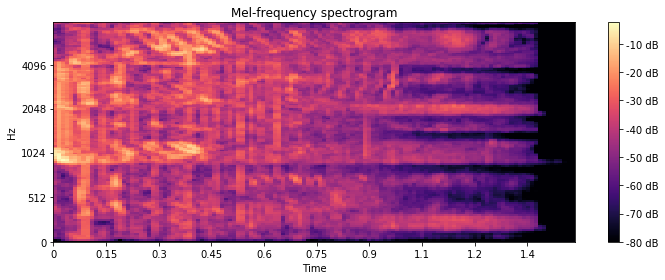

In [34]:
visualize_spectrogram(all_data_tensor[0])

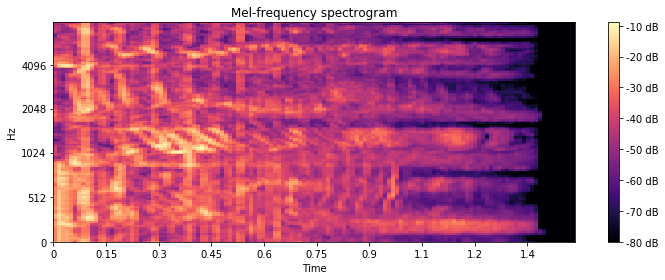

In [35]:
visualize_spectrogram(all_data_tensor[1])

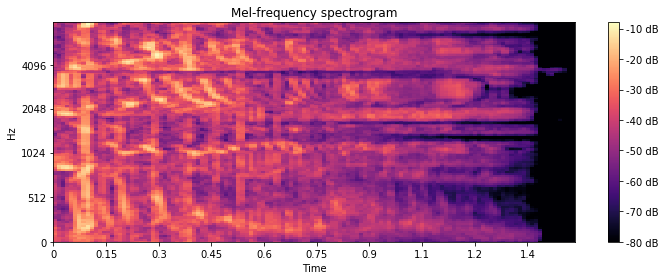

In [36]:
visualize_spectrogram(all_data_tensor[2])

In [37]:
np.save("/tf/workspace/FMA/tensors/all_data_tensor_power_db_SR22K.npy", all_data_tensor)